# Embedding Analysis of Pythia-12B
TODO

- [ ] pca
- [ ] umap
- [ ] linear probe



## Loading the embeddings

thanks JDC

In [ ]:
!pip install umap-learn
!pip install hdbscan

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 7.4 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=d7fb8d7ffdb5c292ca2565222f09f8b361ef052ff331dc57ed7a824e736c5644
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
Successfully built umap-learn
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 11.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached Cython-0.29.37-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.9 MB)
  Created wheel for hdbscan: filename=hdbscan-0.8.33-cp310-cp310-linux_x86_64.whl size=3039292 sha256=e7fd185a02d4c4dfc0f218dd5677d3d378959731b83a99efdcfc3cac1d8fd508
  S

In [1]:
!git lfs install
!git clone https://huggingface.co/jstephencorey/pythia-12b-embeddings.git

Git LFS initialized.
Cloning into 'pythia-12b-embeddings'...
remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 10 (delta 1), reused 0 (delta 0), pack-reused 4
Unpacking objects: 100% (10/10), 3.26 KiB | 238.00 KiB/s, done.


In [2]:
import torch
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cpu


In [3]:
import matplotlib.pyplot as plt
import numpy as np

In [4]:
embedding_filename = "./pythia-12b-embeddings/pythia-12b.pth"
embedding_layer = torch.load(embedding_filename, map_location=torch.device(device))
embedding_weights = embedding_layer.weight.data.cpu().numpy()
print(embedding_weights)

[[ 0.00230217 -0.00296211  0.00490189 ... -0.00183678  0.00023139
  -0.00206184]
 [ 0.01398468 -0.00607681  0.02134705 ... -0.00453568 -0.0137558
  -0.00044656]
 [ 0.00622177 -0.01074982  0.00720215 ...  0.00630188  0.00068235
  -0.02189636]
 ...
 [-0.01255035 -0.00182629 -0.0049057  ... -0.00560379  0.00989532
   0.01010895]
 [ 0.00396347  0.00630188 -0.01152802 ... -0.00132656 -0.01219177
   0.00511551]
 [ 0.00543213 -0.00561523 -0.01293182 ...  0.00473022 -0.00455093
  -0.0066452 ]]


In [5]:
embedding_weights.shape

(50688, 5120)

## PCA

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# i'm not 100% if we *should* be rescaling the embeddings for purposes of analysis
print(f"original embeddings: mean - {np.mean(embedding_weights)}, std - {np.std(embedding_weights)}")
x = StandardScaler().fit_transform(embedding_weights)
print(f"rescaled embeddings: mean - {np.mean(x)}, std - {np.std(x)}")

standard_pca = PCA(n_components=2)
standard_embedding = standard_pca.fit_transform(x)

clusterable_pca = PCA(n_components=1300)
clusterable_embedding = clusterable_pca.fit_transform(x)

standard_var = standard_pca.explained_variance_ratio_.sum() * 100
print(f"total explained variance for standard PCA: {standard_var}")
clusterable_var = clusterable_pca.explained_variance_ratio_.sum() * 100
print(f"total explained variance for clusterable PCA: {clusterable_var}")

original embeddings: mean - -2.156686917942352e-07, std - 0.01809672638773918
rescaled embeddings: mean - -5.54222188975384e-11, std - 1.0000009536743164
total explained variance for standard PCA: 1.3901276513934135
total explained variance for clusterable PCA: 52.968829870224


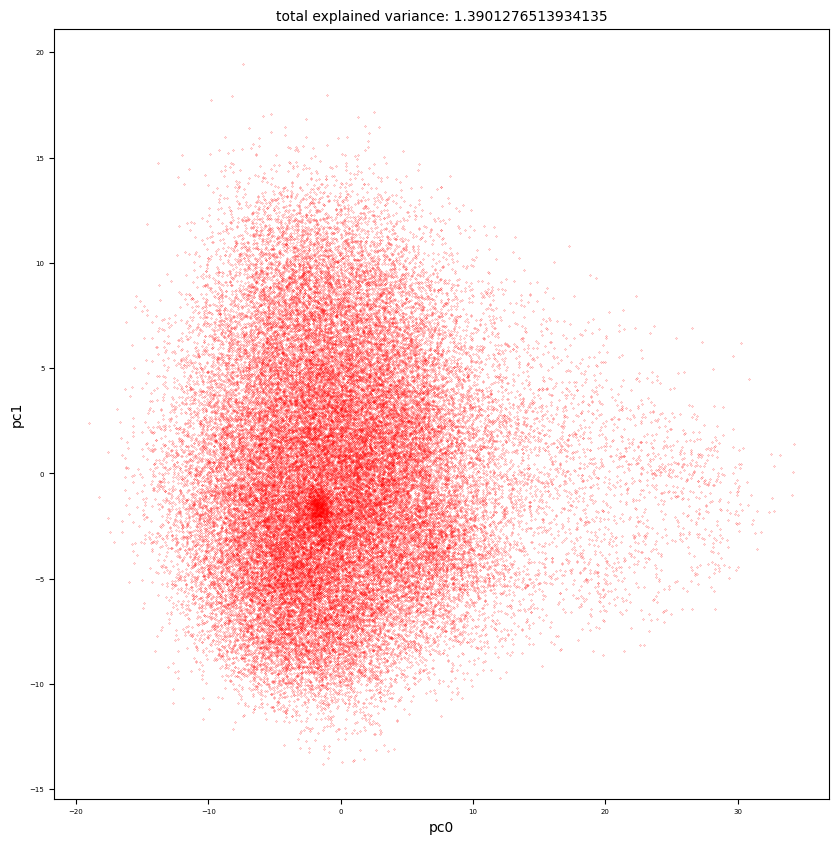

In [ ]:
plt.figure(figsize=(10,10))
plt.xticks(fontsize=5)
plt.yticks(fontsize=5)
plt.xlabel('pc0',fontsize=10)
plt.ylabel('pc1',fontsize=10)
plt.title(f"total explained variance: {standard_var}", fontsize=10)
plt.scatter(standard_embedding[:,0], standard_embedding[:,1], c='r', s=0.03)

ok well, im not really surprised at this result. 5120 dimensions cannot really be distilled into 2 dimensions clearly. let's just try running some clustering algorithms on reasonably higher dimensions.
for the clustering algorithms:
kmeans, spectral clustering, hdbscan

In [ ]:
# kmeans
n_clusters=300
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init='auto', max_iter=5000, random_state=42, tol=1e-8)
clusters = kmeans.fit_predict(clusterable_embedding)

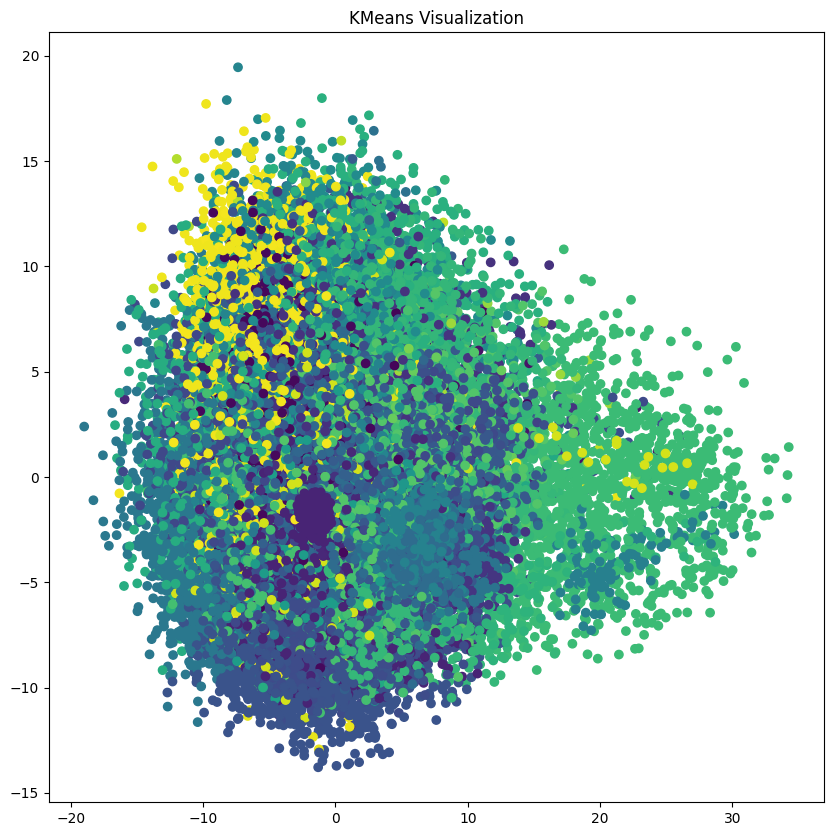

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], c=clusters)
plt.title('KMeans Visualization')
plt.show()

In [ ]:
# spectral clustering - nvm it crashes the colab instance because it takes up too much RAM
"""
from sklearn.cluster import SpectralClustering

clusters = SpectralClustering(n_clusters=50, assign_labels='discretize', random_state=1337).fit_predict(clusterable_embedding)
plt.figure(figsize=(10,10))
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], c=clusters)
plt.title('Spectral Clustering Visualization')
plt.show()
"""

"\nfrom sklearn.cluster import SpectralClustering\n\nclusters = SpectralClustering(n_clusters=50, assign_labels='discretize', random_state=1337).fit_predict(clusterable_embedding)\nplt.figure(figsize=(10,10))\nplt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], c=clusters)\nplt.title('Spectral Clustering Visualization')\nplt.show()\n"

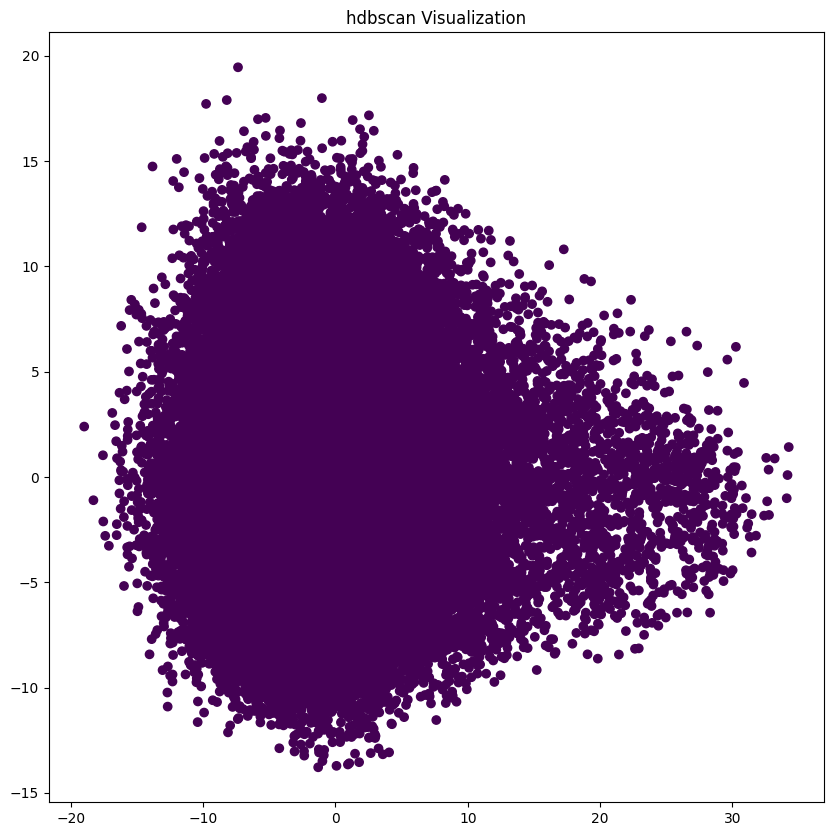

In [ ]:
# hdbscan
# this cell took like 5 hours to run and its a homogenous blob of colour
import hdbscan
labels = hdbscan.HDBSCAN(
    min_samples=20,
    min_cluster_size=20,
).fit_predict(clusterable_embedding)
plt.figure(figsize=(10,10))
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], c=labels)
plt.title('hdbscan Visualization')
plt.show()

## UMAP

thanks for the suggestion SE Gyges \
going to use umap to reduce dims + hdbscan to cluster

In [ ]:
import umap
import hdbscan

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


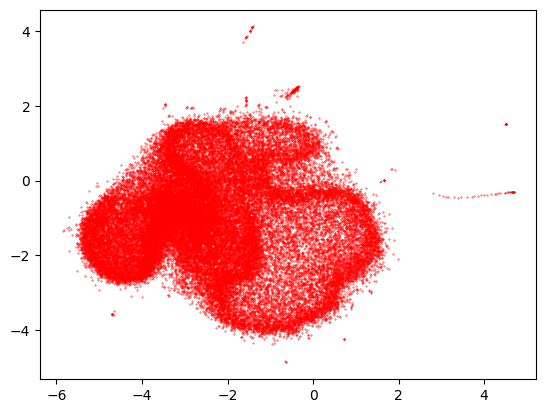

In [ ]:
# project to 2d, but this is only for visualisation
standard_embedding = umap.UMAP(random_state=1337).fit_transform(embedding_weights)
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], c='red', s=0.1);

In [ ]:
# the actual embedding we will use for clustering will be higher dimension
# in this case n_components=100
clusterable_embedding = umap.UMAP(
    n_neighbors=100,
    min_dist=0.0,
    n_components=200,
    random_state=1337,
).fit_transform(embedding_weights)
labels = hdbscan.HDBSCAN(
    min_samples=20,
    min_cluster_size=20,
).fit_predict(clusterable_embedding)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [ ]:
np.unique(labels)

array([-1,  0,  1,  2,  3])

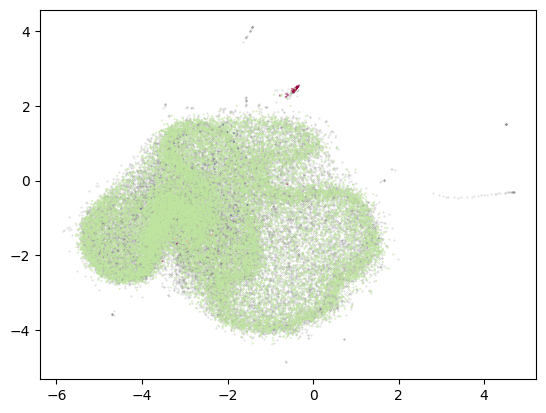

In [ ]:
# now we project the clustered points onto 2d space for us to see
clustered = (labels >= 0)
# plots non-clustered points (classified as noise)
plt.scatter(standard_embedding[~clustered, 0],
            standard_embedding[~clustered, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.4)
# plots clustered points
plt.scatter(standard_embedding[clustered, 0],
            standard_embedding[clustered, 1],
            c=labels[clustered],
            s=0.1,
            cmap='Spectral');

In [ ]:
# check what % of the data we are actually clustering
np.sum(clustered) / embedding_weights.shape[0]

0.4405776515151515

they look nice but i've learnt nothing

### Some slightly different clutering
I ran this sort of analysis before, so I'll put the code in here to add it to our data:

In [ ]:
import umap
from sklearn.cluster import KMeans
from transformers import AutoTokenizer

In [ ]:
tokenizer = AutoTokenizer.from_pretrained('EleutherAI/gpt-neox-20b')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/457k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/90.0 [00:00<?, ?B/s]

Finished K-means clustering


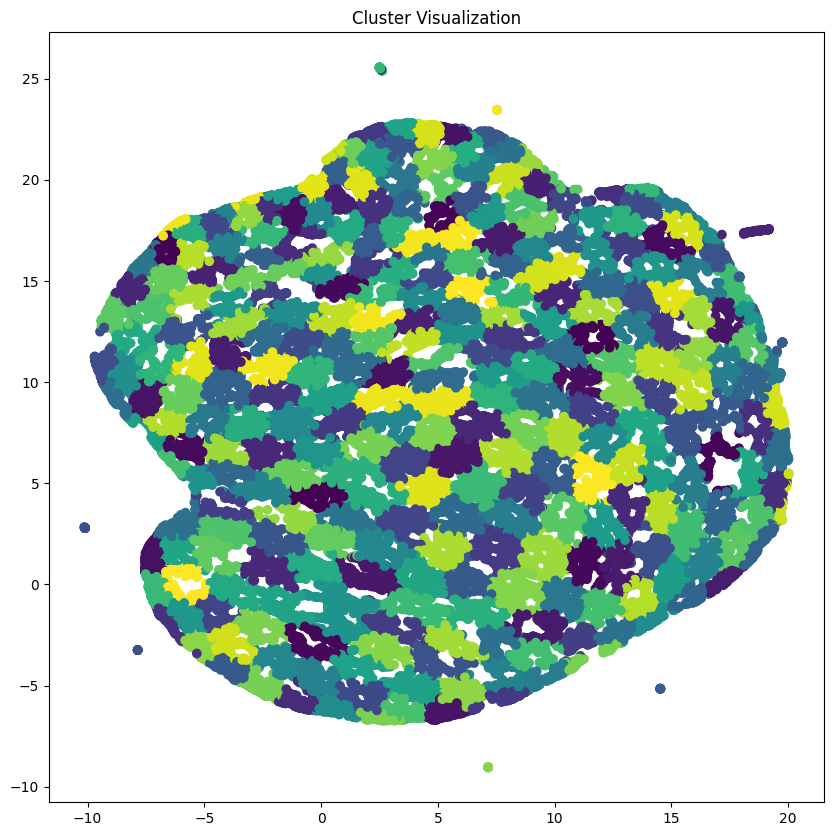

In [ ]:
n_clusters=300
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init='auto', max_iter=5000, random_state=42, tol=1e-8)
clusters = kmeans.fit_predict(standard_embedding)
print("Finished K-means clustering")

# graphing the first two PCA values of the KMeans Clusters
# pca = PCA(n_components=9)
# reduced_data = pca.fit_transform(embeddings)
reducer = umap.UMAP()
# tsne = TSNE(n_components=2)  # Reduce to 2 dimensions for visualization
reduced_data = reducer.fit_transform(standard_embedding)
# reduced_data = tsne.fit_transform(embeddings)

# plt.figsize(20,20)
plt.figure(figsize=(10,10))
plt.scatter(reduced_data[:, 1], reduced_data[:, 0], c=clusters)
plt.title('Cluster Visualization')
plt.show()

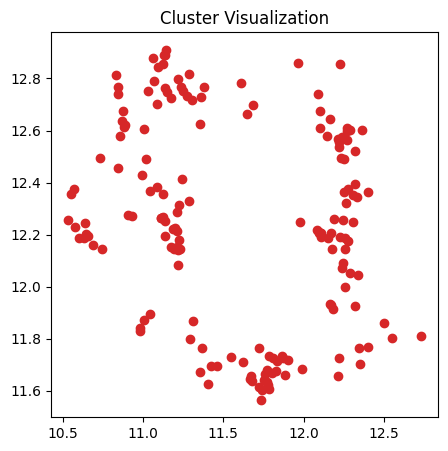

168
8221 " Nav"
9302 " succeed"
9658 " Among"
10956 " Father"
11400 ",{\"
11406 "oned"
12518 " pray"
12795 "agic"
13087 "urations"
13796 " Broad"
13941 ")\,"
14120 " energies"
14169 " Blood"
14633 "GM"
14669 "asting"
14681 ""
14787 " overlap"
14860 "eenth"
14890 " Iowa"
14894 "hma"
14955 " tendency"
15035 "export"
15039 " mos"
15108 " Ident"
15176 "�"
15203 "idae"
15285 " strategic"
15364 "estamp"
15367 "我"
15387 "nor"
15411 " lesion"
15418 "David"
15421 "ourier"
15426 "Sal"
15434 "iliary"
15452 " publish"
15454 " Bridge"
15468 "134"
15477 "relevant"
15486 " agreements"
15489 "========================"
15491 "West"
15498 " perme"
15528 "DEV"
15542 "Stand"
15557 " Level"
15559 "tah"
15580 "DT"
15592 "books"
15608 "profit"
15611 "Great"
15616 " aligned"
15619 "REF"
15637 " Trib"
15649 " ug"
15655 " enrich"
15665 " demanded"
15670 " DA"
15680 "impl"
15689 "Public"
15709 "acious"
15710 "slant"
15711 " considerations"
15729 " hug"
15730 " championship"
15731 " Bud"
15733 " cer"
15762 "opol

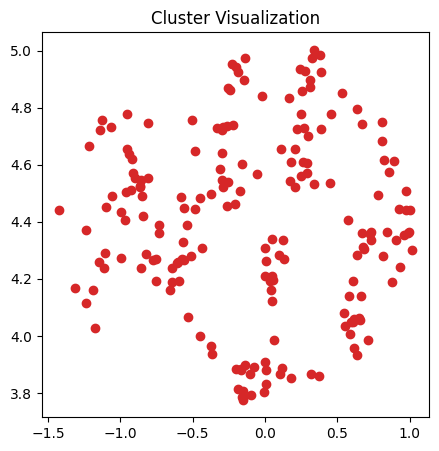

191
67 "b"
103 "�"
124 "�"
170 "�"
194 ""
446 "pl"
803 " pos"
808 "pect"
997 " requ"
1038 "cond"
1084 "](#"
1151 " ser"
1316 "uss"
1455 "ead"
1471 " dem"
1510 " meas"
1603 "}("
1741 "ivid"
1932 "           "
2235 " pri"
2674 "          "
2676 "rr"
2762 " positive"
16986 ")/((-"
18063 " Joh"
18471 " 1920"
19062 "ambig"
20139 " rated"
21481 " overlapping"
22618 " Phillips"
23274 " notified"
23877 "tot"
24187 " dyn"
24299 "�"
24499 " zur"
24669 "ibe"
24950 " sten"
25040 " informal"
25213 " welcomed"
25320 "655"
25349 "))/((-"
25531 "haus"
25746 "oil"
25970 " tales"
26037 " conceal"
26069 "────"
26073 " Debug"
26100 " Eb"
26114 " medicines"
26120 " admissions"
26152 " Girls"
26177 " Chan"
26316 "destroy"
26334 " Hindu"
26687 "folder"
26926 " él"
27206 "uncture"
27253 " JOIN"
27557 " Champions"
27825 "}}-"
28235 "really"
28252 " ż"
28302 "turned"
28341 " BAL"
28496 " Ut"
28697 "isto"
28798 " Julian"
28817 " ह"
28900 " cliff"
28901 " cohes"
28972 " steroid"
29218 " Airlines"
29272 " hath"
2

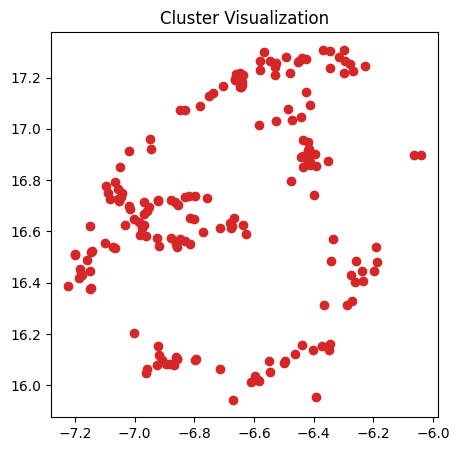

181
24431 "Mouse"
24716 "trim"
24891 " coronavirus"
25107 ".")"
25446 "ographs"
25542 " strom"
25571 " Riemann"
25608 " evapor"
25624 " Nad"
25631 " Tig"
25660 " detective"
25666 " LIMITED"
25675 "lical"
25701 " decorated"
25728 " Always"
25741 " endors"
25759 " turnover"
25760 " dive"
25788 "IDENT"
25819 "picker"
25825 " lapar"
25852 " Lamb"
25863 " smoothly"
25868 " Complaint"
25890 "ôt"
25900 " IMPLIED"
25911 " 288"
25914 "much"
25922 "atorial"
25929 "1968"
25935 "Weight"
25966 "route"
25976 "..\..\"
25983 " entirety"
25990 " Edinburgh"
25993 " multiplex"
25995 " remarked"
26003 "コ"
26006 " Available"
26007 " unb"
26012 " apologize"
26014 " trademark"
26018 " expedition"
26022 "beans"
26028 "Fixed"
26039 "threat"
26040 " Firefox"
26047 "cex"
26050 " burgl"
26059 "attributes"
26063 "oden"
26078 "Focus"
26084 "LEASE"
26086 " naming"
26087 " gon"
26096 " Kor"
26097 "ίν"
26098 " traced"
26099 " marking"
26101 " newest"
26107 " "${"
26109 "tensor"
26112 " intensities"
26116 "Sa"
26118 " 

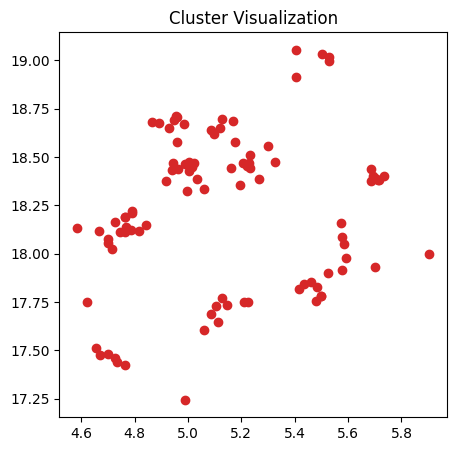

95
9665 "dx"
11109 "conomic"
11169 " employer"
12090 " Several"
12897 "Expand"
14403 "192"
14885 "reasonable"
15259 " callback"
15674 " neurolog"
15714 "Auth"
15771 " relies"
16257 " Meanwhile"
16763 "205"
16782 " chairman"
16913 " --------------"
17667 "Close"
17962 "166"
17989 "economic"
18008 "ryption"
18077 " Lin"
18407 " Nos"
18431 "Several"
18592 " ---------------"
18665 " Cut"
18747 " dx"
18760 "Cent"
18839 " enriched"
18862 " compartment"
18922 " maintains"
18938 "Kit"
19173 " Eli"
19180 "ugh"
19190 " Economic"
19233 "512"
19247 "STATE"
19257 "hesia"
19299 "shire"
19323 " interfere"
19365 " folk"
19430 "rien"
19479 " "-"
19495 " disable"
19544 " Cohen"
19550 " cookie"
19594 " Evidence"
19619 " Okay"
19711 "Age"
19719 "kee"
19744 " automobile"
19784 " PO"
19796 " mysterious"
19825 "rors"
19828 "00000000000000000000000000000000"
19881 "arin"
19885 " Ferm"
19888 " ž"
19946 "former"
19966 "odox"
19971 " hockey"
19987 " Pitts"
20006 ""
20033 " tradem"
20071 " pension"
20095 "…]"
20

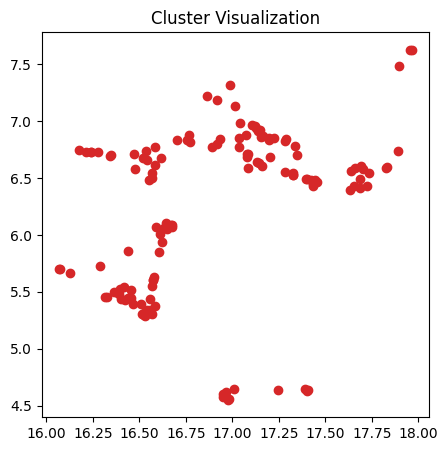

142
7793 " hole"
8024 " Er"
9515 "gence"
9847 " Tre"
9860 " grid"
9870 " Look"
10088 "regulated"
10110 " bomb"
10158 " Attorney"
10219 " suscept"
10250 " wal"
10266 " opposition"
10276 " compliance"
10277 " stimulation"
10280 " repeat"
10287 "Str"
10290 " moderate"
10320 "wan"
10326 "#:"
10334 " tab"
10353 " accompan"
10380 " somehow"
10389 "rig"
10391 "eld"
10405 " summar"
10423 "limits"
10425 "rosc"
10443 "reland"
10446 "こ"
10454 " complexity"
10501 " authentic"
10579 "UC"
10620 " dealing"
10644 "Buffer"
10652 " aged"
10707 " doct"
10792 " marg"
10796 " multip"
10809 " $\{"
10883 " partition"
10960 " stuck"
11047 "cule"
11390 " vectors"
11850 " maintaining"
11927 "DD"
12922 " seeds"
12972 " Night"
13802 "ounding"
13828 " preparing"
33606 "ceral"
35539 "NdEx"
35764 "!("
35826 " Hubbard"
35885 "rift"
35918 ".}"
35983 " swo"
36137 " uniforms"
36215 " Foods"
36333 " tiempo"
36362 " Eugene"
36385 " palp"
36424 " futures"
36432 " Crick"
36442 "Numer"
36460 "udi"
36461 "estead"
36493 " pump

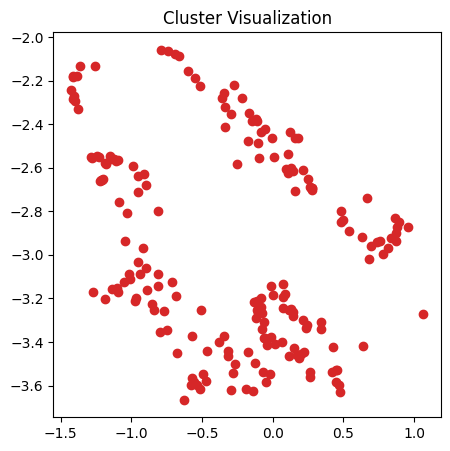

194
1857 "45"
2826 " occur"
3646 " policy"
3665 " frame"
4247 " January"
4289 " hundred"
4380 "ights"
4444 " plant"
4657 " store"
4659 "static"
4719 " concentration"
4794 " According"
4903 " variables"
4989 "df"
5051 "urity"
5097 "oken"
5124 " phosph"
5150 " equation"
5157 "stitute"
5167 " susp"
5201 " Dis"
5217 " equival"
5237 " harm"
5290 "\],"
5347 " capital"
5383 " Inter"
5411 "ifying"
5414 "PD"
5428 "TE"
5434 " danger"
5449 "flow"
5487 " victim"
5494 "�"
5507 "æ"
5511 " communication"
5518 "FT"
5573 " occup"
5587 " Spec"
5597 " dismiss"
5600 " transl"
5604 " certainly"
5635 " Ev"
5651 "rian"
5680 " border"
5684 " defense"
5698 " vent"
5726 "pers"
5760 " controls"
5764 "Lambda"
5768 " summer"
5772 " kid"
5775 "othing"
5809 " vac"
5810 " characters"
5811 "ows"
5819 " Circ"
5820 " workers"
5827 " plans"
5832 "る"
5849 "asure"
5869 " surgery"
5877 " holding"
5888 " encour"
5890 " warm"
5924 "itled"
5938 " husband"
5953 "inity"
5963 " judge"
6007 " bill"
6023 " Supp"
6025 "alysis"
6085 

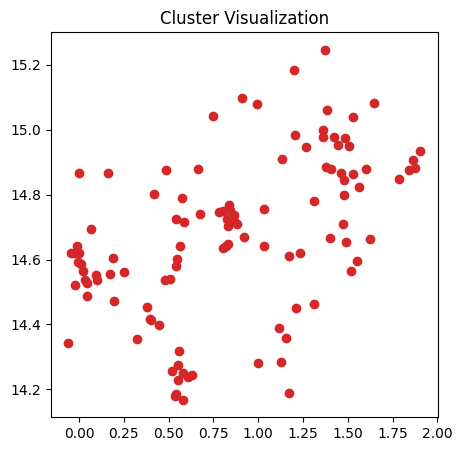

109
2444 " working"
10689 ")))"
12027 " dispute"
13165 " bankruptcy"
15406 " chromosome"
15722 " pipeline"
18087 " arbitration"
18940 " Au"
19143 " surprisingly"
20091 " DW"
20924 "],\"
21116 " sixty"
21252 " ONE"
21564 " eryth"
21664 " Maur"
21691 "Details"
21835 "eclipse"
21877 "established"
21919 " Working"
21958 "King"
22092 "\}\"
22117 "October"
22158 "-->"
22166 "Special"
22329 "前"
22399 "osal"
22412 "deep"
22499 " Fermi"
22510 " seq"
22522 " chuck"
22605 " PV"
22619 "voice"
22638 " shrugged"
22655 "プ"
22659 "picture"
22716 " 1956"
22770 " refres"
22780 " researcher"
22906 " refresh"
22941 "ollar"
22948 " Ern"
22982 "Bbb"
22983 "�"
22986 "RF"
23028 " diminished"
23096 "avi"
23146 "cgi"
23154 " rays"
23256 " pg"
23335 "BASE"
23381 " resent"
23415 " investing"
23468 "ель"
23616 "rica"
23624 "dens"
23640 "gom"
23798 "bond"
23910 " Products"
23918 "Hon"
23989 " bodily"
24104 " grouped"
24109 " peri"
24129 " Hampshire"
24393 "Begin"
24580 "MG"
24668 "aturated"
24997 "ipeline"
25081 " 

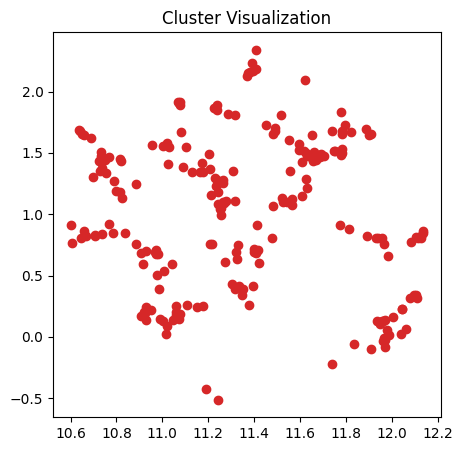

217
3500 " hyp"
6186 " supply"
7454 " Office"
8107 " reverse"
8472 " len"
9117 "otypes"
9501 "mathsf"
9733 " Korea"
10024 "anche"
10639 "Write"
11240 " Award"
12179 "Xiv"
12436 "rett"
12691 " embedded"
13313 " defeat"
13380 "\_["
14432 "9999"
14435 " touched"
14490 "=>"
14522 " Interestingly"
14531 "ialize"
14541 "found"
14559 " Spirit"
14587 "AAAAAAAA"
14653 "filled"
15282 " intact"
15562 " Liber"
17067 "                                              "
18411 "                                                 "
18774 "
                             "
19617 "                                                  "
20059 " analytic"
20981 " graduated"
23324 " sanct"
25835 "
                                                                                                                                "
26997 "\^["
32161 " Rele"
32845 ")}="
33515 " Perl"
34031 " Racing"
35313 "Ever"
35970 " Soccer"
36098 " cres"
36533 " Rex"
36546 " Seoul"
37028 "umpy"
37322 ">)."
37695 " owning"
37766 " hydrocar"

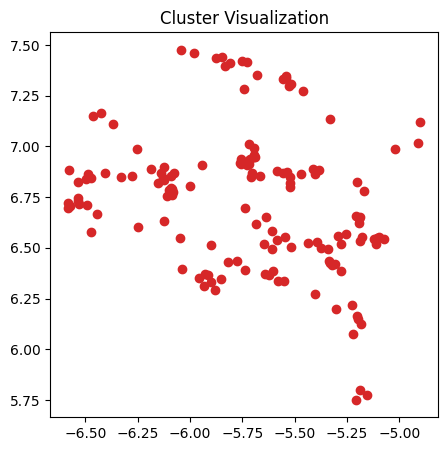

146
3080 "}}\"
6092 "}}}"
7398 ")}\"
8395 "})\"
10187 "}}}}"
12191 "}}}\"
17125 ")}}"
23108 "George"
24045 " hypothesized"
24783 " handy"
25355 " misrepresent"
25411 " Hyper"
25682 " raid"
25979 " deprived"
26054 "isecond"
26135 " Cort"
26478 " 1914"
26532 "�"
26665 " porous"
26908 " tomb"
27039 " conditioned"
27043 "998"
27058 "nol"
27087 "454"
27108 " earthquake"
27123 "та"
27207 "dash"
27251 " carved"
27393 " inconsist"
27612 "}}})"
27663 "thick"
27778 "mund"
27793 "enden"
27835 " gad"
27890 "Sar"
27914 "arthy"
27924 " sells"
27925 " bins"
27927 "}})\"
27947 " proofs"
27977 " QCD"
27999 " homot"
28027 " vigil"
28033 "*\"
28099 " minist"
28126 " trillion"
28146 " grammar"
28159 " redd"
28176 " pumping"
28228 " uploaded"
28255 " Serial"
28261 "omial"
28276 "changing"
28280 " Morm"
28294 " monol"
28315 "997"
28322 " Ori"
28373 " Bald"
28459 "341"
28464 " sepsis"
28474 "orig"
28520 ".="
28524 " relapse"
28526 "lvert"
28574 " vä"
28597 "AAAAAAAAAAAAAAAA"
28628 " diesel"
28682 "oya"
28683

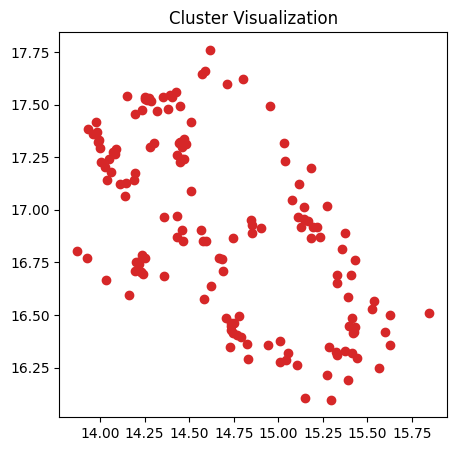

149
8057 " Long"
9161 " 96"
9354 " 1994"
9548 " enzyme"
9725 " 1993"
10338 " Make"
10517 " satisfy"
10902 " yeah"
10980 " Fund"
11204 " Conf"
11214 " pharmac"
11237 " modification"
11382 " Chem"
11478 "Bo"
11485 " constantly"
11491 " Kingdom"
11599 "appy"
11619 " paras"
11642 " EL"
11676 "ishop"
11687 " powder"
11739 " Yeah"
11801 "eff"
11894 "�"
11931 " acquisition"
11939 "bow"
11980 " Cook"
12009 " reject"
12047 " Custom"
12055 "––"
12071 "five"
12074 " horses"
12095 " destination"
12096 " Georgia"
12127 " centers"
12134 " foods"
12160 " UV"
12195 " shadow"
12200 " beside"
12203 " searching"
12212 " prevention"
12213 "fusion"
12265 " council"
12310 " satisfies"
12314 " generic"
12325 " asks"
12328 "ynamic"
12342 " concepts"
12344 " carb"
12408 "hl"
12428 "location"
12440 " professionals"
12443 "apor"
12482 " accessible"
12517 "craft"
12527 " appeals"
12546 " enorm"
12561 " breakfast"
12581 "ulative"
12588 "tree"
12625 "comfort"
12652 " 109"
12664 " Week"
12677 "GH"
12712 " contracts"

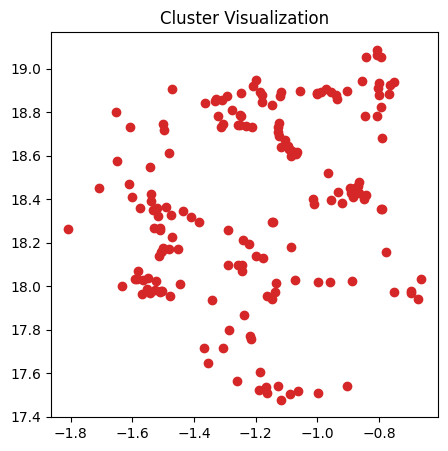

173
10741 " bacterial"
20333 "172"
21902 " Getty"
22401 "fm"
22565 " Sheriff"
22880 " του"
23316 " Carlos"
23320 "setup"
23328 " narc"
23376 " "*"
23388 "abad"
23393 "ercise"
23456 "aset"
23465 " ladder"
23488 " Letter"
23540 " 235"
23586 " neuron"
23588 " Male"
23615 "/+"
23639 " handsome"
23644 "Cir"
23648 "Comparison"
23652 " priorit"
23655 "gmail"
23657 " epoch"
23659 ",."
23675 " adapter"
23677 "lies"
23680 "erals"
23688 "339"
23690 " rearr"
23693 "techn"
23698 " Harrison"
23707 " DL"
23712 "achi"
23714 "uniform"
23715 ".");"
23724 " Woman"
23726 " nomination"
23728 " Archives"
23732 " vain"
23736 " Comparison"
23742 " biomass"
23749 " civilization"
23750 "ongs"
23753 " leakage"
23759 "→"
23763 "sal"
23766 " με"
23768 " assignments"
23770 "comit"
23772 "Scroll"
23785 " triggers"
23786 "lessness"
23792 " ket"
23793 "avin"
23794 ""
23800 " voter"
23802 "GI"
23807 "Variable"
23809 " reforms"
23812 " outlets"
23819 "inny"
23822 " republic"
23825 "�"
23826 "ち"
23831 "uffle"
23836 "Plu

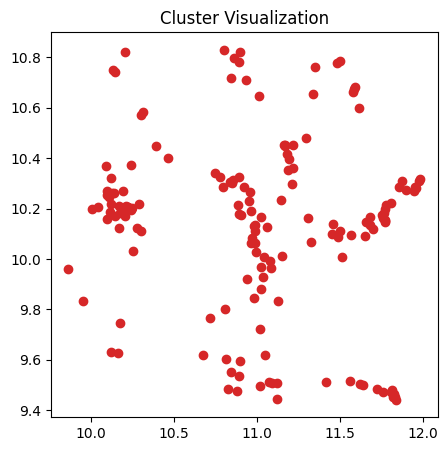

160
1014 " even"
1979 " size"
4104 " 2015"
4952 " Even"
5921 " correlation"
6087 "\|"
6730 " examined"
6975 " Like"
8231 " dropped"
8937 " Old"
9586 "Even"
9777 " magnitude"
9817 "Like"
10299 " flash"
11953 " FL"
12640 " consecutive"
12670 "aden"
13007 " correlations"
13429 "amer"
13586 " tar"
13630 " discount"
13790 " campus"
13963 "י�"
13986 " Dutch"
14097 " spray"
14315 " warned"
14329 "scope"
14661 "ummy"
14765 " Leon"
14874 " bills"
14887 "ств"
14891 "oprotein"
14936 " disagree"
15012 "BY"
15158 "ensively"
15178 " nest"
15228 "Mich"
15324 " secre"
15352 "record"
15391 " Kansas"
15405 " Less"
15409 "abases"
15433 " figured"
15458 " Sarah"
15575 "YP"
15579 " entropy"
15609 "aping"
15620 " controversial"
15625 "ます"
15701 "zt"
15713 " Hind"
15727 " yeast"
15867 "esy"
15878 " Las"
16018 " departure"
16025 " DB"
16146 " Miami"
16235 " Tool"
16289 " ethical"
16615 "INFO"
16676 " Load"
16791 " gaming"
32285 " radii"
33488 "geois"
34203 " whip"
34477 "XXX"
34691 "1600"
34722 " Trent"
34790

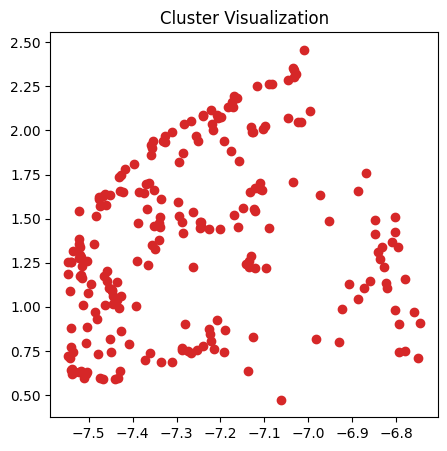

229
1705 " come"
1818 " change"
1845 "Pro"
1888 " vers"
1913 "action"
1923 "ault"
2047 "ograph"
2061 "org"
2077 " States"
2090 "69"
2092 "iment"
2103 "alf"
2128 " jud"
2133 " body"
2157 " infl"
2201 " major"
2210 " came"
2211 "oper"
2233 " 100"
2239 " >"
2240 " ben"
2243 " mom"
2244 "urs"
2252 "most"
2254 "vent"
2267 "II"
2320 "af"
2321 "aug"
2328 " dom"
2331 "ogn"
2338 "uit"
2359 " phot"
2364 "key"
2382 "ribution"
2399 "bo"
2405 "31"
2439 " across"
2445 "clude"
2446 "AA"
2447 "Un"
2449 "ION"
2454 " face"
2459 " ann"
2461 "beta"
2469 " past"
2475 " comput"
2480 "mber"
2487 "ones"
2497 "^{-"
2500 " tw"
2509 " doing"
2511 "89"
2514 "medi"
2520 "this"
2521 "eters"
2522 "head"
2525 " meet"
2528 " establ"
2531 "istic"
2533 " separ"
2542 "imate"
2544 " changes"
2549 " frequ"
2551 "span"
2553 " surface"
2557 " measure"
2561 " research"
2564 " mind"
2565 " cou"
2566 "test"
2567 " company"
2574 "eq"
2576 "icy"
2577 "my"
2578 " tre"
2582 "\_"
2591 "illed"
2595 "ground"
2598 "So"
2608 " user"
261

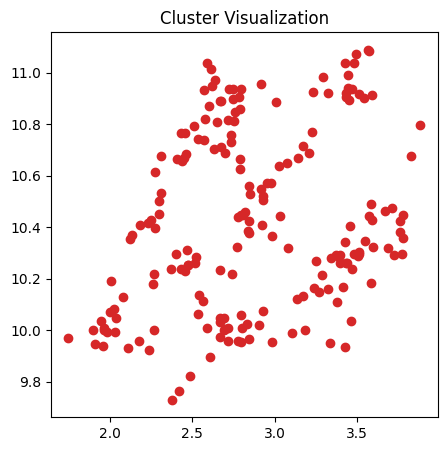

191
2720 " prior"
6359 " Western"
6489 " identity"
7356 " stick"
8059 " conference"
8876 " median"
8910 " menu"
15327 " suck"
16243 " debtor"
16348 " sophistic"
17974 " felony"
19658 "CHAPTER"
20123 " rehabilitation"
20505 " ds"
20886 " ({\"
21069 "gender"
21113 " appellee"
22686 "                                                     "
22706 " Appellee"
22736 " Debtor"
24344 " 1949"
24565 " delegate"
24571 " optimum"
24680 " upregulated"
24929 "steine"
25116 "Facebook"
25334 " rectangle"
25674 "continue"
26538 " inmates"
27733 "Western"
27771 " carn"
28107 "Appellee"
28236 " manifolds"
28736 "을"
28845 " commissioner"
29138 " threaten"
29273 " screamed"
29541 "median"
30337 ":`"
30477 " upregulation"
30493 "athione"
30527 " kDa"
30865 " CAL"
31372 " illnesses"
31782 "äº"
32334 "ubottu"
32473 "Food"
32673 "}}^{("
32677 " rins"
32911 " Driver"
32963 "Published"
32995 " mint"
33076 " pollut"
33146 " debugging"
33178 " lone"
33234 " dp"
33243 " unle"
33245 " Cele"
33261 " APIs"
33270 " RGB"


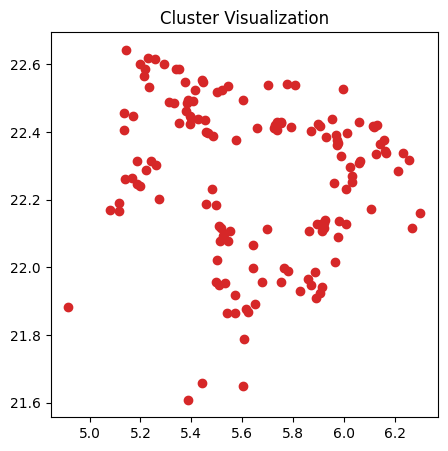

145
18190 " Something"
18335 " dissip"
18519 " locus"
18891 "score"
19028 " Yang"
19113 " за"
19324 " cultiv"
19375 " complained"
19427 " adjusting"
19486 " overt"
19522 "ipal"
19575 " utilization"
19591 "April"
19621 " ال�"
19629 " Marshall"
19661 " twin"
19679 " lightly"
19694 " Veter"
19717 " Christopher"
19728 " Currently"
19730 " HAVE"
19736 " printer"
19748 " werden"
19793 "orms"
19797 " achievement"
19805 "MY"
19807 "668"
19822 "atted"
19824 "Network"
19836 " notably"
19839 "umbered"
19847 " fait"
19856 " pré"
19869 " Berg"
19871 "ANK"
19876 " epic"
19887 " castle"
19910 "pkg"
19911 " overexpression"
19924 "asa"
19928 " tune"
19950 " Delhi"
19964 "ª"
19968 "Bro"
19969 " observer"
19978 " batteries"
19980 " Mitchell"
19981 "rative"
19982 "stick"
19985 "ег"
20002 " Release"
20010 "eve"
20018 " pant"
20024 " loci"
20026 "upon"
20038 "abolic"
20039 "esc"
20041 " scratch"
20044 "ucked"
20045 " sorted"
20046 " acres"
20056 " pero"
20058 " Together"
20064 ",*"
20065 " Dub"
20069 " Hend

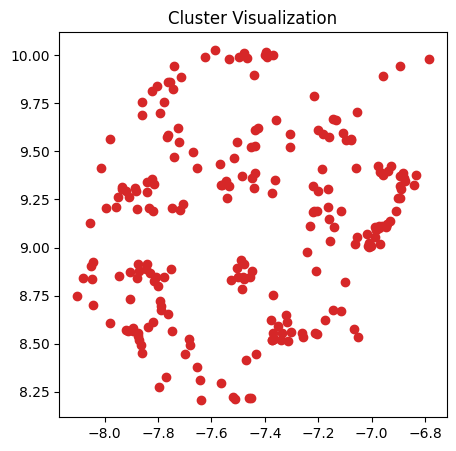

222
26468 "agulation"
26688 " DN"
26793 " salts"
26913 " conduction"
27054 "backslash"
27302 "Jud"
27586 " docs"
27761 " Standards"
27794 " Victorian"
27796 " toxin"
27808 " Pour"
27891 " Counter"
27986 "lichen"
27988 ">";"
27998 " unified"
28006 " idiot"
28070 " cites"
28074 "osti"
28082 "hens"
28102 "olded"
28211 "Mont"
28220 "██"
28309 " muy"
28311 " tweets"
28348 "CAC"
28374 "xor"
28378 " energetic"
28392 " porch"
28407 " noun"
28411 " reiter"
28412 "Stay"
28423 " revelation"
28443 " Chand"
28475 "indust"
28483 " inverted"
28490 " decoding"
28493 " Veh"
28498 " modulate"
28504 " Stay"
28508 " wrestling"
28530 " NHS"
28535 " comprehen"
28567 " implanted"
28570 "Forms"
28571 ""];"
28589 " Lynch"
28598 " Generation"
28608 " Cer"
28612 " Syl"
28616 " nun"
28626 "glob"
28631 " schedules"
28647 "MAC"
28653 "\];"
28660 "official"
28668 " evidently"
28678 " Climate"
28703 "756"
28705 "yme"
28710 " Dale"
28714 " miserable"
28727 " staging"
28746 " Lebanon"
28757 "479"
28758 "qualified"
2877

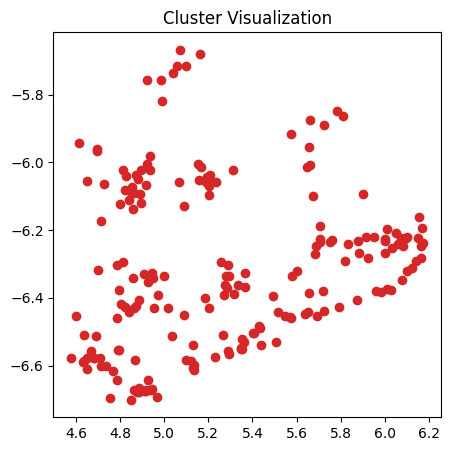

202
3246 "PE"
4480 " Trans"
5506 " responsible"
6388 " involve"
6798 " Judge"
7199 "2010"
7216 " Monday"
7245 " WH"
7302 " owner"
7472 " evaluate"
7489 " Open"
7630 " domin"
7724 " Serv"
7749 "110"
7756 " improvement"
7773 " village"
7792 " framework"
7803 "§"
7837 "acent"
7845 "Please"
7854 " Ir"
7862 " conj"
7869 "ол"
7875 " marriage"
7948 " Tuesday"
7955 "dep"
7962 " Str"
7975 " fold"
8036 "bling"
8051 "ampionship"
8080 " hero"
8118 " African"
8134 " т"
8140 "iously"
8165 "ollowing"
8168 " []"
8179 "ftware"
8180 " consideration"
8192 " Log"
8216 " Thursday"
8263 "uled"
8273 " Society"
8277 " м"
8291 ",_"
8294 " responsibility"
8312 " dangerous"
8315 " defic"
8319 " 51"
8321 " disappe"
8323 " windows"
8325 " beam"
8330 " Wednesday"
8339 " Information"
8340 "buf"
8354 "DNA"
8355 "но"
8361 " β"
8363 " och"
8366 " overl"
8372 "LO"
8374 " lic"
8377 " Fre"
8381 ""
8384 "next"
8387 " Bet"
8407 "afe"
8413 " ske"
8435 "rl"
8436 " preced"
8440 "ona"
8444 " Charles"
8450 " experiences"
8452 "

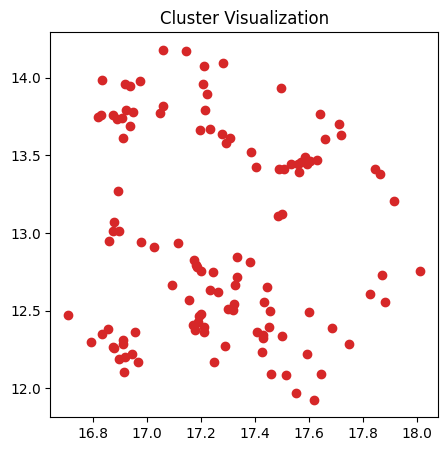

118
2464 ".'"
7268 " intervention"
7368 " cluster"
7629 " variation"
7658 " constraint"
8174 " Jo"
8758 " Non"
9580 " gather"
9674 " subsequently"
9705 "bul"
9862 "ammation"
9959 " clusters"
10324 "ав"
10331 " tea"
10468 "opp"
10487 "600"
10507 " hide"
10567 " retail"
10572 "About"
10575 " variations"
10578 " announce"
10696 " inflammation"
10704 " numerical"
10717 " programming"
10739 " shit"
10748 " naturally"
10806 " constraints"
10811 "cludes"
10852 " Fred"
10865 " drivers"
10867 " Gar"
10869 " Brazil"
10897 "�"
10904 " adjusted"
10906 "        "
10910 "bell"
10918 " discipl"
10948 "ATH"
10955 " bench"
10995 " creative"
10998 "ioned"
11017 " scan"
11024 " Fox"
11030 "Param"
11037 " lob"
11049 " <="
11057 " Number"
11059 " valve"
11092 "orses"
11116 " Andrew"
11117 " diverse"
11152 " chicken"
11161 " 1989"
11163 " voters"
11198 " Ent"
11199 "¼"
11202 "```"
11224 "stic"
11246 "130"
11256 "он"
11290 " Ken"
11314 " Michigan"
11315 " statutory"
11323 " adds"
11331 " educational"
11337 "

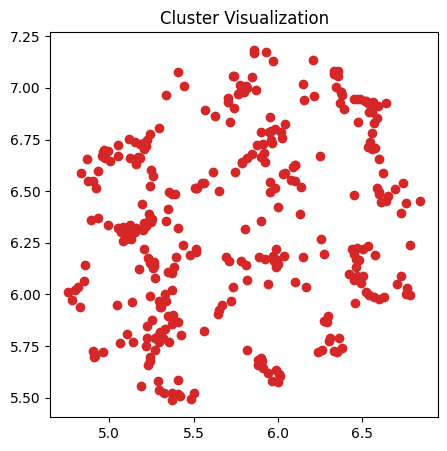

328
2620 " five"
3380 "              "
8173 "
           "
8633 "}\,"
17723 "
    "
18298 " forgot"
23419 " Railway"
26216 "Aff"
26313 "0012"
33846 " disciples"
34906 "485"
34969 "Hig"
36201 " Á"
36437 " commute"
36704 " photographed"
37011 ")—"
37899 " longevity"
38063 "ะ"
38322 " ops"
38392 " OUR"
38679 "   
"
38748 "Navigation"
39254 "++++++++"
39591 " aberrant"
40105 "Hyper"
41681 "unningham"
42216 " Gob"
42278 "Disk"
42301 " subordinate"
42327 "ovsk"
42522 "文件"
42536 "vehicle"
42658 "emitting"
42680 " Comiss"
42708 " casually"
42719 " downside"
42908 " 🙂"
43164 " fprintf"
43188 " Estado"
43207 "agna"
43241 " loneliness"
43245 " computationally"
43301 "615"
43356 "Vers"
43363 "ccoli"
43533 " Utility"
43534 " heartbeat"
43627 " Violence"
43630 " parallels"
43666 " Κ"
43708 "Mirror"
43870 " neuropsych"
43875 " Morph"
43898 " Dion"
43952 " 452"
44008 "ecl"
44093 "rä"
44095 "hosts"
44112 "coe"
44116 " Cheng"
44179 "esque"
44187 "pel"
44190 " deriving"
44209 "iens"
44212 "visibility"
44

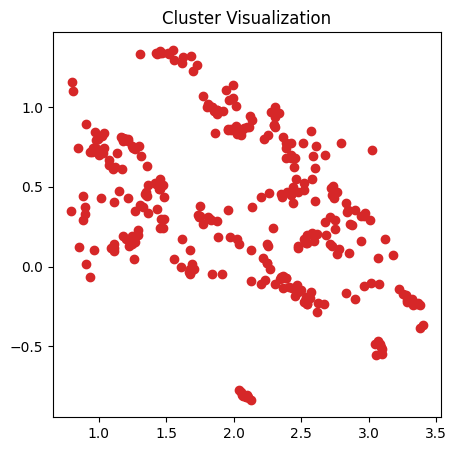

315
22 "5"
46 "M"
53 "T"
77 "l"
89 "x"
115 "�"
118 "�"
171 "�"
173 "�"
176 "�"
180 ""
200 ""
203 ""
209 " "
213 "�"
219 "�"
243 "�"
244 "�"
248 "he"
250 "re"
260 " c"
271 " an"
278 " m"
280 "ic"
287 "ro"
290 "ent"
293 "el"
298 " l"
299 " e"
303 "im"
305 " g"
306 "ve"
308 " T"
312 "am"
316 "us"
317 "ac"
322 " S"
334 "ith"
336 "ce"
338 "if"
339 "se"
341 "   "
348 "ch"
353 " M"
355 " al"
366 "ate"
375 "os"
376 "ra"
392 "ld"
393 " \"
394 "th"
401 " F"
405 "ess"
406 "oc"
408 "ill"
410 "ore"
411 " W"
412 "op"
414 "ity"
415 "oun"
425 " ne"
430 "ort"
431 "pt"
437 "ell"
439 " sh"
440 " un"
455 "all"
457 "’"
459 "ure"
460 "ine"
464 "{\"
465 " k"
470 " 0"
471 "ack"
476 " can"
478 "iz"
480 " j"
482 "ame"
484 "up"
485 "ome"
486 "age"
488 " whe"
489 "ue"
490 " ab"
492 " tr"
494 "able"
500 " J"
503 "ult"
504 "ide"
505 "ast"
507 "ans"
511 "ase"
513 " do"
520 "01"
526 "orm"
527 "ind"
529 "oug"
532 "ip"
534 " which"
536 "ok"
537 ".."
546 " en"
547 "ice"
548 " wor"
549 " ar"
553 "ime"
555 "ty"
557 " d

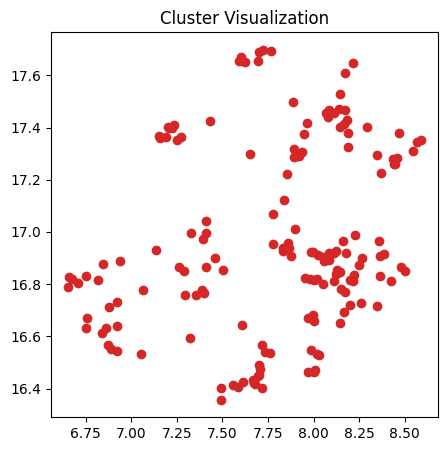

165
1347 " perform"
9823 " Mi"
14773 " donor"
14796 " -----------"
14828 " 1976"
15997 " Very"
16071 "anchester"
16213 " ----------"
16279 "klahoma"
16574 " Could"
16689 " densities"
16810 " ---------"
16906 " afterwards"
16941 " insertion"
16978 "Writer"
17021 "リ"
17034 "bye"
17061 " Trade"
17081 " horn"
17107 "229"
17142 " triggered"
17149 "quant"
17186 "ση"
17229 "Rect"
17247 " Lic"
17275 " €"
17316 "umni"
17324 " reportedly"
17344 "****************************************************************"
17347 " revel"
17354 "required"
17365 " errone"
17370 " SV"
17376 " devast"
17379 "ushes"
17385 " conjunction"
17386 " hosted"
17395 "arette"
17405 "ollary"
17407 "pler"
17412 " assembled"
17413 " Tokyo"
17421 " amid"
17427 " Manchester"
17429 " stationary"
17431 "igenous"
17433 " unders"
17434 "ça"
17439 "construct"
17440 "driver"
17448 "Li"
17452 " ultra"
17460 "prove"
17461 "ambling"
17462 " expend"
17467 " Anne"
17468 " Fried"
17476 "ême"
17478 " comic"
17485 " scattered"
17487 " bell"

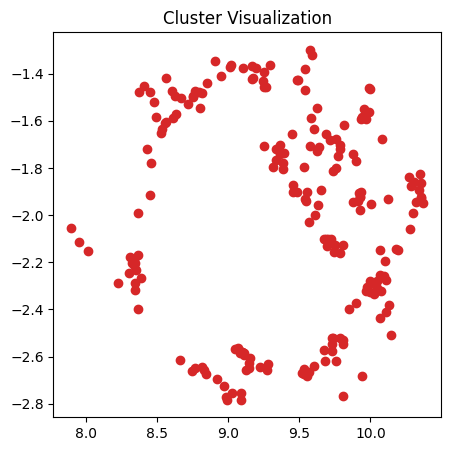

207
3840 " Further"
4408 " tissue"
5215 " 2007"
5745 " sav"
5759 " Congress"
6043 " Plaintiff"
8791 " anyway"
8814 "}^{("
9152 "android"
9156 " theoret"
9169 " 2020"
9360 " disorders"
9388 "lar"
9397 "cribed"
9406 " aggreg"
9432 "har"
9461 " rose"
9532 " acids"
9630 " reliable"
9854 "~,"
9944 ".;"
10614 "enny"
10742 "reement"
10886 " dict"
11058 " absorption"
11710 "ERV"
12089 " advertising"
12181 "HECK"
12216 "utter"
12315 " mood"
12335 "用"
12360 " armed"
12476 " FI"
12787 "pred"
12818 " Hug"
12987 "jar"
13152 "BV"
13270 "MOESM"
13365 " dozen"
13410 " eligible"
13423 " voting"
13518 "meta"
13534 " Bible"
13590 " heading"
13606 "oven"
13760 " logical"
13848 "floor"
14033 "ancial"
14045 " propri"
14098 " bedroom"
14110 " discloses"
14158 " deput"
14179 " Watch"
14313 "™"
14337 "role"
14338 " curious"
14412 " ['"
14446 " Scale"
14676 "habil"
14678 "ften"
14750 "kk"
14883 " elabor"
14938 " regret"
15009 " spir"
15058 " Doctor"
15063 " melan"
15473 " IgG"
15785 " merit"
16286 " Morgan"
163

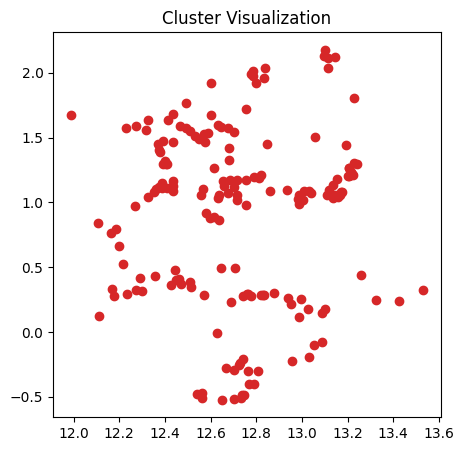

177
4059 " 2014"
6759 "2014"
7047 "Fil"
7140 " category"
8166 " laser"
8820 " spatial"
8998 "BE"
9433 " applying"
9435 "án"
9549 " ride"
9715 "URL"
9758 " methyl"
9770 "Web"
9869 "las"
9890 " Italian"
9975 " SP"
10023 " possession"
10061 " proceedings"
10113 " THIS"
10165 " choices"
10522 " targeted"
11552 " tunn"
11672 " calcium"
13275 " adoles"
14331 " incredible"
15200 " ambig"
15360 " Portug"
15533 "                                            "
20391 " soccer"
20550 "ている"
25295 " Hyp"
31423 " preclude"
32899 " ssh"
34014 " adversary"
34710 " CAS"
34788 "+="
36171 " OCT"
37612 "PSC"
37896 " purchaser"
37978 " legitimacy"
38054 " momenta"
38140 " FDR"
38221 "র"
38231 "GAC"
38337 "cores"
38588 " graduating"
38688 " dove"
38762 "MESSAGE"
38828 "yards"
38896 "possibly"
38932 " precluded"
38997 "Queen"
39154 "0123"
39190 " evenings"
39197 "00001"
39251 "ิ"
39291 "｡"
39338 "552"
39355 "Hyp"
39358 " renormalization"
39368 " casa"
39393 "�"
39451 " softened"
39493 "tur"
39528 " Rochester"
3

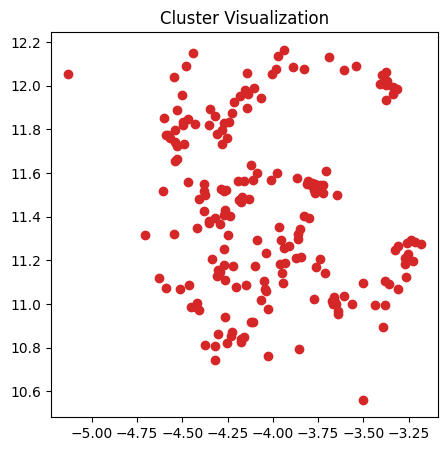

191
2041 "pone"
18381 "pcbi"
23125 "pntd"
24603 " Proc"
24818 "headed"
26825 " riders"
27390 "until"
28130 "},{"
28404 " resignation"
28555 "ὶ"
28644 "cout"
29000 "delay"
29063 " 1929"
29101 " upgraded"
29102 " clustered"
29140 "Young"
29207 " gnome"
29236 " Applied"
29426 " encourages"
29521 " kidding"
29848 "oL"
29875 " philosopher"
29933 " legitim"
30006 " shiny"
30068 " Regiment"
30257 "protobuf"
30261 " readonly"
30299 " Citizens"
30381 "Invest"
30387 "atured"
30403 " Jah"
30427 " swallowed"
30432 " fram"
30433 " mans"
30449 " Eagles"
30470 " defaults"
30482 " enumer"
30508 " prod"
30516 "FET"
30520 "lap"
30522 "]^{"
30566 " parliamentary"
30568 "nov"
30569 " offshore"
30574 "Roman"
30584 " notifications"
30622 " vegan"
30628 " reviewers"
30634 ")_{\"
30640 " **_"
30650 " movable"
30651 "696"
30684 " laboratories"
30693 "496"
30698 "eft"
30702 " shooter"
30708 " versatile"
30739 " Hir"
30746 " bonded"
30751 " mundo"
30756 " Henderson"
30765 "ñor"
30769 "Andrew"
30778 " Imagine"
30

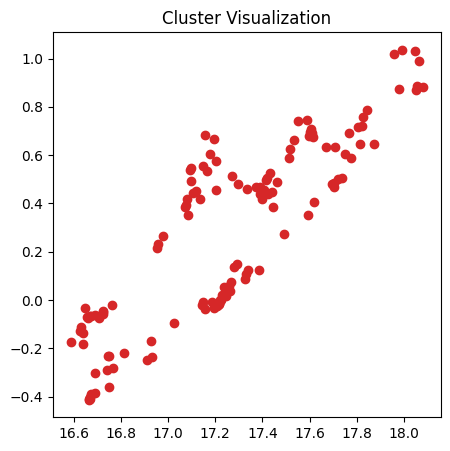

132
9185 " finger"
9525 "ruption"
9556 " Jewish"
9618 " instruct"
9633 " owned"
12692 " installation"
21424 " advocate"
34510 " clauses"
35141 " combo"
36277 "secondary"
36431 " advocated"
36508 " 377"
36509 " splits"
36532 " Randy"
36634 " SOD"
36746 "UCK"
36842 "olithic"
37103 " Baldwin"
37155 "470"
37216 " Employee"
37283 " royalty"
37319 " Prot"
37405 " Originally"
37585 "minor"
37638 "finger"
37640 "spi"
37721 "Jewish"
37772 " moiety"
37792 " Lung"
37827 " cousins"
37860 "/{\"
37892 "DLT"
37921 " Molly"
37949 " uz"
37986 " reacting"
38002 " Glor"
38028 "安"
38037 " elusive"
38069 "restore"
38090 "Inner"
38148 "stadt"
38160 " Differential"
38183 " combinatorial"
38201 " Weyl"
38203 "rating"
38204 " nationalist"
38222 " venom"
38260 " Applic"
38271 ">/"
38273 " Ober"
38296 "released"
38312 " Survival"
38319 " adjo"
38344 " commodities"
38346 "sac"
38351 "ivot"
38359 "Hill"
38379 "fv"
38384 " socialism"
38393 " baff"
38419 " chop"
38442 " hade"
38445 " prerequisite"
38457 " KR"
38496 

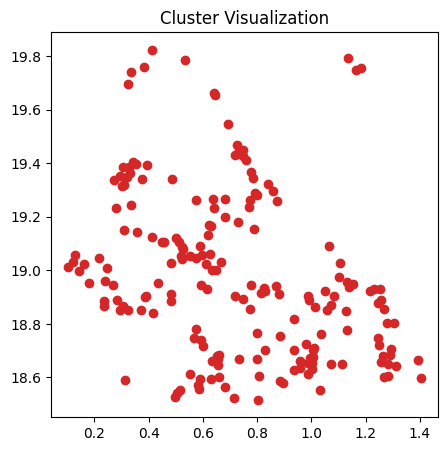

190
21352 " Civ"
21595 "Simple"
21906 "utral"
21926 "ENA"
21995 " Sad"
22005 "mare"
22228 "gas"
22244 " melting"
22255 "onomic"
22311 "เ"
22360 " Fix"
22370 "CLK"
22411 " persec"
22414 " penalties"
22421 "kb"
22454 " TABLE"
22459 " neglected"
22464 " Detect"
22476 " catast"
22511 "hydrogen"
22532 "Flag"
22534 " pizza"
22549 "/?"
22556 " Tib"
22560 "aky"
22562 "kernel"
22570 " ELISA"
22575 " magazines"
22590 "abbing"
22609 " Lip"
22615 "emption"
22642 " encaps"
22644 "itations"
22656 "OURCE"
22678 " aortic"
22680 " detention"
22681 " Stanford"
22683 "eor"
22690 "С"
22705 "Human"
22718 " Mathematics"
22728 "iao"
22734 "'];"
22738 "bag"
22744 " я"
22745 " 1939"
22746 " "."
22747 " $<"
22763 "living"
22772 "visible"
22775 "ilage"
22776 " ISO"
22783 " Denmark"
22787 " Carm"
22800 "China"
22809 "ivalent"
22810 " Johnny"
22813 " seated"
22817 "International"
22818 "276"
22819 " BB"
22821 " Kel"
22825 " Barry"
22827 " Sr"
22840 " Finn"
22844 " rises"
22845 " Brexit"
22847 "anka"
22852 " fossil

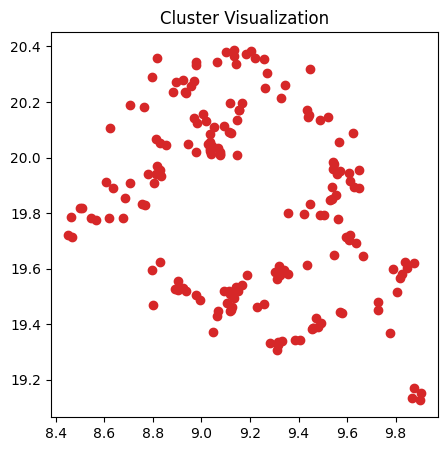

176
9835 " university"
10381 " Kn"
10850 " Game"
12303 "bp"
12318 " Head"
12780 "tmp"
13160 " Inf"
13162 " Consequently"
17148 "Print"
17530 "issippi"
17604 " ventricular"
17715 " corrupt"
17934 " upstream"
17948 " irregular"
17955 "�"
17982 "
	 "
17991 " lord"
18025 " Dim"
18042 " antibiotics"
18065 " certified"
18102 "Math"
18117 " dass"
18119 " ich"
18129 "MODE"
18149 " extensions"
18157 "Dim"
18164 " rendering"
18166 "activation"
18175 " Hillary"
18177 " trait"
18195 " trapped"
18200 " strikes"
18213 " labour"
18218 " ----"
18224 " dissolved"
18228 " NASA"
18235 " rejection"
18237 "Game"
18251 "Ðµ"
18254 " hungry"
18257 ">();"
18260 "istically"
18265 "must"
18266 "umatic"
18267 " Atlanta"
18269 "TB"
18278 "FM"
18284 "_("
18294 " households"
18299 " Expression"
18302 " reproduce"
18304 " transcriptional"
18312 " Print"
18316 "share"
18334 "ochemistry"
18345 " spare"
18351 " Gulf"
18353 " earliest"
18365 " ”"
18369 " neglect"
18375 " subdiv"
18383 " κα"
18403 " universities"
18414 " 

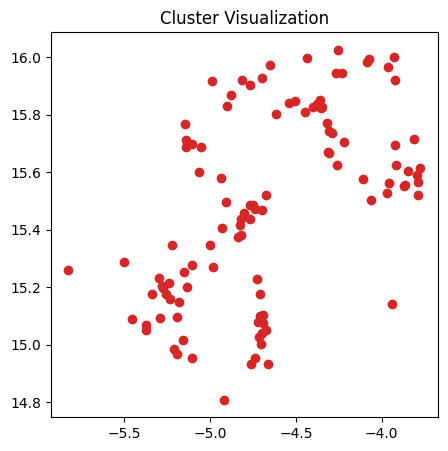

108
21092 "183"
21495 " foreach"
23441 " Deut"
23479 "isure"
23533 "midt"
23806 " nail"
24338 "KA"
24406 "arial"
24535 "ardi"
24760 " analogy"
24817 " dotted"
24874 " presumed"
24916 " Brothers"
24942 " Foster"
24947 " perceive"
24958 " Abraham"
24989 "KR"
25053 " Cycl"
25058 "berries"
25103 "eston"
25110 "Third"
25112 " chromosomes"
25124 " 1951"
25130 " ki"
25166 " antagonist"
25187 "Defendant"
25189 " resur"
25202 "ASSERT"
25230 "thening"
25239 " neonatal"
25284 " poles"
25300 " REM"
25345 " signalling"
25356 " evenly"
25370 "STEM"
25408 "DEX"
25413 " Jeremy"
25423 " youngest"
25452 "888"
25456 " Netflix"
25465 " apoptotic"
25492 " ^\"
25500 "ð"
25504 " inflict"
25515 " inactive"
25525 "fair"
25541 "�"
25565 " Morning"
25566 " permeability"
25597 " 209"
25606 "ATP"
25614 " avait"
25626 " Properties"
25638 " suspects"
25645 "defendant"
25667 "jective"
25705 " ж"
25742 "chet"
25745 "387"
25751 "inging"
25755 "avour"
25765 "central"
25767 " encounters"
25775 " lineup"
25783 " isomorphi

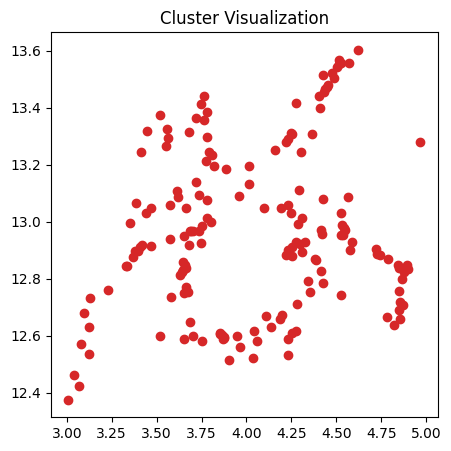

171
9699 " cognitive"
9868 " password"
11921 " abundance"
13168 " Sometimes"
15105 " bother"
16651 "focus"
18419 "rost"
18873 " ","
18998 " imagined"
19462 "testing"
19614 " Instagram"
19894 "venth"
20049 " Active"
20173 " roller"
20667 " neighboring"
20806 "Sometimes"
22002 "#####"
22275 "prob"
23694 " separating"
24219 " LDL"
29700 " Surface"
30712 " spells"
31135 "Mut"
31266 "Gall"
31604 " HAL"
31746 " bursts"
32307 "sometimes"
32415 " Basically"
32478 "Sud"
32495 " distinguishing"
32655 "Fred"
32696 " qualifications"
32998 "})_{"
33167 "brown"
33186 "???"
33223 "fiction"
33308 " Spark"
33311 " 319"
33427 " Plaza"
33430 " giants"
33491 "sources"
33548 "キ"
33557 "ête"
33564 "Damn"
33589 " Centers"
33593 "cibility"
33625 "BUILD"
33629 "σει"
33655 " Shin"
33656 "�"
33666 " gluten"
33691 " elongation"
33729 "opening"
33745 "vil"
33765 "DG"
33776 " installer"
33778 "matic"
33783 "clic"
33809 " transmembrane"
33842 " sincere"
33852 " crank"
33855 "yc"
33860 " omission"
33865 " Domain"
338

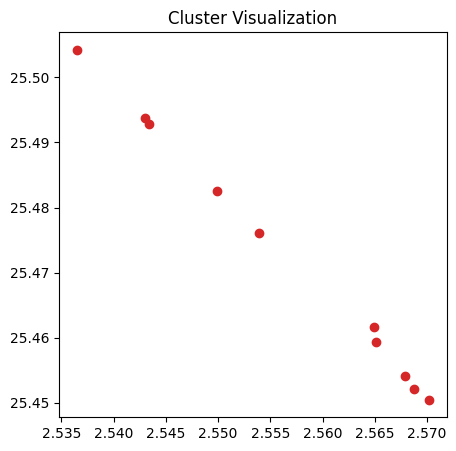

10
1013 "--------------------------------"
24702 "-------------------------"
27800 "--------------------------"
28388 "---------------------------"
28693 "------------------------------"
29295 "----------------------------"
29648 "-----------------------------"
30282 "---------------------------------"
32107 "-------------------------------"
33250 "----------------------------------"


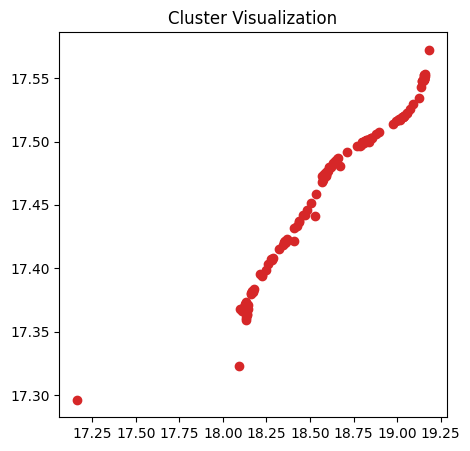

125
3 """
5 "$"
8 "'"
9 "("
10 ")"
11 "*"
13 ","
14 "-"
15 "."
16 "/"
18 "1"
19 "2"
20 "3"
21 "4"
27 ":"
28 ";"
29 "<"
30 "="
31 ">"
34 "A"
42 "I"
60 "["
62 "]"
64 "_"
66 "a"
69 "d"
74 "i"
79 "n"
80 "o"
84 "s"
85 "t"
90 "y"
92 "{"
186 "	"
187 "
"
247 " a"
249 "in"
251 "on"
253 " the"
254 "er"
261 "is"
263 "or"
264 "ed"
265 "es"
272 "ing"
273 " of"
275 " in"
281 " to"
284 "as"
285 " and"
309 " I"
310 " is"
313 " ("
320 " be"
323 " for"
326 " that"
327 " on"
329 " A"
337 " 1"
342 " with"
346 " ""
347 " as"
352 " it"
368 " you"
369 " was"
370 " $"
374 " 2"
380 " The"
387 " at"
390 " or"
395 "and"
398 "ers"
403 " are"
407 " by"
417 " not"
424 "**"
426 " ="
428 " -"
432 " from"
434 "'s"
436 " this"
449 ".""
452 " have"
475 " *"
481 ")."
495 " 3"
497 " were"
510 "The"
521 " his"
544 " ["
556 " has"
559 " +"
577 " 4"
582 "),"
598 " up"
634 " your"
668 "”"
670 " about"
686 " '"
689 " over"
715 " into"
760 " only"
773 " “"
795 " _"
904 ".,"
936 "to"
995 "","
1425 ".”"
1542 "for"
1628 "“"
2262 "

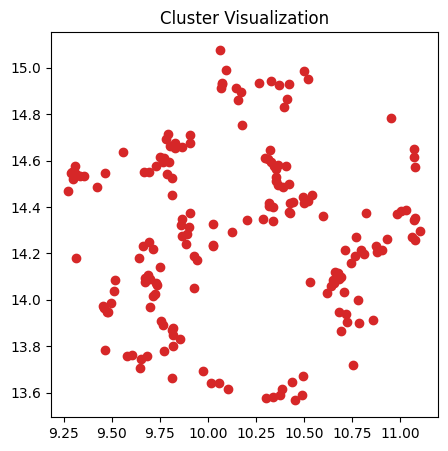

180
6635 " generate"
8671 " adopted"
9885 " electrode"
10895 " dataset"
12899 " Path"
12921 " edit"
14267 "category"
14543 "tn"
14722 " electrodes"
14809 " ATP"
14832 "225"
15302 " datasets"
15317 " Scientific"
15493 " Moh"
15594 " Sure"
15675 "ockets"
15753 " Ni"
15814 " carries"
15870 "limited"
15910 " stopping"
15912 "ucid"
15916 "ardo"
15933 ",’"
15947 " pancreat"
15954 "�"
15958 " realistic"
15973 "igo"
15975 " tweet"
15983 " Sie"
15999 " Unless"
16005 " parliament"
16019 " Phill"
16030 " inspect"
16031 " tempt"
16037 " sne"
16057 " singer"
16062 " Unit"
16068 "ridge"
16092 " quietly"
16097 "itional"
16101 " analytical"
16108 " merits"
16115 " singing"
16124 "ő"
16128 "iche"
16133 " EM"
16134 "1980"
16136 " rival"
16140 " Return"
16144 " syntax"
16150 "143"
16152 " attach"
16169 " LLC"
16170 "azione"
16179 "visor"
16188 " resem"
16189 "aan"
16190 "etal"
16192 "mn"
16194 " Sky"
16195 " centrifug"
16214 " ordin"
16217 "exper"
16219 " Tam"
16224 "orious"
16227 "Photo"
16231 "bara"
16

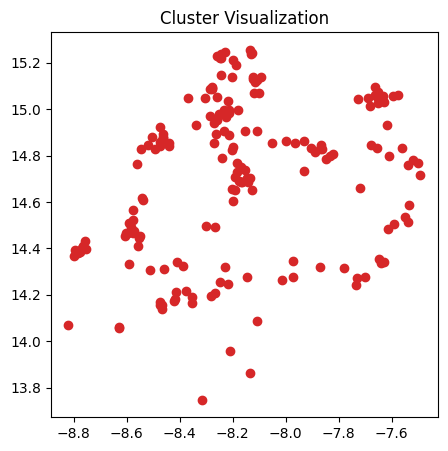

179
25368 " ceased"
25547 " freshly"
25732 " ove"
25842 "wikipedia"
26057 " deaf"
26092 "ija"
26238 " lac"
26305 " rectangular"
26310 "QUEST"
26328 "ortal"
26386 " Pul"
26454 "management"
26480 " extrap"
26497 "gnu"
26522 "707"
26539 "chrom"
26542 " cite"
26557 " inherently"
26558 "oyle"
26590 "ihad"
26595 " Chrom"
26607 " (%"
26608 " Camb"
26617 "love"
26630 "inski"
26645 " Button"
26661 " capsule"
26662 " compares"
26667 " cancellation"
26673 "369"
26697 "vn"
26706 " widget"
26714 " matt"
26740 " sway"
26741 " circumstance"
26778 "@{"
26779 " Learn"
26790 "idyl"
26807 "DV"
26813 "720"
26834 "otin"
26835 " perfection"
26836 "--""
26839 "Tele"
26851 " Eug"
26854 " solic"
26864 " Eagle"
26866 " saves"
26869 "tico"
26871 "shit"
26872 " Lost"
26878 " Spencer"
26888 " Brady"
26891 " Category"
26901 " hoc"
26903 " tribal"
26907 "úblic"
26914 "ieren"
26917 "Enron"
26925 " vet"
26927 "obar"
26929 "omology"
26930 " admire"
26932 " dal"
26940 " Authors"
26944 "modern"
26949 " territories"
26954

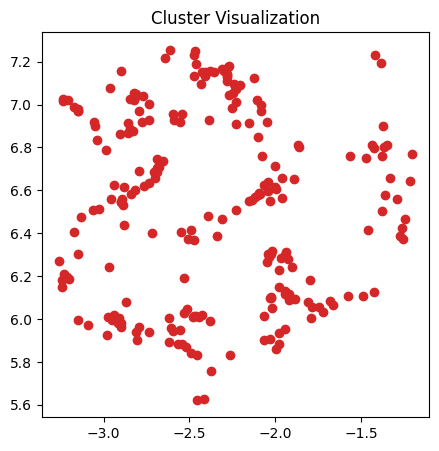

233
2000 "}_"
2602 " soft"
4768 " throughout"
5000 "}}_"
7294 "}}^"
8167 " Defendant"
16302 "}}}_"
18761 "
         "
23430 " 1943"
23450 "Resp"
23933 " š"
23954 "Area"
24178 " 1954"
24411 " dosage"
24661 ")}_"
25126 " bureauc"
25387 " DEN"
25545 "artments"
25551 " yoga"
25807 " dice"
25955 "phosphate"
26026 " percentages"
26085 " warranted"
26093 "agin"
26122 "comments"
26165 " Bh"
26287 "ielder"
26426 " desperately"
26434 " supplements"
26465 " comics"
26482 " Peng"
26518 " transmitter"
26571 " Lion"
26656 " Biden"
26657 "==================="
26767 " prolifer"
26814 " commanded"
27065 " fibre"
27079 " COPD"
27081 "}/\"
27084 " doorway"
27103 " _________________"
27106 "ricting"
27124 "amycin"
27131 " Stir"
27404 "аг"
27603 "Metric"
27607 "noop"
27673 ")/(("
27744 " 409"
27747 " lithium"
27798 " culmin"
27847 " mucosa"
27966 " hike"
28030 "intendent"
28041 "plets"
28108 " landsc"
28193 " starring"
28209 "271"
28273 " ppm"
28324 " conformation"
28342 "opathological"
28430 " Prec"
28432

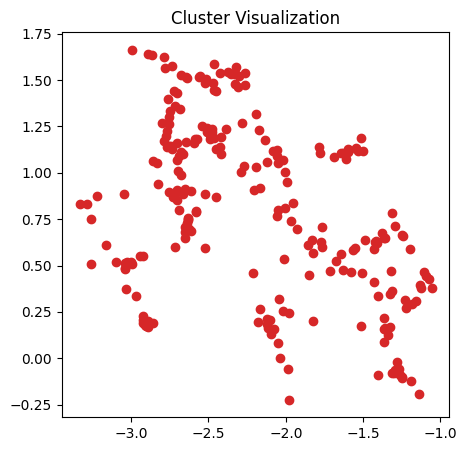

240
24 "7"
25 "8"
262 "it"
427 " N"
533 " but"
690 " some"
695 "ric"
733 " It"
735 "vers"
740 "10"
768 "^{"
818 " 7"
854 " 8"
858 " did"
905 " \["
918 "right"
920 "ning"
921 " show"
938 "20"
943 " should"
973 " well"
1024 " now"
1032 "ars"
1050 "ational"
1052 " 200"
1057 " does"
1117 " partic"
1119 " found"
1131 "ages"
1132 " play"
1147 "It"
1159 " function"
1160 " made"
1167 " mem"
1174 " exam"
1182 " z"
1193 " fil"
1197 "ody"
1211 " own"
1219 " Al"
1227 " /"
1232 " process"
1239 " read"
1242 "ively"
1250 "ired"
1271 "ices"
1275 " ref"
1281 " Let"
1299 "ton"
1311 "CR"
1314 "med"
1317 "ams"
1320 "ization"
1340 " order"
1349 " pa"
1351 "ane"
1385 " count"
1386 " line"
1400 "EN"
1401 " **"
1402 "ray"
1405 "me"
1432 "aj"
1433 "IT"
1446 "meric"
1448 " del"
1454 " �"
1457 " New"
1458 " 15"
1462 " stand"
1479 "ik"
1480 " direct"
1482 "ience"
1484 " u"
1518 "200"
1519 "ott"
1569 " law"
1578 " es"
1583 " They"
1590 "name"
1591 "lex"
1592 "fer"
1593 "ional"
1596 "arn"
1606 " wom"
1608 " Sh"
161

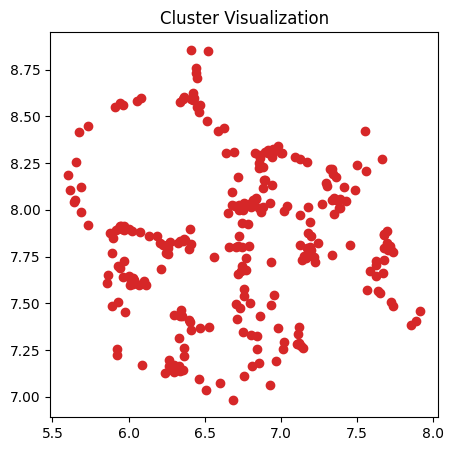

267
9208 " temperatures"
9769 " hybrid"
10630 " consumer"
11935 " temporal"
13480 " Rail"
13995 "'}"
15053 "ighters"
15478 "ț"
15508 "ulum"
16016 " vas"
16401 "个"
16518 " engineer"
17011 " undefined"
17139 " critics"
21315 "icket"
25155 "Progress"
26693 " cinema"
34233 " doping"
36025 " liberals"
36595 "plaintiff"
36696 " 371"
37293 "


      "
37540 " malf"
37648 " Ultimate"
38616 "omore"
39705 " ))"
39808 "remark"
40156 "inence"
40728 "sand"
40977 " ecology"
40989 " Neo"
41077 " alters"
41144 " Signaling"
41277 " Juda"
41558 " Zhou"
41619 "{};"
41642 "
                                              "
41705 " dragons"
41883 "'}("
41930 " sewer"
42062 " orderly"
42104 "ributor"
42173 " Amended"
42177 " conceivable"
42189 " intensely"
42289 " relinqu"
42315 " _."
42339 "ivism"
42350 " densely"
42359 " extras"
42421 " Tribe"
42464 " tonnes"
42467 " unsett"
42542 " ":"
42566 " osteoclast"
42585 "chs"
42587 " OL"
42600 " dipped"
42613 " Broncos"
42616 " gallons"
42685 " europea"
42694 "atas

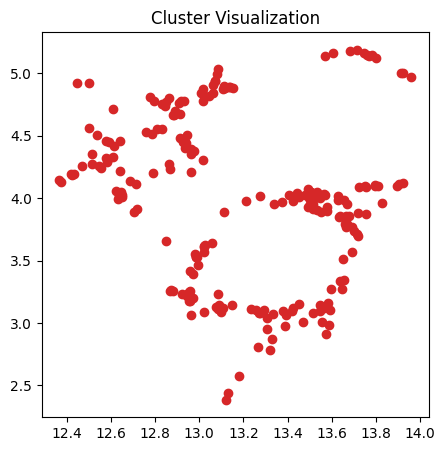

227
7243 " Once"
9340 "Results"
9384 " Rock"
9679 ")),"
9838 " rein"
9848 " comfortable"
9889 "lections"
9941 " radius"
10124 "endar"
10126 " statistically"
10131 " uintptr"
11094 "hire"
12564 " disability"
12809 "overty"
13506 " synthetic"
13944 " Scotland"
14498 " lapt"
14725 "Provider"
14848 " Wars"
14958 "did"
15059 "aptic"
35784 "uego"
36147 " tipo"
36695 "0045"
37589 " bachelor"
37625 " crushing"
37673 "LG"
38099 " photore"
38252 "agus"
38491 "itty"
38566 " Electro"
38652 "propyl"
38734 " Friedman"
38740 "assen"
38769 " picnic"
38823 "089"
38946 " Forbes"
38964 " smear"
39069 "417"
39075 " Photoshop"
39125 "сть"
39172 " 506"
39215 " Traffic"
39237 "actively"
39342 " inversely"
39399 " DSM"
39401 " factorization"
39420 " Lap"
39435 "ль"
39446 "slider"
39497 "Clock"
39524 " MVP"
39624 " arte"
39661 "ilingual"
39672 " Nous"
39767 " volley"
39782 "electro"
39934 " constitutive"
39951 " aa"
39957 " catar"
39959 " Buzz"
40012 " Archae"
40026 "Ul"
40064 "cols"
40115 " Lithuan"
40167 " p

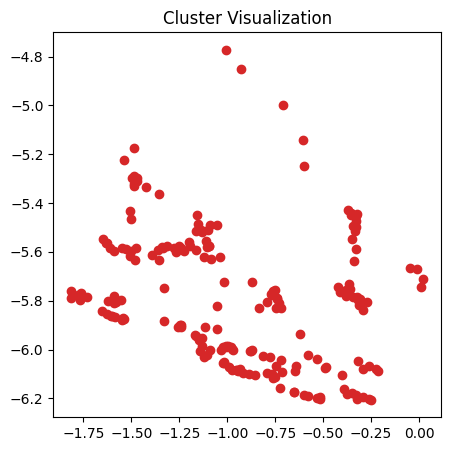

201
4498 " song"
4549 " appeal"
5214 "RA"
5341 "oting"
5385 " cru"
5388 "500"
5415 " continuous"
5475 "Item"
5485 " opened"
5500 " cup"
5515 " Rober"
5596 "appa"
5608 " served"
5621 " forces"
5626 "ALL"
5637 " electric"
5669 " insert"
5677 "Out"
5693 " 48"
5707 "CON"
5710 "idem"
5714 "itivity"
5717 " thank"
5735 "idel"
5740 " description"
5754 " prison"
5763 " exercise"
5791 " East"
5792 "lt"
5821 " agreed"
5823 " mm"
5831 "0001"
5836 " CON"
5837 "isation"
5852 "iders"
5858 "pass"
5895 "itis"
5896 "riage"
5898 " α"
5908 " officer"
5909 " opening"
5915 "CO"
5919 " efficient"
5935 " TO"
5959 "�"
5969 "rich"
5983 "'."
5986 " Board"
5988 " breast"
5989 " circumstances"
5999 " situ"
6002 "oz"
6011 "ymph"
6013 "poses"
6019 ".**"
6033 "thon"
6044 " volt"
6050 "while"
6056 "lands"
6060 "Index"
6073 "ivo"
6078 " �"
6081 "izer"
6090 "esis"
6096 " shared"
6098 ":**"
6103 " strugg"
6108 " leaving"
6124 "Code"
6128 " responses"
6133 "ilit"
6144 " Canada"
6148 "van"
6149 " earth"
6156 "va"
6160 "spe

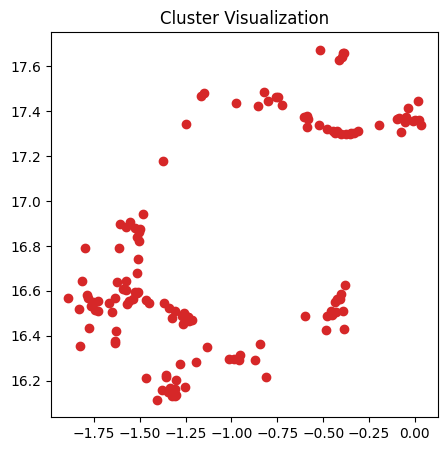

138
9184 " differ"
10022 " Accordingly"
17391 "208"
19071 " incorporate"
19636 "udson"
19907 "Send"
19986 " differs"
21202 "keley"
21370 "$-$"
22474 " enhancing"
22603 " ethn"
22778 " MORE"
22788 "="{"
22793 " deed"
22883 " Assume"
22925 " identities"
22976 " Fran"
23037 "oft"
23059 "tags"
23064 "Pred"
23099 "anno"
23121 " administrator"
23135 "Accordingly"
23137 "orthy"
23149 " corro"
23166 "winning"
23203 " Ye"
23218 " visitor"
23242 "omp"
23257 " Fu"
23262 "Ray"
23286 "^−/−"
23313 " jer"
23340 " Indonesia"
23364 "enia"
23401 "  "
23403 " predictor"
23417 " connects"
23435 "HO"
23439 " summon"
23442 " Helen"
23467 " floors"
23469 " ankle"
23474 "Selection"
23483 " noon"
23487 "cart"
23497 " broker"
23499 " countless"
23516 "}.\"
23522 "ribly"
23526 " Better"
23535 " gorgeous"
23536 "Role"
23542 " mp"
23543 " saturated"
23545 "277"
23547 "+$"
23562 "FIL"
23570 " indef"
23602 " Hudson"
23619 "insula"
23629 " typing"
23630 " ل"
23632 " guarantees"
23638 "UTE"
23664 " cubic"
23674 "minde

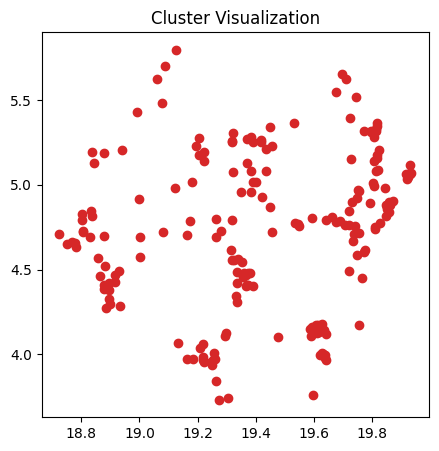

203
9833 " arrested"
9896 "gal"
10194 " steel"
10208 " fed"
10220 " explo"
10264 " manufacturing"
10455 "unning"
10466 " implied"
10528 "zero"
10541 " tone"
10759 "Her"
11745 " quantitative"
36648 "compact"
36655 "Errors"
36686 " Quantitative"
36824 "cyt"
36859 " 348"
36875 "лю"
36878 " quantitatively"
37060 " Terminal"
37063 " Bengal"
37073 " Katie"
37091 "ocin"
37136 " wy"
37172 "ielsen"
37185 "):=\"
37193 " deleting"
37219 "525"
37233 " squir"
37282 " timed"
37285 " tunnels"
37300 "�"
37303 "azioni"
37323 "fur"
37365 "mq"
37382 "centric"
37387 "="">"
37391 " solicit"
37394 " nitrate"
37396 " Extension"
37420 "isdiction"
37434 " steer"
37442 "documentation"
37444 " stacking"
37456 "HEADER"
37460 " mitigating"
37481 " recreation"
37486 " tumorigen"
37490 "Nil"
37491 " Ri"
37492 " partisan"
37495 " Conclusion"
37503 " OM"
37506 "ค"
37507 " nets"
37514 "KD"
37520 "rst"
37527 " daytime"
37529 "itsu"
37530 "vinyl"
37533 "Solution"
37568 " lleg"
37569 " Knox"
37571 " particulate"
37575 " s

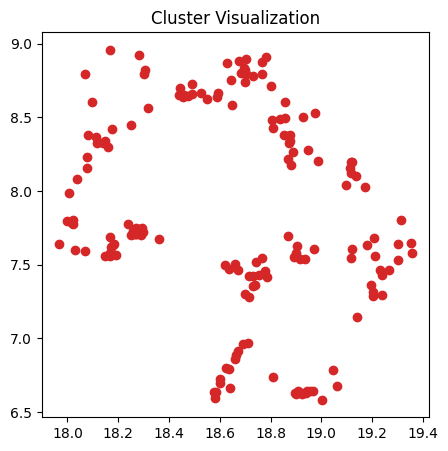

169
7898 " partial"
9588 " markers"
9864 " simulation"
9938 " simulations"
10035 " Mike"
10103 " dimensions"
10179 "cit"
10240 "amples"
10243 " Line"
10267 "Mem"
10386 " thy"
10407 "ailable"
10426 " calculations"
10436 "reens"
10513 " creates"
10519 " Year"
10531 "element"
10540 " Love"
10548 "Inst"
10553 "ogeneous"
10599 " adequate"
10601 " FA"
10603 " mapping"
10608 " �"
10609 "mathscr"
10626 "ו"
10628 "umps"
10629 "sch"
10692 " lady"
10698 " unsigned"
10710 " DR"
10731 "olars"
10805 " falling"
10975 "bool"
11027 "017"
12991 "rogen"
13089 " Jean"
14557 "mus"
35112 " Pradesh"
35161 "finite"
35543 " 435"
35697 "enen"
35953 " ${{"
35975 "Performance"
36000 " Snap"
36006 "awt"
36091 " Mercury"
36141 "worm"
36164 " PCs"
36165 " ordinarily"
36178 "�"
36244 " Prix"
36259 "guards"
36290 "OUGH"
36298 " stripes"
36326 "jos"
36332 "iek"
36334 " deferred"
36347 " Resolution"
36365 " Squadron"
36366 "nier"
36407 " kr"
36418 " formidable"
36445 "introdu"
36467 " touring"
36480 " Superman"
36495 " 

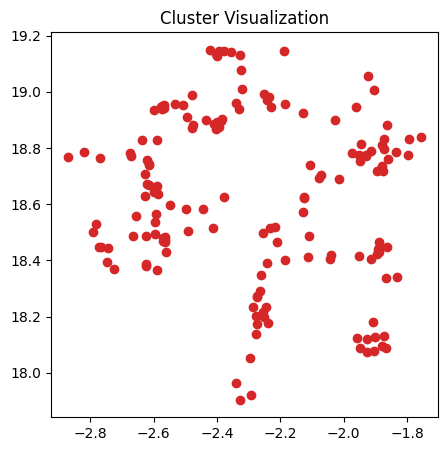

161
23241 " accommodation"
23574 " dorm"
23672 " donation"
23684 "William"
23773 " Rice"
23829 "337"
23856 " Nigeria"
23858 " Boolean"
23869 "=%"
23968 " organize"
23979 "enue"
23983 "?>"
23991 " triumph"
24020 " regimen"
24022 " embryonic"
24030 " deficient"
24035 " Keith"
24062 " 179"
24065 "hyth"
24092 " neighbourhood"
24100 " XX"
24103 " Fitz"
24111 "plugins"
24121 "Events"
24124 "extra"
24125 " ~*"
24127 " Adm"
24131 " Krist"
24152 " sympathetic"
24158 "Route"
24159 "performance"
24164 "initions"
24181 " systematically"
24184 " forfe"
24189 " vulnerability"
24194 " cheeks"
24197 " Reuters"
24200 " Sigma"
24203 "artifactId"
24205 " intox"
24206 " Sri"
24210 "extension"
24221 "Jul"
24222 "*(*"
24226 "Cas"
24229 " être"
24231 "ackets"
24235 "263"
24237 ".]{}"
24249 "ictures"
24251 " tuned"
24256 " cytoplasmic"
24261 "opoly"
24264 "409"
24268 " sono"
24270 "seed"
24273 " kinetics"
24276 "arcer"
24277 "iper"
24280 " penetration"
24285 "":{""
24286 "thought"
24288 "anas"
24292 " έ"
2429

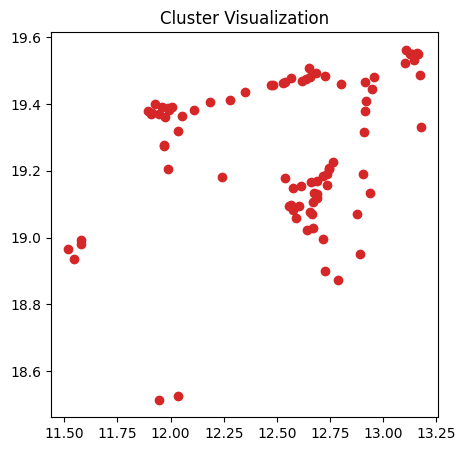

86
988 "
		"
8397 " Dev"
9225 " Prov"
9487 "xiety"
9606 " suffered"
10397 " anxiety"
11089 " suffer"
11148 "Dev"
11289 " 89"
11459 "
		"
11509 "Prov"
11700 " SQL"
11779 "MAX"
11866 "

		"
11922 " removing"
11962 " varying"
11996 " bottle"
12000 " Cas"
12070 "SQL"
12079 " Family"
12103 " gained"
12206 " bearing"
12264 " psychological"
12273 " Mother"
12291 " limitation"
12311 "good"
12329 " Contin"
12346 "ك"
12373 "negative"
12402 "¿"
12422 " feeding"
12448 "ー�"
12551 " Opt"
12552 " Cy"
12558 "Di"
12585 " blot"
12632 "ders"
12653 "arijuana"
12658 " Der"
12667 " ≥"
12675 " Represent"
12682 " shoes"
12685 " waters"
12696 " ingredients"
12708 " 106"
12714 " assignment"
12750 "setminus"
12761 " Micro"
12775 "ETH"
12785 " territory"
12817 "clusively"
12822 "Ms"
12835 " fucking"
12859 "ו�"
12881 " pipe"
12909 " dysfunction"
12911 " Berlin"
12927 " ocean"
12929 "nex"
12949 " mini"
12967 " Word"
12969 " ruled"
12971 "106"
12976 " raising"
12983 " fert"
12989 " topics"
13004 "erred"
13017 "final

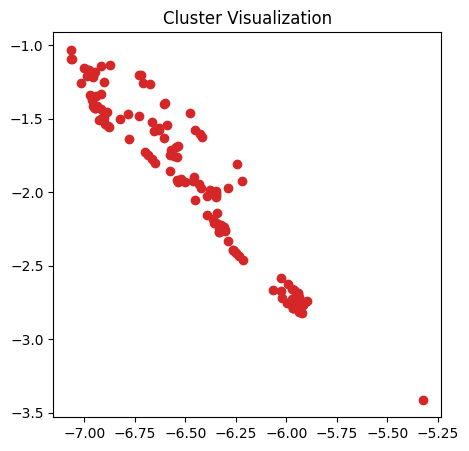

135
2571 " others"
2726 " With"
3166 " Do"
3282 " sense"
3284 " element"
3285 " 29"
3296 "hem"
3305 "book"
3330 " win"
3332 " recent"
3344 " Jan"
3351 "Im"
3359 " implement"
3360 "utions"
3372 "lig"
3420 " media"
3453 " output"
3469 " depend"
3480 " lack"
3495 " 23"
3502 "olds"
3538 " deriv"
3576 " effective"
3578 " ten"
3593 "81"
3612 "ken"
3621 "lease"
3633 "Get"
3643 " Pa"
3652 " building"
3658 "ements"
3662 " answer"
3699 "culate"
3702 "uary"
3703 "oe"
3705 " pict"
3710 " limited"
3727 " release"
3745 " ability"
3762 " theory"
3767 "men"
3772 " autom"
3796 "erson"
3797 " includes"
3803 "pper"
3815 " alone"
3819 " fight"
3821 " Oct"
3828 " layer"
3830 "cdot"
3847 "zy"
3858 " friends"
3859 "PL"
3865 " anim"
3872 " national"
3876 "ón"
3888 " images"
3890 " express"
3894 " share"
3898 " impl"
3902 "Value"
3911 " opin"
3917 "の"
3926 " dro"
3929 " article"
3930 " "
3954 " Now"
3971 " road"
3979 "BC"
3994 " ens"
3995 " House"
3998 " brain"
4004 "lation"
4005 " Sept"
4008 "cast"
4019 "za"


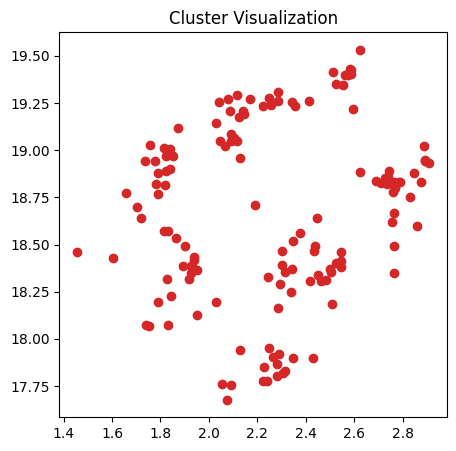

139
12394 " climb"
13851 "168"
14368 " regulate"
16925 " Sep"
18795 "151"
19721 "username"
19743 " Simple"
19996 "Internal"
20221 " Random"
20487 "239"
20512 " sexually"
20777 "308"
21127 "harm"
21150 " remod"
21211 " redshift"
21266 " climbing"
21275 "作"
21281 " underneath"
21312 " Universal"
21313 " emergence"
21335 " phosphat"
21355 "SERV"
21371 " pockets"
21468 " missions"
21532 "inafter"
21571 " Watson"
21585 " Machine"
21601 "pent"
21616 "business"
21622 "ità"
21671 "xff"
21677 "א"
21679 " smartphone"
21708 " LL"
21736 " peers"
21748 " 168"
21762 "ál"
21782 " induct"
21793 "PIN"
21797 "rosine"
21804 " Bert"
21825 " clones"
21842 " additive"
21853 " workplace"
21863 " climbed"
21892 "Wil"
21894 " Va"
21912 " rocket"
21923 " elle"
21941 "personal"
21967 " obese"
21973 " expects"
21977 " editorial"
21982 " 151"
22015 ""
22035 "team"
22036 "Blue"
22041 "parameters"
22057 " Condition"
22066 " resemb"
22077 " lecture"
22101 " swap"
22118 " stats"
22125 "ió"
22134 " openly"
22142 " bel

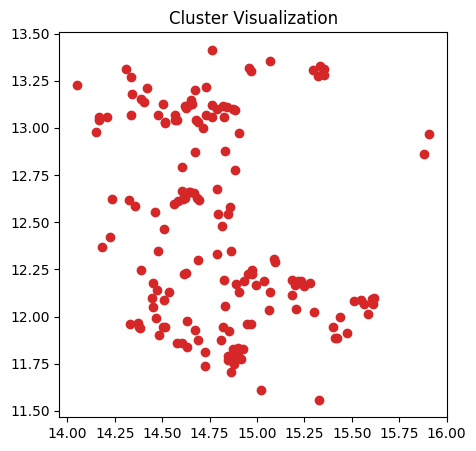

160
984 " because"
4711 " produce"
4855 " High"
6408 " During"
9017 " extend"
9831 " mM"
10189 "NR"
10457 "During"
10518 " Business"
10665 " considerable"
12157 "because"
12236 "Address"
12510 " effectiveness"
12514 " symp"
12699 " concert"
12862 "ocols"
13010 "LP"
13142 "necessary"
13527 " regulated"
13555 " custody"
13604 " clause"
13609 "中"
13633 " extending"
13697 " rendered"
13774 "aid"
13785 " panc"
13786 " Petition"
13820 "MAP"
13896 " commands"
13920 " accompany"
13928 "hole"
13959 " exempt"
14023 " comparisons"
14083 "icture"
14166 " stere"
14177 " tries"
14182 " Dark"
14196 " Short"
14199 " membership"
14210 "heres"
14229 " surviv"
14297 " Agreement"
14298 "uts"
14348 " birthday"
14417 "ariance"
14440 "hell"
14451 "hou"
14460 "izers"
14474 " Spr"
14484 " fut"
14487 "queue"
14502 " condem"
14505 " titles"
14506 "xf"
14507 "€"
14530 " pale"
14564 " Area"
14567 " rit"
14574 "(){"
14579 " kan"
14608 " entertainment"
14613 " behavioral"
14614 " Indiana"
14624 " denying"
14625 " se

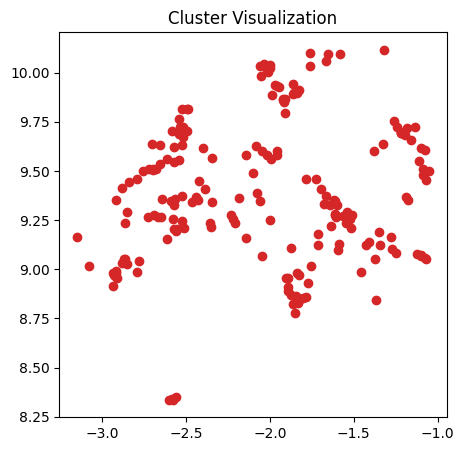

196
10159 " regardless"
24186 " owe"
24230 " merchant"
24948 "402"
26425 " broth"
26882 " desp"
27289 " measurable"
27461 " Lis"
27785 " naive"
28076 " doi"
28380 " modulus"
28398 " blockade"
28519 " throughput"
28694 "along"
28752 "Sources"
28801 " Face"
28881 " LG"
28883 "684"
29022 " amen"
29068 " Sale"
29242 " Deb"
29268 "�"
29335 " outflow"
29384 "owitz"
29385 " rugby"
29501 " 254"
29510 " northeast"
29582 "Edge"
29650 "_{["
29661 " lur"
29913 "alias"
29938 " rookie"
29967 " scarce"
30007 "zb"
30060 " illegally"
30157 " vicious"
30205 "othal"
30322 " Rug"
30378 "ichia"
30380 " merchants"
30385 " ambition"
30404 " citations"
30471 " inserting"
30489 "lfloor"
30524 "ractor"
30557 " tex"
30565 " endure"
30585 "icons"
30588 " GHz"
30638 " Confed"
30661 " whit"
30668 " mascul"
30711 "oultry"
30722 " geb"
30723 "ば"
30728 " AUC"
30729 "ი"
30768 "057"
30820 " colorful"
30840 " multiplic"
30852 " Rout"
30867 " Fri"
30884 "underset"
30970 "!)."
30977 "415"
30979 " Madame"
30988 " fluxes"
30

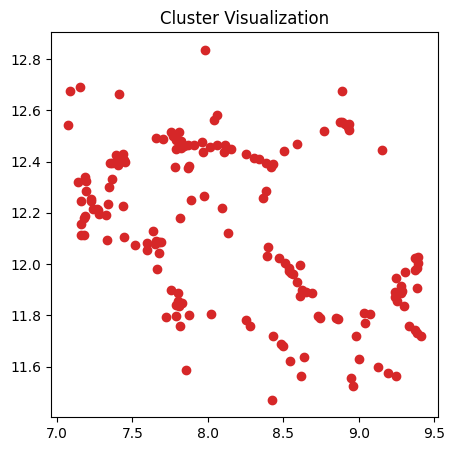

163
5252 " safety"
5839 " investigation"
6818 " twenty"
8158 " bath"
8232 " zone"
8781 " container"
9059 " argue"
10092 " Joseph"
12769 "irth"
14006 " investigations"
14857 " TNF"
14968 "Template"
14991 " admin"
15213 " piv"
15376 "edly"
15520 " Ur"
15605 " Commissioner"
15673 " modulation"
15715 " oc"
15757 " Convention"
15782 "IDS"
15807 "uters"
15822 " wise"
15911 "��"
16159 "idx"
16203 " myel"
16242 "quire"
16246 " Jay"
16248 " combining"
16353 " Claim"
16415 " Cit"
16459 " Node"
16481 " cleared"
16527 " Kal"
16623 "oustic"
16649 " etern"
16954 "oons"
17243 "inline"
17285 " justified"
17305 "enh"
17414 " dialogue"
17665 "्"
18731 " Safety"
19541 " ali"
19649 " generous"
20753 " CAN"
20766 " Quality"
21411 "overset"
23082 " reductions"
32803 "432"
33586 "erobic"
33816 "afety"
33902 " stretches"
34022 "oproteins"
34166 " JD"
34174 "brities"
34184 " Waters"
34185 "zar"
34256 " formations"
34268 " battlefield"
34276 "john"
34288 " peroxide"
34302 " twitter"
34329 " welding"
34336 " Zh"

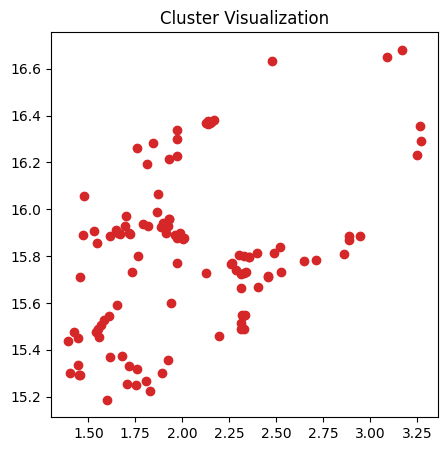

109
2717 " nothing"
3202 " \\"
3353 "\\"
6951 " chair"
11054 "}\\"
13529 " Nothing"
14189 " polynomial"
14774 "sym"
15247 " initiated"
15750 " 1972"
16440 "Nothing"
16462 "EF"
17108 ")\\"
17218 " Et"
18161 "202"
18274 " leaned"
19624 " traveled"
19708 " jack"
19972 " deformation"
20167 "Normal"
20580 " Sent"
20682 " upgrad"
21036 " duplicate"
21059 " pound"
21097 " impress"
21249 " Brooklyn"
21271 "PLC"
21273 "LOG"
21367 "�"
21376 "acional"
21386 " Normal"
21435 " hyd"
21451 "251"
21457 "Lett"
21526 " tam"
21527 "ент"
21539 " normalization"
21583 " chairs"
21614 " carriage"
21619 "lg"
21644 "ameters"
21645 "307"
21778 " Gallery"
21783 " polynomials"
21784 "Bur"
21817 " lined"
21851 "PSS"
21858 " diffuse"
21878 "ién"
21932 " FD"
21940 "021"
22004 " \*\*"
22030 " barred"
22038 " 202"
22085 " Hawaii"
22114 " Zhang"
22122 "choice"
22152 " Hist"
22168 "tainment"
22200 " Charl"
22237 " lod"
22298 " stair"
22325 " simplest"
22363 "olith"
22403 " deform"
22427 "Nor"
22428 " NEW"
22430 "stantia

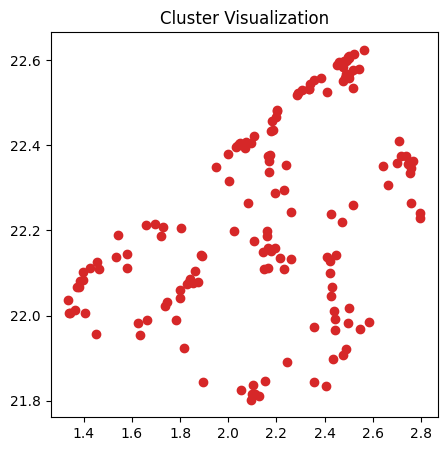

155
15697 "issue"
19100 "280"
19623 "different"
19845 "mouth"
20013 " HF"
20237 "rays"
20256 "270"
20282 "vt"
20314 " bib"
20396 " GENERATED"
20409 "sha"
20430 " destro"
20431 "Power"
20438 "252"
20456 " evid"
20459 "Job"
20660 "hattan"
20693 "ulose"
20797 " VM"
20852 "lev"
20859 " Private"
20887 "ré"
20894 "proto"
20910 " pricing"
20920 "Unknown"
20949 " machinery"
20969 "events"
20984 "keeper"
20991 "237"
20998 " fighters"
21002 "belie"
21011 " dependencies"
21013 "compl"
21014 "respect"
21019 " evac"
21020 "Play"
21023 " hated"
21032 "igating"
21034 " Bloom"
21035 "imento"
21037 "etti"
21044 " desires"
21049 "quote"
21057 " irradiation"
21058 " resume"
21060 "nerg"
21061 "resolution"
21084 " recomb"
21087 "dL"
21089 "ammar"
21091 "Wed"
21095 "349"
21105 " wholly"
21107 "working"
21109 "IONS"
21111 "bons"
21118 "quet"
21131 " palace"
21136 " pc"
21139 " telesc"
21146 " П"
21153 " witnessed"
21160 " Bios"
21166 "Information"
21169 " downward"
21181 " destruct"
21182 " eyeb"
21183 " co

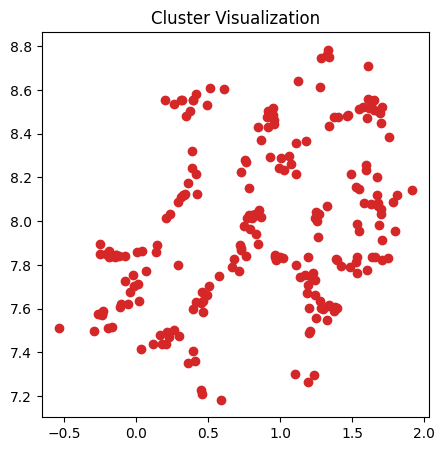

222
1043 "
     "
2857 "               "
4935 "}}("
8600 " render"
9100 " spending"
12523 "}}(\"
17019 " celebrate"
17892 " lowered"
18616 " lemon"
19239 "panic"
20507 " Queens"
22636 " detr"
23100 "364"
23106 " Joint"
23189 " murm"
23345 " lowering"
23394 " hen"
23666 "Ber"
24806 " tomatoes"
25151 "azar"
25378 "ى"
25427 " mighty"
25482 "inety"
25522 "database"
25651 "ζ"
25925 "Previous"
26062 " Dennis"
26080 "ractical"
26356 "estock"
26695 "doors"
26996 " candy"
27508 " @""
27571 "281"
27627 " aneurys"
28034 "jd"
28068 " jeopard"
28157 "usb"
28765 " celebrating"
28855 "aukee"
28910 " 	"
28939 " terminology"
29047 " Cour"
29054 " memo"
29182 " cryptocurrency"
29466 " chickens"
29537 "RUN"
29857 "fab"
29880 " Pont"
30187 "Sy"
30211 " exploitation"
30239 " sandwic"
30415 " hemorrhage"
30549 " Consumer"
30900 " erupt"
30957 "population"
30976 "proper"
31096 "^\[[@"
31122 " nationally"
31178 "éri"
31269 "oscope"
31274 " Lav"
31356 "ymbols"
31654 " wilderness"
31683 " Oz"
31850 " initializa

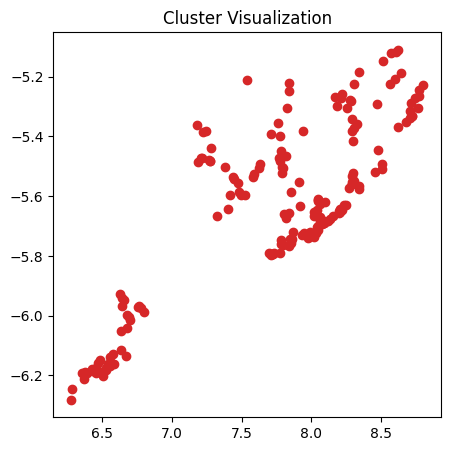

184
6585 " 2001"
6603 "NE"
6650 "gebra"
7049 " tick"
7195 " Thomas"
7613 " hence"
7671 " Federal"
7757 " Hence"
7943 " characterized"
7992 "Ext"
7996 " sensitive"
8027 " launch"
8119 " commission"
8262 "Hey"
8394 " proportion"
8418 "apache"
8466 " veget"
8562 "]^."
8566 " compact"
8589 "}|"
8604 "documentclass"
8609 " thermal"
8644 " amazing"
8648 "haust"
8691 " fant"
8759 "creen"
8773 " escape"
8786 " Republican"
8809 "amss"
8812 " delet"
8816 "Po"
8833 "byte"
8840 " lowest"
8861 "upgreek"
8894 " "\"
8895 "ema"
8906 "util"
8907 " Senate"
8916 " Power"
8933 " stead"
8962 "uv"
8971 "2001"
8975 "Client"
8976 "uster"
8980 " bind"
8991 " emotional"
8994 " \>"
8999 "onents"
9009 " implemented"
9018 " Never"
9022 " ment"
9027 ".’"
9028 " κ"
9041 "uan"
9042 "DM"
9052 " Ext"
9053 "�"
9054 " enemy"
9061 " authorities"
9073 " helping"
9078 "�"
9087 " DC"
9091 " opportunities"
9092 " tip"
9094 " ye"
9097 " dogs"
9101 " suspect"
9107 " Software"
9113 " correctly"
9115 "lements"
9116 " fraud"
9125 

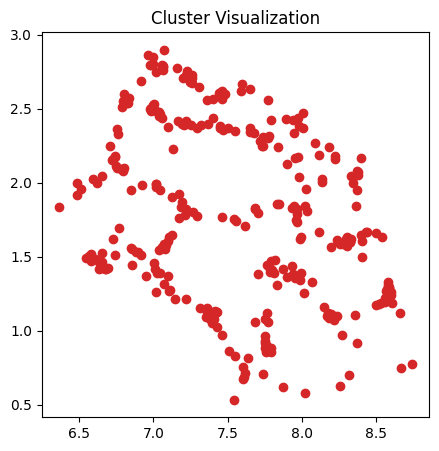

320
2280 " mass"
4333 "                   "
5814 "

     "
6596 "
                           "
8416 " finish"
8533 "

                                "
9200 " shel"
12375 "                                   "
12826 "
                     "
14047 " authorized"
14067 "Despite"
14195 " oven"
15242 "addy"
15398 "
    
   "
17677 "                                                "
20380 "
                          "
22937 " 
     "
24245 "                                                             "
28452 " cleaner"
41850 " factions"
43339 "ış"
43463 " PCB"
44668 " initWith"
44672 "mares"
44818 "ouin"
45080 " ABS"
45211 " Implementation"
45244 " humiliation"
45264 " arousal"
45265 " 1897"
45408 "Locale"
45450 " Wins"
45454 " hassle"
45466 "考"
45488 " ([**"
45492 "ာ"
45521 " grandes"
45625 " lepton"
45654 " intrinsically"
45674 " Orient"
45864 "Dependency"
45873 "ethoxy"
45894 "artic"
45896 " plastics"
45952 "Frames"
45979 " Astronomy"
46000 "IRD"
46089 "introduction"
46146 "'?"
46148 " 568"

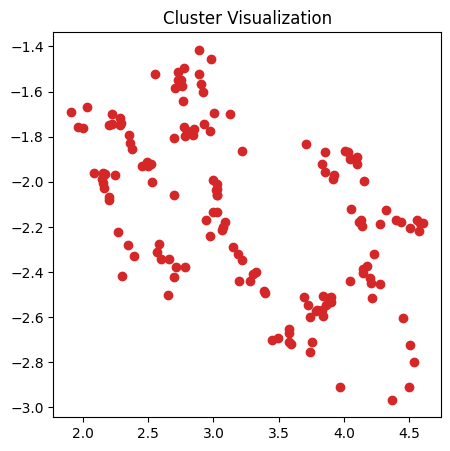

148
971 " want"
1764 " $$\"
1804 " suggest"
1928 " feel"
2794 " create"
2994 " himself"
4401 " manufact"
4493 " circum"
4545 " advant"
4779 "Man"
4979 " transform"
5061 " uns"
5362 " scen"
5380 "oute"
5536 " heavy"
5558 " liquid"
5612 " Rich"
5696 "LA"
5703 "Read"
5742 " specifically"
5866 " occurred"
5883 "CM"
5917 " symptoms"
5941 "�"
5974 " student"
6032 " smooth"
6084 "cknow"
6112 " Texas"
6193 " Ber"
6250 " "
6266 " describe"
6382 " polic"
6404 "amily"
6424 " criminal"
6433 "icians"
6466 "cence"
6479 " brow"
6482 " hypothes"
6553 "draw"
6708 "itory"
6714 " excess"
6743 " Franc"
6749 " ice"
6756 "source"
6864 " depth"
6948 "ashed"
6950 "aren"
6967 "dimensional"
6976 " Australia"
7036 " conc"
7065 "ат"
7070 "ipl"
7086 "]--"
7087 " Nor"
7090 "č"
7126 " excellent"
7163 " nom"
7201 " ${{\"
7215 "agger"
7242 " abuse"
7255 " administr"
7305 "acks"
7308 "
					"
7328 " stimul"
7338 "sect"
7350 " concerns"
7377 " distingu"
7413 "ifferent"
7427 "ال"
7466 " expansion"
7564 "ben"
7582 "author

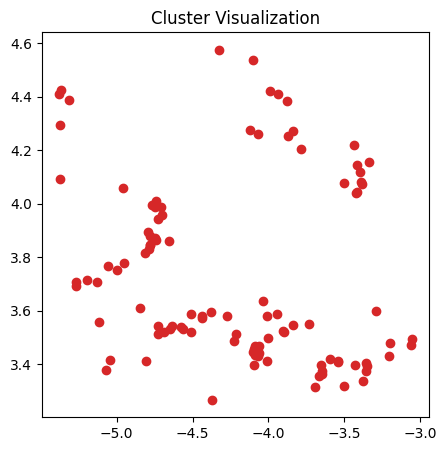

105
359 " we"
642 " no"
724 "}$"
805 "12"
844 " We"
1171 "of"
1231 "We"
1249 " 12"
1280 "ategory"
1323 " av"
1397 "ds"
1411 " against"
1439 "not"
1483 "itive"
1494 "pha"
1506 "atch"
1530 "agn"
1602 " beh"
1615 "by"
1621 " No"
1622 "ither"
1625 " sing"
1632 "iness"
1695 "ertain"
1699 "ining"
1715 "eter"
1718 " invest"
1733 " mot"
1765 "ump"
1770 " month"
1775 " sam"
1778 " indic"
1791 " leg"
1841 " things"
1853 "�"
1858 "ilar"
1872 " hist"
1883 "ream"
1907 " having"
1924 " record"
1925 " called"
1927 " rese"
1934 "AC"
1936 " vol"
1956 "egin"
1982 " US"
1987 "cont"
2002 "iron"
2015 "********"
2036 " net"
2039 " offic"
2045 " previous"
2057 " either"
2123 "ume"
2126 " employ"
2290 "Tr"
2301 " mil"
2302 "No"
2311 "})"
2346 "sequ"
2353 " beg"
2367 " ${\"
2388 "inter"
2436 " necess"
2493 " relations"
2581 " rather"
2668 " taken"
2698 ".)"
2719 " Rep"
2733 "gamma"
3002 "dro"
3388 " average"
3798 " usually"
4292 " individuals"
5170 " upper"
6540 "onald"
19313 " notification"
20832 " wafer"
211

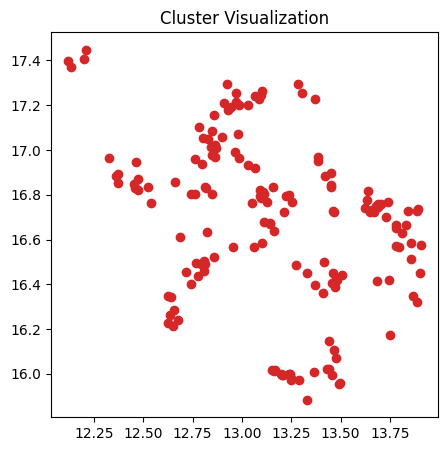

162
7241 " protocol"
10467 " Luc"
10554 " prediction"
10595 " Coll"
11028 "iry"
11651 " colleagues"
11685 " HTML"
11723 " healthcare"
11735 "Deb"
11839 " utility"
11932 "olving"
12104 "}})"
12140 " 1986"
12210 " 1985"
12244 " Community"
12336 " angular"
12471 " panels"
12624 " matrices"
12651 " Conference"
12672 " computing"
12694 " Elizabeth"
12757 " Children"
12763 "odynam"
12783 " boxes"
12793 " Dat"
12797 " switching"
12819 " featured"
12839 " caps"
12873 " connecting"
12878 " physician"
12892 "oro"
12904 " emotion"
12973 "lower"
12975 "holders"
13062 " 103"
13066 " cann"
13151 "othelial"
13195 " burning"
13214 " impression"
13224 " confident"
13315 "itudinal"
13316 "Bas"
13331 " Server"
13359 " differently"
13391 "114"
13395 "apsed"
13404 "rass"
13427 " lap"
13473 "tor"
13485 "images"
13533 " Toronto"
13537 "ressing"
13567 " affecting"
13569 "Del"
13576 " behaviors"
13596 " peaks"
13597 " dating"
13611 "~)"
13618 "God"
13632 "mma"
13637 " cultured"
13641 "Dem"
13646 "onomy"
13648 

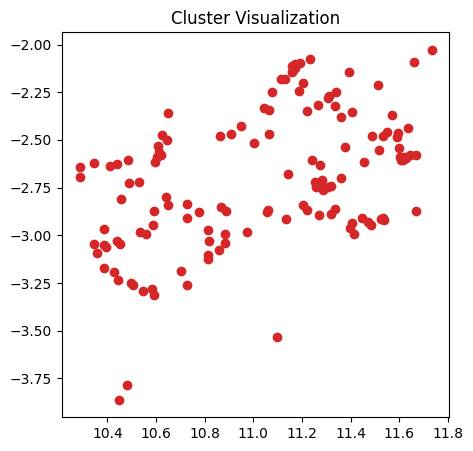

134
4050 " 2012"
4695 " 2008"
5331 " century"
5702 " professional"
6380 " genetic"
6622 "2013"
6863 " tight"
8012 "2008"
8487 " pH"
8794 " nu"
8821 "ensed"
9039 " calc"
9132 " meat"
9237 " syndrome"
9241 " principles"
9400 " topic"
9403 " normally"
9486 "private"
9512 "emia"
9620 " Pac"
9643 " Britain"
9648 " fairly"
9668 "aret"
9713 " addressed"
9793 " $["
9845 " entertain"
9855 "[""
9888 "century"
9952 "\^"
9990 " statistics"
9998 "-----------"
10038 " ec"
10039 " Spring"
10185 " receptors"
10223 " Play"
10233 "iture"
10349 " victims"
10505 "otox"
10651 " icon"
11106 " cited"
11217 " incorporated"
11218 " Championship"
11313 "ensor"
11663 " recru"
11674 " priority"
11694 " cock"
11993 " printing"
12051 " Wis"
12209 " forum"
12332 "Application"
12524 " decent"
12540 "env"
12569 "sett"
12849 "                                 "
12938 " SR"
13320 " divor"
13691 " legend"
13991 " suggestions"
14211 " loyal"
14352 "
	   "
16556 " laptop"
18024 " skilled"
19131 "once"
20244 " za"
20568 "Bin

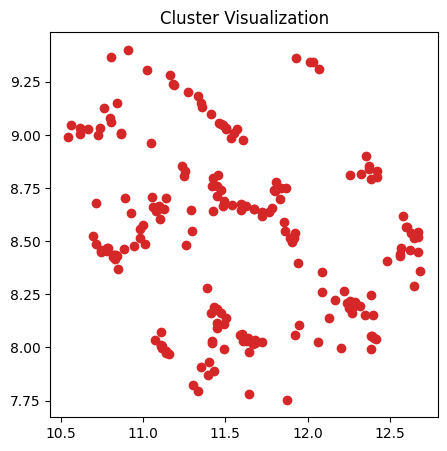

197
3308 " Thus"
6047 " Ca"
7910 "Two"
10674 "�"
10991 "inition"
11006 "infl"
12187 " è"
13354 "rophy"
13906 "ppers"
14091 "stud"
14131 "Thus"
14456 "global"
14660 "Life"
14844 "bean"
14926 " objection"
14944 "omed"
14977 " trauma"
15043 "metry"
15077 "oren"
15088 " secretion"
15136 " nec"
15143 " fantastic"
15328 "lay"
15462 "Sort"
15485 " tob"
15561 " litigation"
15577 " mutual"
15627 "too"
15678 "idase"
15791 "phones"
15856 " quit"
16066 " Motion"
16098 " CNN"
16509 "ル"
18288 "western"
23733 " Instr"
32664 " Allow"
33191 "okia"
33651 "Allow"
33840 "rops"
34151 " ensu"
34747 " Enable"
34803 "RED"
35143 " synthes"
35214 " regiment"
35242 "(+)"
35316 "SUPPORT"
35332 "Eu"
35388 " iterate"
35503 " Rosa"
35521 "pcm"
35590 " conquer"
35627 " Holl"
35736 "cadherin"
35739 " DIRECT"
35816 " migrant"
35936 " foreground"
36080 " embodied"
36124 " SIZE"
36218 " penicillin"
36376 "thereum"
36403 "ח"
36757 " devoid"
36770 " PLA"
36801 "amacare"
36980 "uthan"
37020 " monopoly"
37106 "dismiss"
37257

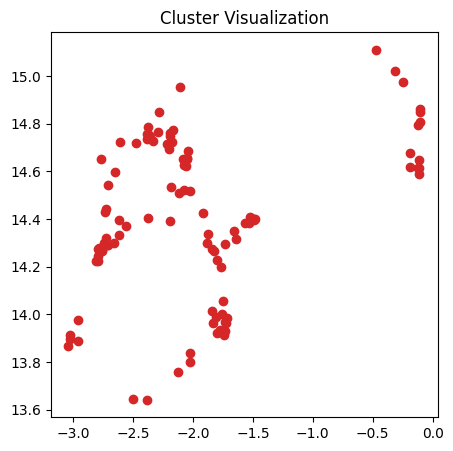

100
14620 " μm"
17127 " pleasant"
19415 " PDF"
19712 "?_"
20162 " psychology"
20876 " responsive"
22581 " annotation"
22588 "μm"
22637 " Quick"
22753 " updating"
22826 " shelf"
22848 "Xml"
23080 "Lat"
23180 " brutal"
23348 " Mn"
23407 "dor"
23464 " disclaim"
23514 " compensate"
23641 " LGBT"
23716 "ocity"
23737 " ruin"
23741 "]*"
23818 "aban"
23951 "iska"
23961 " Kay"
24017 "理"
24054 "Fragment"
24060 "&=\"
24145 " snapped"
24156 " swear"
24220 "running"
24225 " sometime"
24311 " upstairs"
24317 " ((("
24420 " TRUE"
24423 "berger"
24426 " visualization"
24476 " whisper"
24481 "little"
24521 " 216"
24601 " limbs"
24610 " shipped"
24654 " premier"
24722 "(%"
24802 " observable"
24861 " prayers"
24864 " supplementary"
24895 "ungle"
24924 " foolish"
24926 "ystems"
24966 "wl"
25050 "disabled"
25056 " Yellow"
25143 "administ"
25154 " cricket"
25169 " LS"
25241 " quotation"
25262 " wasted"
25392 "Little"
25587 " MV"
25753 " crashed"
25772 "366"
25802 "vars"
25834 " mutually"
25967 "abin"
25997

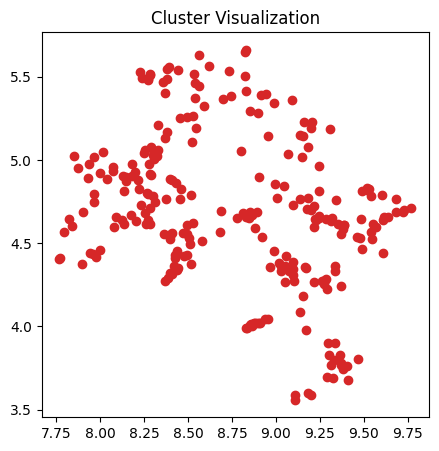

258
3482 " plaintiff"
7159 " defendants"
11076 " mathemat"
11475 "

               "
11567 " WARRANT"
13126 " Product"
13899 "sime"
14920 "without"
14935 " lets"
15219 "Vector"
15435 " Patrick"
15515 " sixth"
15931 "itored"
20893 " logging"
22564 " revolutionary"
35972 " Sebastian"
36553 "bows"
37305 " Developer"
37425 "ENRON"
37740 "ollah"
37781 " accusing"
38161 "isans"
39188 " insensitive"
39604 " Kommission"
39807 "rabbit"
39859 "起"
40032 " comrades"
40583 "rendre"
40758 " Mate"
41615 "mmr"
41757 "ukes"
42015 " uni"
42116 " quin"
42118 "astings"
42142 "determination"
42373 "ensely"
42379 "uku"
42499 " måste"
42644 " sf"
42954 " POP"
42958 " Handbook"
43141 " buds"
43167 "ная"
43273 " panor"
43466 "apest"
43481 "brance"
43662 " bleed"
43695 " chez"
43779 " Killing"
43931 "manship"
43990 "IAM"
44005 "aleigh"
44162 "]{}\^["
44202 " TFT"
44231 " extravag"
44302 " Zimm"
44324 " quenching"
44330 "記"
44365 "ionale"
44436 " allegiance"
44455 " psoriasis"
44476 " saber"
44507 " mound"
44614

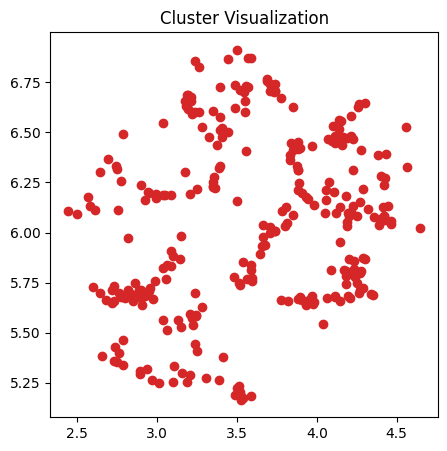

295
1 "<|padding|>"
112 "�"
638 " pre"
1188 "
                "
3059 "            "
3693 " avoid"
5452 "
       "
7601 " signaling"
8922 "ishment"
16167 " unity"
16737 " deleted"
17486 " Bart"
19259 "skip"
20337 "istrate"
21283 "�"
21882 " Say"
22439 "038"
22672 "
                                           "
22711 "umar"
22979 "cession"
23611 "imi"
24262 "                                                          "
24546 "                                                         "
25971 " FIF"
26164 "assembly"
26769 " blacks"
27913 " microarray"
28754 "burst"
30462 "

                       "
34210 ""
35418 "ensible"
37242 "                                                                       "
39183 " umb"
39472 "
	     "
40001 "hos"
41448 " postal"
42653 " Symbol"
42662 " 1902"
42731 "ubunt"
42787 "jpeg"
42854 "]>"
42905 "allows"
42965 " discouraged"
42972 "FV"
43001 " sincerely"
43157 "unched"
43216 "先"
43329 "osaurs"
43394 " classifications"
43416 " commut"
43432 "Applications"
435

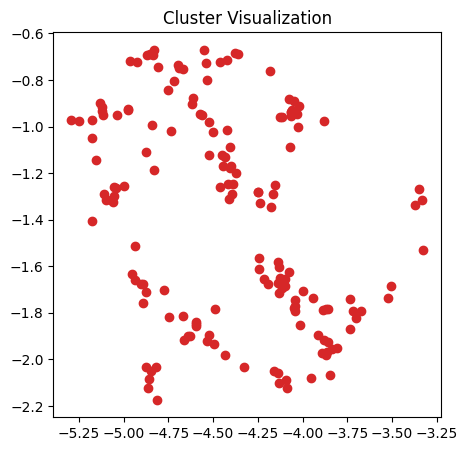

161
1379 " take"
2058 " At"
2070 " Le"
2335 " took"
2418 " State"
2635 " Then"
2829 " table"
2900 " solution"
2950 "46"
2956 " Par"
2991 " void"
3040 "leq"
3113 "with"
3161 "gress"
3209 "iddle"
3235 "Table"
3244 " exec"
3245 "83"
3269 "FF"
3327 " Pres"
3368 " experiment"
3430 " wrong"
3510 " types"
3550 "list"
3553 " leave"
3571 "63"
3600 " bur"
3639 "hood"
3640 " knowledge"
3698 " watch"
3731 " mis"
3749 " Intern"
3756 "ography"
3768 " aw"
3801 "IF"
3807 " und"
3808 " Some"
3810 "Err"
3817 " box"
3857 " &&"
3870 "iven"
3874 " town"
3897 " los"
3899 "met"
3938 "unk"
3948 " engine"
3952 "ρ"
3953 "94"
3956 "top"
3966 " etc"
3974 " é"
3977 " led"
3983 "eah"
3985 "length"
4001 "undred"
4003 "erve"
4030 " fine"
4042 " antib"
4073 " stress"
4076 " clean"
4090 "max"
4092 " serious"
4117 ",'"
4124 "ports"
4127 " treated"
4139 "ervice"
4141 "ы"
4143 " visit"
4163 " July"
4167 "ellant"
4169 "ь"
4178 " resid"
4184 " intern"
4210 "hors"
4211 " sold"
4216 " graph"
4221 "Par"
4246 "cember"
4255 " We

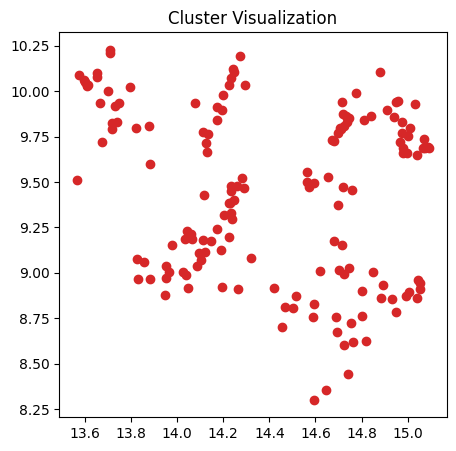

155
5752 " serve"
7442 " orient"
8046 " enable"
8457 "Because"
8605 " [["
9331 " fault"
9718 " Medic"
9840 " beta"
9979 " proud"
10013 " grab"
10195 "Many"
10196 " operate"
10205 " Water"
10251 " emphas"
10301 " restaurant"
10370 " bil"
10661 " polynom"
10774 " recom"
10778 ""
11064 " Rod"
11910 "ει"
12018 "Ev"
12341 "ropri"
12477 "mask"
13244 " fibr"
13276 " enables"
13352 "ilst"
13656 "THER"
13693 " myst"
13706 "uclear"
13759 "appropri"
13763 "token"
13821 "support"
13949 " occasionally"
13970 " trim"
13976 "!["
14159 " resin"
14239 " �"
14306 " pric"
14360 "member"
14361 "*(-"
14384 " deficiency"
14496 " snap"
14527 " prostate"
14576 "ea"
14589 " blocking"
14598 "[["
14738 "ById"
14831 "xs"
14888 " inject"
14889 "boy"
14922 "CB"
14998 " packed"
15011 "ouses"
15069 "fields"
15075 " emphasis"
15114 " restaurants"
15182 "erd"
15289 "OUND"
15309 "ать"
15676 " burned"
15694 " Person"
23651 " kissed"
31882 "orandum"
34458 "540"
34573 "rinos"
34994 " shattered"
35102 " impurity"
35183 "HA

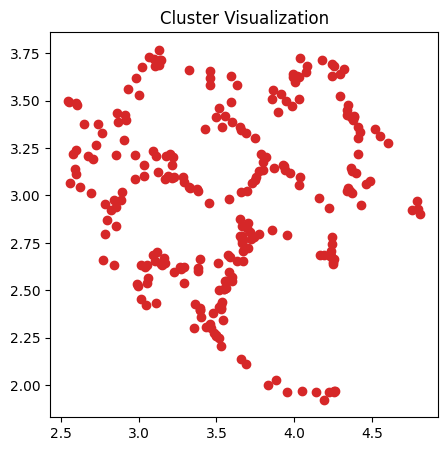

256
56 "W"
88 "w"
105 "�"
117 "�"
132 "�"
135 "�"
142 "�"
193 ""
197 ""
240 "�"
307 "ut"
325 "�"
381 "=="
396 " se"
487 "ib"
523 " cont"
539 "ition"
623 "		"
654 " <"
663 "lic"
669 " $\"
722 " dif"
845 " diffe"
931 "tern"
1025 "ized"
1111 " mat"
1444 " oper"
1486 " err"
1732 " techn"
1742 " prob"
2018 "alse"
3263 "
                                "
4119 "
                       "
4771 " server"
6530 "

      "
8129 " 
   "
13329 " encounter"
15030 "aten"
20426 "   
 "
24706 "mix"
25421 " detectors"
25425 " {};"
27449 "cester"
29442 " Harm"
30170 " booking"
44244 " ail"
44360 "政"
44660 " Ravens"
44698 " Superintendent"
44701 " overexpressed"
44842 " Holt"
44874 "wik"
44888 " 924"
45009 " reservoirs"
45035 " forbid"
45067 "schen"
45159 "082"
45480 " superintendent"
45688 " criticize"
45791 "hf"
45820 " motto"
45945 "charts"
46006 "Highlight"
46190 " 542"
46372 "bic"
46703 "pause"
46931 "))^"
46971 " supremacy"
46997 " Degree"
47067 " NIR"
47139 " Wrestling"
47140 " PPI"
47164 " handgun

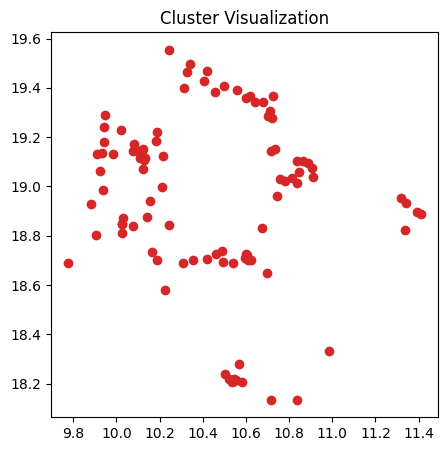

97
3657 " prevent"
4675 " hospital"
7030 "ammatory"
8580 " smile"
10259 " adhes"
10493 " $|"
10993 "GO"
11118 " signature"
11254 " deviation"
11270 " Comput"
11369 " engineering"
11373 " smiled"
11488 " GO"
11579 " Cur"
11609 " dish"
11726 " Rest"
11974 " washed"
12010 " Phot"
12110 "foo"
12144 " Standard"
12349 " Was"
12369 " Whether"
12414 " Without"
12529 " Lind"
12593 "
 
 "
12645 " recommendations"
12713 "ès"
12776 " Cond"
12935 "ogram"
13026 "Î"
13130 " labeled"
13240 " hospitals"
13322 " sizeof"
13372 " assistant"
13381 "126"
13538 " preventing"
13739 " corporation"
13901 "inflammatory"
14140 " Prim"
14150 " arrow"
14264 " resistant"
16063 " hesit"
16897 " prevents"
16940 " medications"
17114 " dishes"
17334 " $|\"
17388 " Engineering"
17392 " washing"
17401 " recommendation"
17574 " 126"
17575 " wages"
17607 " HTTP"
17613 "Rest"
17645 " beef"
17693 "ifference"
17696 " Senior"
17762 " Assistant"
17804 " afore"
17838 " AA"
17853 "Cond"
17866 "hene"
17897 " Edition"
17902 " cortic

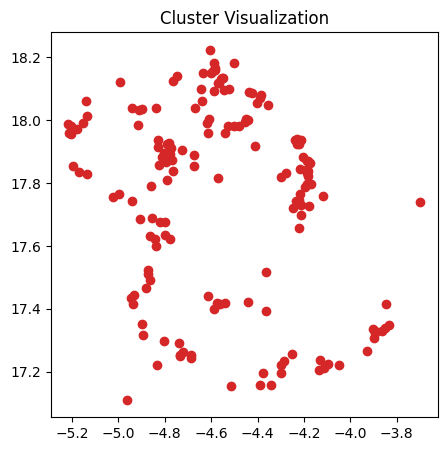

166
23553 "iduc"
24188 " spor"
24415 " Clear"
24563 " deer"
24600 " sensible"
24626 " doubts"
24634 "contains"
24693 "configuration"
24709 " Making"
24763 "erie"
24834 " sponsored"
24840 "CMD"
24843 " mai"
24853 " bridges"
24860 "ест"
24872 " Moz"
24902 "possible"
24922 " upright"
24934 " headache"
24941 " Kur"
24984 " indigenous"
24987 "vr"
24998 " retal"
24999 " Shaw"
25000 "Mary"
25006 " fasting"
25010 " Eventually"
25019 " oath"
25026 " accepts"
25055 "LAY"
25073 "yk"
25092 " corrobor"
25099 " possesses"
25115 "deal"
25121 "272"
25122 " promptly"
25125 "urchase"
25128 " doubled"
25131 "Ali"
25133 "456"
25148 " Diamond"
25150 " Pun"
25165 " 187"
25171 " bif"
25178 "iline"
25182 "Sports"
25183 "avia"
25191 "Writ"
25196 " Stars"
25199 " Hunt"
25205 " devastating"
25206 "deb"
25209 "pipe"
25232 "hesis"
25236 " Muh"
25242 "ých"
25246 ")!"
25254 " blades"
25259 " eighteen"
25269 " ה"
25271 " ·"
25272 "kern"
25273 " degener"
25274 " multif"
25280 "CLUS"
25283 " toe"
25288 " pistol"
25289 

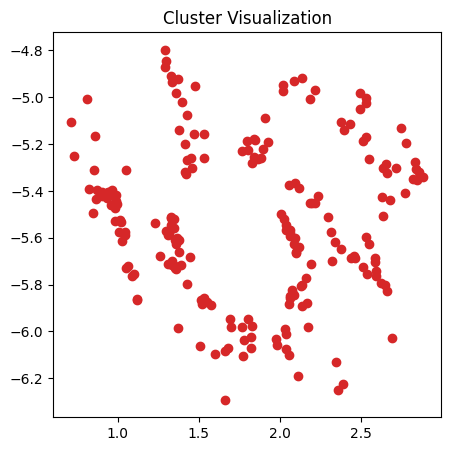

212
5413 "]\],"
5541 " lip"
5648 "SH"
5721 " Fe"
5874 " Wil"
6017 "sem"
6397 " Mat"
6445 " Jes"
6469 " 2003"
6494 " billion"
6495 " Great"
6511 "faces"
6512 " Bel"
6539 " Alex"
6606 "rive"
6612 " reality"
6625 " Rob"
6679 "ogene"
6684 " developing"
6732 "nbsp"
6757 " agency"
6775 "rivate"
6784 "MR"
6787 "ifications"
6805 " architect"
6832 " substantial"
6835 " intellig"
6843 " explicit"
6844 ")""
6890 " changing"
6906 " thin"
6907 " angle"
6935 " Lem"
6936 " skills"
6954 "ocytes"
6962 "supplementary"
6964 "duc"
6974 " scheme"
6983 " recall"
6985 " tub"
6999 "$("
7002 " fourth"
7005 " om"
7032 " capable"
7033 " relates"
7068 "iner"
7076 "mand"
7079 " +="
7083 "cr"
7084 "SL"
7094 " entirely"
7096 "xe"
7100 "press"
7102 " guide"
7110 "has"
7121 " River"
7138 " brand"
7144 " gly"
7145 " corner"
7146 "Click"
7147 " versus"
7149 "す"
7158 " accord"
7166 " ju"
7172 "oday"
7175 " forg"
7183 "�"
7187 "bal"
7188 " Ver"
7189 " incub"
7193 "ailed"
7194 " mainly"
7204 " jour"
7207 " philos"
7210 "va

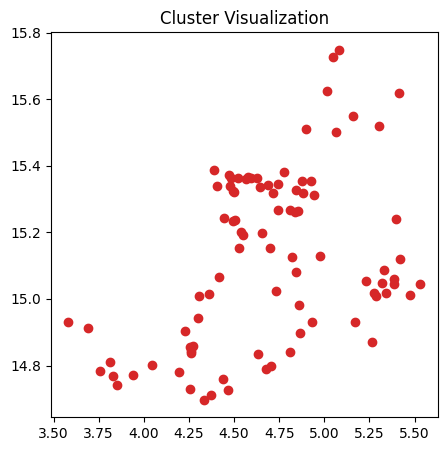

90
2891 " tax"
10474 " taxes"
10615 " Lie"
11810 " petitioner"
11823 " ignore"
11944 " prelim"
13280 " retain"
13488 "$]{}"
14741 " PHP"
14813 " typedef"
14973 "utenant"
15022 " Clinical"
15153 " traveling"
15170 "ikipedia"
15350 " Bad"
16525 "----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------"
16550 ")$-"
16663 " alterations"
16678 " Sex"
16753 " pose"
16803 " catalyst"
16912 " Import"
17085 " investigators"
17205 " redist"
17211 " philosoph"
17225 " conced"
17242 " WHERE"
17561 " activate"
17692 " enrolled"
17743 "typedef"
17855 " Site"
17887 " feasible"
18082 " spokesman"
18083 "!\"
18160 " Petitioner"
18231 "ellees"
18281 "Share"
18338 " worthy"
18406 " collections"
18508 "inces"
18566 "does"
18649 " deadly"
18768 " entang"
18811 " flew"
18849 " cumulative"
18856 "\;"
19057 "hidd

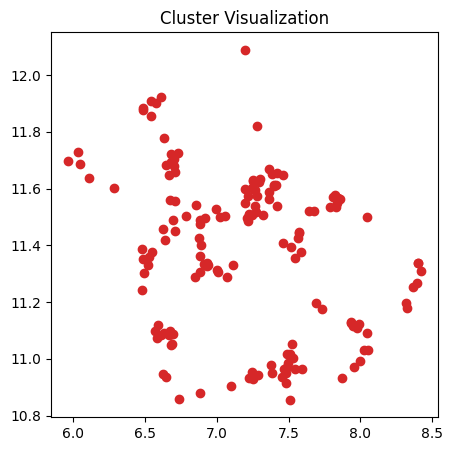

159
3164 " probably"
3270 " anti"
7325 "imately"
8574 " coffee"
8797 " Muslim"
9496 "}}^{"
10488 " thirty"
12129 " distinguish"
12353 " actor"
12962 " Mas"
13286 "
               "
14024 "}}_{\"
14515 " Inn"
14826 " Fisher"
14929 " Pur"
15366 " Ka"
15550 " transient"
15992 "Sk"
16067 " glyc"
16222 " devoted"
16321 "xxxx"
16336 " Sab"
16384 " wrap"
16405 "iga"
16431 " boards"
16492 " Muslims"
16503 " mistakes"
16656 " incon"
17758 "028"
17896 "bigl"
18205 " luc"
18567 " Anti"
18717 "KK"
19082 " ridiculous"
19146 " trab"
19229 " Buff"
19707 " shear"
22386 "abol"
22512 " Heat"
26398 "_{(\"
27017 " realizing"
27194 " waved"
27692 " Probably"
30612 "JD"
31330 "probably"
32033 " tapped"
32798 " gh"
32800 " magnitudes"
33849 " Gender"
33874 "aporation"
34080 " illumin"
34188 " fixture"
34211 " Million"
34230 "430"
34244 " tb"
34245 "dispatch"
34253 " aids"
34292 " 978"
34352 " sinking"
34388 "volatile"
34393 "aiser"
34396 " Ran"
34401 "uest"
34404 " toxins"
34413 " Silicon"
34424 "bibliograph

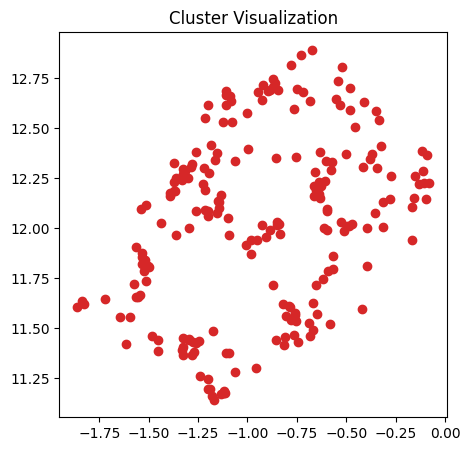

211
22208 "ichi"
22719 ")","
22767 "reed"
23156 " deux"
25808 " crosses"
27210 " blotting"
27582 "�"
27837 "Rh"
28336 "Recent"
28826 " predictable"
29911 " SG"
30112 " Egg"
30850 "oietic"
30968 "codes"
31001 " starch"
31115 " thankful"
31392 " cassette"
31431 " lign"
31525 " theology"
31535 "Dynamic"
31540 " Bach"
31543 "440"
31574 " Bras"
31630 "Patient"
31646 "agem"
31652 "flies"
31730 "643"
31755 " Logan"
31761 " planting"
31769 " photographic"
31770 ""("
31832 " retard"
31834 "amba"
31836 "cled"
31837 " Sau"
31852 " disappearance"
31870 "India"
31878 " Hait"
31881 " Inspector"
31887 "Flor"
31911 "omonas"
31912 "니다"
31913 " Antar"
31924 " clan"
31928 " años"
31936 " lamin"
31937 " cognition"
31939 " phospholip"
31946 " anomalous"
31950 " 306"
31953 "baz"
31956 "�"
31961 "="${"
31965 " Sections"
31970 " cyn"
31972 " rankings"
31980 "Rules"
32002 " 370"
32010 " catches"
32022 " sous"
32025 "REEK"
32029 "currency"
32042 " Pierce"
32044 "<_"
32063 " wo"
32075 "maven"
32096 "ibil"
32098 

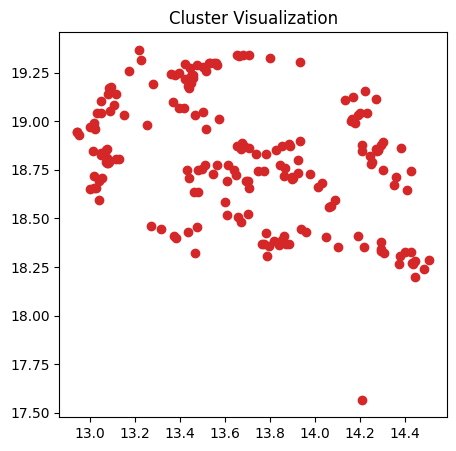

192
10420 "minus"
11352 " delete"
11389 "Further"
11605 " Ra"
11716 " provider"
11819 " Steve"
11960 " Bal"
11967 " providers"
12023 "Server"
12107 " protective"
12119 " upload"
12133 "bes"
12207 " acceptable"
12219 " pointer"
12258 " regarded"
12271 "ät"
12276 " Introduction"
12308 " harvest"
12331 " tied"
12334 " moon"
12377 " }}"
12384 "rooms"
12391 "«"
12447 " Rose"
12463 "estyle"
12464 " Lett"
12473 "bury"
12480 " mixing"
12485 " associations"
12490 "lined"
12495 " epidem"
12498 " Minn"
12507 "Δ"
12521 " Ash"
12541 " residual"
12542 "uations"
12543 "install"
12545 "ifting"
12556 " tent"
12557 "copy"
12560 "Exec"
12563 "also"
12565 " Univers"
12578 " FBI"
12584 "alo"
12596 "atile"
12597 " Quant"
12599 "Local"
12606 " auf"
12618 "Header"
12633 " folks"
12642 "cycl"
12643 " 118"
12657 " drain"
12673 " Ford"
12680 " intense"
12681 " reputation"
12690 "fact"
12693 " UI"
12702 " lifetime"
12715 "LY"
12717 " tang"
12727 "aga"
12730 "115"
12733 " plasm"
12741 " infect"
12743 " Officer"
12

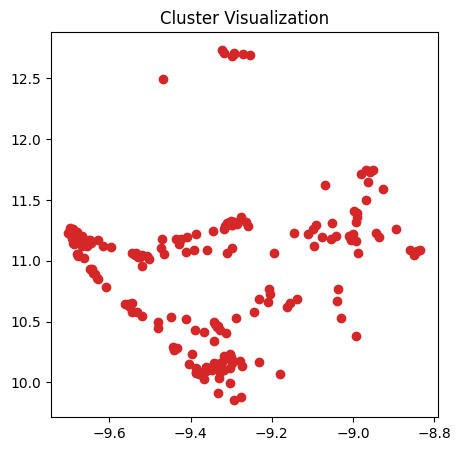

202
25679 "dialog"
26124 " LT"
26225 " elevator"
26427 " dehydrogen"
26446 "=============="
26583 " MN"
26613 "district"
26829 " Drop"
26883 " odor"
26945 "Generator"
26955 "dal"
26962 " Experience"
26989 " Asp"
27001 " rested"
27193 "Notification"
27238 " Eddie"
27265 "Enable"
27286 " Powell"
27317 " lobe"
27330 " cytotoxic"
27337 "failed"
27345 " tib"
27360 " 285"
27383 "Install"
27424 " Historical"
27428 " {'"
27450 " chill"
27452 " Evolution"
27469 "ipot"
27497 "inj"
27520 "iji"
27547 "Attr"
27558 " implementations"
27574 " heights"
27598 " 1937"
27609 "itin"
27613 " playoffs"
27618 "[]$"
27619 "rates"
27624 " renamed"
27652 "^/"
27653 " Pink"
27657 " rc"
27661 "�"
27670 " retailers"
27676 "encoding"
27682 "Kim"
27715 " concealed"
27717 " Lan"
27719 " disregard"
27721 "horn"
27726 " brom"
27737 " Bog"
27743 " polype"
27745 "overflow"
27750 "�"
27751 " Vermont"
27755 "acillus"
27756 " Idaho"
27757 "Wrapper"
27760 "apshot"
27767 "WK"
27775 " dipole"
27776 " airline"
27779 " Herr"
277

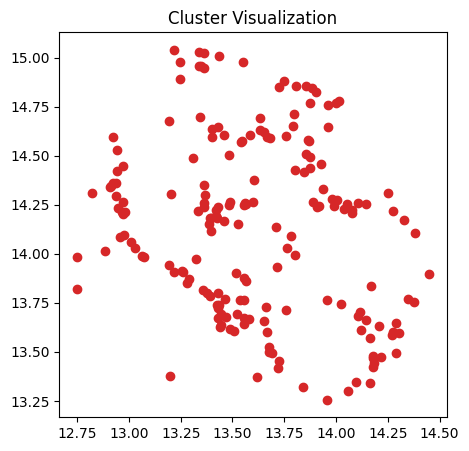

186
1691 " put"
7678 "ée"
8398 "Thank"
8611 " �"
8618 " sugar"
10086 " tall"
10400 " Pers"
10715 "Mode"
11770 " у"
11773 "Mc"
12044 "adium"
12112 " flexible"
12277 " assays"
12389 " nit"
12854 "acco"
13011 ";">"
13085 " constitu"
13096 " ett"
13129 "さ"
13254 "adelphia"
13343 " Prem"
13378 "Cle"
13379 " beliefs"
13557 " politicians"
13562 " detector"
13610 "在"
13625 " Ross"
13644 " publicly"
13647 " nos"
13704 "      "
13861 "hbar"
13889 " dying"
13931 "lyn"
13956 "join"
13974 " empir"
13990 " eleg"
13992 " Daily"
13999 " Cho"
14054 "atom"
14132 "Da"
14163 " allegedly"
14171 "ни"
14232 " punishment"
14235 " clinic"
14281 " producer"
14289 " Philadelphia"
14309 " Live"
14326 "lit"
14330 "ées"
14381 "ims"
14383 " Gil"
14422 "Show"
14427 "iac"
14443 " motif"
14476 "ASK"
14495 " proportional"
14497 " adip"
14503 "olves"
14532 " SL"
14533 " Brother"
14538 " Summer"
14551 " obsc"
14571 "seq"
14580 " graphs"
14593 " lake"
14594 "Sun"
14615 "driv"
14622 "inent"
14658 " ♪"
14664 " buff"
14672 " 

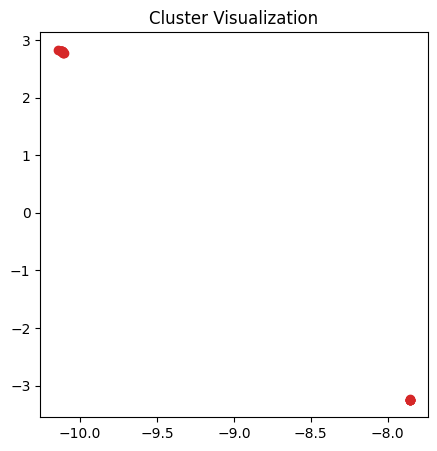

21
1890 "$$"
2138 "}$$"
4700 ".$$"
10878 "}.$$"
11127 ").$$"
11189 ")$$"
11227 ",$$"
14640 "},$$"
16489 "),$$"
18822 ".$$"
26325 ",$$"
30848 "}}$$"
32964 "}}.$$"
39077 "\}.$$"
40227 ")}$$"
42348 ")}.$$"
42465 "}},$$"
43214 "}).$$"
43742 "})$$"
44524 "].$$"
49806 "]$$"


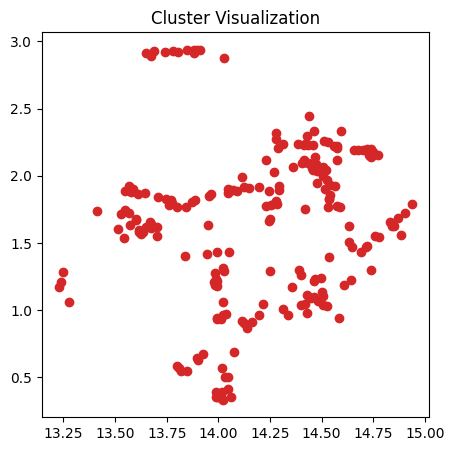

218
7066 " Web"
8870 " rational"
9074 " Fil"
9651 " Police"
10043 " Royal"
10104 " profiles"
10136 "tx"
10156 " selling"
10173 " calculate"
10200 " Common"
10234 " translation"
10600 "obs"
11516 " converted"
12812 "email"
12868 " filling"
14292 "hythm"
14785 "mind"
34931 " dosing"
35262 " Sophie"
36425 "laughter"
36689 " informing"
37232 " tsp"
37271 " discard"
37372 " externally"
37991 "Ks"
38032 "557"
38237 " Classical"
38280 "630"
38521 " lineback"
38661 " downloads"
38716 " boasts"
38768 " analyzer"
38783 " Alexandria"
38803 "QW"
38987 "ennial"
39089 "KC"
39207 " Moving"
39241 " relativity"
39253 "BIO"
39326 "ROW"
39348 " encontr"
39391 " linker"
39403 " lender"
39499 " vacu"
39502 "FILES"
39521 "nah"
39535 " Buc"
39547 "Radius"
39582 " Drum"
39584 "tit"
39586 "}{~"
39587 "opro"
39600 "CPP"
39632 " Programs"
39642 "stay"
39643 "aturing"
39674 "Bron"
39685 "Ven"
39688 " Epic"
39708 " reflux"
39719 " landmarks"
39756 " CCL"
39763 " multiplying"
39781 " ceremonies"
39820 "edes"
39873 

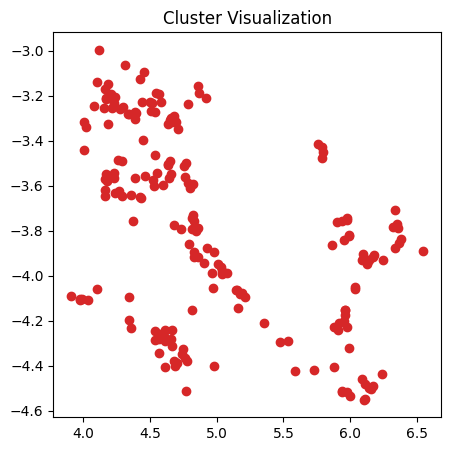

203
2305 " Mr"
4483 " allows"
4618 " wide"
5140 " construction"
5770 " mg"
5864 " association"
5961 " bone"
6000 " Every"
6018 " Ke"
6055 " protection"
6278 " square"
6341 " measurements"
6400 " lung"
6519 " speech"
6528 " Addition"
6543 "ampions"
6715 "х"
6842 "reshold"
6941 " allowing"
6979 " imaging"
7010 "$$\"
7061 " Hill"
7071 " defect"
7092 " implementation"
7123 " sides"
7131 "uesday"
7161 "Where"
7363 " scores"
7415 ")^{"
7528 " Bre"
7548 " boundary"
7559 "Ge"
7572 "fess"
7587 " trials"
7618 " Carol"
7628 "}=\"
7677 " stret"
7681 " technical"
7682 " Den"
7696 "ponse"
7742 " radiation"
7761 "System"
7769 "defined"
7804 " Rule"
7807 "brid"
7812 " Mont"
7832 " partner"
7901 " 1990"
7913 "mg"
7916 "layout"
7951 "
	"
7964 " definitely"
7971 " facilit"
7982 " metric"
7995 " Fore"
8010 " PA"
8064 " funds"
8089 "fold"
8102 "dict"
8142 " fashion"
8143 " perm"
8170 " Central"
8177 "urop"
8191 " informed"
8214 " expensive"
8244 " closely"
8249 " scientific"
8267 "Every"
8270 "seud"
8271 "

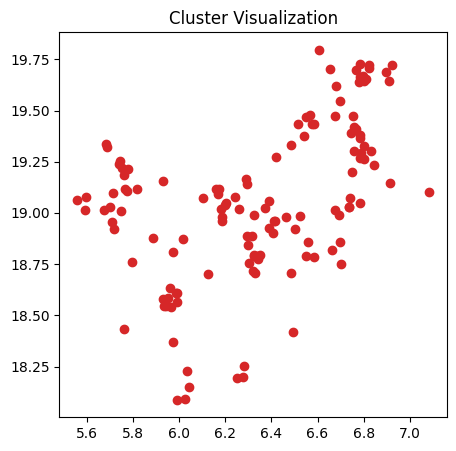

132
5416 " ensure"
5559 " Google"
13996 "Step"
15586 " struggling"
16154 " prisoners"
16591 "Express"
16635 "herical"
17015 "131"
17479 "filename"
17610 " voluntary"
17681 " fracture"
17689 "igious"
17749 " ensuring"
17899 " google"
17985 " esp"
18104 "900"
18286 "arently"
18306 " influenza"
18388 " gaps"
18404 " pancreatic"
18417 " 1965"
18435 " Summary"
18451 " Credit"
18585 "loss"
18641 "protected"
18642 "upt"
18652 " employers"
18687 " delta"
18698 "tv"
18752 " dropping"
18770 " Much"
18773 " Yan"
18777 " churches"
18791 " limb"
18792 " dancing"
18803 " corners"
18807 "eton"
18832 "039"
18835 "mk"
18915 " tackle"
18926 " lungs"
18934 " crude"
18948 "June"
18949 " zijn"
18952 " Step"
18975 " Gary"
18978 "Meanwhile"
18982 "schema"
19014 "uin"
19045 "ometers"
19056 "Plaintiff"
19077 " probation"
19081 " inoc"
19086 " halt"
19096 " Emb"
19098 " genre"
19136 "232"
19142 " comprise"
19144 "年"
19145 " fulfill"
19155 " dub"
19161 "platform"
19162 " pac"
19169 " lin"
19170 " pediatric"
1919

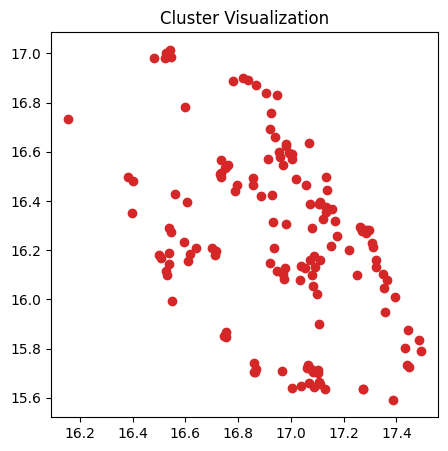

145
8874 " Acc"
10364 "ologist"
10402 " crew"
10842 "tml"
11206 " gauge"
11278 "estinal"
11324 " BR"
11328 " Davis"
11391 "adel"
11396 " >>"
11401 " Invest"
11404 "prov"
11405 " Design"
11412 " Music"
11413 "owa"
11416 "iley"
11424 " explains"
11428 " spokes"
11430 "eh"
11434 "itudes"
11448 "worth"
11450 " cha"
11452 " receiver"
11462 " printed"
11468 "=-"
11470 "'),"
11482 " decor"
11490 " impair"
11498 " scales"
11501 "Access"
11503 "rosis"
11504 " elder"
11506 " Proposition"
11512 " resolved"
11513 " 1988"
11514 "щ"
11515 " languages"
11521 " falls"
11523 "sex"
11524 "ét"
11525 " hoping"
11526 " scheduled"
11535 "ENSE"
11538 "Ap"
11540 "Ident"
11543 " unlikely"
11554 "kit"
11568 " Dig"
11570 " personnel"
11583 " 91"
11586 "United"
11591 " ell"
11594 "Function"
11604 " Current"
11613 "oplus"
11614 " 86"
11617 " deeply"
11618 "vm"
11621 " tren"
11626 " opinions"
11627 " coordinates"
11629 " Local"
11631 "column"
11638 " convenient"
11639 " disturb"
11644 "ologists"
11647 "ны"
11658 " 

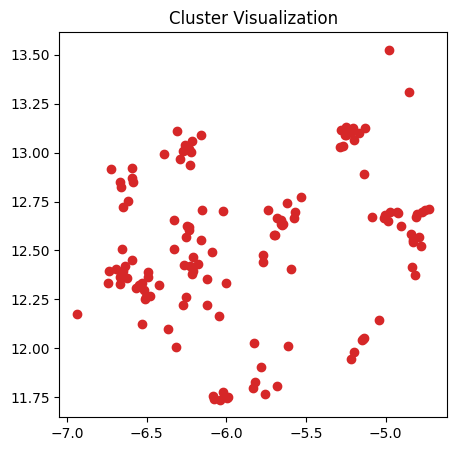

138
23375 "November"
23986 " meditation"
24472 " Liu"
24884 "bootstrap"
25163 "doing"
25224 "hon"
25381 "yses"
25554 "ocarcinoma"
25607 " RM"
25684 "LEV"
25686 " Mans"
25714 " Cool"
25726 " IEEE"
25844 "INIT"
25864 "ingo"
25913 " Fine"
25950 "encode"
26017 "fits"
26126 " flames"
26131 " debts"
26231 " Respons"
26245 "astics"
26344 "ש"
26409 "3333"
26410 "otine"
26439 "*/*"
26472 " 227"
26516 " epigen"
26594 "とい"
26621 "moving"
26629 "tawa"
26638 " cues"
26668 " aggravated"
26705 " IDE"
26724 " vanilla"
26772 "当"
26786 " (\<"
26828 " applicants"
26889 "RM"
26896 " humble"
26920 " licensing"
26931 "seg"
26952 " helpless"
26985 "princ"
26986 " clut"
27004 "COP"
27007 " evidenced"
27102 " CNS"
27107 "�"
27169 "terms"
27174 "('."
27211 " Strateg"
27227 " OB"
27248 "nine"
27304 " mines"
27314 " Capitol"
27328 "ного"
27371 " specialists"
27375 "spr"
27380 "nar"
27440 "PB"
27499 "namese"
27500 "Rows"
27602 " muscular"
27606 " renewable"
27650 " že"
27731 " towers"
27763 "%="
27858 " swung"
278

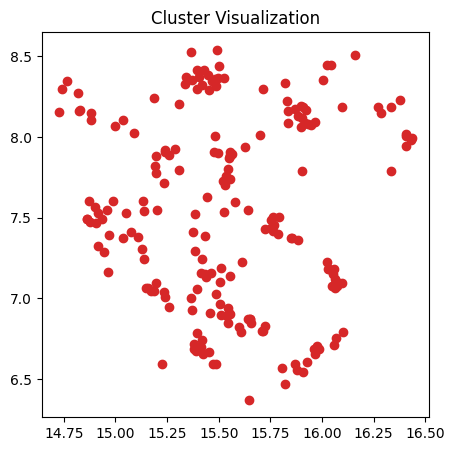

204
61 "\"
5429 "



"
5639 " foreign"
7890 " Use"
8488 " lift"
8863 "




"
9183 " candidates"
9221 " Haw"
9484 " symbol"
9609 "elly"
9798 " teach"
9852 "pin"
9904 " coupled"
9943 " Australian"
9966 " Director"
10037 "alls"
10057 " volunte"
10079 " Town"
10101 " horm"
10122 " >="
10148 ""}]("
10174 ".^[@"
10212 " waves"
10252 "Red"
10255 " Columb"
10256 " taught"
10347 " prepare"
10447 " 69"
10461 "upid"
10483 "close"
10491 " sampling"
10544 " elected"
10547 " Cross"
10633 "nie"
10641 "wr"
10658 " narr"
10690 "WR"
10706 "types"
10765 " Francisco"
10781 " hypert"
10816 "person"
10845 "PAR"
10846 " artists"
10866 " whis"
10929 " Mic"
10941 " comparing"
10994 "metric"
11387 "Top"
11678 " everywhere"
11740 " Value"
12126 " Santa"
12151 " Lead"
12577 "\,\"
12933 " Sav"
12958 " guests"
13073 "arded"
13261 "acht"
13464 "ockey"
13589 "ente"
13948 " enemies"
13984 "gged"
14017 "Sing"
14036 " intracellular"
14175 "ogs"
14206 "/."
14217 " symbols"
14237 " representations"
14273 "offs"
14279 "DW"

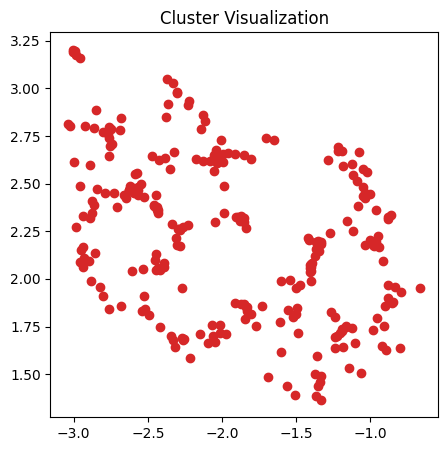

267
57 "X"
95 "~"
451 "ial"
468 "per"
659 " St"
688 "In"
702 "ount"
708 " &"
765 "�"
766 "ause"
778 " may"
848 " 201"
884 " 10"
906 " result"
911 "ex"
926 "fig"
928 "iel"
942 "ments"
945 " var"
946 " spec"
964 "."
976 "uch"
981 "uring"
992 "ateg"
993 "pos"
994 " ent"
998 "St"
1010 "15"
1022 "imes"
1030 " const"
1033 "sp"
1035 "(\"
1036 "16"
1037 "ically"
1041 "hes"
1047 "14"
1048 " long"
1049 " ap"
1058 " ke"
1063 "ger"
1077 " very"
1080 "ator"
1087 "pr"
1088 "read"
1090 "ince"
1091 " return"
1093 "18"
1101 " inte"
1106 "way"
1115 " anal"
1116 "arch"
1123 "ave"
1129 " med"
1133 " hand"
1135 "upp"
1145 "An"
1149 " gu"
1150 " loc"
1152 "а"
1154 "cent"
1156 "text"
1162 " et"
1163 " :"
1164 "ank"
1165 " Q"
1169 "ases"
1176 " Com"
1178 "set"
1186 " "
1190 "yl"
1196 "rence"
1200 "sh"
1204 "ism"
1205 "eng"
1206 "tr"
1209 "cer"
1210 " ins"
1213 " str"
1214 " @"
1215 "ense"
1216 "ner"
1218 " ra"
1221 "ret"
1223 " while"
1228 "))"
1233 " prote"
1241 "els"
1245 "ified"
1248 "formation"
1254 " \[[

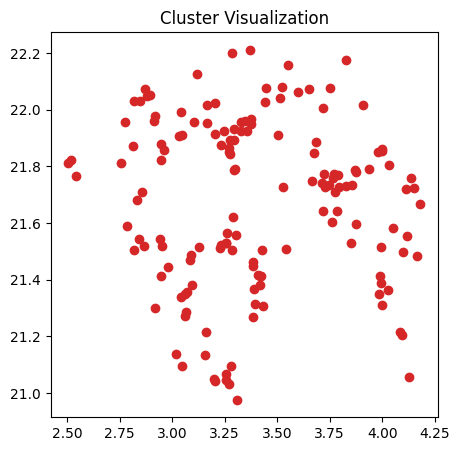

150
18962 "141"
19318 "parency"
19458 "entric"
19603 "162"
19686 "COL"
19811 " Ald"
19893 "distance"
19914 "ementia"
20129 "government"
20197 "[*"
20258 " hierarch"
20296 " lacked"
20302 "antes"
20361 " Pod"
20394 "been"
20411 "Pod"
20422 "�"
20427 "ertainly"
20444 "inea"
20475 ""
20485 " §§"
20497 "atible"
20510 " Por"
20514 " GB"
20522 "gluc"
20576 "Instead"
20594 "acting"
20620 " contradiction"
20623 " catalog"
20637 " supernat"
20647 "�"
20655 "Frank"
20657 "urry"
20680 "405"
20681 " Larry"
20694 "228"
20695 " MIT"
20706 " coalition"
20718 " Memorial"
20731 " poster"
20733 "prising"
20755 "ctomy"
20761 "uese"
20793 " constrained"
20804 " unrelated"
20805 "(:"
20807 " DS"
20812 "050"
20833 "�"
20840 " Past"
20844 "lip"
20855 "文"
20860 " Equation"
20874 " classroom"
20900 "Storage"
20903 " sperm"
20913 " conceived"
20916 "immune"
20931 " Benn"
20941 "FW"
20942 " warnings"
20945 "ellers"
20950 "roe"
20951 " potatoes"
20957 "ahu"
20958 " Alliance"
20971 " mast"
20976 "cutaneous"
20982

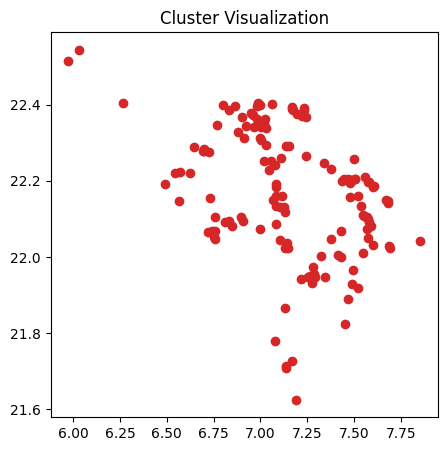

140
1633 " something"
9569 " introduce"
11628 " Queen"
16984 " introducing"
17268 " creatures"
17893 "itzerland"
18580 " awful"
18784 " trains"
18806 " και"
18905 "Follow"
18908 " Switzerland"
19041 " deputy"
19044 "302"
19089 "sy"
19102 "offic"
19129 " wir"
19166 " Follow"
19172 " Dean"
19234 "Something"
19237 " Philos"
19244 " Instit"
19249 "oval"
19280 "puted"
19289 "}_{-"
19298 " Brun"
19312 " -----"
19329 " KIND"
19330 " Counsel"
19336 " knocked"
19339 "University"
19342 " Griff"
19352 "Sample"
19370 " refriger"
19374 "ioni"
19383 " Living"
19384 "irs"
19393 "Gal"
19397 "fat"
19402 "properties"
19406 "vee"
19411 "cpu"
19414 " engineers"
19432 " probes"
19438 "agu"
19440 " precedent"
19444 " unlock"
19447 "Cast"
19448 " reproductive"
19452 "activ"
19454 " europe"
19456 " silly"
19470 " |="
19478 " qualify"
19484 "parameter"
19489 " charity"
19490 "245"
19491 "aments"
19493 "umble"
19497 " keen"
19501 " breakdown"
19504 "Invalid"
19506 "say"
19509 " camps"
19510 " ninet"
19511 "rese

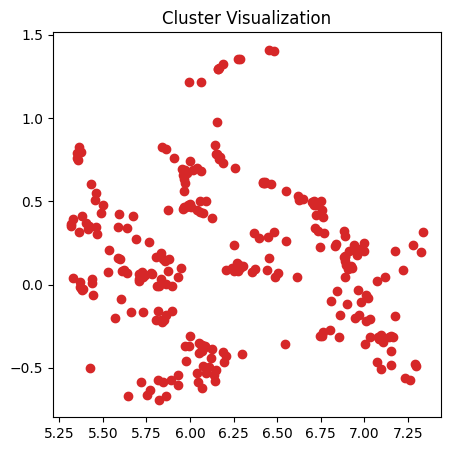

268
0 "<|endoftext|>"
2 "!"
32 "?"
133 "�"
145 "�"
150 "�"
156 "�"
198 ""
199 ""
210 ""
225 "�"
441 " us"
551 " {"
618 " sa"
741 "clud"
838 " pres"
843 " det"
873 " set"
1378 "rt"
3033 " bound"
3064 " difference"
5640 "                       "
5795 " alternative"
7833 "
            "
8926 "

  "
8984 " disorder"
9219 "                            "
10033 "                               "
12985 "cache"
14222 "
                                   "
14686 "                                          "
15049 "interface"
16129 "190"
16794 "apper"
18201 "ighed"
19390 "exists"
21045 "043"
21653 " magical"
22089 "heads"
24078 "rise"
28097 " brig"
28870 " nuest"
33464 "horizontal"
44560 " Exposure"
44817 " 521"
45624 "elves"
45706 " Analyses"
45850 " hw"
46195 "rokee"
46479 " \|_{"
46795 " Bosnia"
46800 "ач"
46881 " outfits"
46976 "'):"
47088 " CMOS"
47186 "'?""
47331 " quotations"
47409 " CAB"
47478 " TBI"
47592 "Characteristics"
47730 "autres"
47737 "VEGF"
47753 " remorse"
47771 "corresponding

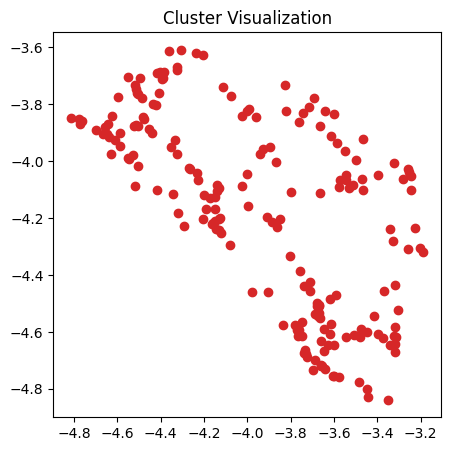

199
2603 " source"
3548 " isn"
3632 " random"
3854 " Suppose"
3856 " Here"
3905 " La"
3989 " construct"
4013 "Oh"
4281 " Dem"
4446 " drive"
4471 " multi"
4477 " authors"
4487 " Department"
4497 "Well"
4508 " containing"
4538 "Sec"
4570 "perty"
4580 "irt"
4600 " sleep"
4612 "Def"
4630 " stru"
4673 " Sen"
4698 "mark"
4707 " hair"
4709 " fear"
4740 "aste"
4750 " staff"
4755 " obvious"
4757 " strength"
4759 " green"
4762 "rep"
4769 "Time"
4775 " Health"
4785 "PP"
4788 "adem"
4801 "orney"
4802 " connected"
4803 " rules"
4807 "Int"
4808 " skin"
4818 "pol"
4824 " carried"
4828 " counter"
4836 " task"
4837 "iling"
4843 "asc"
4845 " placed"
4846 ")**"
4851 " cit"
4862 "overline"
4865 " binding"
4866 " movement"
4874 " liqu"
4890 " """
4898 " height"
4917 " yield"
4920 " mort"
4939 "cules"
4943 "Here"
4948 " forms"
4955 " org"
4966 "ATE"
4973 " sources"
4974 " Sub"
4976 "DR"
4981 " util"
4982 ""},"
4985 "OO"
4992 "η"
4994 "erved"
4995 "utive"
4996 " intr"
4997 "func"
5001 " regarding"
5008 " con

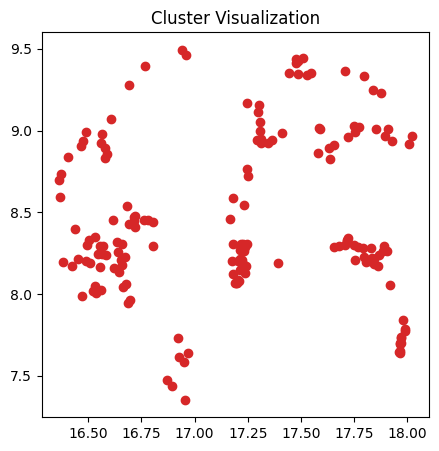

171
5990 "GL"
9628 " sharing"
9653 " GL"
9780 "AK"
9891 " owners"
9964 " Victor"
10063 " Blue"
10140 " corresponds"
10178 "had"
10206 "CG"
10271 "ī"
10327 "OF"
10369 " seriously"
10373 "aterials"
10387 "including"
10410 " chlor"
10430 " sending"
10460 "�"
10470 " smoking"
10479 "hemat"
10523 " 78"
10552 " complications"
10555 "ograp"
10563 "asive"
10566 " NA"
10657 " Pak"
10671 " quantity"
10702 " elevated"
10705 " marker"
10753 " females"
10794 " inval"
10815 " cytok"
10817 "="#"
10841 "plet"
10860 "URE"
10888 "ochemical"
10890 " PS"
10903 " struck"
10905 "onto"
10930 "WS"
10938 " controlling"
11080 " thorough"
11087 " 73"
11099 " Version"
11103 " Build"
11121 " thinks"
11130 " 84"
11230 "istical"
11383 " frequencies"
11539 "rients"
11615 " Scient"
11799 "evin"
11832 " Son"
11891 " awareness"
12054 " reasonably"
12537 "illary"
31612 " augmented"
34846 "\}}"
35106 "unto"
35275 "thin"
35325 "Controls"
35466 "556"
35561 "Picker"
35628 " Classification"
35722 "OutputStream"
35813 "udad"
3

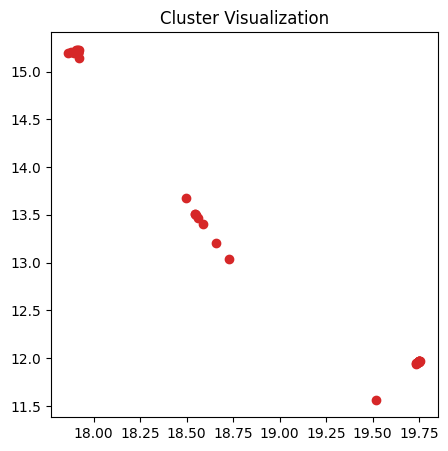

37
3520 " physical"
5079 " civil"
5352 " fresh"
6224 " sales"
8912 "allow"
10109 " Civil"
10821 " gang"
10949 " covers"
11022 "pad"
11074 " trav"
11126 " (“"
11188 " PL"
11249 " herein"
11364 "DI"
11376 " About"
11796 "Art"
22344 " Sales"
22606 " Physical"
27150 " wiped"
28375 " μL"
28903 " μl"
29079 "physical"
30149 " Fresh"
31179 " wipe"
31550 "μl"
35227 "Physical"
35763 "μL"
42213 " µl"
42805 "Fresh"
43619 "Civil"
43819 "Sales"
44178 "sales"
44757 "civil"
44957 " µL"
46945 " wiping"
47120 "fresh"
49354 "Colonel"


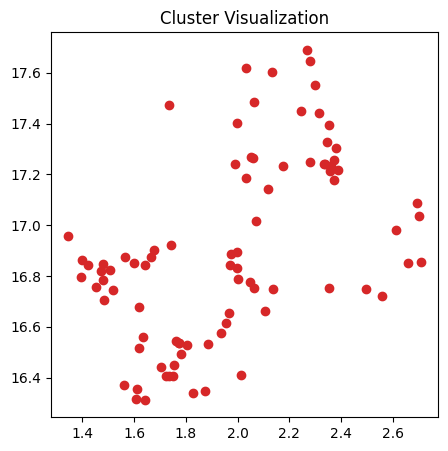

86
5003 " San"
17418 "arXiv"
18543 " calibration"
18804 "174"
19988 " Vari"
20529 "protein"
20617 "vari"
20778 "1975"
20925 " Gy"
21143 " fluids"
21553 "257"
21561 " Discussion"
21582 " quas"
21641 " prest"
21667 "OTO"
21687 ")]{}"
21703 " agar"
21745 " conting"
21799 " ah"
21803 " Prize"
21816 " farther"
21857 "plementation"
21895 " predecess"
21905 " ESP"
21918 "や"
21936 " decides"
21939 " bark"
22073 " invoke"
22100 "izens"
22123 " applicant"
22188 " Tan"
22216 " drought"
22263 "ophage"
22297 "equals"
22304 "swer"
22306 " Barack"
22313 "266"
22315 "aminated"
22331 "enabled"
22338 " Wire"
22340 "prev"
22353 "German"
22377 " spiral"
22406 "ocarcin"
22445 " whisk"
22461 " rode"
22466 "airo"
22484 " Vel"
22491 " bolt"
22515 "ение"
22533 " DJ"
22535 " ERR"
22539 " TF"
22612 " wax"
22653 "Lu"
22685 " auction"
22694 " respected"
22725 " arXiv"
22730 "microsoft"
22790 " mosquito"
22814 "ش"
22833 "...."
22843 " Flash"
22882 "secret"
22886 " DH"
22910 " sleeve"
22919 " PF"
22993 "tering"
2301

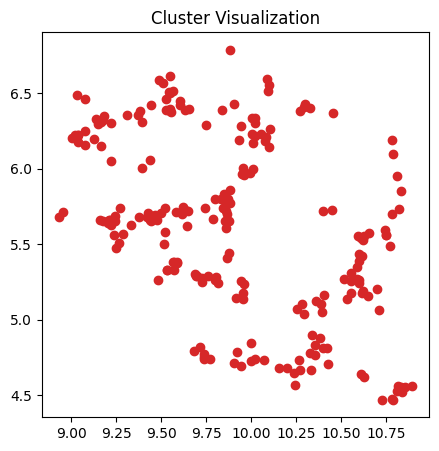

228
5977 "&\"
8341 " plaintiffs"
10164 " Organ"
12711 " leuk"
12918 " laughed"
13267 "ricular"
14694 "tail"
14808 " "
14816 " shame"
15078 " ''"
15141 "olin"
17626 " Ger"
21868 " ray"
22675 "aditional"
25428 "uffs"
32557 "calc"
33613 " uterine"
34049 "ultan"
34332 " artifact"
34517 " durante"
35216 "663"
35490 ":$"
35548 "Strategy"
35810 "ocellular"
36943 " Territory"
37151 "DIV"
37241 " können"
37402 "imonit"
37532 "ISPR"
37602 " Erd"
37629 " Traditional"
38062 " elem"
38434 "engo"
38576 " hardness"
39079 "lod"
39129 "PROT"
39212 " mechanic"
39475 " anastom"
39496 "LONG"
39617 "symmetric"
39621 "952"
39739 " 850"
40211 " libr"
40322 " Nacional"
40355 " 529"
40373 " rm"
40408 "kil"
40479 " pathetic"
40554 " textbook"
40622 "thus"
40631 "Suite"
40700 "Ju"
40752 " stratification"
40774 " plating"
40794 " Joey"
40812 "applicable"
40838 "SEE"
40927 "tooltip"
40978 "epit"
40995 "wolf"
41006 " respecting"
41029 " 468"
41041 "Applied"
41106 " hecho"
41273 " Elements"
41290 " americ"
41302 "},

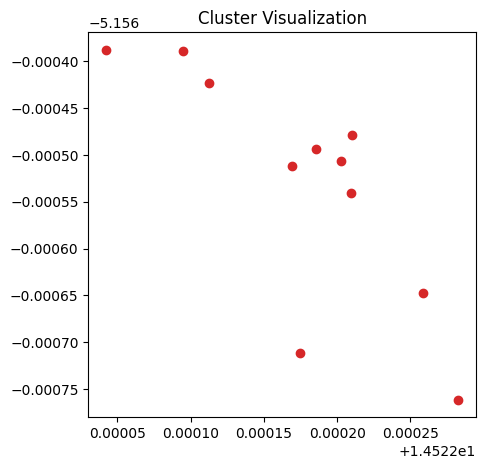

11
1352 "$."
3363 "}$."
3822 ")$."
11971 "}}$."
17137 "})$."
19562 "\}$."
20481 "]$."
28185 ")}$."
33471 "}}}$."
34801 "))$."
39049 "}})$."


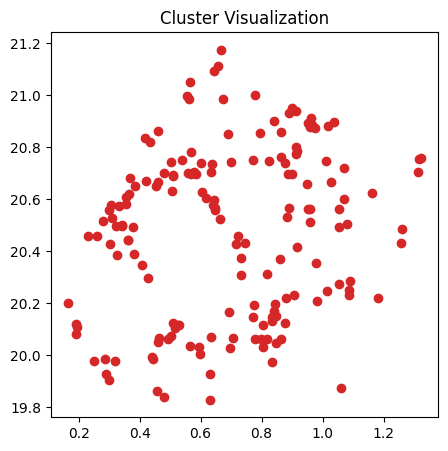

168
18440 " marrow"
21147 " gland"
21165 " regex"
21349 " globally"
21565 " predicting"
21581 " UE"
21627 "}\,\"
21755 "illation"
21774 " routinely"
21805 "agonal"
21824 ""
21840 "ATTR"
21864 " singles"
21867 " hed"
21873 "Descriptor"
21891 " extinction"
21927 " plac"
21985 " couch"
22000 "309"
22018 " atmospheric"
22039 " TA"
22047 "LM"
22065 " expose"
22074 " builder"
22080 " obstruction"
22087 " prospects"
22098 "Ep"
22127 "components"
22138 " Amy"
22151 "isode"
22154 "rophys"
22157 "building"
22160 "使"
22165 " Wayne"
22176 "Ham"
22186 " eaten"
22189 "INVAL"
22202 "similar"
22203 "gone"
22204 " Chemical"
22219 "("%"
22220 "ellen"
22232 "242"
22240 " antigens"
22242 "Everything"
22250 " WAS"
22256 "(@"
22257 "coding"
22258 " boring"
22264 "ovirus"
22267 "yon"
22273 " boyfriend"
22274 "Socket"
22286 "}),"
22292 "В"
22308 "290"
22310 " С"
22322 "unnumbered"
22328 "history"
22346 " Gran"
22348 "heat"
22351 "Az"
22355 "VALUE"
22356 " Communist"
22358 "wx"
22362 "MON"
22364 " Stream"
223

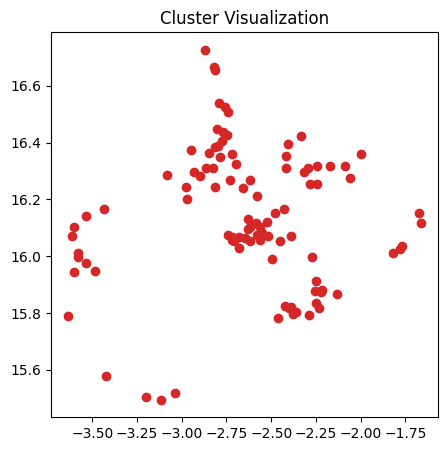

99
21151 "173"
21476 " Hold"
21697 "alph"
22987 "reli"
23035 " accret"
23260 "246"
23343 "ithmetic"
23472 " Client"
23599 " vocals"
23709 " Definition"
23735 "274"
23906 " vendor"
23955 "another"
23990 " cylindrical"
24048 " reversible"
24072 " historian"
24119 "フ"
24142 " ½"
24227 "CAT"
24240 " adsorption"
24242 " judged"
24278 " aromatic"
24342 " opera"
24351 " bronch"
24358 "FORM"
24404 "ロ"
24422 "EST"
24433 " requesting"
24457 " ;)"
24465 " Gill"
24471 " Privacy"
24487 "regs"
24488 " commenced"
24530 " municipality"
24539 "="-"
24562 "374"
24566 " tert"
24576 ">$"
24583 "youtube"
24590 " sequel"
24596 "aphr"
24607 " Colomb"
24615 " zo"
24623 " 1946"
24637 " linkage"
24646 " Conversely"
24659 " annoying"
24663 " genetically"
24686 " cables"
24687 " 173"
24695 "oused"
24700 "amiliar"
24724 "262"
24734 "igion"
24742 " vendors"
24745 "εί"
24750 "tfn"
24753 "Until"
24761 "houses"
24766 " Lex"
24787 "tons"
24790 "URN"
24812 " insane"
24816 "ophageal"
24836 "nis"
24837 " Publishing"
24841

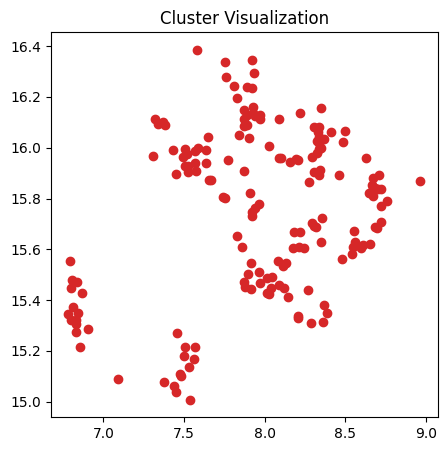

168
11302 " vertex"
14336 "pmatrix"
14812 "ogeneity"
15945 " slave"
16233 "productive"
16299 " Final"
16391 " joke"
16410 " refuse"
16487 " faint"
16497 " translate"
16537 "olk"
16540 " raises"
16546 " Respond"
16600 " Keep"
16666 " chips"
16672 " compositions"
16695 "pire"
16706 " inconsistent"
16738 " adsor"
16745 " shaped"
16749 "iere"
16759 "ERY"
16779 "ци"
16784 " releases"
16806 "separ"
16817 " reporters"
16835 " Hung"
16845 "น"
16846 " shower"
16851 " approximate"
16860 " wars"
16864 " passive"
16868 " Ped"
16870 "isan"
16873 "xtures"
16877 "以"
16926 "hai"
16931 " susceptible"
16942 " Everything"
16944 " CG"
16946 "ophys"
16947 " proceeds"
16949 " rush"
16956 "Option"
16959 " lease"
16963 "avirus"
16967 " Lam"
16979 "inyl"
16982 " Nich"
16990 "ÃÂ"
16992 " bandwidth"
16994 " implementing"
16998 "�"
17001 "mir"
17005 " tale"
17016 " phosphate"
17017 " consumed"
17020 "DATA"
17023 " rubber"
17024 "ulatory"
17025 " Wright"
17028 "WARE"
17031 "Mask"
17032 " inference"
17035 "'-"
1703

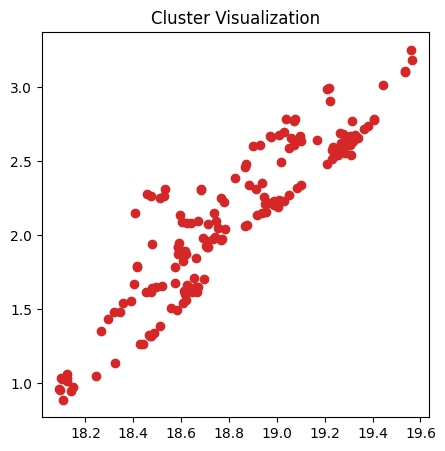

176
10058 " tiny"
10149 " keys"
34955 " monks"
35288 " Tumor"
35295 " monk"
36564 " piezoelectric"
36637 "unci"
36976 " attaching"
37078 " vastly"
37156 " Vista"
37258 "062"
37278 " pellet"
37280 " ws"
37390 " excurs"
37484 " spices"
37536 "identally"
37554 "osse"
37597 "gpu"
37782 " obligated"
37830 " Guang"
37844 "ohl"
37878 " lace"
37926 "َ"
37938 " loro"
37950 "751"
37964 "arta"
37968 "aty"
37988 "ック"
38005 " Marian"
38010 " alloys"
38014 "ismic"
38031 "Shader"
38038 " THERE"
38039 "."_"
38044 " ese"
38074 " dreadful"
38081 " glove"
38082 " BMD"
38083 "äs"
38088 "thro"
38094 " 456"
38108 "unciation"
38126 "Judge"
38127 " faction"
38129 "IImage"
38130 "uchar"
38134 " stray"
38137 "openhagen"
38146 " VPN"
38151 "jours"
38156 "Js"
38162 " 383"
38179 " egy"
38180 " soit"
38191 " Won"
38208 " robbed"
38218 "zd"
38219 " excuses"
38233 " ERA"
38242 "看"
38249 "1956"
38255 " uniformity"
38257 "Populated"
38259 " png"
38261 " circadian"
38275 "Adjust"
38283 "ITCH"
38284 " assayed"
38290 " 34

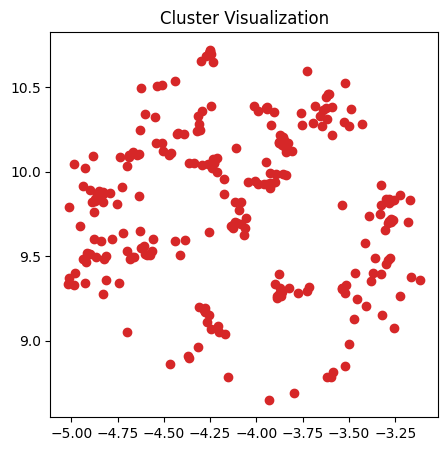

248
25402 "jam"
27859 " turbine"
27920 "ggle"
28450 " translocation"
28689 " USD"
28820 "oppel"
28997 "NAM"
29090 "Depend"
29114 "taking"
29150 "Director"
29176 " Pf"
29222 " Isaac"
29319 "Proc"
29328 " proposes"
29334 " hid"
29382 " Reason"
29478 " confocal"
29495 " επ"
29520 "Spanish"
29585 "fashion"
29602 " Lorentz"
29606 "opor"
29626 "�"
29668 " Sold"
29673 " Pt"
29674 "orta"
29702 " Adjust"
29704 "λλ"
29737 " soda"
29748 "}}{{\"
29790 "697"
29792 " \'"
29796 "Ur"
29815 "warz"
29845 "Chem"
29865 "vern"
29874 " hopeful"
29906 " Bros"
29921 " guardian"
29928 " dere"
29952 " hazards"
29977 " syll"
30021 " Baptist"
30030 "ieder"
30039 " urging"
30040 " stuffed"
30055 " pillow"
30066 " SARS"
30078 " detrimental"
30080 " rebut"
30081 "Imp"
30091 " mening"
30105 " cv"
30110 "ạ"
30133 " Gly"
30164 " Kra"
30165 "male"
30174 " Libya"
30183 "Points"
30195 " unaffected"
30201 " shuttle"
30218 " deficiencies"
30220 "GROUP"
30222 " genetics"
30225 " '-"
30244 " droplets"
30247 " multiply"
30251 

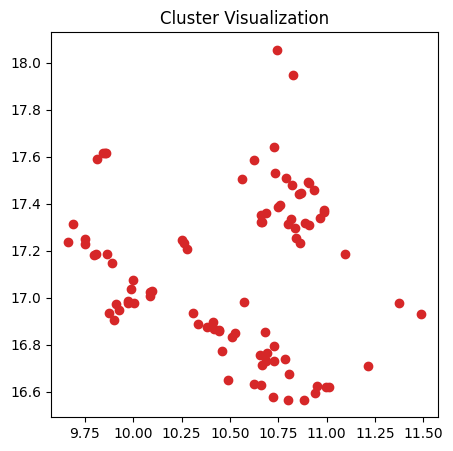

90
4271 " identify"
8335 " sheet"
8805 " stone"
9659 " permit"
10570 " Eth"
11115 " lawyer"
11295 " imposed"
11299 " 1983"
11624 " eggs"
11654 " forever"
11662 " manufacturer"
11786 " gradient"
11879 " Rub"
12037 " accumulation"
12475 " phases"
12663 "ITED"
12686 " quot"
12748 " difficulties"
12893 " arise"
13035 " crash"
13101 "cells"
13104 " Nick"
13106 " Register"
13246 " �"
13250 " factory"
13292 " deny"
13403 " bonds"
13655 " phosphorylation"
13787 " nucleus"
13922 " JSON"
13935 "RO"
14028 "240"
14113 " json"
14260 " hi"
14834 " maternal"
15032 "Doc"
15935 " nuclei"
16000 " permits"
16099 " lawyers"
16209 " impose"
16296 ""?"
16395 "Loc"
16460 "1983"
16469 "udo"
16596 " manufacturers"
16675 " nurses"
16703 " 04"
16770 "Evaluate"
16812 "Still"
16863 " Carter"
16918 " 240"
16958 " phenomena"
16987 " 05"
17128 " VI"
17174 "Os"
17181 " 129"
17206 " Pap"
17250 " Nik"
17255 "itate"
17302 " retention"
17310 " merge"
17323 " Ocean"
17374 " foo"
17380 " stones"
17399 " Sort"
17409 " gym"
1

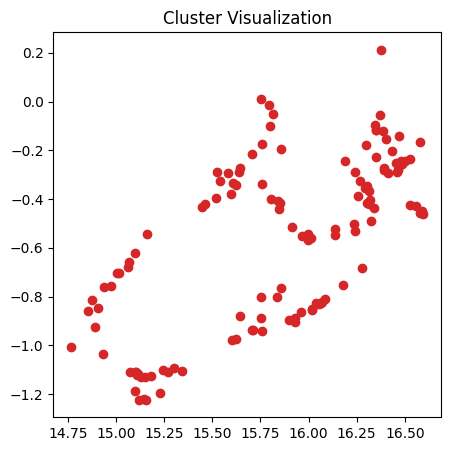

126
4058 " Her"
9250 "yles"
9739 """"
9920 "ycl"
9932 "ught"
9973 "|-"
10089 " coal"
10100 "õ"
10141 " checked"
10180 " aver"
10268 " facing"
10422 "aux"
10495 "forward"
10509 " classified"
10539 "step"
10952 "\}$"
13847 " aggressive"
22978 "={\"
33165 "ramento"
35255 "fro"
35835 "posium"
36062 "Paris"
36179 "Texas"
36181 " Wide"
36283 " få"
36383 "äll"
36404 " dissemination"
36405 " Sacramento"
36551 "centration"
36579 " SCI"
36675 "BUF"
36706 "idy"
36752 "circum"
36795 "debian"
36905 " luggage"
36979 " facebook"
37048 " launches"
37080 " vai"
37086 "RUPT"
37167 " ב"
37195 "Named"
37201 " oxidized"
37202 " ponder"
37340 "mixed"
37477 " Tong"
37524 "1016"
37668 "pta"
37699 " clarification"
37735 " startups"
37967 "necessarily"
37995 " Ü"
38036 " Fuj"
38077 "ция"
38121 " printers"
38158 " unequal"
38230 " GmbH"
38232 " hates"
38265 "recht"
38300 " Boss"
38352 " delim"
38361 "employment"
38381 "llvm"
38400 "}={\"
38403 "Submit"
38473 " Potential"
38502 " Marion"
38544 " Frequency"
38613 

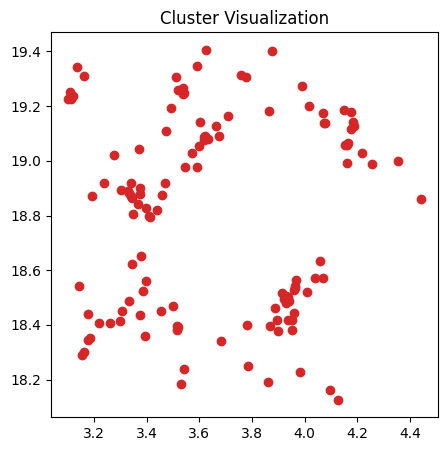

123
1880 " whether"
4372 " ----------------"
10374 " Lar"
10725 " rely"
16711 " organisms"
16717 "149"
17223 "212"
18146 "167"
18359 "189"
18493 "197"
18611 " regulating"
18756 " Liter"
18831 " deposit"
18974 " trajectory"
19196 "196"
19361 " poem"
19555 " cigarette"
19630 "293"
19723 " cheek"
19940 "urities"
19941 " Burn"
20008 " fist"
20054 ""
20094 "whether"
20136 "ammad"
20232 "agne"
20266 "August"
20328 "ebook"
20340 "....."
20342 " packets"
20346 " premature"
20417 " technological"
20478 "iterranean"
20493 "rugged"
20520 "248"
20570 "034"
20607 "Library"
20638 " disruption"
20678 "Lar"
20715 " Fast"
20717 "amation"
20735 "221"
20736 " Democrat"
20757 " Turner"
20758 "CLUDING"
20762 " rope"
20770 "ל"
20825 " 147"
20847 " skeletal"
20854 " mistaken"
20856 " tropical"
20904 " Cape"
20917 "icol"
20961 "itably"
20963 "exe"
20979 "))**"
21003 " Einstein"
21007 " urgent"
21017 "ecess"
21040 "itos"
21042 " diluted"
21052 "derer"
21074 " Internal"
21086 " caut"
21090 " freeze"
21106 " Fl

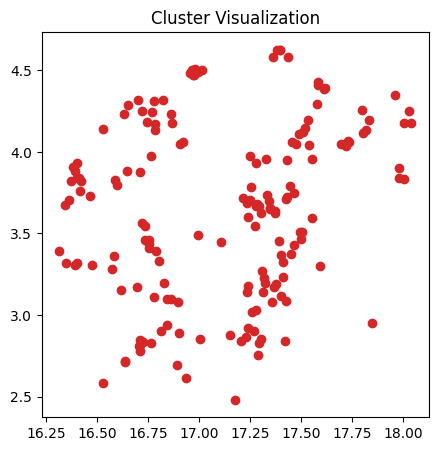

170
1744 "

 "
4207 "\]."
9702 "�"
9799 "�"
9801 " fee"
9820 "yes"
9865 " valuable"
9880 " winning"
9909 " integral"
9950 " gentle"
9955 "]\"
9961 "mult"
9965 " laboratory"
10020 " semi"
10066 " opposed"
10117 "ounder"
10118 " Lab"
10138 " conform"
10150 " embry"
10155 " breaking"
10171 " involvement"
10229 " goods"
10249 "OK"
10281 " constitutional"
10302 " computed"
10382 " serial"
10399 " MD"
10476 " suppress"
10477 ":("
10592 "ILL"
10747 "leton"
11151 "week"
11797 " inspired"
13218 "arding"
33525 "


 "
35016 " apprent"
35773 "everything"
36035 " Bottom"
36159 " fantas"
36230 " unreliable"
36430 "('./"
36607 " boxing"
36834 " stipulated"
36837 " atroc"
36847 "mathbbm"
36892 " Bott"
36974 " Beauty"
36978 " Push"
37015 " authorize"
37017 "thouse"
37061 " RCC"
37101 " Honey"
37120 " Pharmac"
37142 " cheating"
37145 "brids"
37150 "Australia"
37214 " wield"
37299 "}\}$"
37331 "Push"
37347 "classical"
37397 " 431"
37480 "regation"
37489 "ropolis"
37504 " invariably"
37526 " Hess"
37543 "

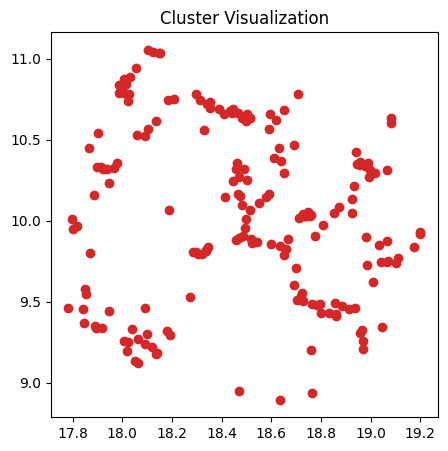

191
9887 "approx"
10081 "endo"
10183 " difficulty"
10213 " Daniel"
10248 " specim"
10279 " mad"
10296 " technologies"
10306 "sized"
10336 " architecture"
10350 " Constitution"
10388 " Sa"
10464 " bat"
10480 " trick"
10482 "rivial"
10489 "through"
10496 "015"
10497 " Asia"
10512 " Jr"
10545 " regulatory"
10550 " Amazon"
10597 "asant"
10606 "','"
10607 " loaded"
10618 " correction"
10627 " Force"
10650 "IME"
10670 " distributions"
10676 "ocard"
10681 "�"
10686 " conce"
10697 "Car"
10701 " Network"
10736 " zu"
10737 " Amendment"
10743 "ия"
10746 " directions"
10763 " beauty"
10769 "associ"
10784 " Technology"
10787 "lers"
10825 " atmosphere"
10837 " silence"
10870 " comparable"
10877 " mounted"
10946 "offset"
10957 " divide"
10963 " compensation"
10972 " legit"
10992 " aux"
11035 " omitted"
11050 ")*(-"
11131 "irk"
11203 "atre"
11258 "kind"
11277 " cum"
11283 " smoke"
11285 "hs"
11409 "ам"
11711 " diver"
12218 "♪"
12223 "uty"
12700 " anger"
14078 " tout"
14122 " nons"
35741 "potent"
35757

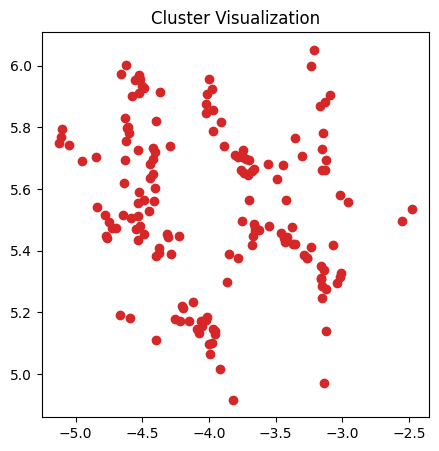

162
3484 " students"
3910 " differences"
6561 " secondary"
14084 " scroll"
21696 " Students"
25351 " puzzle"
25527 " writings"
25703 "})^{"
25704 " ether"
25707 " Baby"
25754 " monument"
26076 "kal"
26280 " kills"
26283 " wives"
26435 " -."
26773 " radiotherapy"
26856 " kh"
26865 " NCAA"
26881 "055"
26953 " Tyler"
26978 "bia"
27064 " HDL"
27066 " filmm"
27076 "duration"
27089 "drew"
27110 " asymmetry"
27176 " CRE"
27201 " cation"
27223 "Chinese"
27232 ")})"
27307 "_)"
27369 "proved"
27407 "becca"
27419 "ubernetes"
27542 "mits"
27568 "ías"
27596 "^®"
27620 " noisy"
27735 " muit"
27781 "/$"
27783 " Barr"
27791 " phenotypic"
27792 " whistle"
27846 " tailored"
27865 "555"
27869 "Bound"
27878 " Academic"
27887 " pear"
27904 " privately"
27919 " Eye"
27952 "healthy"
28029 " Ellis"
28061 " ribs"
28090 " bureaucr"
28124 "WP"
28136 " engineered"
28165 "leys"
28242 "sover"
28268 "cis"
28313 " Lux"
28569 " NIH"
28584 "ventory"
28601 "antics"
28641 " mediate"
28658 "HG"
28670 " Harbor"
28672 "medi

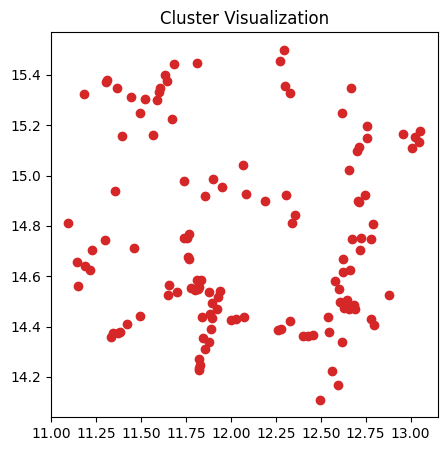

127
6664 "orthern"
6921 "\{"
8133 " putting"
9067 " Home"
9497 " Lo"
9664 " Microsoft"
10014 " theme"
10500 " mutant"
10637 "255"
10925 "................"
10990 "Row"
11442 " Northern"
12040 "ś"
12333 " kidney"
12420 " alignment"
12695 "VE"
12707 "wedge"
13190 "ITION"
13201 " disrupt"
13305 " episodes"
13339 "ordinary"
13377 "Ø"
13489 " Creat"
13667 " brilli"
13783 "ifiers"
13864 " pleased"
13874 " CP"
13905 " span"
13910 " pending"
14005 "reference"
14026 " Has"
14055 " COP"
14119 "ocker"
14133 " shirt"
14176 " governor"
14345 "uto"
14369 "doi"
14373 " retired"
14390 " parse"
14399 "auth"
14561 " nonlinear"
14693 " cameras"
14749 "Nav"
14772 " Later"
14777 " plots"
14792 " TB"
14840 "175"
14855 " weakness"
14868 "Pref"
15010 " factual"
15025 " Bitcoin"
15046 "170"
15065 " finance"
15093 "rule"
15097 "Ù"
15112 " SF"
15113 " fluctuations"
15127 " promoted"
15128 " PK"
15148 "138"
15154 " queue"
15208 "iti"
15212 " quoted"
15215 " 255"
15255 " MB"
15288 "Lo"
15291 "standard"
15320 "amide

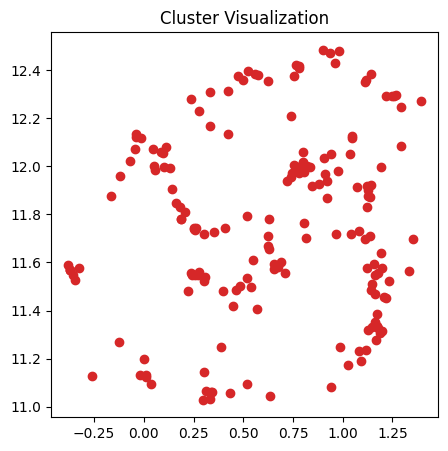

176
7870 " dynamic"
23410 " Patient"
25235 "»."
26748 " eV"
26821 " IX"
26942 "704"
28371 " TCP"
28932 " reside"
28984 " Steam"
30700 "+/-"
31014 "MSC"
31432 "anchez"
31484 "Running"
31799 " Dynamic"
31860 " Ik"
31909 " SOC"
31927 " Sig"
31955 " Geneva"
32040 "Tok"
32092 "anic"
32185 " Ich"
32221 " SHALL"
32244 "Things"
32252 " Casey"
32253 " southeast"
32259 "Rod"
32275 "oge"
32291 "geqslant"
32318 "JC"
32347 " Coord"
32376 " contemplated"
32406 " MAPK"
32427 " businessman"
32434 " devised"
32456 "ipper"
32458 " duo"
32527 " ATM"
32539 " filming"
32551 " restitution"
32555 " incompatible"
32562 " 407"
32567 "otte"
32586 "blogspot"
32602 "cline"
32610 "openh"
32625 " Taliban"
32632 " Wool"
32657 ";;;;"
32660 " hemisphere"
32687 "amazon"
32690 "gary"
32708 " borne"
32710 " Modi"
32720 "051"
32750 "�"
32755 ".")."
32760 " Wildlife"
32772 " ADHD"
32782 "enstein"
32812 "cology"
32814 "ENABLE"
32822 " cessation"
32834 "642"
32839 "éc"
32841 "Want"
32855 " 271"
32871 "[/"
32876 "Coord"
32878

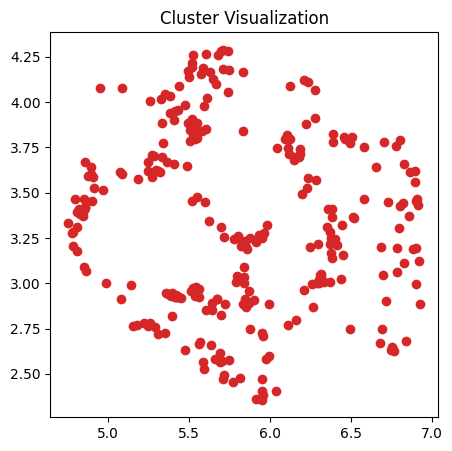

280
467 "       "
477 "
   "
542 "                                "
1015 "
               "
1112 " bel"
1631 "resent"
1760 "
    "
3290 " quality"
4356 "                 "
8159 "pg"
9740 "
                               "
10072 "

    "
10204 "                              "
11755 " funny"
14670 "�"
15518 "
                  "
16218 "unted"
18720 "agine"
18754 "abi"
19274 " positioning"
21128 " Khan"
23883 "

       "
26317 "filling"
27848 " Airl"
28048 "ustomed"
39634 " Stokes"
40198 " millilitres"
40915 " Tue"
43465 "zier"
43582 "County"
43950 " Distributed"
44107 "uric"
44285 "DELETE"
44314 "像"
44388 "ologia"
44622 "CTIONS"
44646 " GRANT"
44654 "gos"
44673 "请"
44762 " showc"
44922 " crawling"
44954 "oque"
44960 "yrinth"
44967 " seismic"
45014 " Chloe"
45026 " circumstantial"
45033 "starting"
45102 "FLD"
45128 "�"
45133 "κε"
45196 " arbitrator"
45282 " Ré"
45310 " tir"
45418 " battered"
45428 " Booker"
45431 " ép"
45494 " Lig"
45495 " _________________________________"
45608 " sabot"

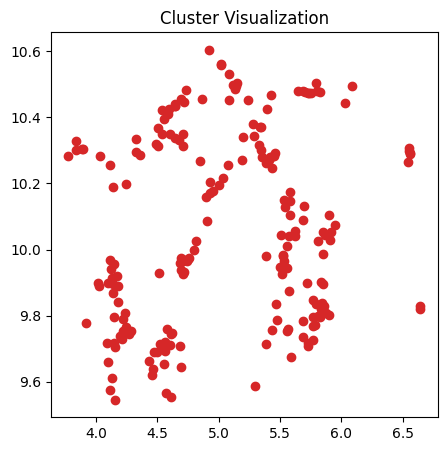

203
8990 " API"
9090 " obviously"
9749 " illness"
12726 " reporter"
14227 " exert"
14604 " batch"
14794 "Ins"
15008 " reven"
15177 "quality"
15338 " minimize"
15446 "�"
16165 " interfer"
16448 " Monte"
17008 " по"
18307 " elementary"
18320 "clerosis"
19150 " trailer"
19902 " quarters"
22647 " sender"
23127 " FF"
23277 " surrender"
23556 " WW"
23861 " plaque"
24094 " sticks"
24141 "lycer"
24675 "
        
       "
25558 "ン�"
26000 "stroke"
26725 "み"
27665 " digestion"
28699 " minimizing"
30476 "EU"
31072 "

             "
32510 " salaries"
33212 " Pull"
33408 " abusive"
33650 "appings"
33709 "heter"
33722 "missing"
33723 " 296"
33752 "GPIO"
33931 "Known"
33951 "bright"
33952 " GF"
33964 "492"
34004 "^**"
34076 "aisy"
34097 " devote"
34133 "tcp"
34254 " neurotrans"
34383 "vectors"
34414 " widths"
34416 "requently"
34420 " illuminated"
34502 "electric"
34504 "STD"
34508 "CAM"
34578 " Elementary"
34637 "429"
34727 " honors"
34811 "指"
34841 " Heights"
34851 "itian"
34878 "Percent"
34895 " G

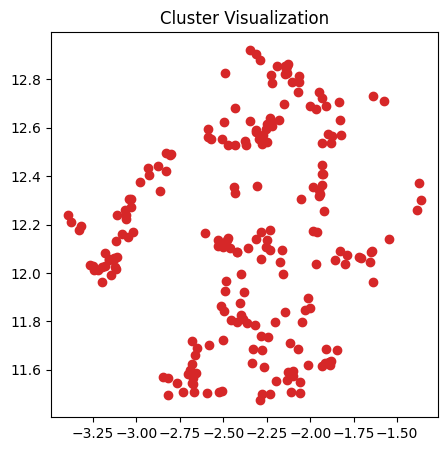

215
9763 " controller"
24749 " routing"
25041 "Mock"
25069 " WO"
25088 "cephal"
25153 " recognizes"
25215 " cc"
25498 " Gay"
26626 "Complete"
27225 "FIX"
28287 "forth"
28467 " chooses"
29531 " Fan"
29819 "umbai"
30166 "keleton"
30208 " surgeons"
30701 "Mid"
30749 " tracing"
30752 " CHAR"
30828 " apost"
30903 "高"
30923 "sulf"
30938 " reinst"
30940 "cue"
30954 " мож"
31033 " blows"
31042 "..""
31058 " oss"
31063 " drastically"
31065 " secretly"
31079 " gown"
31100 " CBD"
31112 " mating"
31119 "0040"
31131 " Clarke"
31139 " possessing"
31149 " advisor"
31173 "サ"
31180 "lua"
31187 " theirs"
31198 " WordPress"
31203 "757"
31211 "adren"
31225 " frameworks"
31243 " latitude"
31261 " curtain"
31273 " firef"
31283 " sounding"
31293 " Understanding"
31320 "rites"
31323 "near"
31333 "bash"
31340 " Julie"
31360 " encodes"
31375 " dissociation"
31385 " pd"
31388 " grape"
31396 " Percent"
31401 " endemic"
31415 " bulb"
31418 " detached"
31420 "ciliation"
31428 " almond"
31434 " quando"
31438 " south

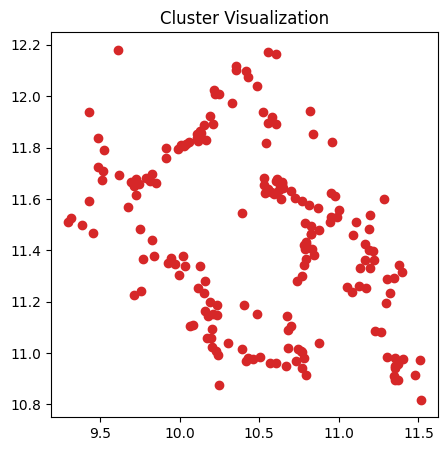

192
2546 " asked"
4644 " volume"
5149 " wave"
6470 " Sal"
9165 " executive"
9186 " examine"
10819 "|^"
12164 " supplied"
12168 "Target"
12619 " denominator"
13636 "Url"
13699 " threatened"
13936 " Holy"
13968 " stained"
14118 " volumes"
14286 " appointment"
14364 "PRE"
14459 " fiction"
14473 " Hit"
14494 " encountered"
14501 " supporters"
14519 "OME"
14878 " Hz"
14895 ")*-"
14940 " convergence"
14951 " notation"
14961 " myocard"
14992 " alumin"
15034 " navigation"
15068 "present"
15091 " lawsuit"
15197 " Howard"
15347 " Property"
15359 " Barn"
15399 " divid"
15422 "none"
15453 "bn"
15460 " needle"
15476 "grid"
15501 " BBC"
15505 "minute"
15534 " extr"
15613 " proc"
15629 " associate"
15641 " dispersion"
15647 "ок"
15744 " freely"
15756 "�"
15777 "inos"
15794 " Football"
15834 "abstract"
15845 "bytes"
15862 " LED"
15898 " ash"
15951 " vic"
15957 "�"
15960 "030"
16029 "inery"
16045 " tobacco"
16051 " rug"
16072 " conversations"
16083 "them"
16088 " incredibly"
16089 "urches"
16094 " fluo

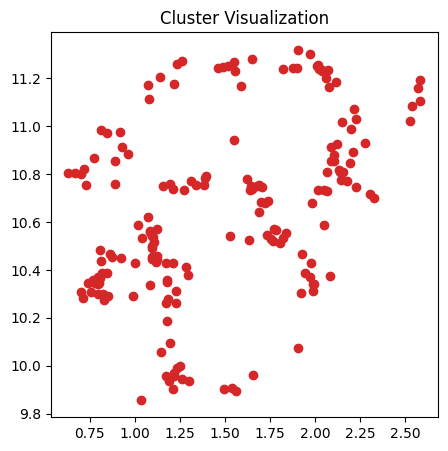

180
2709 " multiple"
3785 " pull"
5716 "({\"
7320 " pulled"
10791 "}({\"
14252 " pulling"
14648 " basketball"
19753 "}}({\"
"
20748 " Esc"
20815 " Multiple"
21960 " Laura"
22319 " Rio"
22773 " enroll"
22829 "flat"
23186 " strand"
23634 " brake"
24252 " Excel"
24374 "actly"
25612 " pulls"
25678 " Movement"
26643 "aphys"
27575 " Happy"
27691 " conferences"
28921 " timestamp"
29309 "coord"
29454 "Multiple"
30000 "Admin"
30456 "Blood"
30600 "platin"
30874 " AZ"
30951 " landmark"
30998 "Rom"
31018 " reload"
31379 "}}["
31702 " chasing"
31758 " mutated"
31869 " Pb"
32079 " Industries"
32125 " turbulence"
32180 " outwe"
32240 "otherwise"
32312 " Initially"
32371 " Launch"
32395 "/~"
32544 "Chicago"
32547 " avoids"
32549 "timestamp"
32580 " Ges"
32583 "ije"
32600 "quick"
32604 "AZ"
32671 "OUN"
32688 "canvas"
32711 "сп"
32730 " voltages"
32773 " popped"
32787 " Ahmed"
32821 "––––––––"
32902 " echocardi"
32912 " discoveries"
32965 "identity"
32969 "PROP"
32975 " parcel"
32981 " lament"
32985 " l

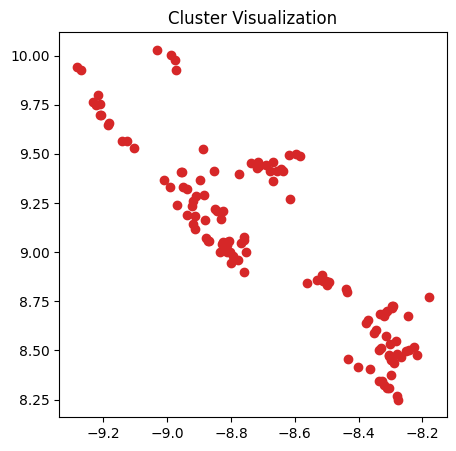

124
25448 "istas"
25757 " ceramic"
26020 " provinces"
26033 " 355"
26051 "YRIGHT"
26366 "Wal"
26541 "695"
26611 " precipitation"
26682 " thresholds"
26845 "Bob"
26855 " συ"
27045 " Syscall"
27099 "amilies"
27170 " outfit"
27199 " Broadway"
27215 " drank"
27218 " NL"
27242 " diplom"
27262 " succession"
27275 " drums"
27287 " jumps"
27291 " thirteen"
27292 " Score"
27444 " groove"
27458 " tribute"
27474 "DQ"
27485 " Ukrainian"
27561 "ivia"
27585 " eventual"
27671 " Copy"
27679 "race"
27681 "Ce"
27685 " ved"
27693 " Arctic"
27699 " Vict"
27749 " peu"
27769 " marketplace"
27801 " synchronization"
27802 " acetyl"
27815 " headlines"
27818 " Vas"
27880 " 267"
27883 " dispatch"
27892 " bubbles"
27908 " flap"
27946 " Kenya"
27949 " fortunate"
27959 " partitions"
27962 "sound"
27969 "ает"
27973 " slim"
27974 " atrial"
28003 " Knowledge"
28028 " monitors"
28038 " angiogenesis"
28039 " electrostatic"
28049 " kits"
28057 "686"
28059 "0013"
28062 "eanor"
28087 " spun"
28098 " Bir"
28111 " Experiment

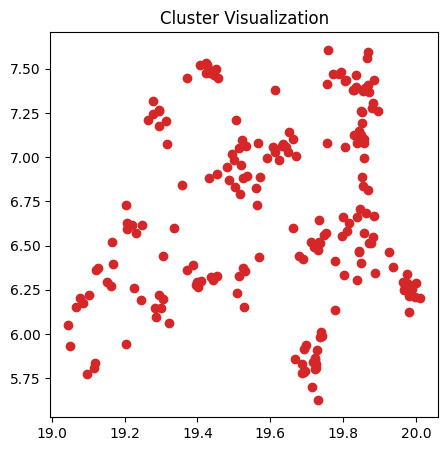

204
7877 " dimension"
8997 "Off"
9119 " mob"
9138 "1000"
10190 "=("
10304 " probe"
10305 " losing"
10329 " garden"
10351 " Far"
10378 "olly"
10418 " affirm"
10502 " risks"
10524 " trou"
10573 "aka"
10576 " stir"
10677 " 74"
36174 " commanding"
36356 "424"
36400 " Miguel"
36415 "biology"
36496 " IRA"
36501 " Created"
36535 "rå"
36594 " correctness"
36613 "brates"
36658 "debted"
36660 " ")"
36667 "fuel"
36713 " unhealthy"
36720 "�"
36729 " Charter"
36735 "Imm"
36749 "generative"
36763 " Ottoman"
36767 " banana"
36787 " sewing"
36807 " dominates"
36808 " Advance"
36846 " lifespan"
36848 " ventricle"
36855 " BET"
36862 " binder"
36863 " hose"
36873 " Chemistry"
36883 " Hugo"
36888 "Participants"
36893 "__>"
36894 "ות"
36895 " snacks"
36899 "seb"
36918 " 555"
36919 " IDs"
36924 "ブ"
36942 "Pick"
36944 " Functions"
36950 " numpy"
36961 "gui"
36967 " incur"
36971 " smoothing"
36988 " 424"
36989 " VT"
36992 "choline"
36994 " attendees"
36996 " LOVE"
36997 "Endpoint"
36999 " Oral"
37002 " seedli

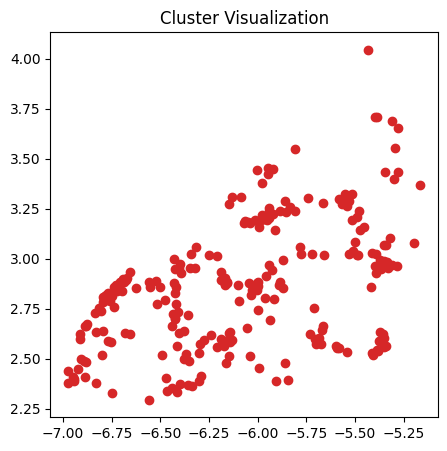

249
604 " if"
1198 " For"
1229 "30"
1284 " As"
1318 " value"
1511 " type"
1521 " iss"
1549 "60"
1552 "This"
1559 "bl"
1564 "ivers"
1566 " model"
1574 "ently"
1614 " turn"
1616 " mark"
1623 " On"
1653 "bers"
1663 " really"
1666 " bas"
1686 "ml"
1689 "ho"
1693 " rele"
1696 "htt"
1708 " light"
1720 " Re"
1727 "ends"
1728 " home"
1731 "26"
1734 "ety"
1754 " based"
1756 " grow"
1758 "ina"
1763 "inc"
1766 " bo"
1784 " der"
1788 "lection"
1792 "ari"
1796 "ee"
1808 "ern"
1814 "mb"
1815 "mun"
1830 "IS"
1836 "ambda"
1838 "ID"
1840 " above"
1842 " eas"
1848 "RE"
1852 " #"
1854 " path"
1855 " mov"
1866 "ten"
1869 " thought"
1870 "ctor"
1884 " 30"
1889 " Ex"
1897 " days"
1904 " didn"
1909 "As"
1912 " won"
1930 " side"
1935 "ware"
1939 "ormal"
1941 " evidence"
1949 "rain"
1950 "í"
1952 "au"
1953 " question"
1958 "ividual"
1965 " impro"
1966 " human"
1968 "label"
1971 " treatment"
1975 "ological"
1981 "ling"
1983 "imal"
1993 "play"
1995 "ajor"
2003 "part"
2004 "though"
2005 "igma"
2011 " shown"
2016 

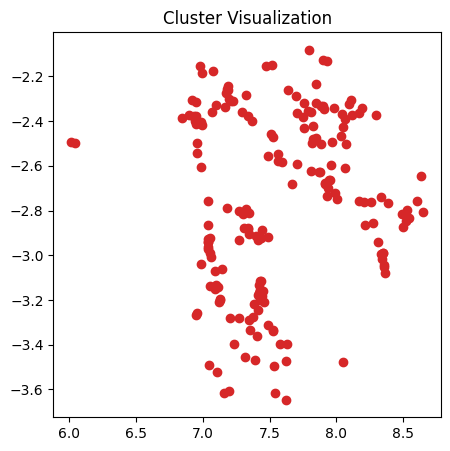

192
2516 " John"
3932 " Since"
4932 "^{("
6181 " France"
6691 " Mex"
7304 "Solve"
7593 " Solve"
7605 " statistical"
7928 " acute"
8087 " rail"
8242 "ORD"
8529 " Fed"
8679 " Bob"
8725 " extends"
8740 " antibodies"
8763 " hidden"
8842 " Cath"
8858 "values"
8893 "Version"
8953 "irable"
9057 "ometimes"
9414 " reader"
9418 " :)"
9458 "bound"
9518 "ogether"
9536 "NAME"
9596 " religion"
9836 " domestic"
9918 "razil"
10007 " modify"
10012 " theorem"
10044 " î"
10230 " apartment"
10275 " ingred"
10472 "ospit"
10515 " Middle"
10529 "inals"
10588 "Control"
10760 "oprote"
10984 "hard"
10987 "Build"
11194 "rose"
11208 "ordan"
11260 " birds"
11296 "sql"
11301 " Bush"
11342 "fire"
11360 " dominant"
11378 "ли"
11463 " tack"
11466 "¸"
11499 "pref"
11589 "Thread"
11756 "Attribute"
11757 " combat"
11768 "^,"
11780 "anto"
11820 " trem"
11845 "illance"
11903 " maxim"
11933 "pton"
11948 " childhood"
11950 "changed"
11973 "regulation"
11975 "oline"
11983 "aza"
12005 "�"
12069 " medi"
12122 " "$"
12124 " vacu

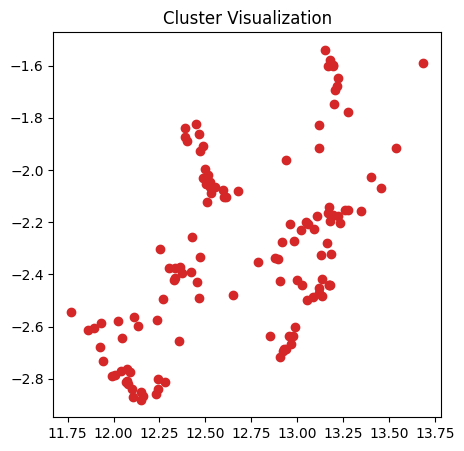

125
4313 " ratio"
6745 " Facebook"
6970 " curve"
7534 " biological"
8755 " Lemma"
9355 " planned"
9366 " somewhere"
9378 " battery"
9421 " surfaces"
9454 " depression"
9624 "Load"
9645 " blind"
9734 " warning"
9782 " ng"
9839 " phr"
9861 " surprised"
9875 "scape"
9903 "don"
9922 " Democratic"
9940 " dedicated"
9958 " suffering"
9972 " Italy"
9976 " decade"
9987 " coron"
9993 "exec"
10017 " replied"
10021 " adverse"
10047 "isons"
10055 "iscussion"
10056 " passage"
10097 " documentation"
10106 " urban"
10119 " loan"
10125 " copies"
10176 " Muse"
10188 " Fort"
10384 " applies"
10450 " feelings"
10452 "SET"
10490 " liked"
10533 "uity"
10584 " hook"
10638 "///"
11084 " 130"
12193 "))/("
13068 "lab"
13602 " Crim"
29497 " Azure"
30952 "<!"
31762 "BAR"
34132 "cyclopedia"
34311 "')\"
34566 "antiago"
34911 "ourses"
35105 " whale"
35148 "ennas"
35264 "actually"
35312 " 386"
35538 " PSA"
35796 " economist"
35980 "Corp"
36094 "professional"
36505 "priority"
36623 " Dialog"
36789 "ível"
36818 " tyr"

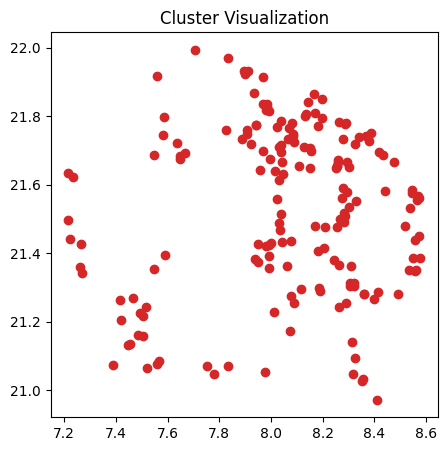

176
9373 " orth"
11195 " sevent"
18502 "elles"
18612 " fancy"
18622 " transit"
18628 "pless"
18694 " Meg"
18710 "ategy"
18711 "direct"
18716 " что"
18775 "ک"
18793 " Hey"
18809 " Procedure"
18819 " speeds"
18845 "porter"
18850 " tablespoons"
18855 " trunk"
18860 " ineffective"
18869 "Such"
18882 " tid"
18886 "mine"
18888 "acular"
18896 " WHO"
18904 "OPT"
18909 "inge"
18913 "Europe"
18917 "ensitive"
18935 " twisted"
18941 "same"
18943 " adop"
18945 " LPS"
18951 "με"
18953 " Ave"
18967 " wip"
18972 " WL"
18987 " confidential"
18988 " sour"
18989 "sol"
18993 " escaped"
18994 ""
19006 " urinary"
19009 " clicking"
19011 "ellants"
19019 " embryos"
19020 "eva"
19021 " fare"
19030 "Selected"
19035 "0006"
19037 " triangle"
19038 "ANS"
19042 "305"
19049 ",\"
19050 " breeding"
19054 " anniversary"
19055 " trips"
19061 " CONTR"
19064 "pes"
19068 " overflow"
19069 " interfaces"
19072 " ende"
19073 " να"
19074 "obb"
19083 " finishing"
19084 "qq"
19085 "erves"
19087 " subsection"
19088 "braska"
1909

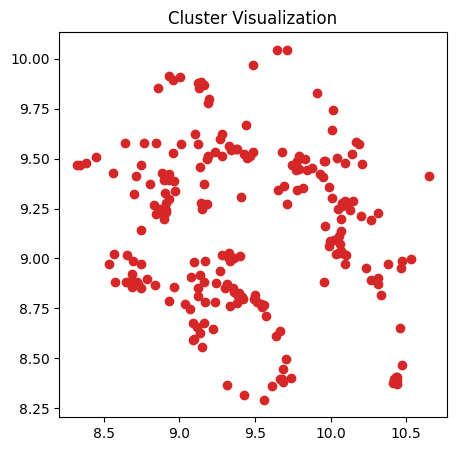

218
3739 " medical"
9011 " Sir"
9535 " Interest"
11045 " \|"
11112 " δ"
12225 " meetings"
12403 "Dav"
13217 "linux"
13908 " hack"
14103 "far"
14234 " clothing"
14731 " currency"
14734 "rus"
14861 " Tony"
14879 "APTER"
14965 " beings"
15002 " WITHOUT"
15055 "eda"
15183 "emale"
15194 "ē"
15226 "Container"
15281 "itated"
15286 "ARS"
15351 " myster"
15400 "IDE"
15536 " photograp"
15683 "roc"
15866 " spite"
15881 "genic"
16064 " museum"
16254 " placebo"
16262 "'>"
16652 "ARN"
16671 "rically"
17673 "$),"
22296 " supervised"
34023 "documented"
34277 "442"
34661 " interconnect"
34840 " Principal"
35049 " DU"
35158 "apopt"
35414 "WN"
35449 "Execution"
35554 " persona"
35592 " Parse"
35679 "accharides"
35699 " Newark"
35905 " budgets"
35933 "swap"
36196 " dc"
36423 "easy"
36452 " Greeks"
36647 "Donnell"
36703 " arche"
37052 "Annotation"
37263 " rectal"
37407 "approved"
37577 "atu"
37876 " moeten"
37953 "slo"
37983 "ARRAY"
37994 " '@"
38079 "medical"
38155 "向"
38210 "abetic"
38215 "felt"
38285 "e

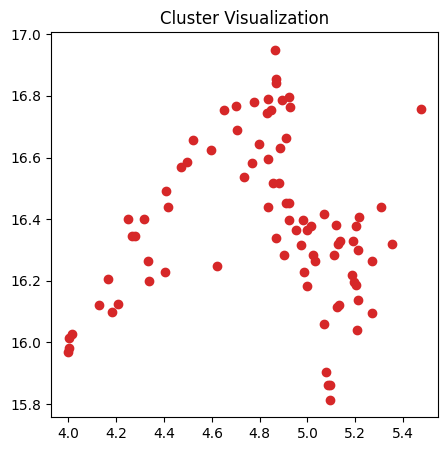

84
3408 " phase"
5183 " demonstrated"
5663 " belong"
6871 " iron"
7568 " demonstrate"
9517 " Appellant"
12064 "aussian"
12401 " unlike"
12722 "disc"
13814 " Python"
14125 " belongs"
14213 "phase"
14299 " Gaussian"
14371 " demonstrates"
14433 " reconstruction"
15014 " stared"
15292 " Disc"
15587 " respondent"
16011 " cytokines"
16381 " genotype"
16513 " Unlike"
16667 "Appellant"
16748 " remedy"
17029 " reconstruct"
17150 " terrorist"
17182 "six"
17184 "176"
17227 " demonstrating"
17337 " deserve"
18271 " Pred"
18392 "247"
18540 "rov"
18677 "rx"
18690 "MASK"
18867 "shared"
18996 " tightly"
18999 "PATH"
19080 " clever"
19109 " ces"
19225 " traff"
19262 "Prom"
19288 "olip"
19292 " "_"
19368 " Phase"
19378 "scar"
19379 " bilateral"
19408 " troubles"
19450 "Ns"
19467 "Lib"
19627 " orthogonal"
19659 "asury"
19710 "Prote"
19806 "ın"
19892 "akespe"
19923 "jour"
19953 "etta"
19993 " procedural"
20015 " FE"
20050 "actin"
20053 "Program"
20073 " storing"
20211 " errno"
20225 "^."
20290 "otics"
203

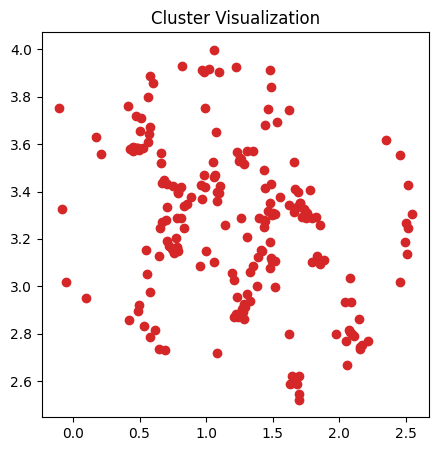

199
40 "G"
41 "H"
73 "h"
110 "�"
116 "�"
122 "�"
128 "�"
158 "�"
163 "�"
166 "�"
178 ""
191 ""
292 "et"
314 "ly"
328 "un"
331 " st"
361 "00"
362 " v"
377 "pp"
402 " su"
409 "rom"
419 " ha"
423 "end"
438 "ud"
499 " pl"
576 "
        "
585 "con"
644 " been"
660 " sc"
676 "low"
718 " ass"
799 " stud"
822 "========"
833 "ased"
939 "wn"
949 " through"
959 "ited"
1039 " way"
1120 "rest"
1128 "—"
1172 " exper"
1253 "–"
1374 "view"
1451 "chn"
1456 "hip"
1488 " wr"
1531 " cr"
1579 " lim"
1807 "uck"
1863 " sw"
1910 "onse"
2081 "itor"
2786 " concent"
2883 " fav"
3179 "vant"
3183 " recogn"
3272 "°"
4035 " continue"
4369 " psych"
8245 " baseline"
10143 " discharge"
12465 " deliber"
19207 "ctl"
21343 "quo"
21630 "cmp"
22684 " outward"
22985 "�"
23654 "gc"
23727 " softly"
25854 " halfway"
26513 " attenuated"
26641 " initialize"
26988 " glycos"
28941 "1234"
29118 "ensin"
29347 " Pand"
30967 "702"
38411 "
             "
41779 " FY"
42794 " mappings"
43552 " lupus"
44295 "further"
44746 " narrowing"
4

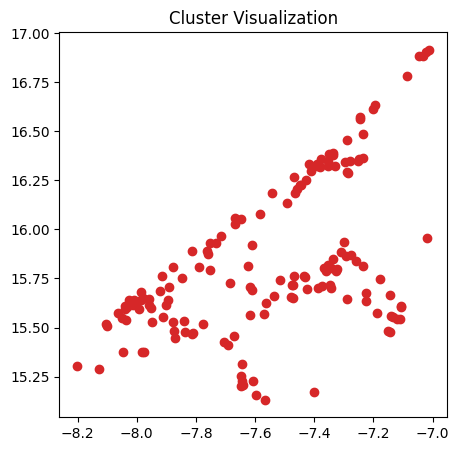

155
24075 " comor"
24735 "uclide"
25077 " Н"
25211 " bowel"
25268 "particle"
25324 "Jon"
25483 "glass"
25518 "Н"
25559 "Japanese"
25634 "ност"
25733 "ollen"
25969 " aunt"
25991 " migrants"
26032 "compile"
26064 " Lud"
26067 "bard"
26088 "1371"
26110 " corros"
26123 "Lee"
26143 "Being"
26172 "}%"
26185 "los"
26201 "bearing"
26204 "against"
26221 "398"
26230 " estimating"
26257 "rary"
26281 " eligibility"
26296 " pandemic"
26329 " Zero"
26330 "Region"
26332 " ie"
26348 " closet"
26352 " yo"
26364 "flux"
26370 " stiffness"
26374 "uously"
26399 "MK"
26401 " fundamentally"
26402 " 305"
26406 "cine"
26415 " rooted"
26437 "�"
26444 "ères"
26455 " synerg"
26458 "binary"
26463 "stead"
26467 " Portuguese"
26471 "oso"
26485 " Frederick"
26487 "�"
26491 "esse"
26494 " aureus"
26505 " cortic"
26506 " internally"
26512 "hey"
26527 " rhetoric"
26528 " spleen"
26545 " disabilities"
26547 " submar"
26549 " spaced"
26551 "trivial"
26552 "月"
26561 "Zero"
26568 "_{-\"
26579 "pragma"
26581 "�"
26582 " affi

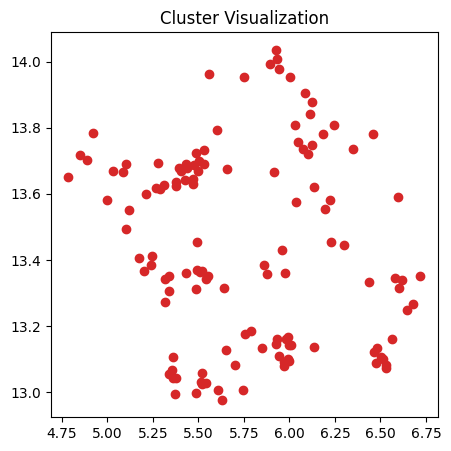

126
776 " our"
3824 " Our"
6067 "Our"
13346 "clipse"
13552 "priv"
13696 " bike"
15368 " spell"
15553 "ographical"
15601 " Mut"
15626 " analysed"
15772 " institutional"
16100 " enterprise"
16141 " �"
16444 "idade"
16653 " lag"
16701 " insisted"
16757 " constructor"
16883 " confirmation"
17003 " ARE"
17046 " spontaneous"
17048 "026"
17089 "mys"
17287 " Fab"
17367 " Ontario"
17463 " dock"
17507 " drunk"
17517 "="../"
17524 " clustering"
17539 " Hil"
17587 " pays"
17639 " cheer"
17828 "iterator"
18186 "uating"
18311 " ultr"
18329 " deployed"
18398 "rex"
18439 " desperate"
18557 " woods"
18920 "para"
19033 " vine"
19543 " inventory"
19640 " vaccination"
19790 " NMR"
19800 " diox"
20154 "parser"
20799 " Kir"
20935 " integers"
21213 " abrupt"
21639 "ducer"
22407 " refined"
23406 " clo"
25109 " javascript"
31413 "Employ"
31533 " insists"
32472 " Eclipse"
32576 " Institutional"
33269 " restoring"
33276 " Bryant"
33463 " Parlamento"
33483 "ruce"
33612 "Greg"
33742 "inho"
33818 "Amb"
33826 " expl

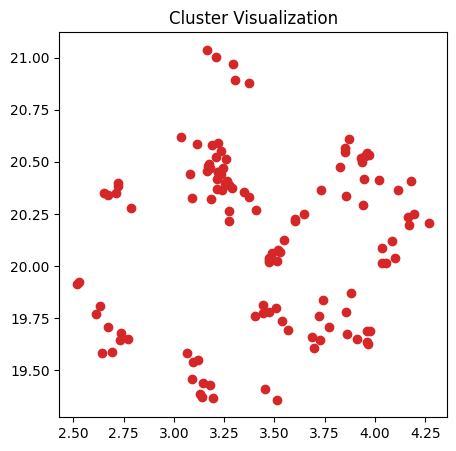

119
11191 " Sat"
17417 " loops"
18199 " Native"
19263 " Raw"
19319 "260"
20022 " blockchain"
20070 "178"
20084 "333"
20147 " polymers"
20152 " JO"
20270 "186"
20311 " proceeded"
20347 "lm"
20355 "preced"
20368 " intraven"
20378 " Script"
20387 " accus"
20479 "assy"
20486 " configure"
20593 " Dest"
20625 "aned"
20701 " economics"
20734 " Denver"
20743 "RX"
20767 "!=="
20768 "Est"
20785 "227"
20786 " gle"
20794 "Sat"
20817 " ت"
20850 " sudo"
20862 " syscall"
20867 "eme"
20878 "igg"
20890 " ``"
20896 " biomarkers"
20943 " attenu"
20965 " abst"
20972 "okers"
20990 "Den"
20997 " surgeon"
21005 "runtime"
21026 "ximately"
21068 " reproduction"
21076 " weaker"
21104 "urban"
21196 "states"
21198 " stressed"
21206 "omi"
21217 " Verm"
21242 " genius"
21246 " Stadium"
21305 " Stop"
21308 " sind"
21316 "}&"
21319 " behave"
21320 "ationally"
21322 "お"
21323 " construed"
21368 " Universe"
21369 "eneration"
21373 "ovation"
21385 " Rab"
21395 "ToString"
21405 " Wol"
21408 "Native"
21409 " consume"
2142

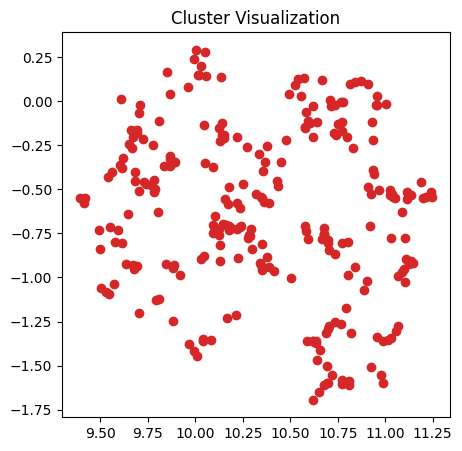

262
3473 " pressure"
4345 " agreement"
5141 " reduction"
8825 " soil"
9080 " diameter"
9516 " Hamilton"
9558 " artist"
9849 " Mot"
11593 " horizontal"
11976 "`,"
12364 " sauce"
12654 " verify"
13095 "                                    "
13300 " 
       "
13355 " $."
13386 " throat"
13387 " blame"
13522 ":="
13546 " obtaining"
13582 "                                        "
13663 ".*]{}"
13858 "Bs"
14029 " Euro"
14068 "irts"
15120 " casual"
15173 " CV"
15474 " barrel"
15776 " ignor"
16328 "olas"
16400 " overwhelming"
16413 "
  "
17293 "

   "
18738 " accepting"
18814 " gam"
21156 "SSL"
21981 "
                   "
22177 "                                                    "
23643 "0011"
24356 "                                                      "
24943 "{$\"
33282 "ampl"
33459 " prohibit"
33634 "
                                         "
33837 " trainer"
34448 " Critical"
36734 " haul"
36771 "ա�"
37452 "cultural"
37738 " Cherry"
38390 "liquid"
38493 " queer"
38904 "”;"
38953 " brak

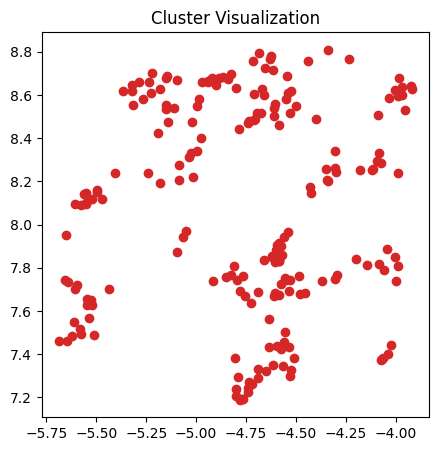

205
15734 ")}{\"
25422 " confinement"
25937 " suprem"
26060 " AJ"
26115 " formulated"
26166 " cosmological"
26175 "cool"
26860 " quotient"
27415 "Ts"
27519 " dessert"
27599 " closes"
27689 "Login"
27884 " só"
27953 " heavier"
28160 " Rivers"
28250 " tempo"
28286 "redited"
28326 "Speaking"
28364 " Satan"
28434 "ες"
28604 " recycling"
28669 " ts"
28691 ")–("
28764 "%""
28799 " readings"
28838 "toxins"
28864 "SHIFT"
28873 "502"
28882 "ramer"
28906 " neutrophils"
28920 " rotary"
28943 "447"
28980 " Welcome"
28986 "Fine"
29040 " Brandon"
29078 "responding"
29128 "Nd"
29147 " IQ"
29148 "14514"
29220 "ные"
29224 " preferable"
29235 "Nice"
29237 "RICT"
29238 " pave"
29250 " Laid"
29251 "603"
29262 " traders"
29292 " penis"
29305 "astery"
29307 " asynchron"
29323 " coerc"
29333 "�"
29340 "cerning"
29360 "393"
29387 " silently"
29390 " receivers"
29391 " permutation"
29431 "Career"
29445 "atial"
29446 " DNS"
29457 "ungal"
29458 " degenerate"
29459 " Neu"
29490 " Northwest"
29496 "anos"
29504 " w

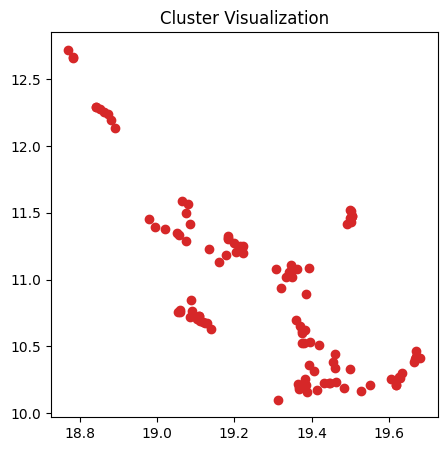

112
3032 " His"
4105 " poor"
4869 " maximum"
7231 " religious"
8389 "His"
9930 " columns"
10139 "ή"
10235 " coefficient"
10242 " invent"
10262 " presents"
10293 "isition"
10303 " coefficients"
10345 " weren"
10390 " honor"
10393 " usage"
10411 "й"
10445 " thereof"
10475 "uct"
10486 " simultaneously"
10499 " measuring"
10520 " Wilson"
10564 " activated"
10568 " requiring"
10598 "onymous"
10604 " bands"
10621 " soci"
10673 "�"
10700 "town"
10703 " Page"
10708 "package"
10709 " tur"
10755 " interior"
10762 " payments"
10783 " cyl"
10826 " OK"
10828 "Init"
10833 "ocyte"
10836 "pson"
10840 " Report"
10843 " legislation"
10847 "charg"
10856 " cable"
10857 " phosphory"
10864 " giant"
10891 " coinc"
10901 " elig"
10907 " banks"
10909 " 76"
10926 " reli"
10935 " loading"
10936 "vs"
10937 "Collect"
10961 "ин"
10964 " excit"
10969 " abnormal"
10983 " •"
10996 "Oper"
11009 " agencies"
11023 "buffer"
11031 " PE"
11048 " cultures"
11052 " decreasing"
11066 " yesterday"
11129 " mountain"
11174 "dig"


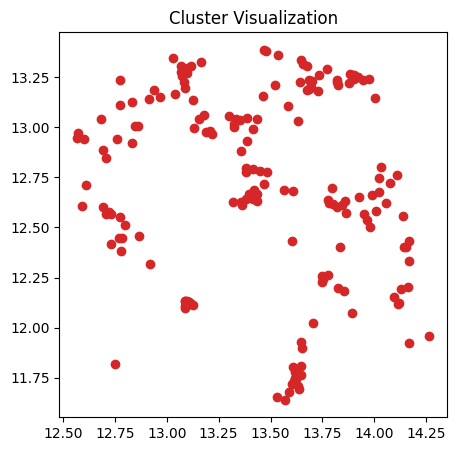

178
1309 " during"
8386 " kick"
10053 " Donald"
10375 " extracted"
12684 " fi"
13083 "verted"
13177 " inev"
13353 " surely"
13472 "derived"
13507 " EC"
13551 " collapse"
13753 "SW"
13777 "colon"
13792 "OST"
13807 "oche"
13997 " ip"
14204 " certificate"
14226 " criticism"
14307 " Turkey"
14334 " Mathe"
14350 " als"
14377 "有"
14380 "133"
14508 "imation"
14529 "scious"
14536 " localization"
14562 " drama"
14573 "cu"
14616 " Tai"
14621 "itarian"
14639 "oton"
14679 " slope"
14767 "_["
14770 " irrad"
14782 " wore"
14799 "oca"
14806 "into"
14839 " emissions"
14865 " PART"
14898 " lifestyle"
14904 " obligation"
14941 "vens"
14957 " styles"
14967 " mayor"
14970 " replication"
14993 " seeks"
15001 "ynthesis"
15006 " IFN"
15007 "wave"
15024 "resource"
15036 " shifts"
15052 " frustr"
15060 " hearts"
15064 "urred"
15073 " Related"
15081 " claiming"
15101 " Him"
15119 "ismo"
15122 "OWN"
15133 " fishing"
15139 "letter"
15146 " upcoming"
15155 "Mo"
15162 " Farm"
15164 "rg"
15165 " landing"
15167 " You

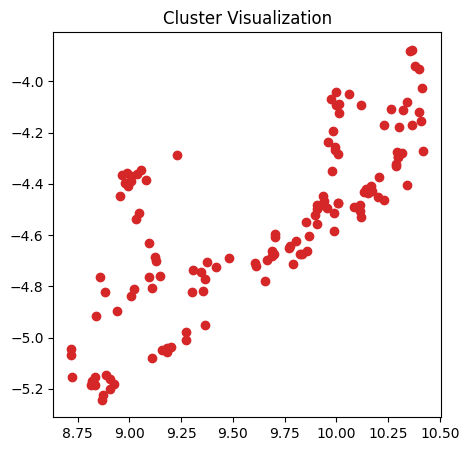

133
1656 "]\]."
2498 "])."
2536 ""})."
5712 " Rel"
6703 " inner"
6788 "")."
7767 " enforce"
7902 " Johnson"
7903 " Max"
8137 " identification"
8469 "Gu"
8582 " Tem"
8610 " COM"
8620 "Good"
8660 " dust"
8685 " era"
8693 "Last"
8708 " organic"
8743 ">("
8868 " flux"
9085 "terior"
9162 " classification"
9171 " scal"
9247 "ел"
9262 " submitted"
9281 "Okay"
9283 "oir"
9325 "ador"
9329 " radical"
9330 " 85"
9338 " alive"
9339 "ZE"
9344 "obj"
9372 " counts"
9393 "ifer"
9430 "2004"
9440 "idential"
9467 "ン"
9469 " patent"
9472 " Color"
9473 "||"
9482 "ARR"
9491 " Services"
9507 "COM"
9522 "ologic"
9524 " Ig"
9528 "olid"
9534 " situations"
9539 " crowd"
9540 "neq"
9542 " complicated"
9543 " Labor"
9547 "Mat"
9553 "enter"
9560 " crucial"
9568 " ré"
9573 "attr"
9578 " correlated"
9585 " Club"
9590 "essions"
9594 "ibilities"
9605 " cav"
9607 "estival"
9623 "iem"
9626 "appoint"
9636 " på"
9646 " grade"
9654 " 63"
9656 "LECT"
9672 "(*"
9676 " illegal"
9681 "agues"
9684 "Max"
9688 " url"
9692 "Ac"
970

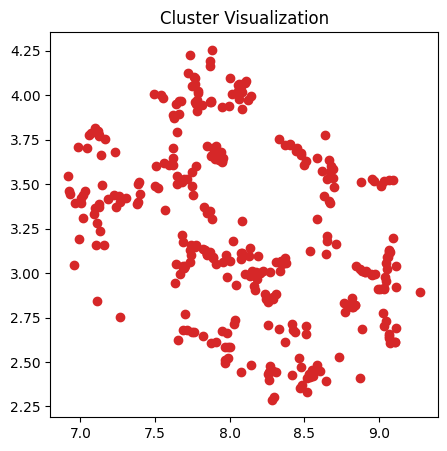

327
1496 "

   "
7633 "
          "
8431 "
     "
13324 "lat"
15314 "itance"
17556 "tech"
19492 " crops"
21898 " 
  "
23893 "           
 "
24541 "npm"
24894 "leted"
33252 " Anglo"
40562 "freak"
41027 " thwart"
41714 " lays"
43261 " ming"
43380 " Philosoph"
43840 "Fc"
44098 " youthful"
44228 "ipeg"
44267 " builders"
44297 " trenches"
44535 " follicles"
44577 "~:"
44608 " ortholog"
44638 " diplomacy"
44708 " expatriate"
44815 "rendan"
44868 " blindness"
44872 "abbath"
44882 "IVATE"
44914 " pedig"
44925 " Heroes"
44977 "ppings"
44998 " Gig"
45085 "1177"
45110 "ramble"
45140 " puncture"
45188 " här"
45195 "overrightarrow"
45199 " freshwater"
45234 " pessim"
45298 " 666"
45336 "eson"
45351 " Reverend"
45412 "Payment"
45417 " swine"
45425 " propagator"
45443 "]['"
45453 " retrograde"
45456 "ivist"
45476 "ствен"
45512 " piercing"
45537 "eti"
45633 " bri"
45638 " FAM"
45646 " politely"
45661 " pinpoint"
45673 " Dud"
45681 " Ludwig"
45685 "ār"
45690 " Scots"
45748 "身"
45769 " semen"
45785 " ru

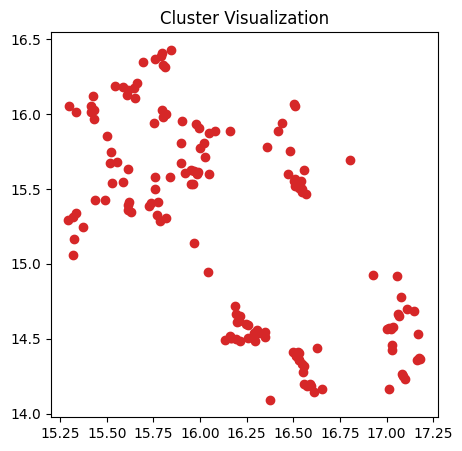

154
5933 " algorithm"
7927 "helial"
8041 " attend"
9170 " Mult"
9601 " Mean"
9748 " 1992"
10203 "Gener"
10217 "osome"
10313 " reveal"
10314 "Pi"
10333 " 1970"
10404 "sys"
10473 " enforcement"
10656 " administrative"
10682 "itrogen"
10693 " hardly"
10766 " Kim"
10810 "PER"
10876 " Ol"
10917 " atoms"
10981 "stra"
11001 "Mult"
11069 " destroyed"
11081 " discrimination"
11082 " metabolism"
11083 " nerve"
11166 " edition"
11179 " vessel"
11180 "urd"
11192 "opes"
11197 " Carl"
11275 " 79"
11316 "cb"
11327 " Wat"
11332 " teen"
11333 " algorithms"
11340 "push"
11341 " admission"
11445 " Rog"
11449 " confront"
11522 " nodded"
11534 " folder"
11553 " Pacific"
11565 " mais"
11566 " butt"
11573 " Little"
11612 " attended"
11664 " fel"
11675 "cus"
11690 "oplasm"
11701 " improvements"
11703 "º"
11722 "urable"
11733 "icing"
11749 "Factory"
11750 " batt"
11781 " fusion"
11789 " rice"
11840 "OG"
11865 " paths"
11876 " sys"
11926 " worried"
11936 " Sea"
11943 "nan"
12013 " writes"
12015 " clim"
12017 " 

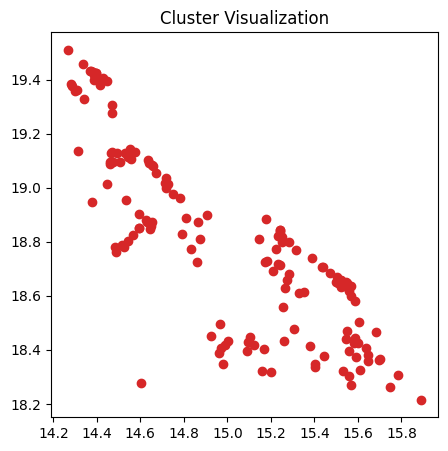

153
672 " when"
8065 " 1998"
8210 " 1997"
8441 " 1996"
9453 "when"
10655 "105"
10803 "monary"
11104 " attribute"
11123 " galaxies"
11238 "104"
11271 " Pass"
11443 " ($\"
11447 " User"
11477 "IVE"
11496 "1998"
11518 " conservative"
11542 " bounded"
11650 " Asian"
11758 " °"
11764 " lipid"
11777 " Mir"
11778 "Have"
11818 "cies"
11847 " commitment"
11857 " swit"
11859 " concrete"
11864 " Mid"
11889 "isen"
11898 " shook"
11909 "Configuration"
11924 "anti"
11940 " AC"
11989 " Brook"
11991 "REG"
11994 " 1960"
11995 "аз"
12006 " dens"
12007 "ой"
12014 " similarly"
12031 " sli"
12046 " attitude"
12056 " AB"
12060 " flying"
12062 " ),"
12066 " Viet"
12083 "parse"
12084 "}]"
12094 "Command"
12100 " refuge"
12101 "TV"
12108 " filing"
12109 "hang"
12113 "words"
12117 "Typ"
12118 "Component"
12121 " Action"
12131 " 104"
12135 "activity"
12137 " crimes"
12149 " packages"
12153 " foundation"
12159 "]{}\"
12167 " Stephen"
12171 " locally"
12174 " Guard"
12175 "Width"
12182 " annot"
12190 " bunch"
1219

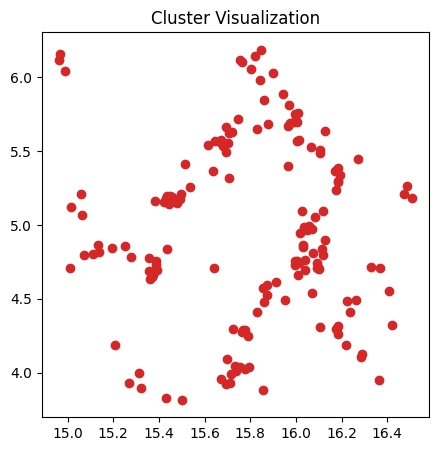

159
6522 " (!"
6558 " maintain"
6779 " representation"
7431 " candidate"
7712 " Sing"
7745 "Look"
8001 "\])."
8233 "rapeutic"
9282 " therapeutic"
9711 " silver"
9886 " bits"
9928 " permanent"
9953 " induction"
10011 " SC"
10031 " Model"
10049 " Van"
10120 "yd"
10129 " matches"
10144 "ropy"
10145 " accused"
10160 " oste"
10186 "world"
10207 "uer"
10260 " greatly"
10339 "GS"
10344 "prise"
10379 " butter"
10419 " proposal"
10451 " Harr"
10458 " tough"
10648 " Sher"
10881 "abeth"
11259 " orientation"
11339 " stupid"
11635 "enda"
11766 " rarely"
13856 " Moore"
14758 " Girl"
35163 "CCT"
35481 "Expected"
35618 " osteopor"
35640 "suggest"
36225 " HEK"
36295 "uje"
36470 "opf"
36472 " hepatocytes"
36534 " eman"
36615 "OY"
36738 " commenting"
36782 " entails"
36810 "(()"
36908 " doesnt"
36956 "ECD"
36966 " polypeptide"
37092 " roast"
37137 " má"
37308 "594"
37313 "aterally"
37317 " reviewer"
37414 " decks"
37468 " aura"
37583 "onium"
37610 " cuc"
37662 " NPC"
37779 " Libert"
37818 " Jiang"
37962 

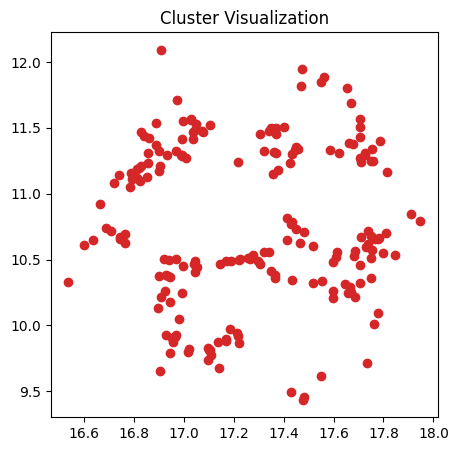

193
6162 " Port"
7335 " Sl"
8848 " institution"
9526 " Secretary"
9787 " industrial"
9844 " miR"
9933 " regional"
9946 " hydrogen"
10003 " institutions"
10263 " drawing"
10358 " plug"
10412 " crazy"
10448 "pie"
10465 " acet"
10494 "&&"
10498 " Case"
10542 " anymore"
10574 "formed"
10612 "Sl"
10687 " withdraw"
10728 " HR"
10770 " refers"
10775 " namely"
10779 "anim"
10782 " births"
10793 " whenever"
10812 "dest"
10853 "),\"
10882 " Image"
10999 "ques"
11032 " Museum"
11065 "{("
11102 " 71"
11120 " explicitly"
11122 " Space"
11149 " Point"
11167 "&#"
11222 " apps"
11233 " lips"
11310 "materials"
11502 "NET"
11577 "internal"
11623 " resist"
11657 "ATED"
11688 "Port"
11725 " kinase"
11734 " entering"
12057 " physics"
12204 "acet"
12237 "double"
12282 " dates"
12438 " recruit"
12548 "VC"
12634 " promoter"
13016 " landscape"
13124 " Europ"
13375 " Nature"
13494 "requency"
13952 " airport"
14200 " wider"
14296 " Houston"
14385 " secretary"
14491 "bigg"
34715 " sop"
35052 " Architecture"
35124

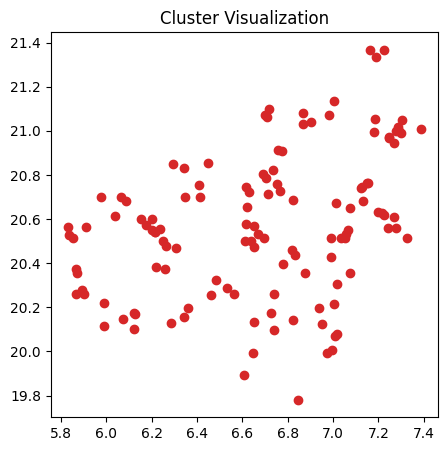

126
12526 " Unfortunately"
16698 "Example"
17245 " backed"
17442 " amplification"
17873 "something"
18300 " Statistical"
18384 " warming"
18466 " Example"
18583 "(__"
18631 "tery"
18669 "============="
18701 " qualities"
18723 " delivering"
18825 " demographic"
18883 " endorse"
18894 " Lau"
18907 " Chi"
18947 "�"
18983 " prognostic"
19008 "Mad"
19065 "mont"
19101 " quotes"
19121 " Room"
19128 " Tree"
19149 " educated"
19185 " coated"
19211 " cabinet"
19212 "INGS"
19217 "Engine"
19221 "school"
19228 "
							"
19235 " unfortunately"
19270 " outline"
19276 "brace"
19284 "Files"
19291 "Japan"
19293 "natural"
19297 " inability"
19320 "ANCE"
19333 " fires"
19349 " causal"
19350 "formula"
19355 " hosting"
19359 " OTHER"
19409 "　"
19418 " coaches"
19441 "LEN"
19443 "217"
19445 " purple"
19453 "tests"
19461 " endless"
19469 "Java"
19471 " adherence"
19476 " garage"
19481 " \~"
19483 " GA"
19485 " reign"
19499 "FLAGS"
19500 "ppy"
19528 " Roger"
19535 " robbery"
19552 "...)"
19570 "Helper"
19572

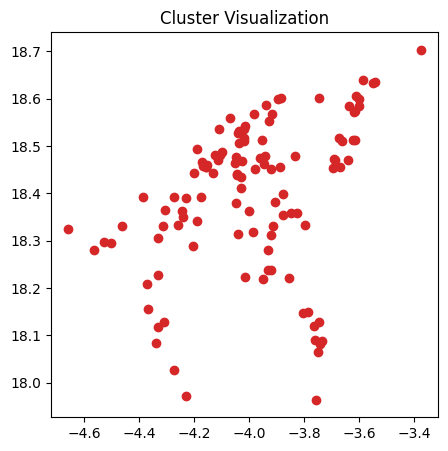

114
22839 "oubtedly"
23459 "NV"
24213 "propto"
24307 " hatred"
24322 "ods"
24325 " mont"
24326 "theme"
24384 "��"
24496 " Luther"
24548 "groupId"
24577 " chase"
24604 " Montreal"
24629 " Mode"
24666 " uncommon"
24671 " NV"
24678 " remarkably"
24682 " securing"
24714 " disturbed"
24717 "fetch"
24739 " Dirac"
24785 "bast"
24803 "278"
24814 "achy"
24819 " Tow"
24825 " jets"
24829 " \("
24830 "rade"
24845 "ctrl"
24847 " romance"
24869 " -="
24870 "ə"
24879 " MG"
24885 "аль"
24887 " quel"
24888 " correlate"
24920 " contamin"
24932 " sera"
24944 " Leo"
24949 " pag"
24953 "Hard"
24957 " ecological"
24961 " esse"
24981 " housed"
24982 " stacked"
24983 " crushed"
24993 "orpor"
24995 "valued"
25005 " Storm"
25007 "rile"
25013 "grades"
25016 "modified"
25020 "648"
25031 "racting"
25032 " furnished"
25033 " lightning"
25046 "Camp"
25047 " compromised"
25049 "matched"
25051 "ง"
25060 " steadily"
25062 " Karen"
25063 " Bren"
25064 " retrieval"
25065 " Pearson"
25071 "htm"
25072 " winding"
25074 "Sma

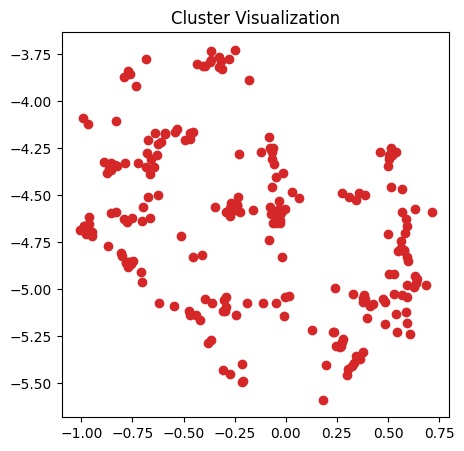

226
3973 " First"
4950 " revealed"
5115 " achieve"
5407 " replacement"
5409 "uman"
5457 " ampl"
5470 "db"
5543 "AND"
5556 " optim"
5570 " agent"
5585 "agement"
5591 " UK"
5613 " τ"
5615 " sexual"
5653 "False"
5699 " huge"
5725 "orrow"
5731 " update"
5756 "chen"
5758 "open"
5765 " vert"
5774 ".]("
5829 "osc"
5853 " technique"
5855 " weap"
5863 " Up"
5880 " cycle"
5905 "coh"
5922 " 33"
5947 " cir"
5950 " recorded"
5954 "antly"
5958 " rank"
5962 " biggest"
5971 " classes"
5972 " herself"
5976 " 42"
5981 " format"
5992 "det"
6022 " Bank"
6036 " joint"
6037 " Air"
6046 " noise"
6054 " rise"
6068 " guys"
6089 " Well"
6095 " requirements"
6097 "′"
6102 " Such"
6105 " church"
6113 "cs"
6118 "ners"
6136 "isted"
6159 "BI"
6161 " coe"
6165 "kappa"
6168 "het"
6177 ")?"
6195 " lit"
6204 "look"
6206 " testimony"
6214 "etes"
6234 "»"
6248 " symm"
6255 " mental"
6268 " std"
6275 "last"
6283 " properly"
6284 " interests"
6292 "nam"
6297 " mechanisms"
6302 "":""
6303 " master"
6308 " spot"
6309 "just"
6

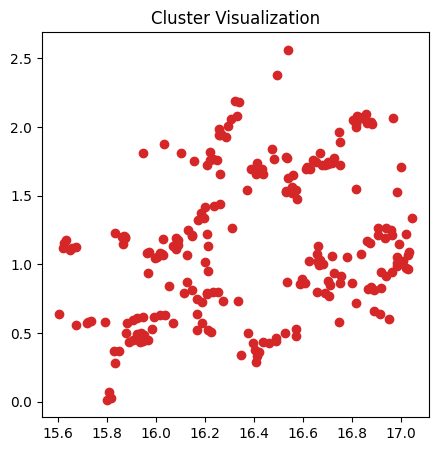

232
9308 "DP"
9584 "orne"
9906 "google"
9913 "160"
10004 "Select"
10026 "nership"
10096 " dependence"
10198 " streets"
10216 " prejud"
10414 " references"
10435 " contrad"
10516 "Link"
10581 " rear"
10590 " aer"
10727 " FROM"
35765 " tearing"
36741 " Christie"
37297 " capita"
37312 " vra"
37478 " vested"
37521 " Dash"
37523 " rt"
37676 " researching"
37722 "inberg"
37753 "))="
37798 " copolymer"
37936 "ivi"
37947 " Nom"
38103 " telome"
38112 "ALTH"
38118 " FGF"
38211 "controls"
38364 "azard"
38408 " ancestry"
38438 "ORAND"
38444 "σης"
38494 " Lives"
38525 " blogging"
38537 "Guest"
38571 "Testing"
38573 " psori"
38659 "compat"
38680 "quier"
38685 "ITERATION"
38687 "Culture"
38743 " Ready"
38815 "ASHINGTON"
38837 " loader"
38852 "rz"
38907 " dusty"
38939 " 392"
38943 "}}|"
38952 " allied"
38963 " 434"
39001 " Stefan"
39007 "Om"
39030 " Midwest"
39037 " Sew"
39097 " marathon"
39101 "jee"
39103 " speedy"
39109 " ophthal"
39139 "Export"
39146 "ე�"
39151 " nv"
39160 "keepers"
39163 " squat"


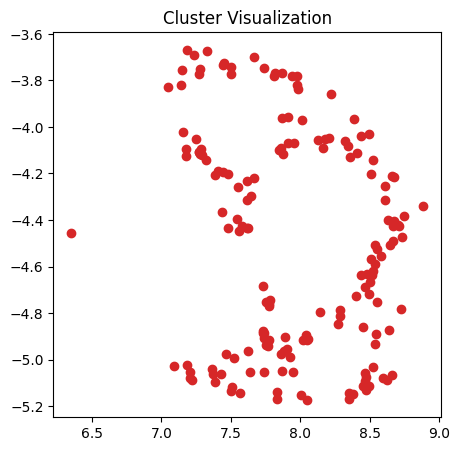

164
2746 " approach"
4332 " 2011"
5224 " indicate"
5276 " prove"
5670 "ascular"
5788 " survival"
6064 " resolution"
6333 " module"
6492 " indicates"
6701 " thanks"
6966 " shock"
7048 " appellant"
7069 " Sum"
7301 " bool"
7340 " sensitivity"
7406 " Louis"
7542 "Since"
7680 " contribution"
7768 " oxygen"
7771 " fle"
7809 " indicating"
7830 " payment"
7946 " oral"
8148 " Cle"
8150 " toler"
8209 "FIG"
8410 " employment"
8517 "prote"
8539 "')."
8602 "2007"
8690 " coach"
8703 "**("
8746 " dual"
8754 "wa"
8774 "summary"
8795 "]$"
8843 " newsp"
8880 "Button"
8881 " debate"
8897 "008"
8899 " grew"
8909 " odd"
8930 " island"
8957 " surve"
8972 "009"
8989 " mask"
9030 "Gl"
9033 "ATA"
9049 " excited"
9072 "strong"
9093 " essentially"
9108 "bro"
9112 "Rel"
9114 "lie"
9120 "everal"
9123 " eating"
9163 "sche"
9175 " Control"
9176 " pin"
9192 " furn"
9201 "anol"
9204 "2005"
9206 " Object"
9215 " shoulder"
9220 "
						"
9224 " Plan"
9231 "rants"
9249 "ourse"
9265 "ircraft"
9270 "Frame"
9290 "card"
931

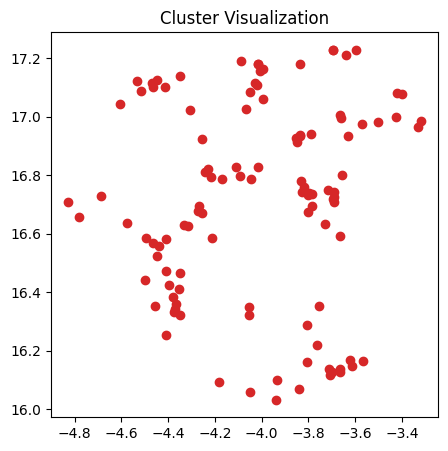

110
24002 "bserver"
24199 " listener"
24217 " exports"
24275 "dates"
24320 " maker"
24434 "CALL"
24497 " accessing"
24579 "ritory"
24588 " citizenship"
24591 " lyrics"
24618 " Falls"
24699 " copying"
24751 "achers"
24767 "within"
24776 "Desc"
24821 " vu"
24827 "mysql"
24844 " sealing"
24846 " capitalism"
24858 "Et"
24882 " Output"
24900 "Du"
24917 " logged"
24921 "Duration"
24940 " Roche"
24952 " NATO"
24959 "ographics"
24963 "NOTES"
24976 "ubs"
24978 " 211"
25018 "cuse"
25021 " consulting"
25030 " ****,"
25037 "shine"
25057 " leverage"
25059 "isha"
25066 " mimic"
25090 "TY"
25091 " directing"
25095 " PUBL"
25097 " establishes"
25101 "culation"
25111 " KEY"
25129 "ICAL"
25135 "}^{+"
25141 " creditors"
25161 " Context"
25190 "ungs"
25192 "tb"
25197 "1971"
25201 "ORM"
25203 "ingen"
25222 " enhances"
25228 " Markov"
25229 " unaware"
25233 "_""
25237 " neighborhoods"
25238 "646"
25244 " pilots"
25261 "ICS"
25267 " reagents"
25270 " Finland"
25276 "所"
25277 ".—"
25297 " pads"
25309 " morphi

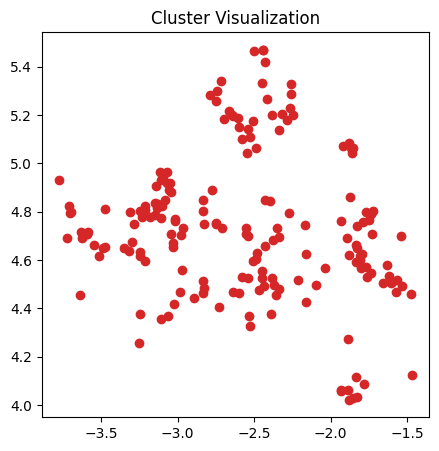

181
999 "ew"
2202 "idth"
4643 "                  "
4782 " British"
4880 ".\"
4926 "roy"
17377 " glanced"
17585 ").\"
17834 " glance"
21354 " draws"
22181 "cfg"
22197 " Gram"
22205 " bucket"
22832 "British"
23284 " harmon"
23596 " capacitor"
23645 " Fish"
23887 ""—"
24171 " navigate"
24323 " Pok"
24394 " histological"
24547 " Legal"
24962 " Oscar"
25042 " compelled"
25114 "Generic"
25314 "ZZ"
25467 "Metadata"
25487 " Briefly"
26103 " intermedi"
26129 "roscopic"
26284 "}}+"
26419 " Chuck"
26443 "？"
26460 "lead"
26543 " Luck"
26562 "WW"
26596 " Mueller"
26652 "mx"
26694 " unjust"
26726 " prud"
26752 " lex"
26808 "nanomaterials"
26904 "Static"
27023 " yarn"
27075 " [^"
27203 " lubric"
27454 " coincidence"
27617 " attr"
27734 " autism"
27841 " negligent"
27868 " cuando"
27873 " Benef"
27957 " oscillator"
28071 " socially"
28289 " Chronic"
28427 " intimid"
28437 " plugins"
28477 "USED"
28486 "repos"
28517 "Timer"
28542 " yr"
28577 " bipart"
28655 "
		   "
28675 " Fla"
28676 " integrals"
2881

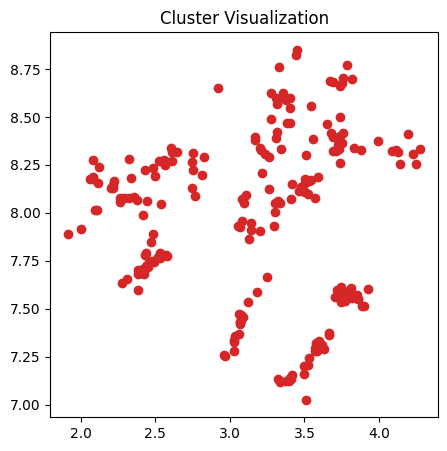

219
3965 " pretty"
14130 "instein"
16103 " Books"
19604 " conductive"
21120 "

        "
21963 " bovine"
22447 " PCI"
23402 "296"
24388 " reminder"
26009 "cerpt"
27046 "Holder"
27491 " tastes"
28017 "iev"
30047 " descriptor"
32476 "Mex"
32717 " suggestive"
33172 " repaired"
33544 " tore"
33687 "ipple"
33703 " locker"
33807 "ANE"
33996 "varpi"
34002 " uniqueness"
34027 " $$("
34455 "renched"
34649 "%);"
34862 " triplicate"
35005 " Е"
35315 " incumbent"
35547 "substack"
35720 " Done"
35860 "ivos"
35965 "&$"
36105 " Patterson"
36549 "Sto"
37788 " 454"
38165 " taller"
38170 "programming"
38487 "IOException"
39219 " Healthy"
39680 " grandson"
41519 " enactment"
41914 "Tg"
42325 "geo"
42331 " dealings"
42336 " Parm"
42510 " haplotypes"
42528 "Paint"
42593 " Clifford"
42642 " Cards"
42647 "momentum"
42688 " cabbage"
42690 "PLL"
42776 " gems"
42801 " patio"
42823 " щ"
42834 "0070"
42841 ":--"
42849 " Consortium"
42855 " Shipping"
42871 "ograf"
42882 "endpoint"
42900 " Trophy"
42934 "urous"
429

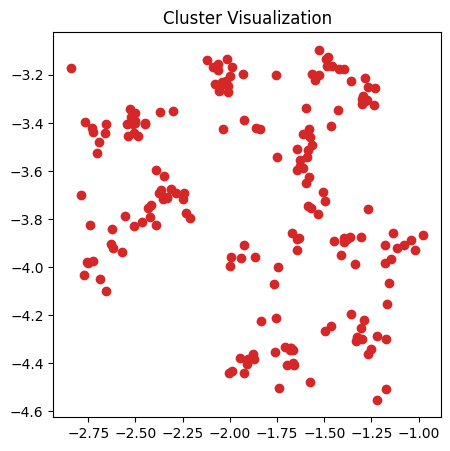

183
3771 " Just"
4051 " Gl"
4315 " matrix"
4323 " management"
4459 " carry"
4523 "ULL"
4608 "hand"
4623 " relevant"
4726 " School"
4743 " opinion"
4763 " receive"
4783 " gone"
4822 " collect"
4847 " absol"
4853 " define"
4863 "oses"
4882 " playing"
4883 "NS"
4911 "pective"
4925 " reached"
4928 " 
 "
4944 " fit"
4967 "Why"
4971 "grad"
4993 " fix"
5019 " combination"
5026 " thick"
5048 " channel"
5063 "abled"
5064 ">>"
5074 " animals"
5093 " seven"
5099 " jur"
5122 " mechanism"
5136 ":""
5146 "######"
5194 " agree"
5196 " conducted"
5226 " Pal"
5229 "Ct"
5238 " Section"
5250 "aching"
5285 "ctors"
5297 "ci"
5321 " save"
5329 " 45"
5339 " killed"
5350 " capacity"
5369 " unf"
5374 "info"
5378 "pir"
5381 " wat"
5386 " remove"
5397 "config"
5399 " Commission"
5421 " studied"
5425 "ifier"
5426 " definition"
5440 " cop"
5468 "acters"
5471 " feeling"
5476 " guess"
5478 "start"
5486 " meant"
5496 "Size"
5529 "UM"
5540 " 36"
5548 "},\"
5567 "istant"
5568 "ban"
5574 "circ"
5580 " sell"
5583 " recom

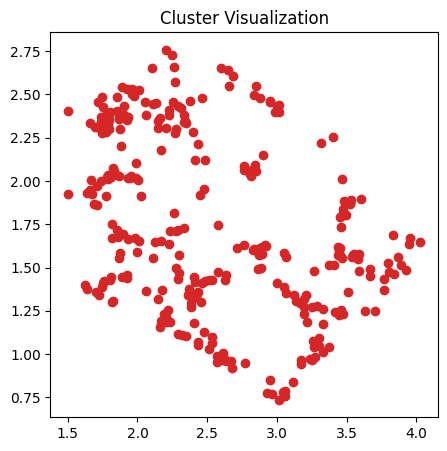

309
6 "%"
17 "0"
47 "N"
49 "P"
52 "S"
71 "f"
72 "g"
76 "k"
78 "m"
83 "r"
87 "v"
98 "�"
99 "�"
100 "�"
101 "�"
113 "�"
134 "�"
136 "�"
138 "�"
147 "�"
148 "�"
149 "�"
151 "�"
152 "�"
153 "�"
155 "�"
160 "�"
169 "�"
183 ""
188 ""
196 ""
205 ""
206 ""
208 ""
212 "�"
216 "�"
218 "�"
220 "�"
222 "�"
226 "�"
230 "�"
231 "�"
237 "�"
239 "�"
245 "  "
246 " t"
259 " w"
270 " b"
274 "ar"
286 "        "
289 " th"
291 "ct"
295 " n"
297 "om"
302 "ot"
311 "ol"
324 "ad"
332 "ver"
333 "ay"
343 "ir"
350 "ter"
351 "od"
385 " ex"
433 "red"
444 " E"
445 "ren"
453 "fe"
458 " le"
463 "ge"
469 "ich"
472 "ard"
479 " me"
517 "ound"
540 " int"
554 "ep"
561 "ens"
579 "ru"
599 "}}"
631 "port"
645 "ook"
649 "ft"
666 "aus"
674 "     "
675 "reat"
678 "eth"
707 "ces"
713 "ple"
717 " am"
788 "get"
797 "ert"
819 " pr"
842 "oint"
857 "ond"
866 " exp"
879 "ople"
901 "ollow"
902 "rit"
908 " used"
950 "ourt"
951 "cy"
991 "ax"
1061 " par"
1072 " same"
1081 " bu"
1092 "],"
1098 " stat"
1130 "ethod"
1155 "velop"
1409 " 

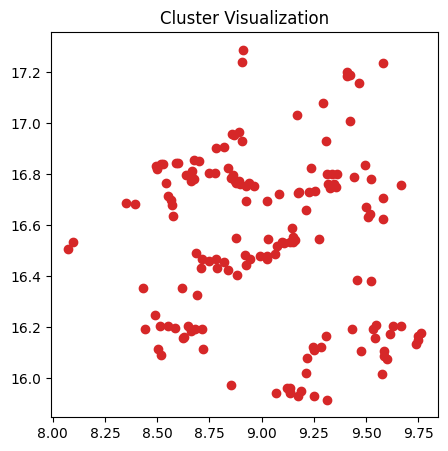

155
7238 " egg"
9023 " promise"
10300 " Given"
10729 " incubated"
13432 "DH"
13566 "^{+"
14650 "ping"
15339 " nurse"
15768 "Given"
16281 "Pal"
16480 " Account"
16587 "360"
16724 " „"
16831 " uh"
16861 " Singapore"
16951 " 360"
16966 " promises"
16970 "acked"
17002 " asthma"
17014 "addle"
17026 " Oak"
17027 "carbon"
17051 " holder"
17055 " collecting"
17063 " deposited"
17083 "odynamic"
17095 " predetermined"
17101 "flag"
17104 "Users"
17106 " Neither"
17113 " pens"
17118 "wt"
17123 " bitter"
17134 " hind"
17140 "capt"
17141 "า"
17145 " Kr"
17168 "}:"
17169 " "'"
17172 " oldest"
17178 " pressing"
17189 " instructed"
17191 " receipt"
17192 "plication"
17195 " abroad"
17196 "Changed"
17203 " Studio"
17207 " downtown"
17210 " ranks"
17217 "woman"
17226 " Oil"
17237 ""
17252 " Auto"
17257 " verb"
17262 " agon"
17264 " journalist"
17269 " guards"
17270 "idding"
17272 " 03"
17281 ")](#"
17292 " royal"
17296 "xb"
17308 " acceler"
17314 " Rap"
17326 " baking"
17336 " concurrent"
17340 " agricu

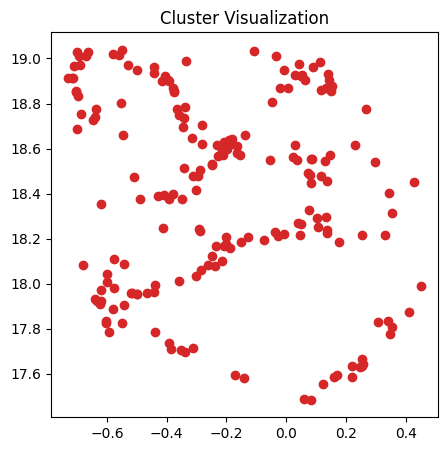

190
19451 "amon"
20224 "izophren"
21351 "215"
21764 " treasure"
22003 " trafficking"
22028 "uance"
22537 " immunohist"
22623 " cytometry"
22631 "pleted"
22702 " errnoErr"
22764 " Success"
22791 " benchmark"
22853 "igator"
22912 "denly"
22916 " disks"
22917 "EB"
22958 "forcing"
22960 "Cong"
22981 "218"
23044 "agles"
23051 "oux"
23065 " mathematics"
23079 "chrome"
23086 " bored"
23113 "0000000"
23128 " emitted"
23134 "enant"
23143 " iPad"
23147 " cosmic"
23151 "rij"
23158 " alliance"
23175 " securities"
23177 " Half"
23179 " invented"
23181 " WARRANTY"
23192 " arena"
23199 " VEGF"
23201 " depressed"
23205 " folding"
23206 " tribes"
23235 " SELECT"
23244 " goat"
23245 " networking"
23249 " Poll"
23251 " eternal"
23252 " verse"
23264 " Days"
23265 " continually"
23275 "binom"
23289 " executives"
23293 " unfortunate"
23296 "ICA"
23301 "icus"
23302 " Mack"
23307 " Personal"
23308 " gardens"
23314 "ettes"
23318 " advocates"
23330 "soever"
23337 "Love"
23344 "pine"
23349 " 320"
23350 "still"
2

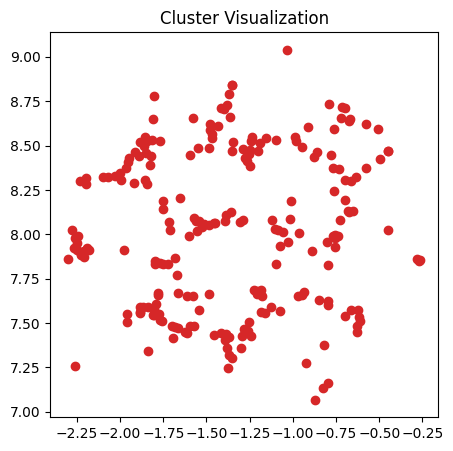

235
5913 " whatever"
7316 " query"
7503 " virtual"
9287 " remind"
15481 " BMI"
19294 " shouted"
20052 " tire"
21836 " Whatever"
21930 " 1944"
22420 " 1942"
23577 " \_"
24652 " 1952"
24759 "}}}^"
25713 "Whatever"
26429 " tires"
26509 " intermitt"
26523 " shouting"
26537 "azy"
26565 " rigorous"
27259 " functor"
27805 "lVert"
27823 "ITT"
27866 " profiling"
27921 " Options"
27971 "veolar"
28016 "rapped"
28101 "akov"
28271 "041"
28320 " SIM"
28480 " teachings"
28572 " advocacy"
28786 " Throughout"
28928 "argv"
28970 " MeV"
29106 " caffe"
29186 "volt"
29200 "?’"
29209 " shaping"
29287 "グ"
29317 "LAB"
29346 "ισ"
29415 "inz"
29505 " modo"
29512 " renders"
29619 "scheme"
29632 " WHAT"
29677 " Aber"
29696 " sew"
29732 " Koh"
29781 " asp"
29895 " ASD"
29917 "361"
29922 "neapolis"
29951 "obacteria"
30011 " Cand"
30041 "Û"
30076 "includes"
30117 " vanished"
30123 " Query"
30154 " Orthodox"
30313 " Distribution"
30386 "Sex"
30392 " REST"
30514 " rud"
30517 " Cov"
30519 "Must"
30547 " sket"
30551 " s

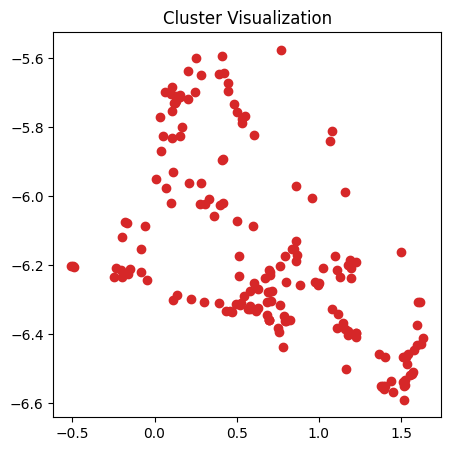

176
5271 " Aut"
5307 " 2000"
5332 " Jack"
5671 "itect"
5912 " probability"
5937 " chrom"
5951 " trig"
6099 " о"
6101 " Any"
6109 " mobile"
6164 " anc"
6197 " sentence"
6211 " citiz"
6215 " ship"
6231 "iant"
6257 "**]{},"
6272 " Are"
6304 " Del"
6345 " breath"
6353 " particles"
6358 "ias"
6365 " Met"
6369 "NT"
6381 " insp"
6428 "=========="
6435 "GG"
6459 " greatest"
6497 " fell"
6501 " gonna"
6502 " enem"
6506 "Yeah"
6521 " mouse"
6542 "Array"
6564 " д"
6567 ",-"
6573 "Color"
6574 " miles"
6575 "ando"
6588 " Kore"
6602 "/\"
6611 "typ"
6627 " bright"
6628 "ses"
6629 " schools"
6637 " spectrum"
6638 "xture"
6652 " lov"
6653 "aper"
6658 " serum"
6665 "ync"
6677 "ln"
6680 " battle"
6693 "Any"
6700 " Mem"
6716 "itative"
6719 "eles"
6722 " chronic"
6723 "Are"
6727 " tro"
6742 " delivery"
6747 " neither"
6748 "ading"
6751 " prosec"
6754 "ан"
6758 " Which"
6763 " thousands"
6767 "widet"
6769 " colon"
6770 "alian"
6781 " -->"
6790 "local"
6795 "small"
6799 " desired"
6807 " Foundation"
6809 " t

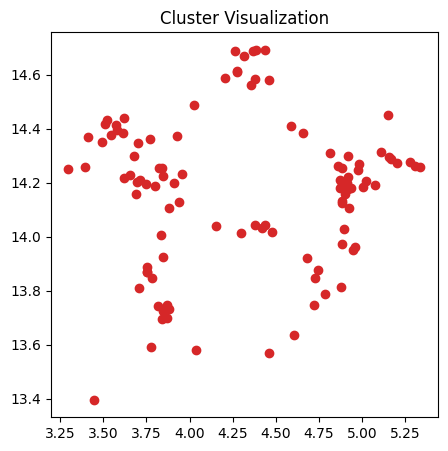

105
7078 "--------------------------------------------------------------------------------------------------------------------------------"
7168 " lose"
8438 " Jim"
10617 " leaf"
12804 "Util"
12829 " Ly"
13204 " bundle"
14631 " establishing"
15156 " minority"
15464 " trap"
15728 "}$-"
15760 "password"
16182 " methodology"
16399 " ci"
16555 " essay"
16707 " prolonged"
16815 "="../../../../"
17098 "}{{\"
17214 "Display"
17441 "Abstract"
17813 " validate"
18045 " accommodate"
18253 " sul"
18609 "trl"
18789 "nil"
18851 "Channel"
18857 " canvas"
19171 " TC"
19391 "supported"
19400 " cone"
19442 " hydrox"
19554 " simpler"
19558 "uu"
19642 "UK"
19709 "bris"
19747 "boldmath"
19765 "0008"
19846 "North"
19945 " equivalence"
19998 "Player"
20025 "生"
20027 "CAP"
20130 "oria"
20142 " chaos"
20171 " weaken"
20345 "�"
20389 " Need"
20465 "chemical"
20543 "ttes"
20574 " Freedom"
20605 " async"
20663 " HC"
20760 "emptyset"
20851 " Config"
20853 " θ"
20936 "operation"
21012 " compressed"
21286 " rehe"
2

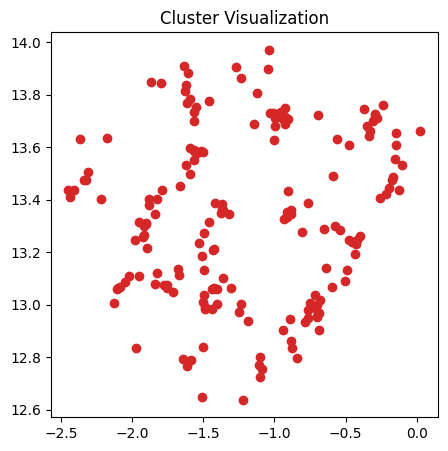

177
3676 " deep"
10589 " Team"
18147 " Deep"
20676 " Previous"
21033 " rotate"
21499 " flank"
22130 "328"
22249 "Screen"
22838 " Lucas"
22955 " Comment"
22991 " intentional"
23131 "USER"
23408 " CIR"
23476 " finest"
23816 " wildlife"
23946 "gart"
23947 " dilig"
24001 "USS"
24509 " indul"
24551 "emn"
24587 "ARGET"
24673 "andez"
24795 " empl"
24850 "Arab"
24909 " Month"
24979 "Warning"
25248 " illumination"
25830 " "^"
26248 "placed"
26339 " negotiate"
26376 " pivot"
26653 " Amsterdam"
26993 " Female"
27524 "Ly"
28221 "qt"
28403 "1965"
28625 "Lie"
29011 "Accept"
30458 "Immun"
30694 " TW"
30934 "Shared"
30985 "Setting"
30996 ",^[@"
31016 " ì"
31059 "Rock"
31216 "Captain"
31271 "aryl"
31280 "Anal"
31297 " Sty"
31321 " spontaneously"
31352 "Gar"
31384 "ishi"
31402 " virulence"
31404 "antine"
31439 "iseconds"
31449 " Motors"
31457 "lander"
31461 " من"
31477 "exist"
31499 " 308"
31561 " imbalance"
31571 "ubes"
31583 " Sequence"
31635 " Tyr"
31643 " EXPRESS"
31645 " Shi"
31648 " screws"
31651 

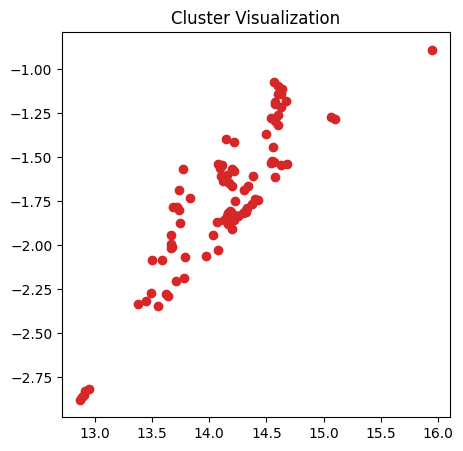

95
3733 " training"
5512 " approximately"
6804 " mixed"
8982 "Input"
9189 " facilities"
9417 " serving"
9504 "�"
9509 " facility"
9520 "fortunately"
9680 " conscious"
9703 " chose"
9704 " Oper"
9707 "THE"
9723 "root"
9813 " infected"
9824 "Filter"
9899 "]{}]{}"
9907 " viral"
9960 "sur"
9992 "020"
10008 "description"
10009 " disag"
10060 "ę"
10062 " talked"
10082 "mut"
10132 " regulations"
10161 "ор"
10175 " rows"
10202 "elihood"
10211 "minent"
10238 " bread"
10261 "~~~~"
10376 " pursuant"
10514 "ед"
10613 "service"
10789 "usal"
10873 " tomorrow"
33633 "Hmm"
34098 " Mathematical"
34237 "452"
34648 "lace"
34746 " hmm"
35210 " Biological"
35856 "stderr"
35909 " invaded"
36049 " trous"
36242 " Approximately"
36344 "approximately"
36483 "nM"
36577 " sip"
36581 " Hour"
36709 "078"
36821 "FH"
36871 "knowledge"
36926 " Bullet"
36968 " resisted"
37003 " Genetic"
37196 " deformed"
37267 "bins"
37316 " shutter"
37342 " Yuk"
37449 "ooter"
37703 " enforcing"
37881 "Russia"
37943 "EW"
37989 " bt"
38

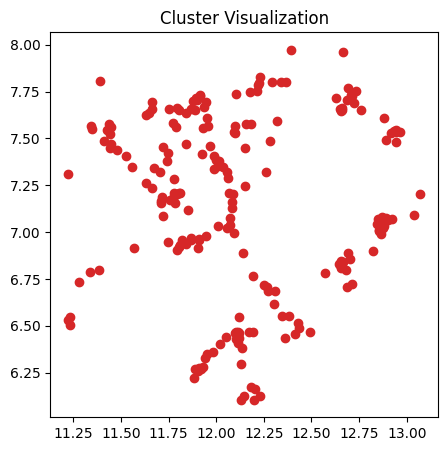

209
9043 " sed"
9502 "]]"
10971 "Finally"
11374 " Determine"
12512 "tri"
12772 " Fair"
12997 "owed"
13661 " pressed"
13702 " dreams"
13766 "PORT"
14112 " legislative"
14268 " cookies"
14400 " inhab"
14649 " generations"
14945 "�"
15316 " periodic"
15450 " downstream"
15558 " Wisconsin"
15590 " Var"
16702 "transform"
34923 "inian"
35821 " suburbs"
35894 "IMAGE"
36526 "áz"
36528 "endl"
36538 " Zel"
36831 "Psych"
36853 "Operator"
37269 "···"
37324 " helix"
37364 "isu"
37461 "ploid"
37562 " obsess"
37593 " imposs"
38192 "nyder"
38464 "753"
38812 " Remote"
38981 " parabolic"
39050 " kilometres"
39059 "opropyl"
39096 " mAb"
39349 " cursed"
39385 "pressing"
39416 " fazer"
39489 "canic"
39491 "GY"
39569 " Width"
39714 " Reddit"
39721 " kidnapping"
39785 " Mant"
39823 " MOD"
39990 "descriptor"
39991 " otro"
39996 "Yo"
40013 "Actions"
40172 "urai"
40176 "icki"
40209 " tresp"
40284 " hypogly"
40383 "gently"
40392 " Bec"
40397 "magic"
40422 " rut"
40430 " duplicates"
40459 " highways"
40496 " admo

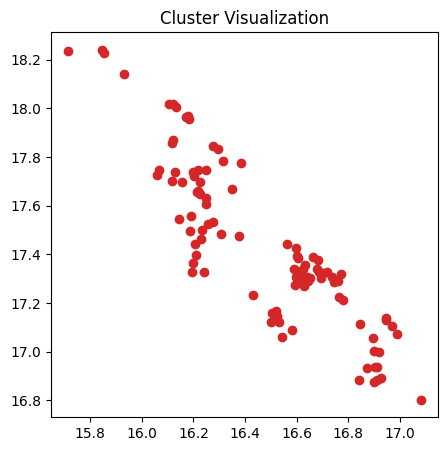

102
7214 " Only"
11124 "112"
11223 "Em"
11320 " pocket"
11355 " reduces"
11371 " settled"
11410 " enabled"
11415 "awa"
11437 " �"
11439 " 83"
11507 ".),"
11517 "ijn"
11531 " inhibitors"
11532 " believes"
11544 " determin"
11558 " denomin"
11560 "dagger"
11564 "Only"
11576 " doctors"
11585 " retire"
11595 " manual"
11598 " screw"
11601 " 114"
11630 "ύ"
11632 " func"
11633 " 112"
11659 " availability"
11692 " household"
11697 " personally"
11698 "aceut"
11705 " strip"
11717 "master"
11721 " cig"
11731 " CEO"
11747 "dam"
11752 "Under"
11759 " Error"
11771 " competing"
11772 " wake"
11783 " mamm"
11785 " conve"
11792 " steady"
11803 " studio"
11806 "door"
11809 " designs"
11811 " ships"
11812 " divisor"
11816 "ogl"
11821 " portions"
11827 "�"
11830 "dl"
11834 " beneath"
11836 " hepat"
11854 " AF"
11873 " lect"
11878 " ratios"
11884 " lateral"
11888 "Using"
11893 " oxide"
11899 "\>"
11901 " dial"
11914 " sodium"
11916 " athlet"
11919 "usr"
11920 "textrm"
11930 "Location"
11937 " metall"
119

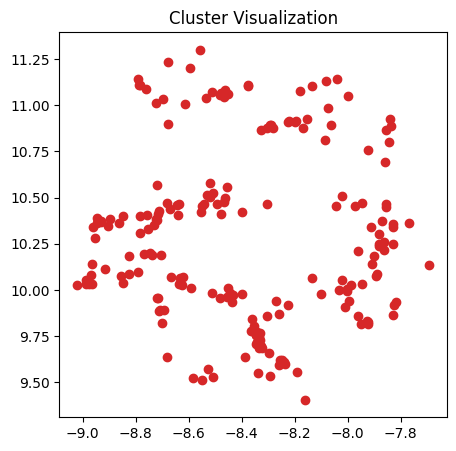

198
26396 " Transport"
26441 " advancing"
26812 " Bayesian"
27052 " foi"
27069 " Campaign"
27098 "ある"
27164 " tops"
27245 "onaut"
27249 " insurer"
27280 " Nak"
27300 "SEL"
27350 " intuitive"
27400 " prol"
27448 "ertained"
27482 "}<"
27492 " Applications"
27588 "DECL"
27626 " Taken"
27638 "rance"
27656 "Jeff"
27660 "MODULE"
27667 " dispersed"
27668 " secreted"
27716 "gold"
27828 " Reform"
27857 " impacted"
27860 "_{+"
27864 "GAG"
27871 " bargain"
27910 " Lac"
27918 "chor"
27958 "Know"
28011 "reader"
28012 " exposures"
28014 "School"
28022 " stakeholders"
28025 "meas"
28037 " flooding"
28040 "CLE"
28094 "mr"
28114 " cracked"
28117 "gall"
28128 "))**(-"
28133 "jer"
28134 "umbs"
28139 " Wing"
28158 "wright"
28164 " vegetation"
28169 " lakes"
28177 " Amer"
28188 " Ridge"
28196 " tangent"
28217 " discs"
28224 " cartoon"
28230 " Roth"
28241 " Metal"
28244 " Admiral"
28245 " theat"
28254 "よう"
28258 " Shadow"
28259 "VS"
28262 " acquaint"
28267 " annotated"
28270 " Thirty"
28283 " Creative"
2828

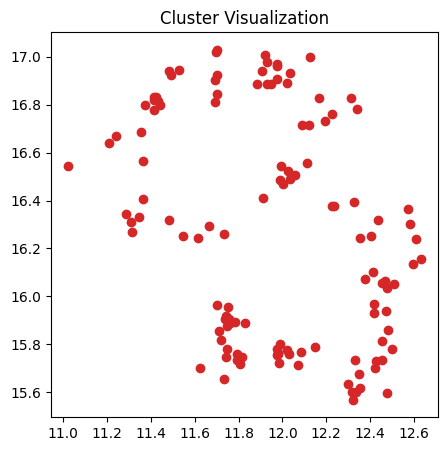

122
7450 " push"
7484 " plot"
7648 " Free"
8094 " molecules"
8373 " Bas"
9232 " capture"
9376 " assumption"
9567 " Best"
10001 "$_"
10184 " pushed"
10688 " colour"
10718 " Master"
10848 " captured"
11141 "Arg"
11186 " northern"
11394 " barrier"
11680 " Consider"
11860 "shot"
11982 " Sn"
11988 " Cambridge"
12034 " 1987"
12172 "103"
12289 "redit"
12367 " slic"
12383 " ----------------------------------------------------------------"
12409 "ouston"
12435 " spiritual"
12439 " unexpected"
12568 " Games"
12570 " molecule"
12575 " pill"
12602 " Study"
12644 " neu"
12665 " Hay"
12688 " Lady"
12706 "ici"
12803 " duties"
12810 " Bru"
12861 " deeper"
12896 "groups"
12906 " reflection"
13094 "prison"
13116 "effective"
13139 "Fs"
13192 " г"
13206 "figure"
13216 " personality"
13219 " Psych"
13229 " pad"
13233 "gly"
13247 " Korean"
13259 "application"
13314 " Histor"
13326 " entre"
13344 " throm"
13376 " Afghan"
13383 " pushing"
13388 " vertices"
13422 "Search"
13503 " complement"
13525 " Full"
1355

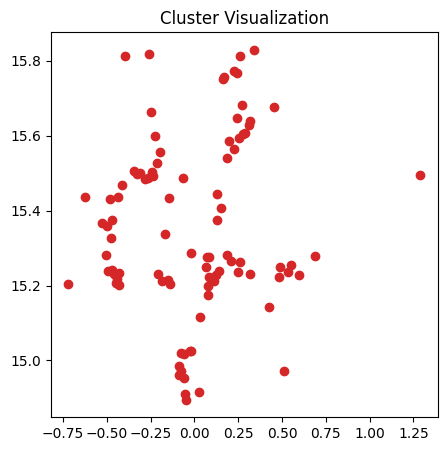

93
1955 " due"
2253 "_\"
2850 "^\"
6320 "normal"
9616 "}^\"
11086 " Ba"
11110 "}_\"
12571 " Due"
13536 " Adv"
17746 " Recently"
17842 " Between"
17858 " transfected"
20839 " Justin"
21001 " Prof"
21067 " şi"
21186 " owns"
21195 " fork"
21964 "ään"
22006 " Constant"
22029 "258"
22046 "withstanding"
22078 " Ice"
22164 "ucc"
22169 " Beth"
22199 " paradigm"
22305 "�"
22316 "rept"
22424 "hover"
22479 " LORD"
22488 "408"
22545 "シ"
22594 " cath"
22629 " differentiate"
22698 " underest"
22733 " GT"
22755 " Chile"
22868 "ceedings"
22968 " sher"
23078 "ynchron"
23088 "Basic"
23091 " Princess"
23107 " safer"
23153 "்"
23185 "297"
23223 "itives"
23295 "keyword"
23372 "Attributes"
23378 " referenced"
23420 " farming"
23444 " buses"
23455 " UC"
23473 " keyword"
23502 "ALE"
23581 "owing"
23597 "}|\"
23609 " purification"
23610 " Panel"
23612 "lando"
23618 " hypoxia"
23628 "^*("
23697 " forgive"
23781 "...]"
23827 " dealer"
23879 " transfection"
23902 " Grey"
23927 " adjustments"
23988 "oko"
23999 " r

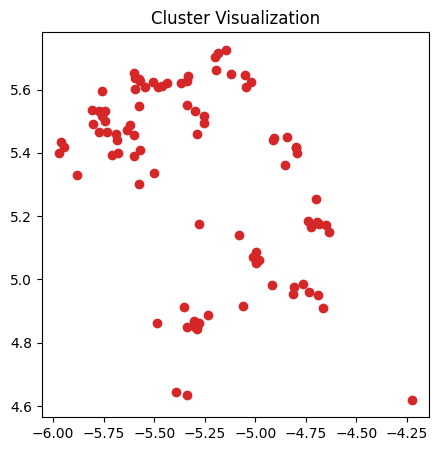

92
1009 ")$"
1110 " those"
3678 " gas"
3684 " South"
4232 " established"
4715 " learning"
5787 " molecular"
6069 " nuclear"
6100 " Lou"
6264 " commercial"
7051 " electronic"
9118 " vertical"
10392 ")}$"
14638 " germ"
18644 " Gas"
19763 " manipulation"
20727 " Learning"
24800 "|}"
24946 "noise"
25265 "csv"
25947 "fen"
26024 " Molecular"
26526 " manipulate"
26730 "ieur"
26795 "部"
26837 " donated"
26838 " insure"
26991 " [];"
27044 "rology"
27127 "STM"
27254 "FFER"
27331 " pharmacological"
27456 " Nuclear"
27527 "CUSS"
27539 "itches"
27605 " Evaluation"
27633 " fisher"
27705 " Sox"
27711 "Assembly"
27789 "vity"
27978 "usually"
28210 "erguson"
28397 " contrace"
28456 "arming"
28698 " lend"
28751 " purported"
28811 "Fla"
29034 " playoff"
29326 " anime"
29816 "Germ"
30203 " mö"
30294 " retrospect"
32151 " Slow"
32494 " manipulated"
34582 " ultrasonic"
36911 "molecular"
39949 " 437"
40238 " manipulating"
40246 "Slow"
40896 "437"
40959 " 513"
41661 " hypothesize"
42640 "513"
43153 " csv"
43537

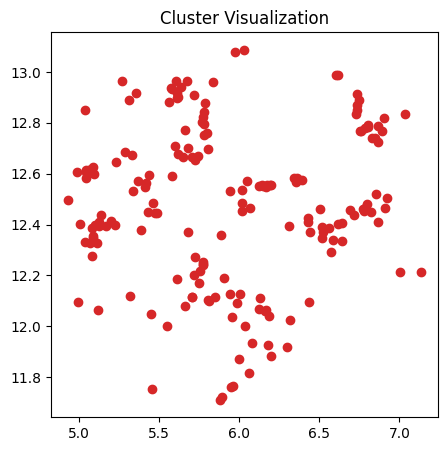

179
8745 " deploy"
12243 " byte"
15126 " questionnaire"
15397 " Similar"
15431 " macrophages"
15692 " golf"
16061 " Story"
16269 " leather"
16496 " Moscow"
16528 " deterior"
16872 " JavaScript"
16923 " forecast"
17120 " swimming"
17136 " Survey"
17317 " É"
17368 " imagination"
17879 " CIA"
17995 "prec"
18233 "sta"
18509 " ambient"
18966 " Grace"
19026 " femin"
19134 " vapor"
19984 "OUNT"
20131 " logs"
20873 " absurd"
20999 "mathop"
21232 "自"
22254 "}}}_{"
29171 " Hungary"
30219 " appointments"
31876 "broad"
32089 " rubbed"
32529 "TNF"
32753 "orkshire"
32914 "Hit"
33197 "========="
33397 "Similar"
33409 "Sharp"
33422 " trio"
33467 "Adam"
33599 " inoculated"
33609 " Dul"
33615 "HAL"
33757 " Spin"
33812 "Packet"
33884 "graphs"
33928 "mh"
33936 " rpm"
33974 " condensation"
33993 "Average"
33995 " MON"
33997 " vacant"
33998 "andro"
34000 " immature"
34003 " learnt"
34006 "smooth"
34032 " LOG"
34034 " ranch"
34045 " skulle"
34066 "*,*"
34078 " suffix"
34086 " chapel"
34087 "468"
34112 " turk

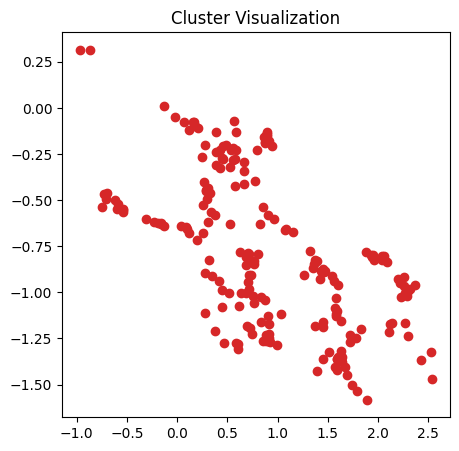

212
23 "6"
54 "U"
82 "q"
236 "�"
252 "    "
382 "ist"
422 "ive"
448 " ch"
508 "ther"
515 "ass"
530 " U"
531 "one"
565 "int"
568 "=""
570 "ne"
571 "ia"
578 "_{"
594 " so"
595 "ally"
597 " they"
612 " ev"
613 "ear"
619 " my"
664 "we"
665 " who"
683 "[@"
696 "\]"
756 " acc"
758 "ced"
762 " under"
763 "ish"
770 "itt"
772 " cons"
791 " bec"
796 "ade"
825 "ock"
847 " col"
859 "ss"
865 "?""
870 "</"
882 "ict"
897 " use"
899 "oy"
917 "ible"
924 " sm"
975 "ublic"
979 "      "
989 "inal"
1007 " look"
1008 " [@"
1023 " Se"
1059 "let"
1066 " down"
1068 "о"
1071 " test"
1078 " before"
1113 " car"
1137 "ute"
1153 " pers"
1177 "ature"
1202 "$\"
1222 "min"
1236 " lar"
1265 " start"
1308 " br"
1343 "til"
1502 "ots"
1522 "ittle"
1575 "orn"
1769 "�"
1801 " prof"
1899 " position"
2113 "iple"
2118 " move"
2314 " polit"
2468 "ystem"
2558 " percent"
2625 " signal"
2881 "ply"
2969 " simple"
3052 " Am"
3094 " Cor"
3174 " foot"
3318 " $$"
3409 "state"
3496 " ir"
3503 "^*"
3535 "itation"
3537 " analy"
3556 "haps

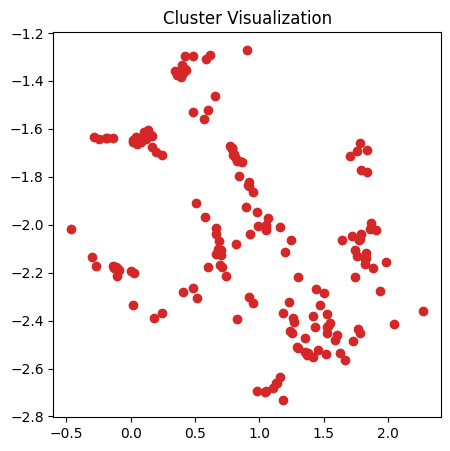

168
769 " act"
2186 " hold"
2386 "{{\"
2745 " Te"
2793 " experience"
2926 " story"
3196 " Dr"
3208 "56"
3543 " felt"
3582 "tilde"
3617 " Go"
3761 " match"
3861 " prot"
3873 "pril"
3921 " [*"
3935 " message"
4036 " ord"
4137 " Su"
4203 "}="
4557 "quest"
4568 " Rec"
4655 "lick"
4661 " Che"
4693 " London"
4718 "};"
4721 "istry"
4724 " filed"
4770 " uint"
4797 " blue"
4856 "msg"
4888 "
"
4912 " medic"
4913 " Park"
4927 " si"
4937 " sympt"
4957 " items"
4958 " vehicle"
4978 "berg"
4983 " starting"
5004 " bottom"
5024 " edge"
5044 " basic"
5062 " ~"
5126 "ен"
5142 "tem"
5187 "inese"
5223 " adapt"
5230 " root"
5245 " coord"
5278 "frak"
5376 " Inst"
5412 " cold"
5418 " Black"
5450 "rome"
5477 "ago"
5502 " transition"
5522 " package"
5527 "ruit"
5539 "ensuremath"
5581 "php"
5643 "tre"
5644 " leads"
5655 "bolds"
5676 "κ"
5682 " Dan"
5718 " storage"
5766 " empt"
5784 "rd"
5822 " и"
5828 " vel"
5833 " complaint"
5860 "onna"
5876 " affected"
5879 "				"
5882 " firm"
5891 "し"
5906 "actor"
5996 "post

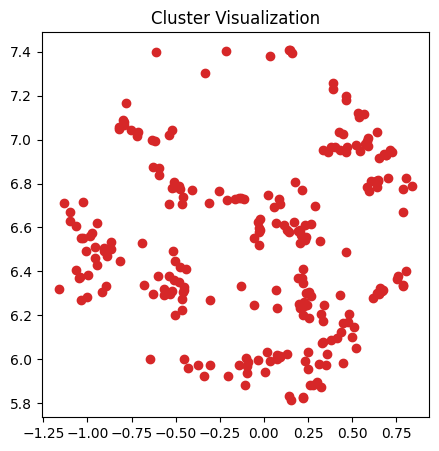

243
349 "                "
935 "
           "
2286 "         "
2306 "}^"
7701 " murder"
8651 " mechanical"
10858 " settlement"
11261 "
                                                                "
15312 " wrapped"
17883 " myocardial"
20769 "ABA"
22721 "athon"
23150 " acetate"
24040 " programmes"
24513 " Poisson"
24994 "^−^"
25078 "pointer"
25557 " helper"
25664 " Talk"
25984 "&&\"
25994 " под"
26046 "


   "
26052 " 1918"
26138 " 193"
26187 " accidentally"
26274 "343"
26618 " auditory"
26743 "ventional"
26798 "anco"
26898 "cohol"
27055 "development"
27200 " Were"
27359 " nur"
27480 "ferr"
27615 " Movie"
27759 " caso"
27849 " Prob"
27850 " Milan"
28010 "cribing"
28149 " referral"
28447 " opioid"
28566 " cardiomy"
28585 " Blair"
28662 "contents"
28711 "}^{*"
28797 "raviolet"
28812 "�"
28848 " Galactic"
28871 "443"
29113 "Vec"
29174 "clamation"
29331 " lambda"
29429 "segment"
29548 " bew"
29549 " internationally"
29560 " Aub"
29630 " Welsh"
29638 " GOOD"
29849 "Stats"
29867 " complete

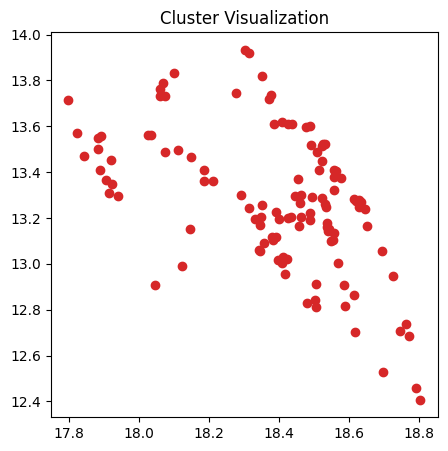

116
6752 " 2002"
9153 " nm"
9735 " boat"
10016 "2002"
10294 "km"
10427 " Bow"
10437 " anticip"
10602 "nm"
10694 " 97"
10711 " trace"
10721 " magic"
10744 " IM"
10767 "iratory"
10768 "111"
10771 " km"
10859 "Sch"
10880 " marks"
10894 " lists"
10911 " kom"
10943 ".]"
10947 " Valley"
10958 " inher"
10965 "ustration"
10966 "iol"
10970 "%)."
10978 "filter"
10985 " covering"
10997 " sulf"
11000 "vector"
11002 " rising"
11014 "icht"
11015 "days"
11016 "�"
11026 " yields"
11034 " disappoint"
11038 " matching"
11042 " Swed"
11043 "�"
11053 " southern"
11060 "emic"
11061 " bytes"
11063 "Mark"
11068 " privacy"
11070 "PG"
11071 "elve"
11073 " academic"
11078 "rin"
11079 " analyt"
11085 " DM"
11088 " comprehensive"
11091 " prospect"
11097 "fix"
11098 " singular"
11101 " decom"
11107 " 94"
11114 "izz"
11125 "fi"
11128 " Dar"
11132 " challenging"
11133 "Resource"
11134 " mild"
11135 "isp"
11137 " Scot"
11143 " explos"
11144 "Block"
11145 "make"
11147 "ONE"
11156 "ORE"
11157 " lunch"
11158 "iar"
11159

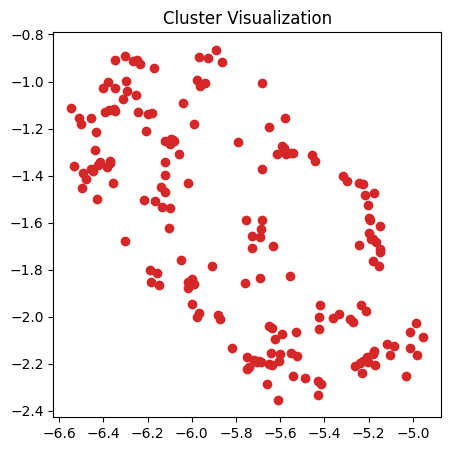

179
1617 " condition"
2430 " require"
2486 " include"
2515 " conditions"
2594 " See"
2884 " Fl"
2896 " By"
2968 " deal"
2992 "*,"
3035 " En"
3102 " pattern"
3105 " Not"
3138 "!["
3233 "Data"
3258 "astic"
3292 "aving"
3326 "rote"
3345 " outside"
3364 "box"
3376 " pie"
3404 "At"
3422 "olic"
3439 "54"
3449 " satisf"
3463 "By"
3518 "actions"
3519 "OD"
3531 " turned"
3533 " questions"
3552 " cred"
3562 " created"
3588 " valid"
3599 " El"
3601 " screen"
3603 " elements"
3609 " select"
3610 "sm"
3631 " Comp"
3641 " mi"
3647 "ishing"
3650 "Not"
3664 "";"
3667 " Reg"
3677 "71"
3680 "58"
3686 " sort"
3697 " Sch"
3714 " ps"
3719 " II"
3721 "к"
3722 " bed"
3747 " Aug"
3755 "reng"
3757 "gn"
3763 "62"
3769 " secur"
3770 "och"
3784 "pite"
3787 "rupt"
3793 " veh"
3795 " compan"
3809 " fast"
3837 "Ad"
3838 "roph"
3844 "aches"
3845 "print"
3848 "De"
3849 "earch"
3852 "rite"
3860 " href"
3877 " note"
3879 " behavior"
3885 " speed"
3907 " independent"
3913 "acement"
3924 " stage"
3934 "osure"
3936 " takes

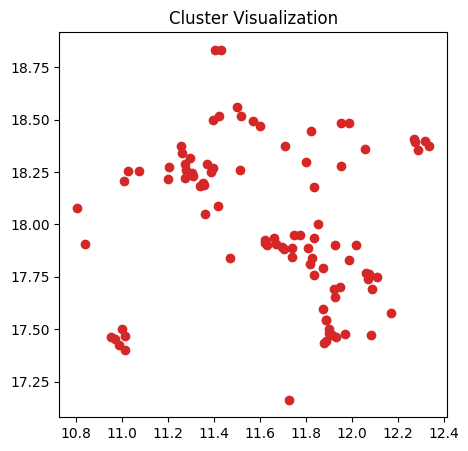

94
2264 " total"
8468 " sensor"
10142 " inflammatory"
10664 " Ha"
10695 "800"
11461 " arrangement"
11541 " peptide"
11562 " phenomenon"
11883 " survive"
11918 " Captain"
11923 "omorphism"
11978 " gray"
12067 " aden"
12092 "Hello"
12257 " Nevertheless"
12266 " Total"
12286 " Pay"
12288 " insight"
12293 " stepped"
12298 " desper"
12321 " sustained"
12343 "esity"
12358 " medication"
12359 " residues"
12459 " 1984"
12502 "yy"
12709 " convey"
12768 " doses"
12884 "ESM"
12912 " beneficial"
12981 " scholars"
12988 "ISA"
13031 " mock"
13074 "total"
13088 "echo"
13098 " anybody"
13100 " mold"
13155 " loose"
13163 " immigration"
13164 " existed"
13194 " execute"
13199 " specify"
13257 "TX"
13260 " assumptions"
13263 "season"
13334 ""};"
13358 " discrete"
13362 "hash"
13397 "124"
13398 " combine"
13418 " estimation"
13424 " physiological"
13428 "aceutical"
13433 " bold"
13438 " desert"
13442 "てい"
13466 " phenotype"
13467 "elect"
13471 " breaks"
13479 " sensors"
13482 "129"
13495 "olecular"
13512 

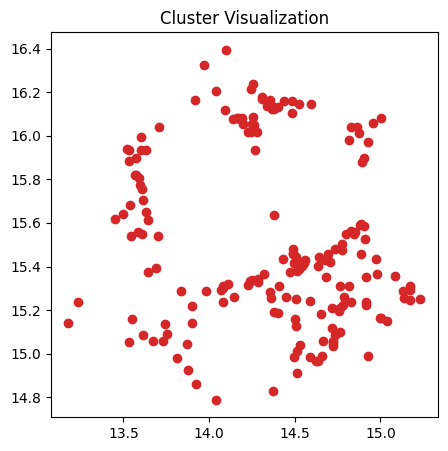

182
8815 " horse"
9488 " abandon"
10192 "pres"
10231 " Young"
10945 " rejected"
11146 " Lew"
11248 " NC"
11384 "ijer"
11867 " Eastern"
11946 "127"
12076 "onical"
12302 " exciting"
12386 " tong"
12516 " puts"
12536 " destruction"
12598 "ergic"
12604 " Kar"
12637 " posterior"
12674 " presidential"
12774 " sque"
12807 " enzymes"
12860 " headed"
12903 "achus"
12931 "ì"
12995 "SELECT"
13009 " frames"
13118 "conv"
13220 "DO"
13302 " Term"
13312 "ku"
13336 " denial"
13356 "yers"
13385 "obacter"
13394 " suspension"
13420 "cha"
13514 "yard"
13517 "domain"
13519 " courses"
13523 "
								"
13545 " Princ"
13560 "iah"
13564 "bian"
13571 " ticket"
13580 "chers"
13671 " stellar"
13672 "merce"
13688 " winner"
13709 " е"
13712 "track"
13733 " scanning"
13750 " surrounded"
13764 "�"
13780 "OVID"
13797 " uptake"
13800 " compression"
13801 "EP"
13846 " minds"
13850 " γ"
13885 " chap"
13923 " epithelial"
13947 " defining"
13972 "ikes"
13982 "comment"
13983 " pist"
13985 " })"
14004 " upset"
14008 " mol"


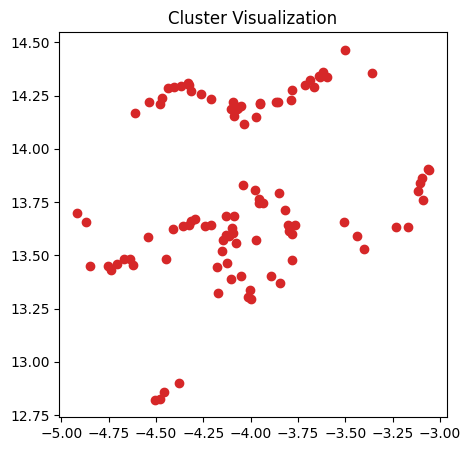

101
8862 " yellow"
11307 " allegations"
22867 "omycin"
23167 "LED"
23405 "'])"
23705 "observ"
23952 " Present"
24212 "kill"
24214 " lept"
24312 " bracket"
24329 " piss"
24331 " journals"
24451 " seller"
24469 "MSO"
24501 "ían"
24621 "sterdam"
24641 " albumin"
24696 " protects"
24730 " APPEALS"
24778 "phyl"
24796 "fail"
24855 " cada"
24875 "pired"
24886 "umbling"
25003 "istors"
25009 "nom"
25036 " resigned"
25218 "fessional"
25227 "KN"
25294 " continent"
25326 "λο"
25330 "







"
25337 "radio"
25468 "))*"
25469 "549"
25582 "Present"
25681 " Rico"
25712 " affirmative"
25779 "printed"
25841 "anting"
25853 " Princeton"
25881 " investigator"
25902 "disable"
25903 " dominate"
25926 " dangers"
25940 " splic"
26001 "hops"
26168 "omeric"
26227 "asgow"
26239 " authorization"
26244 " jurisdictional"
26250 " Springs"
26289 " physic"
26321 " nasty"
26338 "363"
26363 " flush"
26369 "1967"
26501 "TRUE"
26517 " 217"
26531 " spoon"
26731 "eyed"
26756 "GN"
26775 " Lit"
26791 " flavors"
26841 " committ

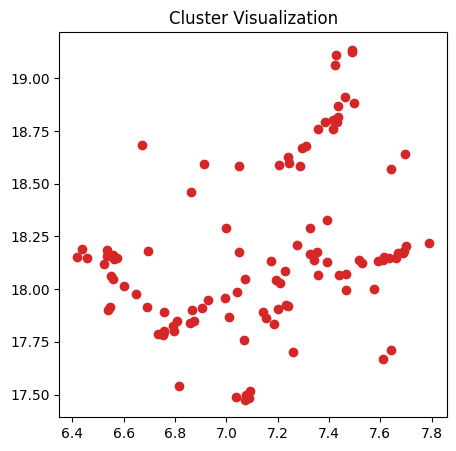

105
8305 " Hy"
8591 " promote"
11100 " tank"
12647 " constitute"
12735 "ivariate"
14022 " -------"
14592 "TM"
14960 " 1977"
16081 " ------"
16172 " mart"
16654 "cosystem"
16842 " Sweden"
16988 " constitutes"
17109 " oct"
17151 "Hy"
17173 "LV"
17283 "ochastic"
17286 "imore"
17349 " cervical"
17360 " Oklahoma"
17493 " ecosystem"
17570 "Tell"
17661 " Target"
17664 "Google"
17684 " Catal"
17698 " Wolf"
17700 "ilization"
17716 " vein"
17756 "Therefore"
17795 " streams"
17837 " nevertheless"
17872 " sensory"
17925 "iento"
17939 " CK"
17950 " sensing"
17952 "icient"
17960 " Scottish"
17963 " compiler"
17981 ").]("
18004 "ARK"
18009 " Ky"
18019 " beating"
18038 "tc"
18050 "ugg"
18068 "gh"
18078 "~\"
18092 "033"
18113 "loat"
18141 "ucker"
18165 " Awards"
18178 " nanoparticles"
18179 "Could"
18202 "207"
18226 " MER"
18232 " Lang"
18234 " gri"
18244 "UID"
18255 "clk"
18256 "hum"
18289 " presumably"
18296 " Mind"
18343 " urged"
18346 "?:"
18400 " bod"
18405 "film"
18418 " exercises"
18426 " TM"
18

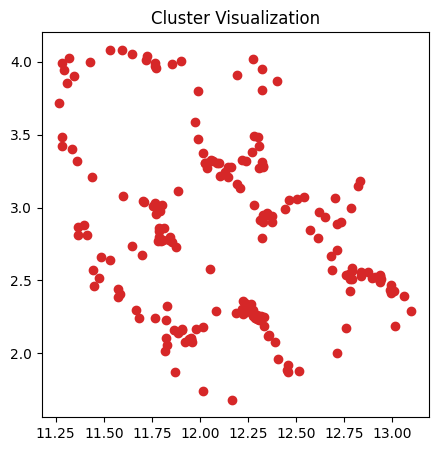

196
8247 " Back"
8320 "400"
9050 " categories"
9429 "icide"
9455 " journey"
9775 " instruction"
10099 "Page"
11072 " craft"
11520 "izabeth"
11588 "bial"
12221 " Dun"
12451 "aya"
12960 " registration"
13143 ";</"
13583 " incorrect"
13754 "AVE"
13795 " traits"
13953 " nous"
15254 " balls"
15341 " Bry"
15506 " impaired"
16472 " conducting"
23901 "achelor"
33062 " Applying"
35040 "hyp"
35624 " Resistance"
36788 " Notch"
36885 "Cancel"
37272 "IFE"
37762 " leurs"
38047 " postnatal"
38172 "intensity"
38212 "wc"
38551 "bps"
38665 "ilogy"
38887 " transplanted"
38924 "bucket"
38948 " remnants"
38966 " 457"
38974 " cones"
39070 " Eff"
39127 "swick"
39187 " ashes"
39388 " contral"
39389 "toolt"
39427 "gså"
39455 "bod"
39481 "//!"
39543 " pretext"
39573 "参"
39665 " saints"
39681 "travel"
39682 " bosses"
39684 "iazza"
39706 "XA"
39740 "visiae"
39754 "marker"
39757 "quee"
39777 " trustees"
39804 "де"
39842 "manual"
39844 "accord"
39975 " insufficiency"
39981 "hub"
40020 "CCA"
40073 " Biosystems"
4007

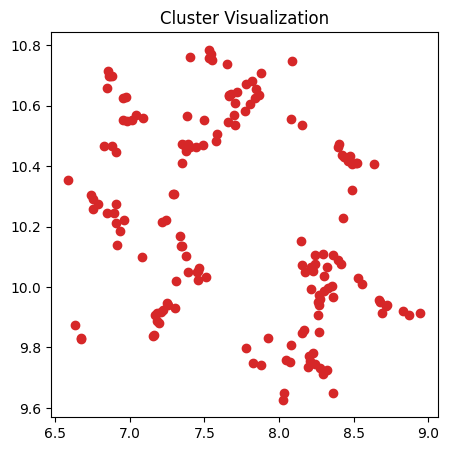

161
8995 " wine"
11902 "inth"
14216 " Avenue"
14489 "�"
14683 " sentences"
15066 " racial"
15102 " respondents"
15315 " Jam"
15349 "agment"
15741 "hex"
15827 " eine"
16077 "pn"
16354 "\]("
16369 "[$"
16387 " monitored"
16549 "�"
16850 "Hash"
16896 "^^"
17131 "kov"
17937 "fare"
19997 " Bag"
20190 "algebra"
20310 " Mach"
20448 "aceae"
22900 " Buy"
22942 " cd"
24004 "Hope"
24747 " Strong"
31669 " gels"
32419 "uitary"
33392 "xF"
33675 "Infl"
34169 " distraction"
34186 " Moss"
34273 "}}^{-"
34432 " reimbursement"
34446 "都"
34482 " finals"
34583 "club"
34697 " Expect"
34714 " maize"
34792 " pedestrian"
34865 " hing"
34909 " Norton"
34947 " Tournament"
34977 " :("
34987 "070"
35336 "ILE"
35404 " Meet"
35570 "itto"
35625 " VIP"
35661 " Eighth"
35689 " skew"
35724 "也"
35778 " unpaid"
35930 "开"
35962 " microenvironment"
36067 " amusement"
36182 " figuring"
36261 "buy"
36291 " hereto"
36363 "devel"
36387 "�"
36434 "ый"
36666 "位"
36739 ";,"
36759 " deportation"
36773 "agmatic"
36820 "持"
36869 "nek

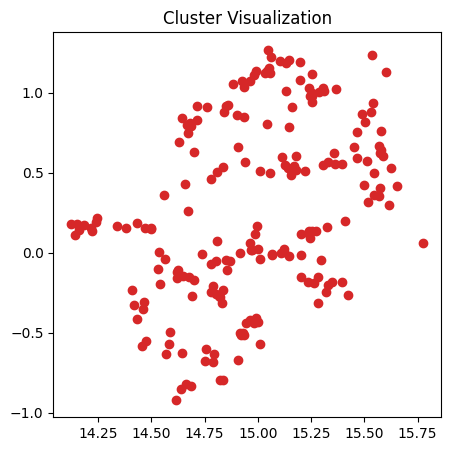

202
9202 " afraid"
9405 " Hot"
9853 " quad"
9948 "ć"
9954 " aircraft"
9968 " cutting"
10027 " decay"
10040 " iter"
10041 "�"
10080 "і"
10215 " Trust"
10239 " cooper"
10328 "such"
10394 "system"
10449 "ARD"
10610 " classic"
10872 " instances"
13198 " Cro"
13824 "shaped"
35348 "Hex"
36396 " messy"
36485 " Rating"
36639 "VB"
36717 "064"
36766 " tasty"
36790 " protested"
36948 " compensatory"
37079 "量"
37245 "ophe"
37346 " funnel"
37470 " recycled"
37677 " αυτ"
37932 " Raven"
37959 " Serbia"
38012 " MNRAS"
38021 " varchar"
38048 " Judy"
38058 " societal"
38086 "mered"
38107 "実"
38114 "liance"
38199 "??"
38268 " LIN"
38321 " Monsieur"
38327 "))/(-"
38530 " compose"
38532 "Huh"
38612 " strangely"
38633 " Enforcement"
38690 " Emir"
38749 "сли"
38755 "dos"
38792 " Thu"
38959 "iret"
38977 " prenatal"
38980 " gö"
39000 "$}"
39020 " cuff"
39026 "ое"
39032 "CXX"
39033 " carrots"
39132 " cleaved"
39152 " unatt"
39162 "ム"
39181 " fluoride"
39224 "{})"
39238 "jes"
39260 " militia"
39279 " WI"
39311 "

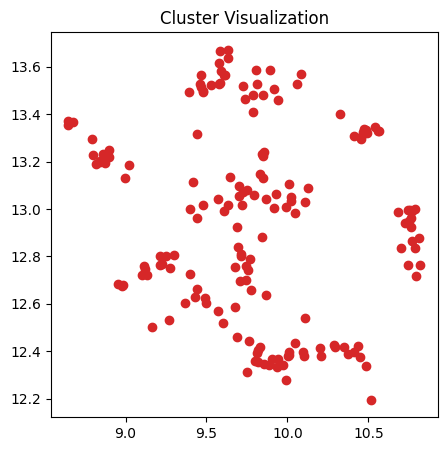

171
6572 " Tra"
6981 " assay"
7017 " minute"
8141 " Star"
8161 "Hz"
8612 " representative"
9240 " Those"
12948 " burst"
13624 " smell"
14450 " nanop"
14513 " Direct"
14534 " melt"
14893 " Sud"
15042 " restore"
15135 " COMM"
15252 " strat"
15267 " 

"
15297 "oscopic"
15333 "adas"
15363 " everyday"
15377 " innocent"
15383 "Black"
15417 "variant"
15425 "establ"
15438 " ric"
15443 " genus"
15543 " Ta"
15581 "btn"
15591 "\/"
15596 " paste"
15719 "ean"
15738 "entials"
15797 " Upon"
15846 " purely"
15893 " teaspoon"
15908 " Hur"
15917 " reserve"
15927 " violations"
15937 "oric"
15940 " Rick"
15949 "éd"
15950 " throwing"
15952 " initiative"
15955 " Fun"
15971 "

"
15982 "Device"
16002 " postoperative"
16024 " tear"
16026 " Adams"
16046 "igger"
16053 " poetry"
16054 "fg"
16056 "spin"
16069 " neuronal"
16076 " dirty"
16079 ".[]{"
16102 " grave"
16104 "rod"
16105 " subtle"
16110 " refr"
16112 " reception"
16161 " solving"
16201 "icipants"
16202 " encoded"
16205 "ад"
16215 " Mathemat"
16216 " cant

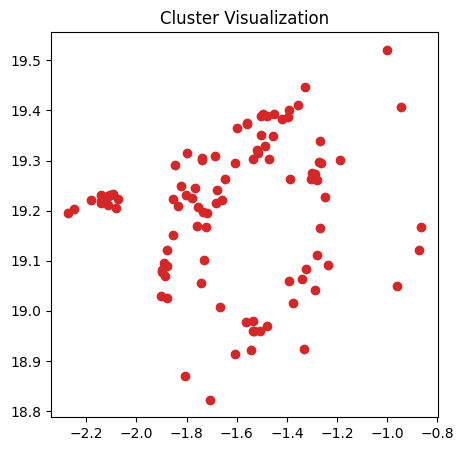

101
19733 "aspase"
20521 "erculosis"
21730 " schizophren"
22449 " Multi"
22495 "Multi"
22582 "Really"
22869 "cott"
23269 "sizeof"
23287 "ić"
23300 "amaz"
23306 " propaganda"
23355 " unm"
23359 " Looking"
23371 "子"
23387 " Leader"
23427 "oside"
23432 "oelectric"
23446 " BS"
23506 " caspase"
23665 "ů"
23669 " tuberculosis"
23681 " ART"
23699 "ools"
23745 "stylesheet"
23760 "HTTP"
23764 " img"
23765 " GW"
23789 " Youth"
23790 " Salt"
23795 "unal"
23817 "reated"
23823 "�"
23839 "CLC"
23840 " Rosen"
23846 " planted"
23850 "390"
23866 " donations"
23871 " λ"
23896 "timeout"
23903 " cents"
23909 "oku"
23919 " enjo"
23920 " Carib"
23928 " bout"
23929 " btn"
23939 "multi"
23949 " diplomatic"
23956 "�"
23965 " intersect"
23970 " introduces"
23972 " Horn"
23973 " shrink"
23980 "undry"
23984 "ocytosis"
24005 " vez"
24006 " Edwards"
24009 "ylated"
24019 " migr"
24021 " elic"
24026 " auxiliary"
24029 "Ï"
24038 " damaging"
24041 " prima"
24051 "Getty"
24076 " Gaza"
24079 "ampa"
24080 "Thomas"
24082 "

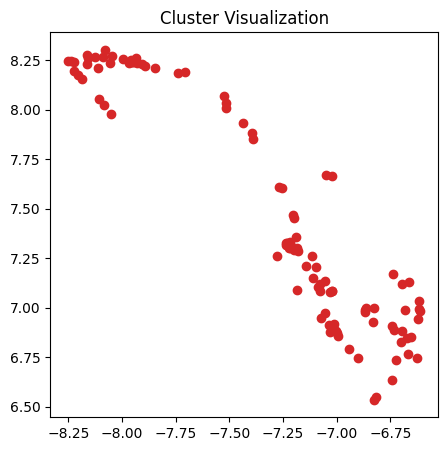

106
3286 " district"
3365 " simply"
4103 " relative"
5606 " evolution"
24955 " Someone"
25383 "unned"
25605 " invoked"
25736 "national"
25838 " Various"
26190 "Within"
26306 "odal"
26336 "CUR"
26546 " пер"
26597 "either"
26689 "castle"
26759 " saddle"
26785 " acknowledges"
26890 "604"
26956 " populated"
27008 "angered"
27080 " Daw"
27086 " unwilling"
27115 "Whe"
27142 "gap"
27159 " fragmentation"
27180 "Sunday"
27192 " trails"
27212 "\%$"
27256 "generic"
27267 "352"
27334 " Kil"
27353 " Hopkins"
27356 "uras"
27374 "�"
27402 " Gol"
27447 "oprecip"
27562 " aggress"
27610 "Circ"
27746 " Literature"
27748 "European"
27754 " cpu"
27768 " skirt"
27787 " advisory"
27799 " athlete"
27819 " uncovered"
27870 " się"
27903 "Folder"
27936 " Cris"
27937 "取"
27982 " Gates"
28002 " champions"
28013 "astolic"
28069 " truncated"
28081 " tenth"
28088 " oscillation"
28138 " crystalline"
28162 "니"
28182 " Papers"
28183 "AAA"
28233 "atta"
28239 " REC"
28291 "BLOCK"
28347 " shred"
28358 " magnification"
2836

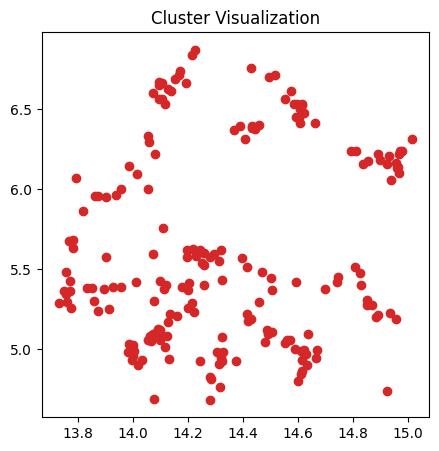

196
6824 " });"
8854 "args"
8978 " 59"
9212 " assign"
9495 " transferred"
9545 " Ell"
9742 "stack"
9846 "will"
9879 " spectral"
9894 " periods"
9905 " grounds"
9908 " passion"
10071 " experts"
10197 " HE"
10270 "oly"
10309 " hardware"
10312 " guid"
10321 "anguages"
10340 "putation"
10462 "esome"
10508 " 98"
10646 " wherein"
10855 " plates"
11209 "bits"
11279 " Results"
11370 " inequality"
11608 " tonight"
12262 " targeting"
12313 "buntu"
12626 " (@"
12635 "ariju"
12913 " residence"
12963 " Bra"
13107 "hn"
13565 "looking"
13710 " SW"
13779 " belt"
13854 ""
13891 " reversed"
14439 "τα"
14647 "ODU"
15021 "Stop"
15300 " MC"
34755 "obacterium"
34984 " ARISING"
35245 "ίναι"
35411 "ами"
35589 " wizard"
35631 "olated"
36536 " lifelong"
36545 "alted"
36754 " 1908"
36840 "Missing"
37093 " endured"
37261 "Town"
37295 " affiliations"
37403 " headaches"
37483 "ietzsche"
37508 "opters"
37518 "formin"
37588 "rab"
37842 " artific"
37973 " vé"
37981 " examiner"
38247 "Permission"
38636 "crystall"
3865

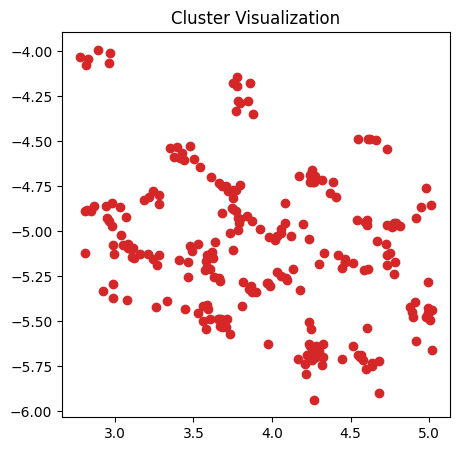

237
4666 " node"
4748 " 2009"
5700 " strategy"
6254 " driver"
6486 " finite"
6551 " neuro"
6642 " estimate"
6660 "]),"
6687 " diag"
6866 " criteria"
6889 " vary"
6893 " Frank"
6982 " economy"
7059 "annels"
7091 " employed"
7119 " incident"
7141 " stored"
7150 " quarter"
7164 " raise"
7196 " &="
7213 " Wed"
7263 " tor"
7269 " advanced"
7282 "BP"
7290 "venue"
7295 " Government"
7296 " considering"
7344 " conflict"
7351 " bag"
7366 "edia"
7369 " resulted"
7372 " strain"
7445 " ideal"
7485 "endment"
7492 " hem"
7495 " oxid"
7500 " TR"
7501 " warrant"
7511 " Lu"
7529 " parallel"
7562 " keeping"
7595 " galax"
7599 " adm"
7609 " 41"
7620 "ит"
7627 " horiz"
7632 " nodes"
7641 " Bill"
7666 "ernel"
7667 " Gal"
7670 " Jesus"
7674 " cab"
7676 "Ref"
7709 " cogn"
7710 "Mr"
7727 " Richard"
7740 " forget"
7755 " colle"
7759 " degrees"
7772 "�"
7788 " continues"
7799 " sought"
7850 " Its"
7851 "ether"
7857 "2009"
7861 " pil"
7867 " perman"
7874 " Four"
7876 "eli"
7878 "American"
7883 "Who"
7885 "yer"
7

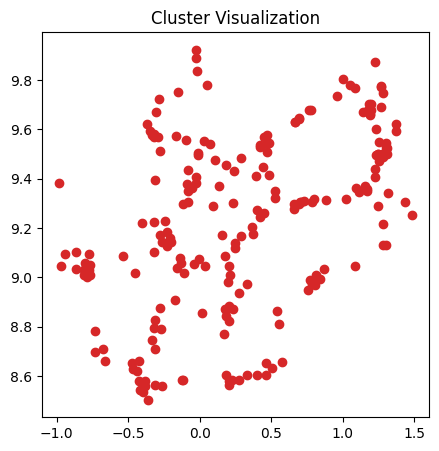

216
5148 " metal"
9722 " $(\"
13669 " Navy"
14411 ")}("
15161 "254"
16265 "}}}("
17328 " reminded"
17619 " exponential"
20148 " Develop"
21173 "Mill"
21350 "ardless"
22327 " defective"
23788 "们"
24013 "mot"
24120 " Upper"
25264 " reminds"
25311 " ICU"
26184 " Kid"
26263 " occupy"
26701 "ursor"
26868 "ÃÂÃÂÃÂÃÂ"
27273 " electrophoresis"
27301 " Conn"
27885 " settlements"
27954 " endif"
28163 "posing"
28171 "bigcup"
28366 " stabilization"
28381 " Aβ"
28416 " 501"
28481 " Safe"
28510 "CHO"
28523 " accelerate"
28576 " cooler"
28749 "Lead"
29110 " protections"
29401 " navy"
29591 ")}(\"
29658 " ruler"
29705 " cottage"
29812 "biom"
29884 " Theod"
30072 "391"
30290 " könn"
30360 " accru"
30450 " strands"
30512 "colm"
30576 " Parl"
30658 "Wat"
30696 " Regarding"
30714 "occur"
30825 " carbohydrate"
30909 " clearer"
30935 "υτ"
31022 " mushrooms"
31308 " Convert"
31349 " Reviews"
31377 "uffled"
31381 " comparatively"
31419 " Mik"
31539 " stratified"
31611 " adversely"
31644 "adapter"
31671 "698"
3

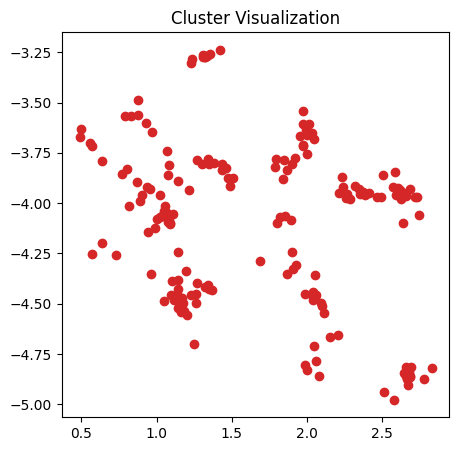

180
4154 " argument"
4778 " variable"
5818 " ring"
5854 " England"
5889 " composition"
5957 "resents"
5994 "prime"
6016 " handle"
6021 " income"
6057 " knows"
6074 "Info"
6115 " Green"
6137 " decreased"
6152 " credit"
6187 "ú"
6188 "oom"
6259 "current"
6324 "range"
6337 " ran"
6363 " pool"
6371 " wire"
6384 " membrane"
6389 " farm"
6439 " Techn"
6456 " Council"
6598 "”."
6631 " Service"
6683 "ye"
6697 "actory"
6712 "weight"
6737 "omorph"
6738 " sho"
6750 ""></"
6761 "ortunately"
6766 "FI"
6772 "appro"
6773 " fish"
6797 " deg"
6802 "Rep"
6810 " �"
6825 "Request"
6828 " directed"
6833 " manufacture"
6834 " attorney"
6840 "aked"
6873 "XX"
6876 "ician"
6877 "======="
6884 " League"
6892 "Che"
6901 "TS"
6916 "�"
6923 " jump"
6928 " networks"
6937 "law"
6942 "Method"
6943 " Bi"
6944 " underlying"
6956 " Mo"
6959 ")/("
6991 "ceived"
6992 "rid"
6995 " Ins"
7001 " amaz"
7006 " compounds"
7009 " Pen"
7014 "ção"
7023 "aturday"
7031 " coverage"
7040 "-----"
7057 " Ma"
7060 " smart"
7063 " sitting"

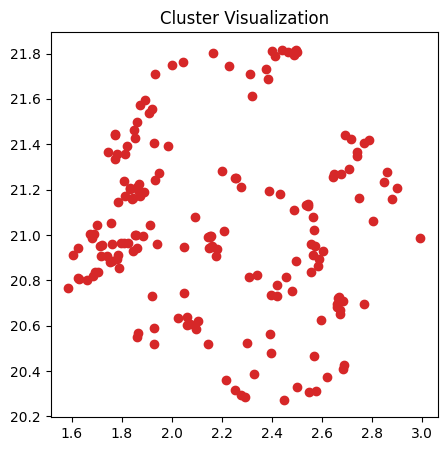

175
18663 "158"
19757 " Single"
20004 " Remove"
20262 "jax"
20628 " Samuel"
20635 " Nam"
20685 " attain"
20763 " Ther"
20858 " paintings"
20885 "lotte"
20895 "181"
20921 " ctx"
20983 " sua"
21027 "νο"
21029 "аб"
21056 "Contact"
21080 " reversal"
21103 "tfrac"
21149 "244"
21174 " Kam"
21200 "olytic"
21254 "nea"
21256 " ammon"
21259 " lighter"
21269 "rais"
21274 "045"
21278 " aston"
21280 "city"
21302 " diagrams"
21303 " GPS"
21306 "illus"
21337 " consuming"
21344 " overseas"
21375 "-["
21377 "notes"
21388 " irre"
21390 "props"
21402 " pled"
21407 "stru"
21423 "primary"
21431 ">;"
21437 " chloride"
21445 " 143"
21448 "fx"
21459 "PEG"
21470 "paid"
21483 " Sport"
21486 " fn"
21501 " bust"
21502 " HS"
21503 " SET"
21512 " sql"
21520 " vicinity"
21523 " Rud"
21524 " Beng"
21534 " ф"
21535 " logistic"
21555 "�"
21557 "ricks"
21566 " 404"
21572 " Ja"
21584 "drawn"
21587 " Juan"
21594 " Compar"
21596 "download"
21597 "ounty"
21598 "NER"
21599 "execute"
21605 "Remove"
21615 " В"
21618 " Arkansas

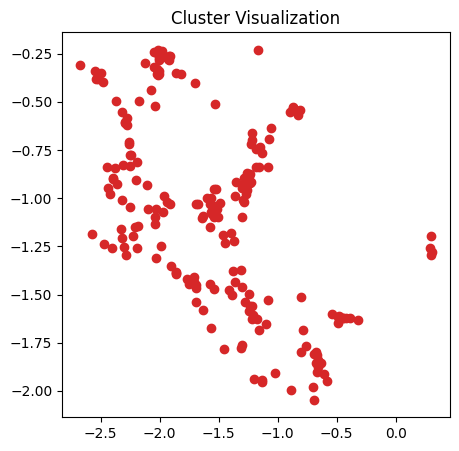

208
581 " one"
752 " what"
806 " first"
846 " after"
849 " how"
898 " 9"
985 " system"
1016 " each"
1126 "_{\"
1610 "33"
1620 " never"
1743 "^{\"
1997 " Gr"
2085 " provide"
2139 " why"
2228 " error"
2285 " team"
2296 " says"
2397 " repl"
2424 " required"
2448 " American"
2615 " Can"
2652 " Br"
2752 " My"
2818 " affect"
3021 " thus"
3093 "ili"
3180 "odes"
3220 "My"
3224 "ederal"
3273 " vo"
3302 " initial"
3315 " Dep"
3369 " door"
3403 " capt"
3419 " Ag"
3445 "ymb"
3446 ""."
3494 "ospital"
3499 " hor"
3611 "ague"
3653 " determine"
3687 " greater"
3726 "They"
3774 " Sm"
3786 " previously"
3842 " repe"
3851 "\])"
3863 " published"
3871 "SD"
3892 "gor"
3895 "osph"
3940 " cand"
3969 " corresponding"
4007 " president"
4016 " negative"
4026 "arning"
4034 "omen"
4043 "ournal"
4046 "attle"
4061 "SC"
4075 " enh"
4079 "uge"
4083 " financ"
4084 "uild"
4085 "eful"
4088 " ways"
4101 " hydro"
4126 "aign"
4147 " purch"
4152 "band"
4157 "spec"
4158 " designed"
4172 " ri"
4199 "ondon"
4215 "iated"
4218 "

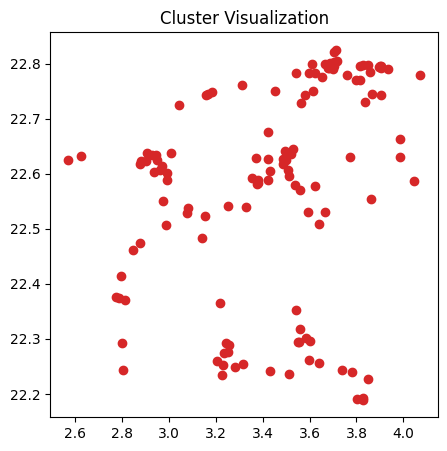

126
18633 " Character"
19105 "184"
19576 "Help"
19820 "Ax"
19920 "units"
20117 " seventh"
20325 " servants"
20329 "Compile"
20376 "phab"
20385 " adren"
20433 " irr"
20452 " perturbation"
20506 " collateral"
20513 "these"
20518 " miRNA"
20524 " FITNESS"
20527 "reported"
20542 " infrared"
20548 "fileID"
20560 " subunit"
20567 " Kings"
20597 " Contract"
20600 " chron"
20631 "cern"
20661 " sliding"
20662 "amel"
20668 "trace"
20700 "182"
20704 "memory"
20708 "endent"
20709 " Edd"
20712 "ENC"
20716 " untreated"
20721 " winners"
20722 "UB"
20729 "ń"
20740 " census"
20746 " intrig"
20747 " viscos"
20752 "mag"
20756 "ARCH"
20773 "gb"
20780 "Timeout"
20784 " ware"
20787 "unge"
20800 "gement"
20811 "gium"
20813 "pectives"
20816 " Travel"
20819 " Trial"
20829 " Alaska"
20830 " miRNAs"
20831 " bree"
20834 "ptive"
20846 " ko"
20865 "Download"
20866 "leqslant"
20869 "SEC"
20875 "die"
20882 " Danny"
20883 "**)."
20889 " dell"
20891 "enta"
20897 "sson"
20898 " Materials"
20905 "ATT"
20906 " rushed"
209

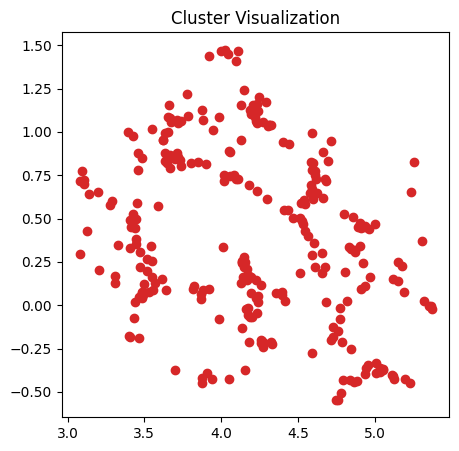

278
35 "B"
38 "E"
43 "J"
50 "Q"
63 "^"
75 "j"
91 "z"
94 "}"
104 "�"
106 "�"
108 "�"
111 "�"
114 "�"
127 "�"
130 "�"
139 "�"
143 "�"
146 "�"
157 "�"
162 "�"
164 "�"
165 "�"
168 "�"
172 "�"
174 "�"
177 " "
181 ""
182 ""
184 ""
185 ""
"
207 ""
214 "�"
221 "�"
227 "�"
232 "�"
235 "�"
241 "�"
258 " o"
267 "al"
268 " p"
269 " f"
277 " d"
279 "ion"
283 "--"
288 " h"
294 " re"
304 "ig"
358 "em"
378 " B"
379 "her"
389 " com"
400 "iv"
420 "ment"
429 "ight"
450 "ould"
454 "our"
466 "ie"
474 "ical"
502 " cl"
506 "ath"
538 "ub"
620 "ll"
622 " app"
628 "own"
630 "form"
632 " li"
653 " sp"
694 " kn"
699 "fter"
734 " inter"
748 " }"
792 "ular"
815 " ph"
817 "##"
830 " form"
867 " rem"
876 "__"
910 "){"
1017 "ower"
1121 " op"
1175 " good"
1437 " quest"
1492 "abel"
1516 " elect"
1548 " ident"
1831 "por"
2763 "                                                                                                                                "
3311 " estim"
3335 "dom"
3743 "asons"
5619 " Sy"
6370 "num"
64

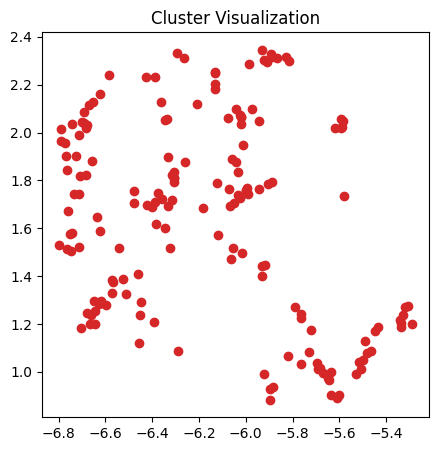

170
1310 " If"
1449 "40"
1508 "23"
1685 " bus"
1707 " There"
1780 " Ar"
1785 "Re"
1876 " All"
1877 "ification"
1882 "pped"
1893 " So"
1895 " problem"
1916 " To"
1947 "ung"
1992 "To"
2014 " single"
2044 "var"
2054 " fri"
2059 "pi"
2072 "na"
2075 " pay"
2111 " Court"
2122 "ered"
2135 "back"
2180 " period"
2188 "mm"
2199 " project"
2204 "sum"
2213 " Res"
2224 "ns"
2230 "mission"
2266 " strong"
2277 "OM"
2282 " course"
2303 " target"
2322 "ibility"
2343 " lo"
2354 "SE"
2360 " night"
2361 " reported"
2363 " age"
2366 " together"
2375 "uf"
2378 " once"
2389 " love"
2390 " groups"
2393 " early"
2395 " account"
2403 " making"
2404 "itle"
2412 " log"
2419 " house"
2426 " terms"
2431 "IG"
2432 " vir"
2434 " Co"
2441 "ection"
2455 " ever"
2465 "dex"
2508 " detail"
2512 "There"
2523 " issue"
2527 "lete"
2530 " provided"
2534 " bar"
2548 "Type"
2552 " May"
2563 " ep"
2570 " complex"
2585 "elt"
2587 "irl"
2593 " section"
2606 "time"
2617 "pm"
2619 " pick"
2633 "rix"
2644 " whole"
2657 "
			"
2658 "i

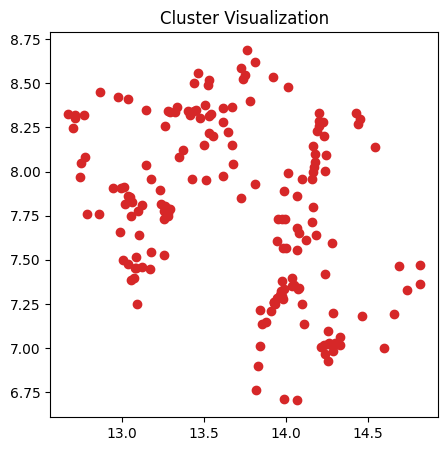

174
4410 " Red"
5739 " stock"
7015 " chief"
8462 " Py"
9060 " Chief"
9389 "two"
9915 " Joe"
9977 "inction"
10036 " Again"
10102 " rom"
10127 "caps"
10135 " kiss"
10166 " trained"
10265 " sustain"
10481 " sufficiently"
10611 " URL"
10923 "ilibrium"
10959 " ou"
11012 " dance"
11244 "Use"
11321 " movies"
11559 " strings"
12143 " Boy"
12425 " coding"
12834 " defects"
13182 "pur"
13251 " ancest"
13382 "prom"
13414 " dont"
13515 " shortly"
13603 " disabled"
13900 " 134"
14223 "BUG"
14379 "enum"
14442 " grateful"
14582 " retros"
14628 " Station"
14830 "rific"
14985 "pic"
15018 " possibilities"
15072 " retirement"
15150 " riding"
15287 "gian"
15667 "$^{"
15690 "sed"
15725 " Stock"
15751 "Never"
15755 " Command"
15758 "ifact"
15972 " enum"
16564 "seen"
33100 " Het"
34257 " Bone"
34462 "KI"
34513 " programmer"
34576 "xxxxxxxx"
34694 " Elliott"
34702 " wander"
35017 " Ù"
35173 "0060"
35222 " wholesale"
35384 "Boy"
35443 "quarter"
35471 "aqu"
35537 "874"
35544 " Maurice"
35673 "textwidth"
35737 "P

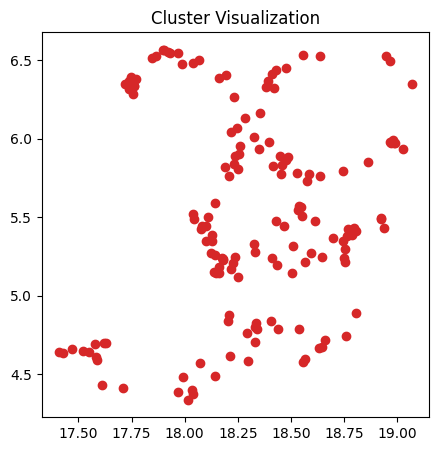

159
6217 "GR"
9098 " 1000"
9481 "leep"
9726 "256"
9926 "perties"
9942 " GR"
10042 " -\"
10069 "Format"
10111 " stores"
10133 "ère"
10169 " markets"
10177 " cardiac"
10222 "ultural"
10236 " semiconductor"
10272 " calculation"
10273 "ande"
10274 "inking"
10282 "Work"
10291 " connections"
10315 " Light"
10337 " Exper"
10359 " substance"
10360 " Author"
10510 "aron"
10530 " ч"
10535 " Hand"
10546 " ham"
10558 "iest"
10594 " sear"
10622 " PT"
10683 "123"
10712 ".."
10723 "aire"
10740 "י"
10750 "ported"
10754 "Ver"
10804 " consec"
11005 "wart"
11648 " everybody"
12572 " Doug"
36336 "autions"
36402 "BIN"
36473 " peel"
36542 " unsupported"
36597 "Associ"
36610 " EG"
36625 " minimized"
36640 "anyahu"
36650 "scala"
36701 " Cs"
36702 " Kot"
36719 " characterised"
36758 "pdev"
36769 "astom"
36775 " FX"
36791 "nature"
36796 " τα"
36799 " directional"
36826 "aille"
36829 " 368"
36843 "yland"
36860 "ADVERTISEMENT"
36902 "rito"
36907 " Loan"
36921 " Genome"
36932 "clonal"
36949 " _""
36952 "*\*"
36954

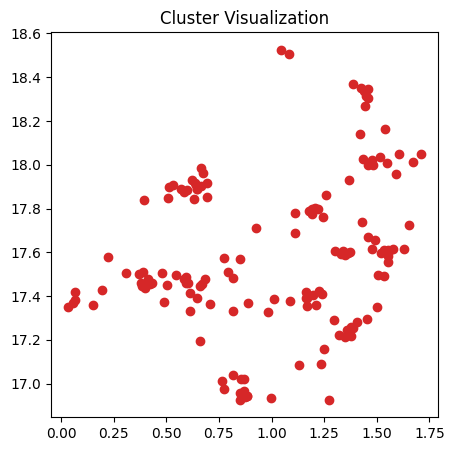

150
11338 " magazine"
19335 "dst"
20198 "JP"
20670 " interpol"
20728 "ophagy"
20992 " compassion"
21193 " Singh"
21374 " sighed"
21554 " voy"
21752 "ervation"
21921 "phantom"
22049 " –,"
22051 " SB"
22129 " veterans"
22230 "eking"
22271 " heroes"
22280 " LETTER"
22281 " electroly"
22321 "artifact"
22336 " flick"
22372 ",[@"
22379 "�"
22391 "326"
22393 " Git"
22418 "?!"
22425 "tees"
22429 " norms"
22441 " foam"
22453 " sequential"
22487 " YES"
22516 "ksi"
22520 " Ñ"
22525 "raise"
22526 "Gold"
22527 "ismiss"
22598 " mmol"
22601 "wegian"
22608 " vie"
22626 " cough"
22630 " garbage"
22632 "notag"
22635 "\**"
22641 "Overall"
22666 "heta"
22679 " Measure"
22703 "graduate"
22724 "hours"
22726 "TOR"
22742 " amplifier"
22771 "iera"
22792 "iplinary"
22796 " clue"
22799 " Carlo"
22851 "agma"
22858 "294"
22864 " Fra"
22892 " symmet"
22909 " explanations"
22914 " excluding"
22918 " substantive"
22926 " chiral"
22933 "ooting"
22944 " dragged"
22945 "plings"
22946 " portrait"
22950 " maximize"
22953 

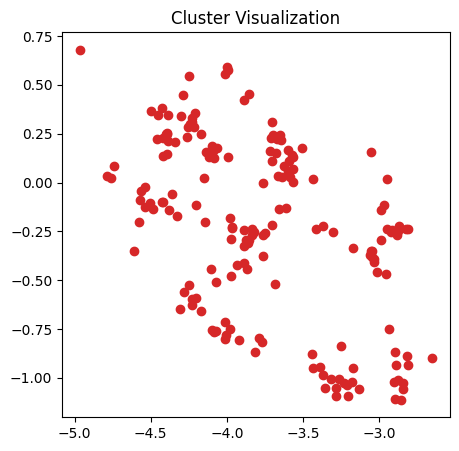

177
344 " he"
627 " there"
703 " she"
755 " get"
841 " these"
937 ",""
1056 " make"
1268 " level"
1500 " She"
1584 "ote"
1605 " De"
1671 "35"
1750 " claim"
1777 " Ph"
1810 " Sc"
1921 " reason"
2006 " Ad"
2031 "44"
2055 "88"
2086 " program"
2101 " Sp"
2120 " full"
2151 " children"
2175 " studies"
2317 " space"
2443 " dou"
2504 "47"
2505 " text"
2572 " increase"
2596 " One"
2604 " Pr"
2641 "Ph"
2649 "nt"
2670 " site"
2677 " quant"
2718 " systems"
2732 " After"
2789 " makes"
2805 " q"
2831 " cross"
2841 "Figure"
2894 "IM"
2932 " Cent"
2946 "App"
2970 " getting"
2995 "oud"
3003 " THE"
3014 "pose"
3030 "ems"
3042 "isf"
3053 " started"
3063 " today"
3077 "IL"
3079 "43"
3081 " additional"
3084 " inhib"
3112 " assum"
3126 " environment"
3132 " indu"
3133 " seems"
3187 " fund"
3188 "come"
3191 "ilities"
3198 " needs"
3207 "CL"
3219 "gest"
3251 "Se"
3253 " everything"
3260 " knew"
3301 " load"
3342 "bf"
3352 " proced"
3373 "rc"
3400 " provides"
3425 " sequence"
3427 " fem"
3470 " functions"
3479

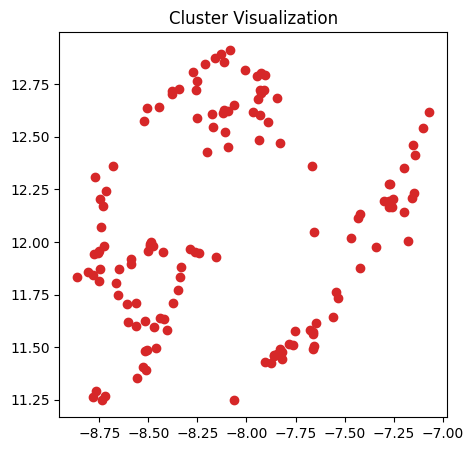

135
25861 " pren"
26041 " autor"
26301 " mt"
26405 " segmentation"
26570 " ect"
26603 " cruise"
26649 "oxygen"
26680 "！"
26754 "plants"
26803 "hig"
26823 " tetra"
26842 " ]""
26848 " ',"
26906 "503"
26976 "munition"
26987 " lovers"
26999 " QU"
27003 "),("
27011 "ortium"
27062 " 1917"
27088 "dv"
27105 " glimpse"
27160 " greenhouse"
27181 "examination"
27182 "RON"
27202 " OC"
27204 " foil"
27235 " Buddhist"
27246 " pes"
27250 "gray"
27270 "Business"
27295 " 3000"
27298 "cano"
27311 " convolution"
27324 " }$"
27327 "Site"
27336 " cooled"
27340 " reliably"
27344 " �"
27368 "imits"
27391 "branch"
27395 "DOM"
27408 " onions"
27422 "origin"
27423 "selection"
27425 "PPORT"
27435 "ού"
27457 " vaginal"
27465 " COMP"
27504 " Sandy"
27518 " 238"
27525 "illet"
27530 "ifs"
27550 "COMP"
27584 "alleng"
27591 "******"
27616 "href"
27622 " ulcer"
27623 " 405"
27628 " Importantly"
27640 "zek"
27643 "oltz"
27649 " EB"
27655 " $[]$"
27658 "uron"
27659 " Stuart"
27675 " Depression"
27694 " revis"
27701 "ege

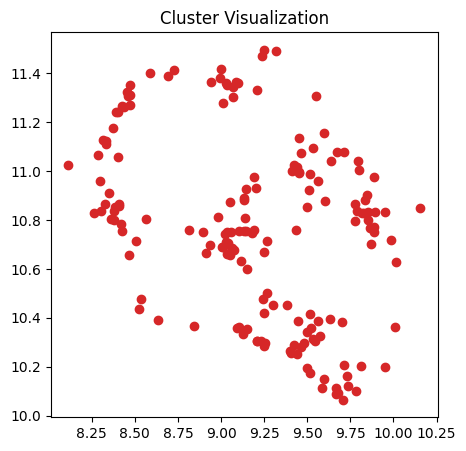

170
1642 " ask"
3963 " regular"
4250 " heat"
6620 "2015"
9587 "erry"
9663 "ş"
9874 "avascript"
10330 " Analysis"
11444 "}^{-"
11737 " tu"
12155 "hh"
12820 " validation"
12843 " Prince"
12879 "area"
13061 "_{("
13132 " implant"
13134 " Mill"
13608 "news"
13918 " 1950"
14109 " appreciated"
14290 " documented"
14837 " Pear"
15298 "nia"
15358 " Try"
15375 "apore"
15455 " considerably"
15503 "ractice"
15517 " cathe"
15639 " compete"
15770 "-,"
15789 " yard"
15922 " liable"
15934 " gard"
15978 " individually"
16052 "}}^{\"
16074 "iquit"
16093 " THAT"
16127 "�"
16151 "agle"
16163 "ș"
16175 " ethnic"
16180 "itol"
16228 " Rules"
16234 " Mexican"
16249 "rock"
16324 "Record"
16421 " diagonal"
16428 " Video"
16684 "println"
16742 "999"
17064 " Gard"
17075 " formul"
17171 "ONT"
17362 " undergoing"
17435 " diabetic"
17445 "axy"
17501 " Otherwise"
18122 " compile"
18410 " Maj"
18532 "emphasis"
18556 " ramp"
19223 " Tu"
24839 " Ton"
32112 " elicited"
32522 "1950"
32842 "Remote"
32933 " advertisements"

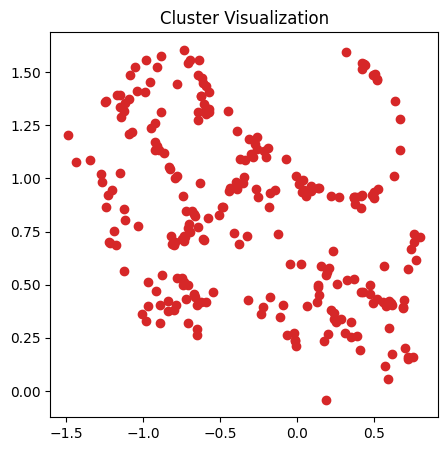

258
12 "+"
44 "K"
45 "L"
55 "V"
109 "�"
140 "�"
276 "ou"
300 "il"
318 "ation"
330 " C"
335 "ul"
357 "ab"
365 "pe"
367 " P"
384 "ht"
391 " r"
399 " D"
404 "ain"
442 "te"
456 "ated"
483 "out"
491 "der"
496 " In"
512 " all"
545 "ph"
550 "cc"
562 " out"
572 " qu"
584 "ace"
589 "ber"
590 "ory"
592 "ents"
610 "ry"
615 "de"
629 " part"
635 "very"
636 "ord"
640 "ake"
643 " other"
650 " gr"
651 " would"
657 " V"
681 "com"
698 "ays"
710 "ove"
716 " te"
719 "cre"
721 " 6"
723 "ings"
731 " them"
737 "gr"
742 "hed"
743 " An"
744 "old"
745 " off"
751 " like"
753 " said"
757 "ian"
775 " Ch"
779 " him"
784 "ious"
786 "ild"
798 "igh"
802 " em"
807 " year"
811 " trans"
829 "cess"
839 "ating"
850 "ient"
852 "stem"
853 "ode"
864 "hen"
868 "les"
871 " know"
880 "]("
888 "ident"
889 "}\"
891 " i"
895 "ix"
896 " back"
907 "ize"
909 "eg"
912 "ange"
913 " ac"
915 " supp"
927 " includ"
930 " num"
933 "000"
941 " data"
947 "ER"
953 "its"
957 "ruct"
958 " fact"
960 "ctions"
961 "mer"
962 "ull"
963 " ty"
965 "li"


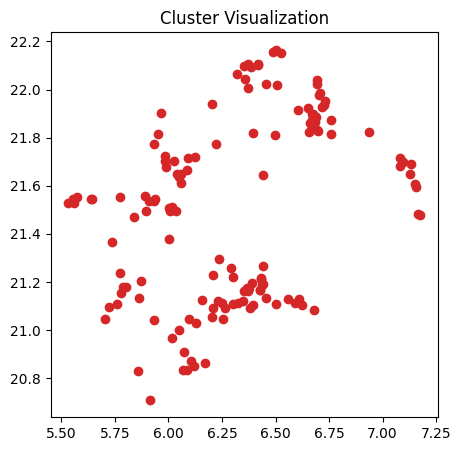

139
17953 " Graham"
18158 " activists"
18475 "leveland"
18703 "Lock"
19001 "dark"
19095 "odo"
19208 " SNPs"
19220 " GET"
19321 "304"
19327 " clone"
19328 " awkward"
19369 "aha"
19371 " Response"
19421 " git"
19507 " shifting"
19508 " strongest"
19517 " HP"
19520 " Bishop"
19549 "ieval"
19560 "extern"
19589 "Person"
19590 " bail"
19595 " relaxed"
19597 "�"
19598 "sets"
19612 "ylon"
19618 "mouse"
19634 "032"
19635 "0007"
19654 " recordings"
19665 " colonies"
19677 " catalytic"
19683 "ieu"
19684 " maj"
19687 "incre"
19691 " END"
19695 " mang"
19700 "chlor"
19704 " conject"
19720 "panel"
19732 " lever"
19737 " aggregate"
19739 "opard"
19746 " Fly"
19749 " lun"
19751 "question"
19756 " lacks"
19762 "jango"
19770 "classes"
19771 "friendly"
19772 " prohibited"
19781 " hollow"
19787 " Shel"
19802 " Cleveland"
19810 " Others"
19816 "171"
19818 " digest"
19823 "powered"
19833 " из"
19842 "GIN"
19844 "onies"
19849 " chromatography"
19855 " restart"
19860 " splitting"
19864 " invite"
19870 " cycli

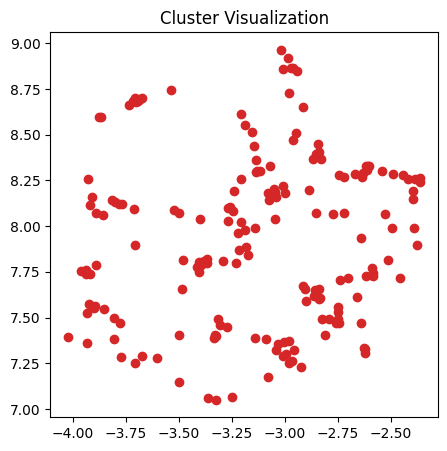

180
2704 "}{\"
4081 " proposed"
5734 " unless"
6735 " debt"
7780 "}}{\"
12661 " propose"
12662 " hint"
15092 " Within"
20502 "station"
26938 " cush"
27132 "Its"
27167 "commend"
27241 " Reports"
27637 "}}}{\"
27713 "ocar"
27895 "blind"
28145 " hints"
28306 "5000"
28344 " hospitalization"
28558 "unless"
28565 " magnetization"
28661 " qualifying"
28837 " slowed"
28841 " offline"
28865 " ribbon"
28945 " Akt"
28967 " lan"
29010 " accumulate"
29067 " 5000"
29112 " hydrolysis"
29133 " surfact"
29169 " Pearl"
29260 " Legend"
29304 "uvant"
29306 " Jenkins"
29342 " pyl"
29367 "OOGLE"
29371 "nucle"
29413 " ک"
29461 " commem"
29470 "하"
29472 " unambig"
29475 " Behavior"
29515 " Gilbert"
29533 "小"
29554 "手"
29596 "Detail"
29599 "validation"
29611 " silencing"
29631 "075"
29647 " determinants"
29655 " Mull"
29664 "ordin"
29708 " frankly"
29780 " beaches"
29818 "GTH"
29830 " Ε"
29842 "ottu"
29861 " towel"
29878 "gres"
29879 "zie"
29901 " phenyl"
29926 " Griffin"
29931 " epilepsy"
29941 "689"
29945 "e

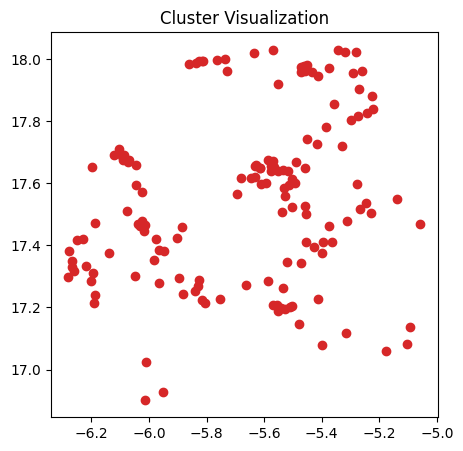

146
23466 " Pin"
24441 "Law"
24467 "icaid"
24971 "irmingham"
25082 " graded"
25086 "�"
25140 "367"
25144 " newsletter"
25212 " NGC"
25214 "brevi"
25217 "Ig"
25245 " ordinance"
25287 " Quebec"
25317 " boiling"
25340 "verb"
25363 " clicked"
25364 " subdivision"
25377 "wrapper"
25406 "aley"
25407 " subtypes"
25417 "antom"
25419 "ITER"
25435 "HB"
25464 " replicate"
25473 " destroying"
25474 " Branch"
25481 " criminals"
25489 "heastern"
25502 " assemblies"
25521 "hello"
25530 " sliced"
25537 " evolving"
25538 "最"
25540 " plural"
25544 " JJ"
25549 " sid"
25564 " Caribbean"
25567 " swelling"
25568 "uent"
25569 "420"
25572 " gambling"
25577 " citation"
25588 "UA"
25591 "psin"
25594 " sexy"
25598 "described"
25599 "onte"
25602 " injections"
25609 "oresis"
25619 " Ign"
25622 " parity"
25623 " Cad"
25630 "atie"
25633 " grocery"
25636 " simplify"
25641 " homeostasis"
25652 "deficient"
25654 "645"
25657 "�"
25673 "fefe"
25676 "284"
25677 "osphere"
25692 "PASS"
25699 " discomfort"
25700 " Medicaid"


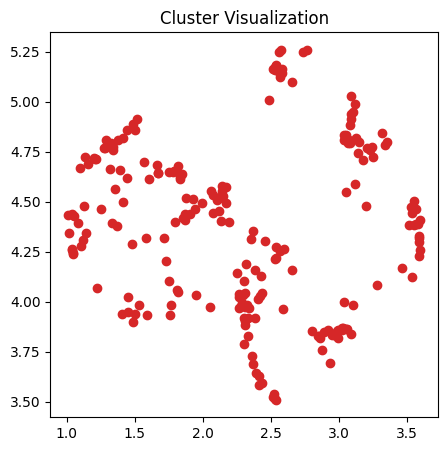

224
81 "p"
102 "�"
126 "�"
201 ""
202 ""
229 "�"
257 "en"
372 " de"
709 "ref"
1125 " aut"
2580 "
                   "
6066 "

           "
9660 "
              "
10442 "aba"
10979 " lattice"
11824 ")_"
15921 " adhesion"
17810 "ociation"
18854 " Jen"
20051 " wrist"
20868 "%"}"
21125 "Float"
24954 " inheritance"
25247 "ceil"
26002 " Costa"
26206 "odi"
26264 " modifying"
26270 "回"
26691 "icos"
27077 "Counter"
27113 " Declaration"
28974 " mall"
29905 " resear"
29942 "
                                      "
30868 " surplus"
30871 "

              "
32140 " workload"
32972 "

            "
34524 "askell"
38164 " HIS"
38827 "

           "
41595 "udeau"
41727 "                                                                          "
43309 " Integration"
43629 "chts"
43732 " 543"
43736 " $<$"
43922 " fret"
44035 " Huss"
44065 " Mickey"
44123 " Liam"
44189 " mét"
44276 " disabling"
44343 " popup"
44424 " bek"
44503 "conversion"
44536 " lions"
44559 " ARI"
44616 " 491"
44647 "670"
44650 "ba

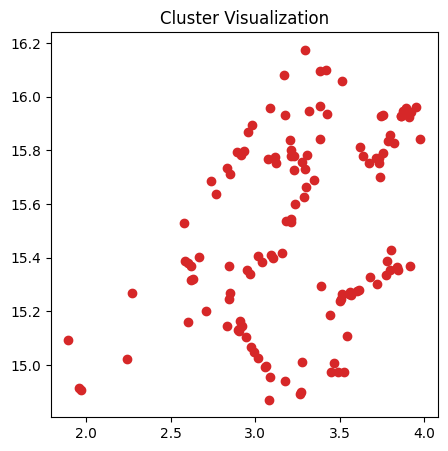

126
558 ");"
3287 "");"
3382 " clinical"
3616 " Brit"
4027 "));"
6263 "_{{\"
8945 " emergency"
9259 "]);"
9271 " Lib"
9284 " refused"
9988 " truck"
10889 "ellee"
12841 " ignored"
13138 " packet"
13662 " Tax"
15084 "incess"
15524 " simulated"
15526 " Chair"
15708 " collision"
16200 " metastasis"
16560 "Root"
17138 " Appendix"
17378 ""));"
17633 " Visual"
17738 "}_{{\"
17763 " Occ"
17766 " Notice"
17926 " 1964"
17997 "gency"
18095 "]}"
18250 " Rand"
18786 "Conclusion"
18921 "accur"
19022 "^{{\"
19029 "lament"
19153 " flip"
19163 "incing"
19344 " terminated"
19502 " iteration"
19524 " enlarg"
19582 " inappropriate"
19758 "abc"
19803 "agm"
19926 " Mes"
19949 " 1963"
20028 " demonstration"
20063 " traged"
20161 "neys"
20216 "395"
20246 "efficient"
20288 " Ll"
20315 " commod"
20440 "umm"
20540 " chunk"
20572 "ť"
20622 "这"
20658 " heal"
20703 "osexual"
20880 " må"
20915 " funeral"
20922 "291"
20934 "อ"
20960 " thir"
20980 "psych"
21096 "Welcome"
21228 "eing"
21236 " Item"
21250 " attendance"


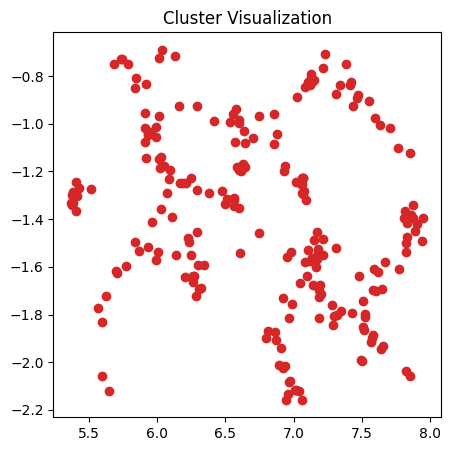

227
159 "�"
192 ""
228 "�"
238 "�"
371 "qu"
2020 " sum"
3232 " administ"
3381 "bre"
3569 " political"
3661 " controll"
4191 " beaut"
4429 " thous"
4472 " Stud"
4668 " military"
5049 " circuit"
5884 " minor"
6029 " Ben"
6932 "ostic"
7343 " accident"
7563 " budget"
7663 " recording"
7880 " absolute"
7944 " tissues"
8044 "                           "
8346 " outer"
8559 "message"
9213 "}+\"
9280 " »"
9570 "isor"
10151 " nearby"
10254 " momentum"
10357 " unw"
10922 " reaching"
11232 "ificial"
11941 " awarded"
12268 "�"
12366 " muc"
12421 " randomly"
12478 " cleaning"
12554 "represent"
13024 " arrival"
13157 " modul"
14001 " acted"
14057 " polymorph"
14145 " offices"
14251 " fragments"
14284 " swing"
14402 " pic"
14410 "Draw"
14759 " Hollywood"
14791 " Pier"
14835 " editing"
15206 " helic"
15268 "Stack"
15275 "よ"
15318 "mitting"
15532 "holds"
15656 "pb"
15671 "phan"
15905 "register"
16059 " mud"
16107 "initely"
16371 " avoided"
16755 "ALS"
17092 "\|_{"
17194 " motivated"
17884 "040"
18783 "

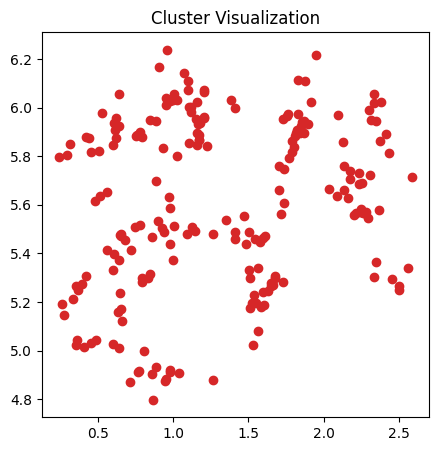

211
524 "===="
2707 "

       "
3019 " $("
3203 "             "
4945 "
             "
5121 "                    "
7665 " alcohol"
8144 " Sol"
9772 "attice"
14921 "                                           "
18118 "
                        "
19933 " bru"
20017 " ker"
21479 "から"
23787 "mons"
24340 " indoor"
24970 "ų"
25012 "atility"
25548 " cartilage"
26217 "iten"
26464 " Kill"
27271 "choose"
27278 " offerings"
27323 "
                                     "
27401 " 
    "
27926 " Thunder"
28264 "yx"
28650 "�"
28679 " Fields"
28863 "cult"
29041 " Archive"
29162 "
                                               "
29223 "
   "
29311 "chel"
29357 " vesicles"
29471 " Fortunately"
30245 " conceded"
30742 " homologous"
32051 " lifes"
32100 "Chief"
32497 " lending"
32574 " Burns"
32776 "  
 "
33185 " Functional"
33528 "
                       "
33822 "Distance"
34270 "attices"
35991 " omit"
41654 " Rosie"
41979 " Pokémon"
42016 "amethasone"
42082 "536"
42086 " governs"
42611 "exact"
42807 "remel

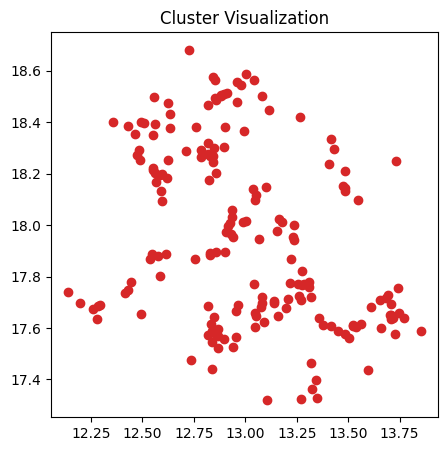

181
2545 " Eng"
8934 "Eng"
10669 " token"
11334 " 111"
11706 " Still"
11949 " embr"
12050 "olesterol"
12099 "inch"
12252 " reply"
12278 " Pop"
12347 "108"
12374 " ((-"
12462 "�"
12488 " identifying"
12503 " deposition"
12539 " dip"
12550 "your"
12576 " Jun"
12580 " pi"
12582 "022"
12586 "enz"
12594 "away"
12669 " checking"
12678 " plea"
12732 " MP"
12751 " Ren"
12760 " Latin"
12767 " treating"
12792 "analysis"
12813 "plex"
12823 " computers"
12857 "Sche"
12865 " ly"
12877 " attributed"
12885 " Holly"
12900 "FLAG"
12937 "isl"
12979 " Fif"
12986 "plicity"
13006 "methyl"
13027 " preferably"
13046 "agg"
13051 " Anderson"
13052 " likes"
13055 "burgh"
13059 " args"
13090 " în"
13114 " Ryan"
13145 " AG"
13147 "cler"
13166 "enza"
13173 " Ele"
13176 " spont"
13183 "andy"
13185 " transmit"
13189 " brothers"
13191 " supplies"
13213 " categor"
13226 " engagement"
13228 "uble"
13235 " anterior"
13237 " gradually"
13238 "Christ"
13239 "mates"
13243 "him"
13245 "bind"
13256 "alg"
13262 "�"
13272 "}""

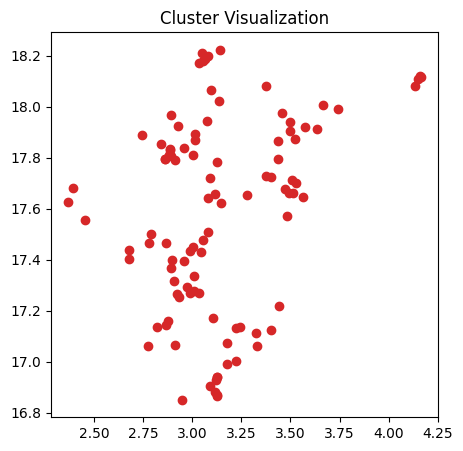

101
2067 " several"
5014 " participants"
8454 " _{"
14481 " inhibited"
14687 " participant"
14986 " μg"
15582 " inhibit"
15892 " ^{"
17470 "achel"
17786 "185"
18035 " ethics"
18555 " SEM"
18755 " quantified"
19394 " junior"
19647 "giving"
20207 "312"
20233 " Basic"
20353 "タ"
20365 " lingu"
20395 "259"
20432 "especially"
20442 " vil"
20492 " OH"
20824 " schema"
20940 " _{\"
20955 " DES"
21018 " interrupted"
21039 " platelet"
21063 "chief"
21088 " Marie"
21101 " archae"
21108 " Reading"
21130 " Andy"
21163 "�"
21185 "imals"
21209 " municipal"
21225 "/#"
21239 "tz"
21342 "Moreover"
21357 "regn"
21394 "ρι"
21425 " inhibits"
21426 " beloved"
21433 " क"
21442 "polymers"
21516 "μg"
21522 " spac"
21607 " competitors"
21636 "alone"
21657 " experimentally"
21658 "shore"
21666 " Participants"
21701 "ulic"
21715 "П"
21727 "Dam"
21735 "aran"
21749 "Elect"
21767 "yll"
21781 " arthritis"
21794 " prey"
21910 " Generally"
21925 " Pant"
21948 " summit"
21988 " Merc"
22010 "事"
22022 " converting"
22023 "

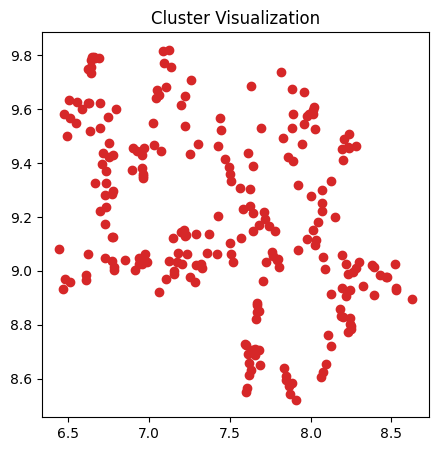

238
1740 " four"
3276 " temperature"
3826 " Dav"
8697 " algebra"
11326 "}["
11882 " conspir"
12721 "'_"
13445 " conspiracy"
13883 "Position"
14241 " moist"
14956 "ikip"
15449 "letal"
15679 " GC"
15696 " Nether"
15740 "oler"
16033 "ocon"
16156 " Walker"
16197 " VE"
16767 "345"
17144 "marks"
17246 " worship"
17829 " abundant"
20023 " undertaken"
21360 " algebras"
21550 " rebuild"
22217 "enne"
22597 "
                              "
24537 " innate"
25024 " parish"
25296 " heels"
26158 "temperature"
33721 "iotensin"
34194 ";&#"
35545 "ravel"
35877 "amphetamine"
35922 " believers"
36113 " Dw"
36168 "三"
36711 "luent"
36715 " heroic"
37329 " $-\"
37457 " ACTION"
37463 "dbg"
37549 " Genes"
37698 "Visit"
37747 " cane"
37777 "blow"
38006 "\~"
38007 " Parish"
38173 "ClCompile"
38342 " doubtful"
38515 "ilian"
38600 " HV"
38681 " fertile"
38712 " stationed"
38813 " aneurysm"
39200 " adjoint"
39203 " vegetarian"
39234 "uckland"
39262 " favourable"
39290 "RN"
39432 " Institution"
39486 " runway"
3954

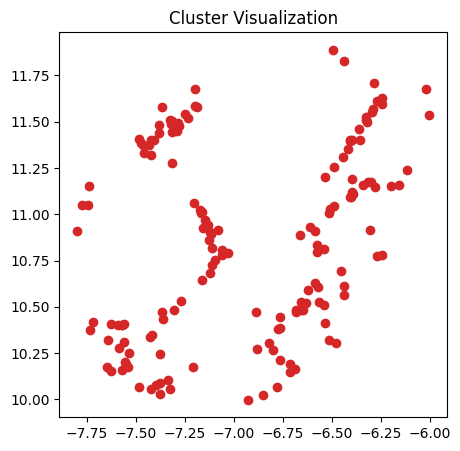

157
25028 "ernate"
25278 " forums"
25460 "gem"
25570 "aphyl"
25899 " coordinated"
26159 "nen"
26473 " �"
26499 "arde"
26569 " blessing"
26588 " plat"
26659 " Ask"
26849 "hibit"
26915 " polymerization"
26964 " interim"
27068 "Interval"
27153 "innati"
27185 " frightened"
27217 "opez"
27237 " warrior"
27277 " 1024"
27453 "TEM"
27455 "arynge"
27764 "orest"
27773 " Blake"
27909 " depressive"
27929 " jeans"
28109 " FS"
28125 "itution"
28143 " DD"
28151 "accharide"
28161 " Numer"
28166 "706"
28191 " Thai"
28201 "Vo"
28203 " improperly"
28234 " accessories"
28251 " specifies"
28274 "Less"
28292 "Former"
28293 "catch"
28316 "helper"
28377 " Ras"
28382 "át"
28384 " worm"
28405 "メ"
28413 " про"
28418 "422"
28455 "”),"
28525 " Chart"
28544 "ös"
28547 " noch"
28548 " glorious"
28552 " glu"
28553 " Wash"
28559 " Goth"
28561 " emotionally"
28588 " coincide"
28595 " toner"
28602 " UT"
28620 " THEN"
28624 " agonist"
28627 "|="
28637 " unpleasant"
28654 " watches"
28667 " innocence"
28673 " proprietary"

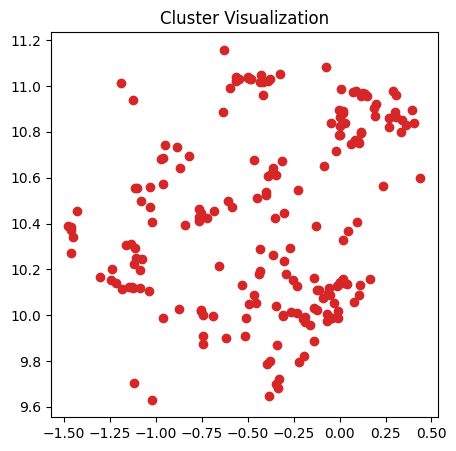

194
7634 " Bur"
9363 " maintenance"
19017 "complex"
20986 " empire"
24382 "train"
26809 "HU"
27604 " Display"
28596 " exponentially"
28924 " sponsor"
28944 "giene"
29120 " MIC"
29527 " dB"
29699 "TLS"
30310 "bundle"
30414 "cursors"
30434 "rison"
30495 "opsies"
30532 "Pars"
30664 "nk"
30720 "aintenance"
30894 " seroton"
31027 "eV"
31145 " sucrose"
31191 " electrolyte"
31207 " indisp"
31275 "GTT"
31325 "Bitmap"
31350 "$]{};"
31394 " wears"
31507 " 284"
31548 " sacrificed"
31573 " Protestant"
31600 "�"
31606 " Railroad"
31620 "Cursor"
31665 "dip"
31743 "^®^"
31780 "Validation"
31784 "ум"
31820 " А"
31862 "asketball"
31904 " \*\*\*"
31971 " foremost"
31986 " visualize"
31992 " canon"
31993 " TEST"
32003 "Scheme"
32007 "unter"
32037 " HU"
32038 " chemok"
32058 " ripp"
32069 " Pav"
32074 " :-)"
32108 " malignancy"
32113 " fills"
32121 "inas"
32127 " inadvert"
32147 " concaten"
32148 " descendants"
32155 " WAY"
32157 " Added"
32158 "1200"
32169 " territorial"
32177 "ceiving"
32186 ")--"
32200

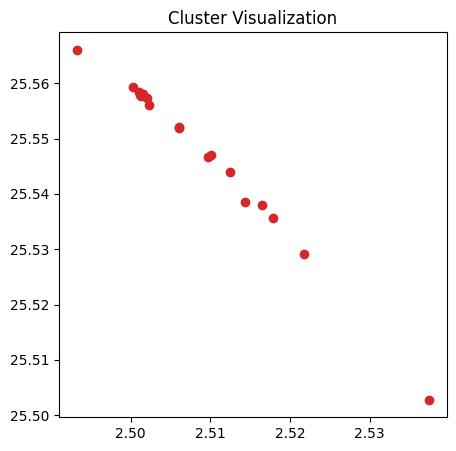

19
33585 "-----------------------------------"
34638 "------------------------------------"
35000 "-------------------------------------"
35349 "--------------------------------------"
36311 "---------------------------------------"
36960 "----------------------------------------"
38944 "-----------------------------------------"
39421 "------------------------------------------"
39485 "-------------------------------------------"
40904 "--------------------------------------------"
42040 "----------------------------------------------"
42451 "---------------------------------------------"
43500 "-----------------------------------------------"
44136 "-------------------------------------------------"
45263 "--------------------------------------------------"
47332 "----------------------------------------------------"
47584 "---------------------------------------------------"
48151 "-------------------------------------------------------"
48904 "--------------------------------------

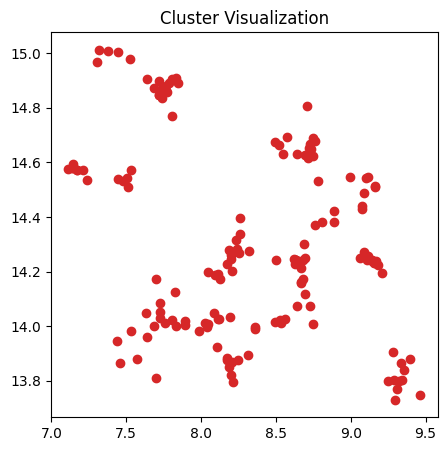

156
8018 " implies"
8770 " behaviour"
13916 " Greg"
14250 "allas"
14499 " Expl"
14704 " embodiment"
14712 " temp"
14824 "party"
15083 "expl"
15124 "した"
15239 " slot"
15331 " toss"
15657 " Ron"
15745 "Those"
15824 " ordering"
15841 " kg"
15895 " formulation"
16009 " Imp"
16042 " counted"
16048 " Sym"
16082 "Jack"
16084 " imply"
16147 "rans"
16149 " varies"
16168 " edited"
16176 " 350"
16181 " Bio"
16186 " eq"
16211 " Cass"
16221 " 1968"
16226 " performances"
16230 " advertis"
16263 " hire"
16267 " excuse"
16272 "risk"
16277 " lesser"
16291 "abis"
16314 "proof"
16320 "Intern"
16327 " urine"
16341 " OUT"
16343 "gebras"
16355 " negligence"
16366 "decl"
16370 "PECT"
16379 "Items"
16383 " outstanding"
16386 "ked"
16396 " sheep"
16398 " Guide"
16407 " memor"
16412 "atisf"
16419 " rocks"
16423 "ив"
16436 "ク"
16449 " EN"
16452 "compass"
16457 " humanity"
16464 "atching"
16467 "Integer"
16482 "�"
16484 "cover"
16494 " Debt"
16499 "ylation"
16504 " fluor"
16516 " publications"
16517 " ses"
16522 

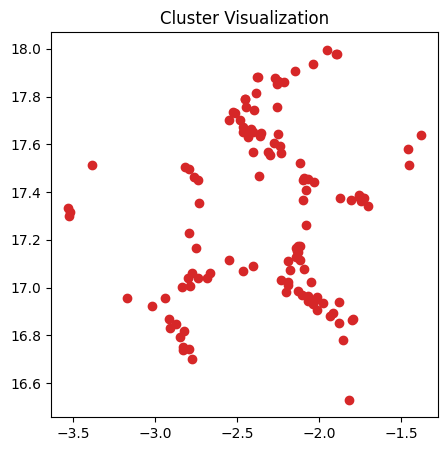

120
7278 " enhance"
22587 " Ay"
22593 "inee"
22660 " Either"
22889 " Bour"
23329 "odic"
23470 " balloon"
23524 " ss"
23608 " infiltr"
23636 " cube"
23719 " ApJ"
23738 " eighth"
23740 " epithe"
23769 "ellate"
23821 "apon"
23890 " Entertainment"
23891 " grams"
23931 " nationwide"
23941 "batch"
23957 " statue"
23962 " alleging"
23977 " χ"
24000 "bis"
24016 " Problem"
24046 " Sample"
24057 "Extension"
24067 " loos"
24068 " REG"
24077 " filtration"
24093 "Journal"
24107 "ylan"
24115 "Wall"
24137 "380"
24153 " ester"
24157 "astro"
24161 " Against"
24162 " invari"
24167 "|_"
24170 " mixtures"
24176 "heng"
24182 "esp"
24190 " bitcoin"
24223 " ultrason"
24232 " 177"
24248 "ят"
24253 " Ec"
24257 "334"
24263 " Penn"
24267 " colleges"
24269 "triangle"
24283 " pools"
24290 "tiny"
24295 " puls"
24310 " так"
24313 " RS"
24355 " η"
24381 "क"
24402 " carot"
24405 " ingredient"
24407 "ARM"
24408 "Comput"
24424 "357"
24425 " Bapt"
24428 " spinning"
24432 " practitioners"
24450 "GLE"
24452 "ahr"
24479 "il

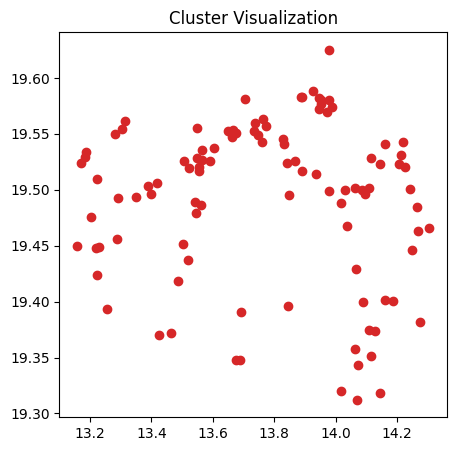

103
9732 " teacher"
10181 "frastructure"
10772 "Cell"
10954 " teachers"
11154 "ctx"
11251 " intrac"
11319 " infrastructure"
11395 "180"
11547 " newspaper"
11578 " Low"
11616 " comprising"
11640 " variants"
11641 " Cell"
11652 " professor"
11668 " Take"
11677 " Inte"
12002 " abstract"
12035 " 119"
12093 " comprises"
12115 "119"
12178 "orable"
12222 " expenses"
12245 " Third"
12287 "arer"
12339 " penalty"
12361 "namespace"
12368 " este"
12381 "iotic"
12406 "angular"
12407 " persu"
12423 " arc"
12424 "abe"
12429 " Matt"
12431 " earned"
12437 "AMP"
12441 " Cat"
12442 "Met"
12449 "engers"
12450 " readily"
12456 "UP"
12461 " nutrition"
12484 " Rights"
12505 "tan"
12506 " oh"
12530 "**."
12544 " tracking"
12549 " resonance"
12607 " stomach"
12612 "Section"
12621 " bird"
12623 " locked"
12627 "achine"
12628 " ik"
12629 "iones"
12646 " displays"
12649 " aqu"
12659 " remembered"
12660 " 180"
12676 "�"
12683 " Ven"
12697 "History"
12710 "made"
12716 " contacts"
12724 " consistently"
12728 " Syria

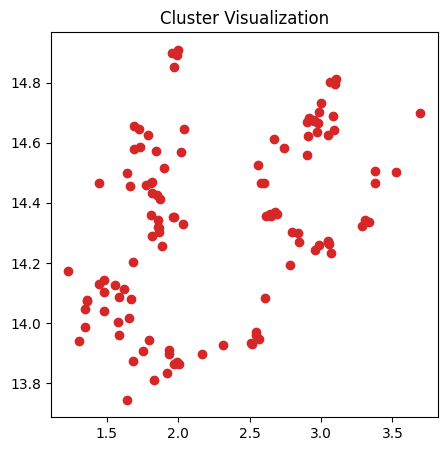

112
6488 " electron"
6803 " assessment"
11077 " cohort"
11537 " Rh"
13584 " leak"
14478 " MRI"
14646 " neighbour"
18877 "Figures"
18890 " ib"
19179 " Computer"
19219 " $^{"
19652 " flaw"
19676 " authentication"
19701 " Polish"
19812 " impe"
20193 " wealthy"
20306 "iginally"
20327 "otides"
20356 "Security"
20397 ""`"
20730 " polí"
20779 "chanical"
20781 " kö"
20821 " accumulated"
20879 "=["
20901 " Compared"
20973 " Connecticut"
21010 " simplified"
21123 " Tel"
21380 "vä"
21397 "324"
21422 "�"
21427 " transc"
21480 "idin"
21648 " mell"
21692 " lasting"
21785 "~/"
21826 " LICENSE"
21876 " breed"
21950 "Works"
21992 "oths"
21993 "ureus"
22040 " geomet"
22081 " locking"
22106 " Resource"
22110 "zheimer"
22137 "pnt"
22229 "\("
22278 "aho"
22380 "ritten"
22410 "MRI"
22517 "ynamics"
22574 "STATUS"
22616 " ei"
22708 "Cross"
22713 " accent"
22802 " jumping"
22854 "asters"
22865 " pare"
22890 "ienna"
22920 " homeost"
23258 "hered"
23433 "Question"
23448 "adays"
23494 " Shanghai"
23548 "uetooth"


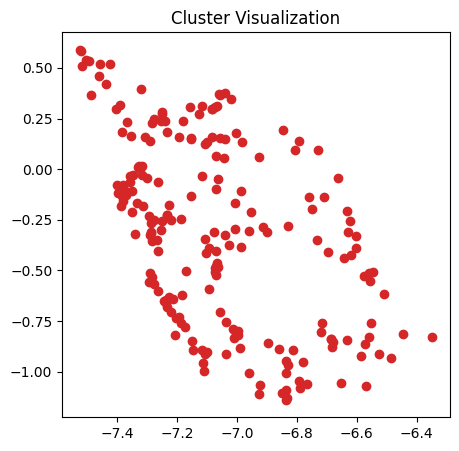

210
2281 " rate"
2396 "conom"
2425 " activity"
2605 " structure"
2636 " ce"
2661 " calcul"
2665 "ortun"
2758 " members"
2773 "That"
2796 " (*"
2800 " six"
2825 " sex"
2840 " custom"
2845 "rec"
2849 " magn"
2937 "itten"
2944 " decl"
2980 "ening"
2981 "xi"
3000 " words"
3017 "ols"
3025 "verse"
3036 " fig"
3037 " learn"
3045 " performance"
3057 " contact"
3062 "more"
3075 " pain"
3086 "anced"
3088 "do"
3099 "miss"
3101 " mother"
3119 "istance"
3122 "/*"
3127 " 21"
3134 "ensive"
3139 " itself"
3140 "file"
3141 "78"
3146 "atively"
3148 " display"
3150 " die"
3151 "omega"
3157 " improve"
3158 " quick"
3169 "based"
3173 " Im"
3186 " search"
3189 " Me"
3190 "ynam"
3194 "eks"
3199 " pan"
3205 "iles"
3211 "code"
3212 " behind"
3216 " ground"
3221 " false"
3227 "ha"
3231 "OC"
3239 " page"
3248 "ese"
3250 "‐"
3261 " looked"
3265 " ess"
3268 " distribution"
3277 " Qu"
3280 " input"
3281 "size"
3283 " predict"
3293 " les"
3297 " stay"
3304 " inside"
3307 " 22"
3309 " necessary"
3314 "ç"
3317 " dim"


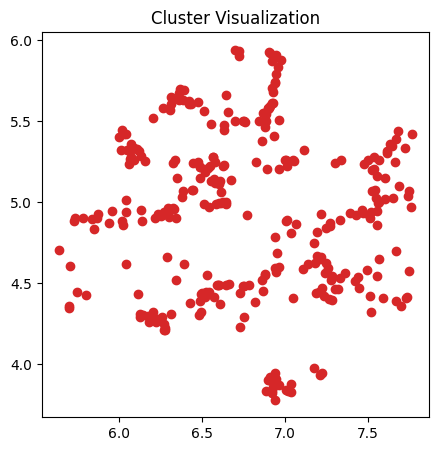

309
13105 " Brad"
13319 " holiday"
14086 " dense"
16989 "148"
20369 " Federation"
20476 "launch"
21900 " collapsed"
38339 " Scheme"
38363 " <>"
39043 "bias"
41331 "Iron"
41432 "071"
43376 "ursed"
43454 "ListView"
43755 "Corn"
43814 "abella"
43968 " Cyp"
44026 " SCH"
44032 "PRINT"
44056 " Lindsay"
44066 "Activ"
44074 " Lights"
44214 " patented"
44258 " npm"
44281 "refs"
44318 " FW"
44323 " Cake"
44326 "elic"
44362 " Wheel"
44444 "bly"
44445 " inclus"
44452 " Shepherd"
44454 " JNK"
44462 " bellow"
44464 " bans"
44465 " Deaf"
44485 " Rent"
44486 " QString"
44487 " starving"
44546 " Translation"
44580 "ERTYPE"
44583 " depuis"
44589 " Une"
44598 "467"
44603 " flakes"
44648 " vá"
44713 "ittest"
44726 " Rates"
44734 "hk"
44749 "textarea"
44751 "Risk"
44772 " Strickland"
44834 "Sb"
44835 "ր"
44852 "FLOAT"
44857 " Sites"
44860 " Ride"
44866 " postponed"
44881 " doubly"
44903 " MIL"
44912 "ため"
44936 "AtIndex"
44938 " footing"
44953 "781"
44975 "andidates"
44979 "rotate"
44992 " sacks"
44996 " ky

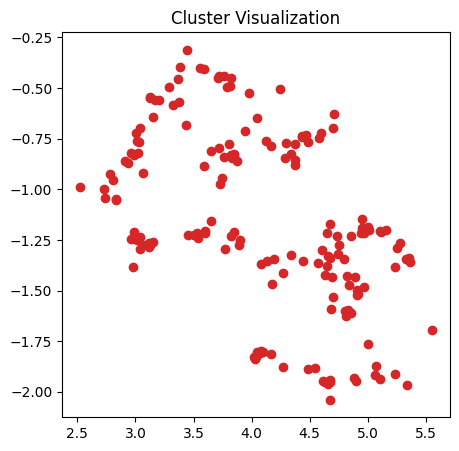

170
26 "9"
39 "F"
51 "R"
93 "|"
96 "�"
175 "�"
179 ""
189 ""
296 "st"
319 "ow"
363 "ri"
373 "res"
416 " R"
447 "ies"
461 "ust"
462 "og"
514 "act"
522 "ap"
588 " will"
593 "ance"
609 "are"
641 "ors"
684 "ates"
732 "lect"
736 "row"
746 "19"
780 "ual"
781 "ick"
813 "elf"
816 " just"
820 " co"
826 " la"
837 "oth"
851 " ret"
929 " �"
968 "ins"
982 "ics"
1019 "]{"
1054 " min"
1062 "ool"
1064 "ork"
1184 "]\]"
1762 "05"
1961 " avail"
2766 "+\"
2954 " relationship"
3051 "obal"
3070 "gree"
3096 " Ge"
3240 " quite"
3477 " easy"
3760 "rial"
3868 "σ"
4080 " measured"
4308 " stim"
4435 "ч"
4729 "ifornia"
4988 "amin"
5052 " resistance"
5101 " sun"
5138 "�"
5319 " characteristics"
5337 "ustr"
5359 "otal"
5445 " exposure"
5686 " born"
5729 " Pre"
5782 " proport"
5920 " frag"
5939 " distributed"
6232 "ansion"
6236 "ulin"
6299 " concentrations"
6689 "she"
7042 "ells"
7106 " focused"
7173 "iot"
7346 " 120"
7362 " scr"
7821 "inv"
7921 " relax"
7957 "fast"
8004 " smallest"
8008 " interact"
8139 " …"
8356 

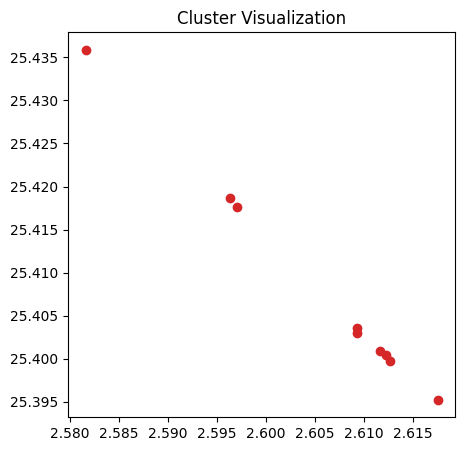

9
573 "----------------"
15879 "--------------------"
22873 "---------------------"
22928 "------------------"
23130 "----------------------"
23380 "-----------------"
23796 "-------------------"
25916 "-----------------------"
26043 "------------------------"


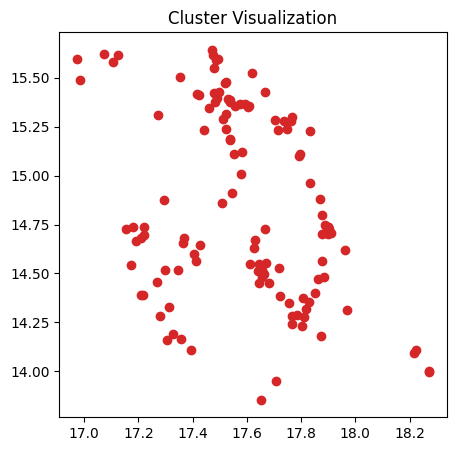

124
9474 " controvers"
10170 " victory"
10325 " universe"
10734 " Ray"
10951 "Second"
10977 "θ"
11013 " ==="
11041 " variance"
11046 "bled"
11075 " Start"
11138 " improving"
11140 " 125"
11153 " }\"
11171 "hol"
11172 " vascular"
11173 " tape"
11183 "update"
11184 " fewer"
11200 "Token"
11211 "eneath"
11216 " loud"
11228 " Bon"
11229 "ublished"
11241 "Update"
11252 "API"
11257 "Instance"
11263 " Media"
11265 " telephone"
11268 " Spain"
11281 " basket"
11282 "adi"
11292 "eties"
11293 " Comm"
11298 " listening"
11304 "aska"
11318 "aland"
11325 "019"
11345 "aws"
11346 " enjoyed"
11347 "istence"
11349 " consumers"
11351 "stable"
11358 " elsewhere"
11361 " advantages"
11362 " Age"
11363 " branc"
11372 " faced"
11386 " debut"
11392 " reflected"
11397 " Library"
11402 "advant"
11407 " executed"
11408 " desirable"
11411 " tracks"
11418 " Miller"
11419 " meta"
11422 " 87"
11423 "annot"
11425 "should"
11426 "ogenous"
11427 "sv"
11429 "etch"
11432 " Major"
11435 " appreciate"
11438 " movements"
11

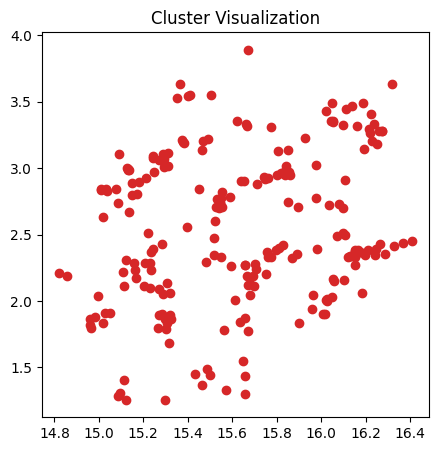

222
8946 " classical"
9579 " degrad"
9650 "χ"
9753 " Development"
9856 " registered"
9893 " Cast"
9991 " diversity"
10002 "who"
10006 " modes"
10032 " entr"
10048 " satisfied"
10094 "agraph"
10295 " kernel"
10318 " Text"
10341 " arbitrary"
10372 " Chapter"
10409 " remem"
10424 "oli"
10478 " header"
10511 "athan"
10678 " drinking"
11276 " Taylor"
11393 " rural"
11704 " accompanied"
35517 " boiled"
35555 " Popular"
35981 " Identity"
36109 " kont"
36248 " cavalry"
36435 "digit"
36539 "096"
36742 "mesh"
36963 "════"
37134 " είναι"
37174 " 640"
37388 "ierung"
37426 "anches"
37567 "awning"
37615 "young"
37748 "Models"
37754 " heterozygous"
38003 "Matthe"
38071 " Irving"
38084 "ые"
38250 "forest"
38335 "tumor"
38383 " tensile"
38555 " horns"
38569 "bellum"
38587 " nanot"
38599 "610"
38635 " Bound"
38640 " identifiable"
38731 " Spar"
38735 "Earth"
38771 " misses"
38786 " sponsorship"
38818 " lbs"
38951 " dispensing"
38991 " 507"
38995 " deletions"
39011 " mathematic"
39014 "uso"
39066 "AVA"
39

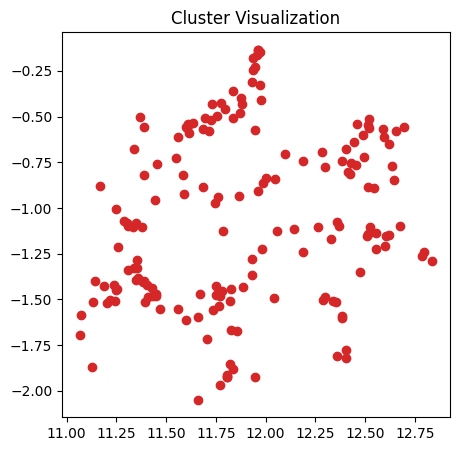

172
2686 " actually"
4072 " 2013"
7923 " polymer"
8423 " suddenly"
8624 " principal"
8958 " knowing"
8966 " Henry"
9476 "attering"
9604 "Response"
9766 " manifest"
9791 " pra"
9892 " Appeals"
10054 " paying"
10214 " contrary"
10311 "NOT"
10335 " ster"
10660 " renew"
10989 "TD"
12145 " boss"
12249 " Kenn"
13113 "                                     "
13184 " suicide"
13360 "ouds"
13371 " glob"
13431 "amo"
13971 " iPhone"
14357 " weigh"
14671 "lich"
14858 "ια"
15851 " prayer"
21885 " genomes"
25752 " stripped"
28272 "                                                               "
29270 "}}=\"
30079 "})=\"
30734 " fermentation"
31510 "docker"
33641 "clair"
34243 " ideally"
34893 "UNC"
35089 " sailors"
35279 "oste"
35790 "ד"
36125 " Ö"
36276 " thief"
36330 "exposed"
36513 " menstru"
36586 ")]("
36844 " erase"
36933 "Priority"
36940 "imates"
37183 " {%"
37338 "=================="
37826 "xrightarrow"
37980 "ÐµÐ"
38615 " barbar"
38667 " elapsed"
38931 "ogon"
38954 "Studies"
39013 "protection

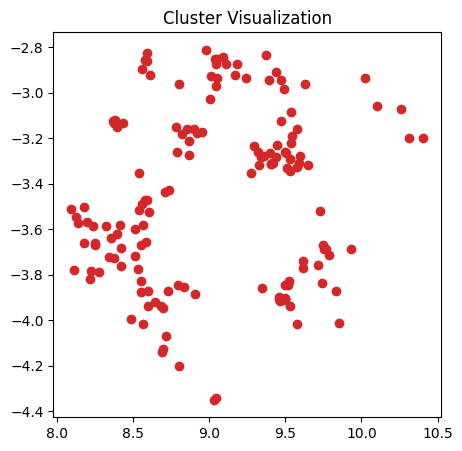

153
1453 " control"
2736 " detect"
4238 "was"
4975 " injury"
5147 " platform"
5192 " Ac"
5403 " 2006"
5826 " 2005"
6157 " 2004"
6491 " People"
6532 " plasma"
6670 " digit"
6733 " efficiency"
6755 "2012"
7088 " Good"
7167 " SN"
7705 " FIG"
7754 " Rad"
8105 " tail"
8375 ""),"
8376 " intra"
8383 " glucose"
8649 " het"
8669 " Road"
8761 " profession"
8804 "од"
8819 "ws"
8836 "People"
8849 " weekend"
8879 "aze"
8985 " binary"
8986 " winter"
9174 "rition"
9222 " assault"
9233 " RT"
9277 " WITH"
9343 "PCR"
9382 "avas"
9448 "oids"
9456 "mond"
9459 " regime"
9464 " transcription"
9514 " б"
9538 " fiber"
9574 " bacteria"
9612 " approval"
9613 " Before"
9614 "aylor"
9670 " perfectly"
9706 " encoding"
9752 " Ram"
9760 "unicip"
9783 ")}{"
9792 " Down"
9805 "'$"
9825 " anywhere"
9859 " Last"
9956 " rooms"
10064 "auss"
10073 " assist"
10093 "ë"
10107 "(_"
10157 "itan"
10182 " careful"
10284 "uten"
10459 " corporate"
10484 " 77"
10560 "TYPE"
10798 " males"
10801 "points"
10802 " flood"
10831 " swim"
1

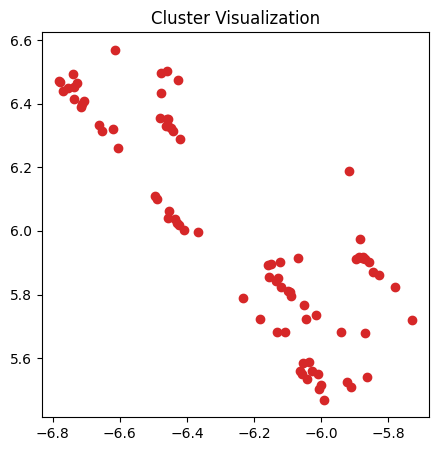

83
2601 " protein"
3095 " someone"
3896 " squ"
4018 "}}$"
4130 " everyone"
4745 " immediately"
4891 " solid"
6580 "})$"
7103 " evaluation"
12011 "}}}$"
16996 "}})$"
17154 " depict"
17253 " depicted"
17814 " Everyone"
18103 "))$"
20112 " Protein"
21814 " tak"
23161 " Tak"
23278 " stimulate"
23600 "squ"
23631 "Everyone"
23706 "solid"
23923 " originated"
25399 " Squ"
25708 " awaken"
25936 " Redist"
26013 " Anyone"
26157 " Opinion"
26318 "jackson"
26421 " 1938"
26639 "mediately"
26733 " Wonder"
26749 " renormal"
26774 "gang"
26806 "vertical"
26919 "cip"
27057 " Solid"
27158 "708"
27219 " Growth"
27263 "attery"
27283 " Jamie"
27370 " nond"
27473 " idle"
27543 "Brown"
27641 "headers"
27687 " Orlando"
27688 " Craw"
27720 ".*]{},"
27811 " Commercial"
27923 " spins"
27976 ":%"
28026 " nightmare"
28032 "iates"
28089 " seventy"
28269 "learning"
28435 " yelled"
28541 "Side"
28633 "acements"
29248 " Solutions"
29660 " originating"
31029 " Electronic"
31200 "slow"
31444 " depicts"
34553 " yelling"
3

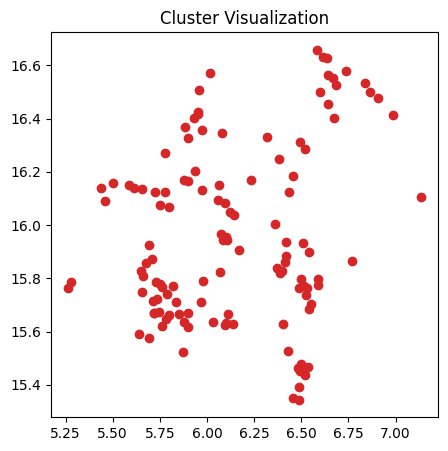

122
1097 " both"
5046 " maybe"
6295 " Both"
8162 " contribute"
8948 " Maybe"
11175 "Maybe"
14082 " &=&"
14253 "RR"
14358 "Both"
14815 " Would"
15222 " Besides"
15548 " python"
15621 " 1973"
15638 "&=&"
15788 " 1974"
15823 " belonging"
15830 "[("
15979 " contributing"
16086 " primer"
16164 " login"
16271 "153"
16280 " besides"
16416 " inch"
16531 " Self"
16609 " 1971"
16659 "python"
16736 "cost"
16772 " neon"
16781 " transistor"
16826 " AK"
16903 "198"
16943 "[]{"
16993 "queous"
17071 "mol"
17076 " furniture"
17090 "ò"
17096 " thereafter"
17152 " Legisl"
17158 "
			"
17197 " hiding"
17224 " comprised"
17254 "vable"
17258 "MIN"
17259 "unny"
17274 " Appro"
17276 " surveys"
17300 " thumb"
17303 " staring"
17304 "Would"
17322 " abdominal"
17332 "ensation"
17338 "transfer"
17343 " contradict"
17353 " Whit"
17366 "äl"
17381 "plug"
17402 " supers"
17420 " combust"
17455 "job"
17543 " glasses"
17622 "imo"
17625 " coup"
17630 " dece"
17672 " Mann"
17678 " primers"
17685 "ön"
17709 " Physics"
177

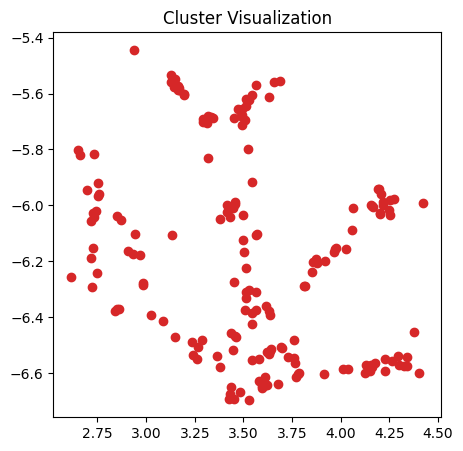

184
4809 " aspect"
5448 " wind"
5595 " Most"
6110 " interested"
6597 "anes"
6827 " Mrs"
7016 " sorry"
7039 " Committee"
7153 " Leg"
7272 "amber"
7329 " exposed"
7364 " limitations"
7378 " willing"
7383 "ellular"
7404 "process"
7407 " experienced"
7410 " constitution"
7425 " dil"
7432 "sin"
7435 " fuck"
7436 "height"
7438 "imer"
7455 "bered"
7470 " suitable"
7474 "Message"
7478 " recognized"
7482 " draft"
7506 "({"
7536 "Box"
7545 "iences"
7554 "300"
7569 " knock"
7576 " accompl"
7603 "aven"
7606 "usiness"
7611 "SR"
7612 " Mer"
7616 " specified"
7622 " route"
7653 " pept"
7660 " attached"
7661 " revers"
7699 " san"
7706 "wing"
7716 "NO"
7723 " dans"
7725 " kne"
7744 " commonly"
7750 "false"
7775 " �"
7776 "ochem"
7784 "tag"
7789 " branch"
7794 " aspects"
7797 "clusions"
7800 " pharm"
7819 " turns"
7823 " policies"
7824 " walking"
7846 " ast"
7849 "ushing"
7860 "ación"
7863 " massive"
7865 "Call"
7873 "star"
7891 " mortality"
7895 " secure"
7904 " 46"
7907 " depart"
7909 "oral"
7911 " pr

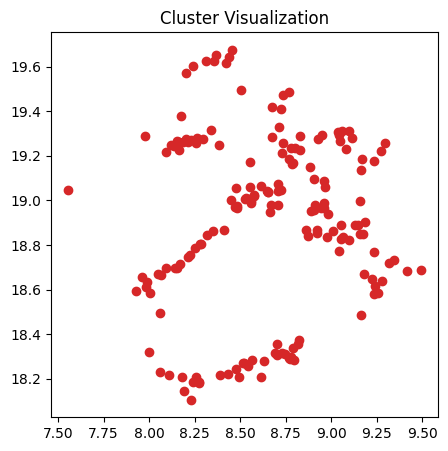

172
7884 "$)"
11841 " Global"
14312 " promoting"
14744 "700"
17408 "fred"
17489 " mesh"
17504 " Protection"
17589 "MEM"
17711 " fractions"
17732 " Å"
17736 "License"
17767 " prize"
17777 "independent"
17789 " sacrifice"
17799 "irected"
17821 "LICENSE"
17868 " Wang"
17890 "comb"
17906 "_**"
17917 " Mg"
17928 " resign"
17932 "character"
17980 "atable"
17988 "ishers"
17990 ")-\"
17999 " speakers"
18013 "illin"
18020 " NH"
18028 " granting"
18033 " Pharm"
18034 "mercial"
18037 "rust"
18040 "206"
18041 "ENS"
18047 " portray"
18049 "vid"
18062 " opponents"
18064 "ivan"
18080 " topology"
18081 "�"
18096 " Pho"
18097 " remand"
18101 "oqu"
18105 "fre"
18106 " waist"
18107 " guided"
18108 "important"
18110 " instinct"
18112 " practition"
18133 " compiled"
18134 " inferior"
18138 " brid"
18140 "："
18150 " Mand"
18167 "aughters"
18168 "iative"
18174 "ERN"
18180 " resting"
18182 " overse"
18183 " pecul"
18185 " withdrawal"
18192 " zones"
18194 " Rat"
18198 " ud"
18209 " lane"
18210 " bypass"
18211 

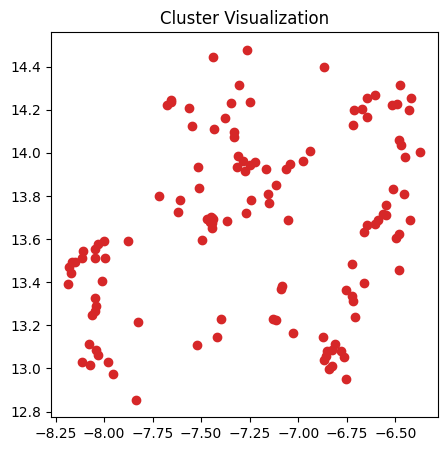

126
5709 "[\"
19569 "310"
25249 "opens"
25332 " сл"
25357 "othetical"
25472 "325"
25506 " corridor"
25833 "typeof"
25862 "FFIR"
25891 " DP"
25952 " Rou"
25996 " merchand"
26066 " Brooks"
26071 "Errorf"
26146 " bargaining"
26183 " tragic"
26255 "liqu"
26286 "iries"
26288 "üh"
26298 " Neil"
26331 " lipids"
26343 "posite"
26345 " rabb"
26354 "果"
26365 "uclidean"
26420 " solub"
26431 "XY"
26493 " fabricated"
26544 "alert"
26587 " Speaker"
26589 "celand"
26599 "arker"
26602 " Specific"
26612 " mé"
26633 "psis"
26646 "RB"
26651 "actual"
26664 " twins"
26692 "Protocol"
26719 "workers"
26720 " EGFR"
26745 " Vert"
26757 " pleas"
26768 " neurop"
26781 "ა"
26783 " RB"
26784 " ideals"
26794 " Nucl"
26796 "odium"
26832 " microgl"
26862 " Nintendo"
26875 " radicals"
26884 " allergic"
26886 "rians"
26892 " cardinal"
26905 " dile"
26909 " TT"
26916 " 1933"
26921 " organizational"
26924 " withdrawn"
26959 "libs"
26961 " optic"
26973 "conjug"
26975 "death"
26984 " jokes"
26998 "Visible"
27010 "ม"
27015 

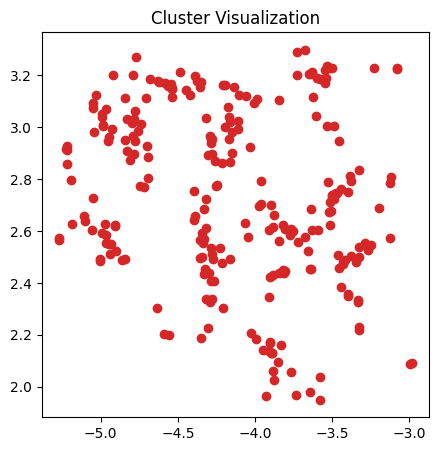

254
827 "iew"
881 "type"
883 "11"
952 " people"
954 " most"
1055 " effect"
1099 "25"
1158 " think"
1166 "17"
1185 " dire"
1195 " tri"
1203 " hel"
1224 "ought"
1235 "50"
1240 "ah"
1246 " present"
1252 "201"
1259 " giv"
1291 "cul"
1300 "igned"
1302 " court"
1304 " report"
1306 "ole"
1315 " fr"
1326 "erg"
1331 " ant"
1341 " cells"
1344 "str"
1346 "ists"
1348 "24"
1355 " small"
1368 "oh"
1370 "az"
1373 "land"
1376 "oad"
1377 "anc"
1381 "":"
1384 " 20"
1387 " group"
1392 "ä"
1403 "aw"
1406 "ron"
1420 "atic"
1424 " cre"
1426 "irc"
1427 "ulation"
1434 "acter"
1440 "tt"
1467 "rict"
1469 " going"
1476 "!""
1485 " inc"
1487 "ides"
1491 " information"
1498 "serv"
1505 "ource"
1512 " too"
1514 "ium"
1525 "99"
1526 "ething"
1527 " open"
1535 " Tr"
1536 " Wh"
1537 " might"
1538 "ission"
1539 "AN"
1540 "64"
1541 "gen"
1544 "ral"
1546 "ural"
1553 "pec"
1554 " mult"
1555 " treat"
1562 "ital"
1563 " following"
1568 "here"
1570 "]."
1572 ")\"
1573 "ording"
1582 "akes"
1586 "duct"
1595 "att"
1597 "thing"


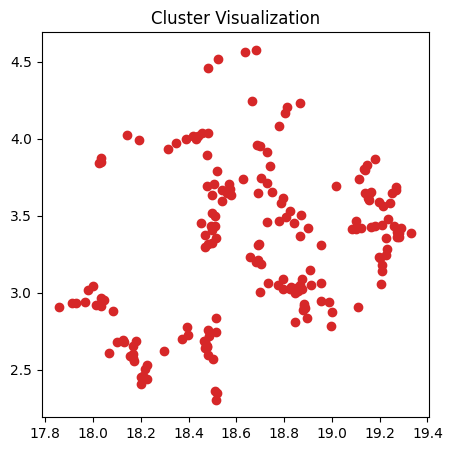

185
9632 " trigger"
9755 "2003"
10065 " pel"
10257 " 250"
10408 "project"
34953 " aviation"
35377 " speculative"
36134 "[\*\*"
36774 " installations"
36880 " RNAi"
36884 "diss"
37009 "LIM"
37053 " troll"
37107 " 436"
37112 " 388"
37124 "afa"
37147 " ancestral"
37200 "oplan"
37239 " Chain"
37251 " hypot"
37291 " jihad"
37336 "navigation"
37343 "enario"
37359 " disastrous"
37369 "rror"
37378 " 560"
37411 "assuming"
37431 " crawl"
37453 "ESE"
37455 " rituals"
37464 " morphine"
37525 "jin"
37531 "�"
37539 " Gandhi"
37545 "061"
37572 " unlocked"
37573 " divert"
37617 " screenshot"
37618 " Artist"
37620 " morally"
37631 " pretrial"
37635 " costumes"
37646 " Eh"
37657 "十"
37688 " 444"
37691 "MH"
37694 "izi"
37716 "onset"
37728 " 373"
37750 " hilarious"
37764 " vort"
37778 " hangs"
37821 "elm"
37839 " Wrest"
37849 " Σ"
37853 "ietal"
37873 "ucci"
37898 "uilt"
37901 " Nem"
37906 "GAA"
37916 ")">"
37937 " prick"
37957 " NPR"
37958 " flowering"
37975 " все"
37985 " BMP"
37987 " Template"
38009 "it

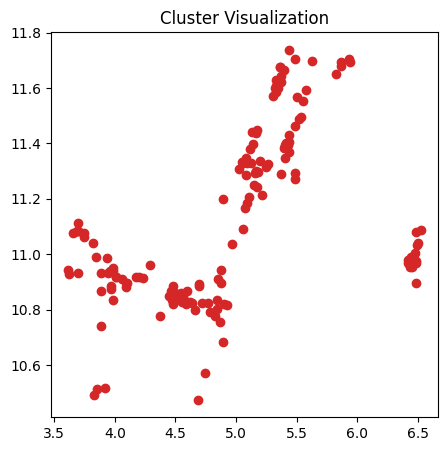

160
4833 " influence"
6293 " thread"
6922 "}}_{"
8156 " realized"
8968 " realize"
9446 " recognize"
9980 " stroke"
10439 " western"
12828 " Mah"
13036 " Prior"
15057 " а"
15566 "Convert"
15848 " cytoplasm"
16004 " FC"
16210 "herry"
16871 " opponent"
16928 " champion"
17059 " threads"
17094 "sent"
17180 "|_{"
17702 " Exp"
17859 "etically"
17976 "isy"
18171 " extensively"
18317 "structure"
19605 " alike"
19607 " hills"
19979 "                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                "
20108 "Prior"
20272 " HCC"
21024 " 
           "
21054 " 1

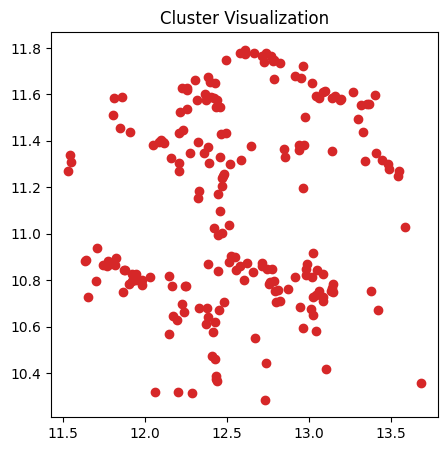

204
2341 " energy"
3324 " bring"
3982 " brought"
4923 " Because"
7392 " echo"
9227 "Supplementary"
9608 "är"
9615 " Es"
9745 " bringing"
10434 " assets"
11377 " engage"
11907 " encourage"
12562 "от"
12846 "regular"
12908 "alities"
12942 " visitors"
13047 "endor"
13093 "\!\!"
13309 ";&"
13458 " pointing"
13579 " Marg"
13876 " wondered"
14104 "terminal"
14115 "energy"
14149 " emerging"
14270 " crossing"
14288 " exclusively"
14320 " deemed"
14420 "oxide"
14434 " "♪"
14444 "Tree"
14464 " historic"
14511 " narrative"
14537 " poison"
14549 " perpet"
14553 "$)."
14597 " funded"
14619 "1988"
14654 " fis"
14702 " Ball"
14703 " Anal"
14707 " wanting"
14726 " Nations"
14732 " COURT"
14876 " suggestion"
14884 " Jane"
14905 " legitimate"
14943 " Kelly"
14984 "Entity"
14995 " spectrosc"
15056 " termination"
15080 " undergo"
15087 " premium"
15110 " cancers"
15180 " computational"
15207 ")^{\"
15209 "velope"
15223 " fake"
15224 "typen"
15227 "sort"
15231 " asset"
15235 "eland"
15241 " hipp"
15264 " b

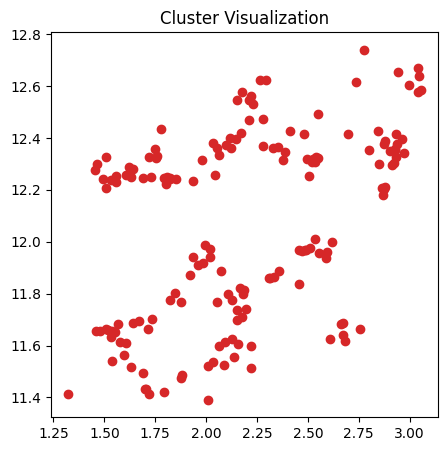

169
12152 " Pot"
15401 " steam"
17903 " summarized"
20458 " zinc"
21869 " Pain"
21883 "icularly"
22021 "amate"
22043 " retinal"
23011 " PhD"
23993 " sunlight"
24084 " Portugal"
26567 "Direct"
26640 " asymmetric"
26799 " summarize"
27981 " Scre"
29797 " Southeast"
31395 "JA"
31437 " numeric"
31699 "476"
31871 "Temp"
32066 "IFY"
32219 " sau"
32408 " distorted"
32563 " rés"
32706 " Sah"
32749 " imprisoned"
32819 " liquids"
32851 " tac"
32860 " )\"
32867 " Else"
32949 " Promise"
32984 " CIRCUIT"
33034 " Imaging"
33061 " hiking"
33063 "textit"
33067 " fug"
33094 "]->"
33106 " Interface"
33121 " absorbing"
33131 " bob"
33133 " Mice"
33134 " Equal"
33173 " pharmacy"
33214 " sulph"
33217 " turbulent"
33251 " 321"
33259 "awi"
33280 " HIF"
33281 "Management"
33299 "fielder"
33312 "beam"
33318 "packed"
33326 " awa"
33329 "EventListener"
33330 " Crawford"
33341 " Behind"
33347 "Theme"
33348 " judic"
33350 " laughs"
33361 " herd"
33365 " libc"
33374 " coff"
33376 "]_"
33379 " biomed"
33399 " BMW"
3

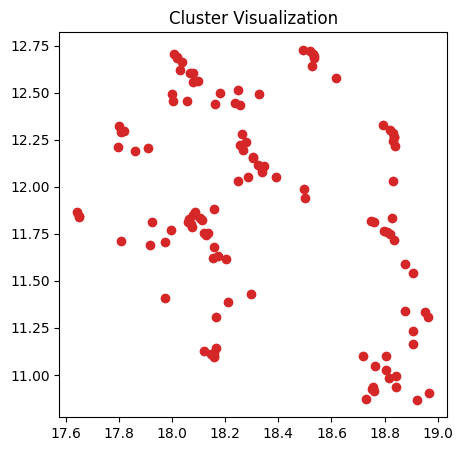

115
5084 " column"
8455 "Right"
9263 "Bu"
9771 " alloc"
10154 " Right"
10354 " Jon"
10362 " ruling"
10365 " embod"
10401 " diagnostic"
10406 " Olymp"
10453 "ск"
10456 " staining"
10525 "amond"
10556 " videos"
10557 " disclosed"
10586 " Southern"
10605 "Current"
10631 "fol"
10636 " execution"
10642 "ansas"
10643 " Ep"
10647 " för"
10667 " \-"
10685 "Tex"
10691 " mater"
10713 " bulk"
10722 "mean"
10733 " Nov"
10751 " til"
10761 " metabolic"
10764 " shares"
10776 " lying"
10800 " ongoing"
10814 " een"
10820 " intake"
10829 " substit"
10838 " energ"
10844 " peripheral"
10851 "Dep"
10868 "inois"
10874 " riv"
10875 " liber"
10885 " handling"
10887 " veter"
10900 " occas"
10915 " uncon"
10916 " Hon"
10928 " obj"
10931 "ylvania"
10932 " organized"
10940 "hav"
10942 " fasc"
10944 "iations"
10953 " comprom"
10962 "�"
10967 "   "
10976 "Options"
11008 " doors"
11011 " Ireland"
11019 " mere"
11020 "gressive"
11021 "Output"
11025 "connect"
11029 " serves"
11033 "ovascular"
11036 "opath"
11067 " Six

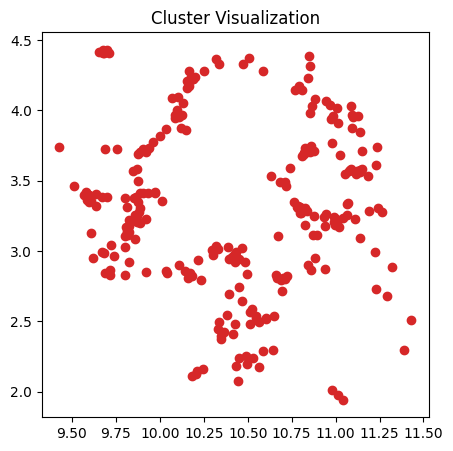

267
5174 "otype"
5899 " traditional"
7336 " Internet"
7827 " conversation"
8116 "Back"
8573 " internet"
8987 " Mexico"
10780 "}-\"
11530 "Stud"
12254 " Defendants"
12528 "gun"
12871 "Bit"
13002 " expressing"
13140 " Beach"
13711 " gross"
15430 " affinity"
15872 " fright"
16036 " Ult"
17163 " forb"
18955 "{{{\"
19120 " Ju"
27468 " \_["
35729 "}}+\"
37439 " LAN"
37443 "Calendar"
38022 "AMA"
38328 "而"
38369 " arrhythm"
38421 "Defendants"
38654 " Transcript"
38700 " barr"
38929 "λη"
39051 " triang"
39088 " sponge"
39287 " repertoire"
39426 " showers"
39452 " Hier"
39518 "ordial"
39750 " Activ"
39809 " marketed"
40140 " lobbying"
40174 " philanth"
40329 "�"
40624 " BRCA"
40625 " 489"
40668 "ATURE"
40820 "ierno"
40835 " inland"
40865 " bearings"
40871 " galleries"
40931 "dala"
40999 " cela"
41031 " uranium"
41085 "需"
41127 "GRE"
41147 "ول"
41238 " PROF"
41250 "必"
41274 " bulky"
41298 "chro"
41318 " diplomat"
41345 "098"
41431 " Bri"
41462 " grievance"
41508 "rogenic"
41725 " hut"
41846 "regi

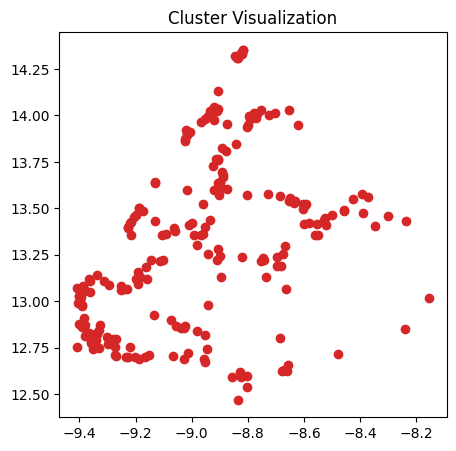

230
22846 " foster"
24628 " supposedly"
25553 "rules"
25691 " rip"
26186 "Um"
26293 "aci"
26414 " converges"
26559 "Illustration"
26604 " kindly"
26650 " musician"
26690 " clinicians"
26710 " scent"
26716 " addict"
26742 " tourism"
26765 "PART"
26810 " Io"
26894 "proportion"
26934 " smokers"
26936 " gloves"
26946 "Mike"
27005 " regimes"
27024 " perfor"
27034 " mirrors"
27035 "Jesus"
27071 " idx"
27091 " 1500"
27112 "enin"
27116 "ei"
27130 " visualized"
27134 " warehouse"
27144 " Continue"
27147 " Healthcare"
27148 "cir"
27155 " debates"
27161 " fertility"
27163 " evaluations"
27165 " upl"
27183 "peak"
27221 " decays"
27222 "342"
27224 "USH"
27230 " Lif"
27234 " Assuming"
27243 " SSL"
27244 "048"
27255 " LIABILITY"
27257 "folk"
27260 "Feature"
27261 " Julia"
27264 " Mario"
27268 "mith"
27284 " Philosophy"
27299 "purpose"
27306 "OWER"
27308 " Suz"
27315 "Norm"
27316 "mage"
27318 " 264"
27321 " highlighting"
27322 " 310"
27325 " Sudan"
27326 " rejo"
27333 " caller"
27339 "ב"
27342 "Jose"


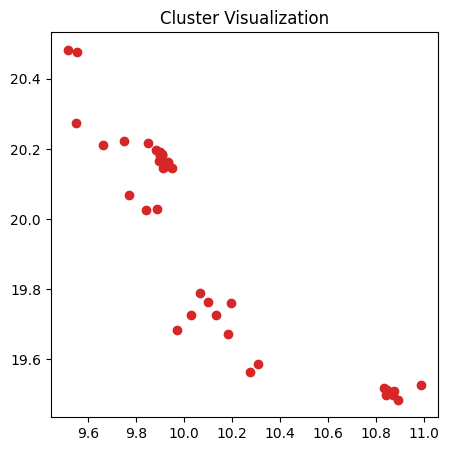

40
4164 " il"
10417 " Real"
11090 " Il"
11286 " transplant"
11348 " fluorescence"
11649 " uncertainty"
11970 " Through"
11977 " Following"
12008 " vice"
12106 " analyze"
12148 " contends"
12469 " Aud"
12617 " Cu"
12738 " cod"
12928 "params"
13092 " LI"
13842 " 1979"
17588 "Following"
17642 "Real"
17912 " consequently"
17979 " Vice"
18055 " fears"
18061 " transplantation"
18132 "activated"
18142 "Aud"
18145 "gets"
18206 "LI"
18219 " está"
18305 "resistant"
18394 "orescence"
18401 "Properties"
18478 "issance"
18647 "1979"
18656 "Il"
18657 " uncomfort"
18675 "Cu"
18852 "Through"
18865 "iciary"
18912 " params"
18918 " analyzing"


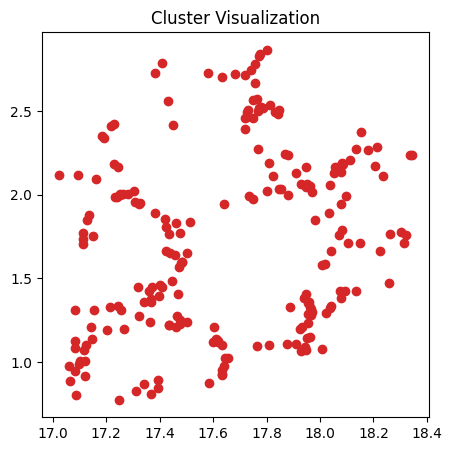

214
8598 " Spe"
9293 "spe"
9986 "edef"
10087 " fragment"
10123 " reviews"
10199 " introduction"
10210 " Bit"
10246 " Bern"
10649 " tract"
10913 " hang"
11653 " onset"
12923 "Spe"
35130 " todd"
35912 " pylori"
36095 "appeal"
36556 "Throw"
36642 "research"
36817 "sentence"
36823 " "`"
36851 "gems"
37211 "inker"
37221 " replicated"
37408 " berries"
37445 " bedrooms"
37446 "////////////////////////////////////////////////////////////////"
37482 "AUTH"
37546 "fax"
37555 "ceptors"
37558 " Legislative"
37603 " Slov"
37608 "undering"
37630 " organizers"
37641 " Jackie"
37705 " hurricane"
37785 " Aer"
37789 "STA"
37808 " disparity"
37813 "sites"
37851 " probabilistic"
37857 "\!\!\!\!"
37882 "responsible"
37951 " mosque"
37971 " prescriptions"
38020 " Bend"
38035 "NOR"
38070 "558"
38109 " removable"
38117 " wordt"
38138 " lest"
38196 " países"
38214 " monde"
38234 " upgrading"
38269 " olfactory"
38324 "agland"
38325 "spark"
38336 " DEL"
38356 " Origin"
38367 " 1850"
38373 "hman"
38377 "θε"
38385

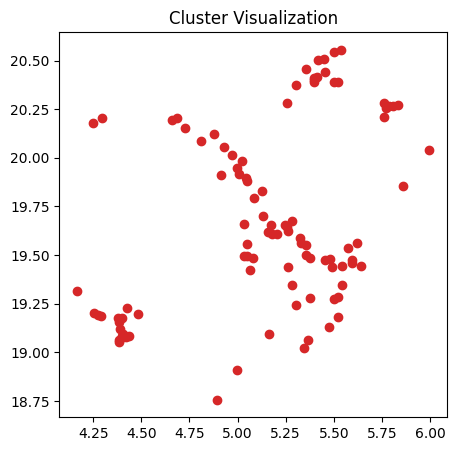

99
5054 " economic"
8778 " fly"
15388 " Hom"
17964 "Save"
18044 "venile"
18189 " Cloud"
18374 " Sequ"
18741 " Remember"
19156 " organisation"
19194 "velt"
19265 " backward"
19346 "San"
19372 " 192"
19436 " Steven"
19494 " plead"
19513 " ugly"
19530 "mos"
19533 "cccc"
19564 " outlet"
19600 " publisher"
19608 " Newton"
19631 "193"
19639 "…."
19643 " malaria"
19646 "ropolitan"
19663 " soluble"
19698 " IO"
19731 "radius"
19767 " complementary"
19780 "�"
19798 " metastatic"
19827 " monster"
19829 " betray"
19851 " spirits"
19878 "Queue"
19898 " Olympic"
19905 " neutroph"
19915 " coordination"
19939 " 165"
19955 " pathology"
19957 "�"
19970 "CHANT"
20005 "方"
20007 "Double"
20014 "mor"
20020 "ocur"
20021 " theatre"
20080 "izoph"
20085 "upload"
20089 "lesssim"
20090 " obey"
20104 "callback"
20118 " antioxidant"
20128 " foregoing"
20144 "ADDR"
20155 " sans"
20158 "rocytes"
20165 " VA"
20176 " Nebraska"
20187 " mate"
20206 "ookie"
20228 " dend"
20261 "although"
20273 "(!"
20287 "能"
20294 "Commun

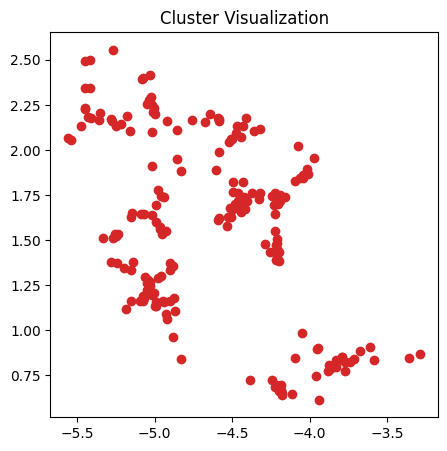

205
754 " He"
831 " This"
1127 " point"
1244 " And"
1276 "What"
1292 " But"
1328 "He"
1332 " method"
1359 " How"
1372 "OR"
1375 " state"
1388 " day"
1393 " appe"
1417 "less"
1419 "ify"
1423 "22"
1445 " art"
1447 "\["
1490 "(-"
1497 "ology"
1501 " post"
1504 "und"
1520 "ured"
1543 " results"
1556 "AL"
1576 "ways"
1587 "(""
1594 " X"
1598 "ably"
1646 " seem"
1703 "ED"
1704 "sec"
1717 "29"
1719 "AS"
1723 " However"
1724 " cal"
1726 " gover"
1737 " What"
1755 " top"
1757 "á"
1773 "Con"
1781 " large"
1820 "reen"
1821 " men"
1835 "####"
1874 "();"
1891 " fail"
1898 "And"
1902 " expect"
1911 "add"
1914 "ien"
1943 " big"
1957 " represent"
1960 " cour"
1972 "ances"
1974 "acy"
1978 " keep"
1989 "But"
1999 "etic"
2021 " family"
2028 " tell"
2029 "=\"
2033 " </"
2063 " pred"
2066 "uff"
2073 "('"
2078 " lik"
2097 " means"
2098 " plan"
2144 " material"
2148 "cle"
2158 "ering"
2159 " short"
2167 " though"
2170 " area"
2179 "iving"
2191 "ney"
2195 "!"
2205 "ley"
2212 "illion"
2217 " enough"
2220 " upo

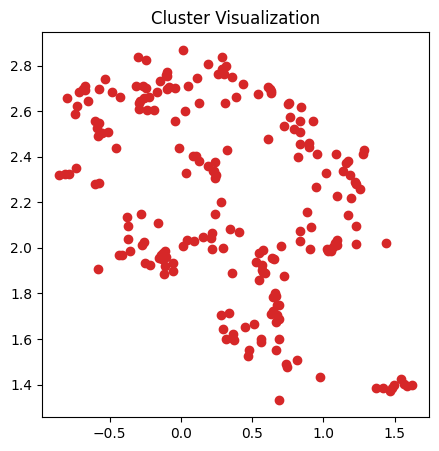

211
36 "C"
37 "D"
48 "O"
59 "Z"
68 "c"
86 "u"
121 "�"
137 "�"
161 "�"
211 "�"
223 "�"
233 "�"
242 "�"
255 "at"
256 " s"
266 "an"
301 "id"
315 "----"
321 "ur"
340 " y"
345 " con"
354 " pro"
356 "ag"
360 "um"
364 " wh"
383 "est"
386 "ant"
388 " H"
413 "ke"
418 " L"
421 "ction"
435 "art"
443 " G"
493 "ost"
501 " res"
509 " comp"
516 " im"
518 "ak"
519 " ad"
525 "ign"
528 "ous"
541 " �"
543 "ong"
552 "ary"
564 " go"
591 " per"
602 "ough"
606 "ang"
611 " K"
652 "vel"
662 "urn"
691 " ob"
692 "ific"
701 " bet"
706 "ob"
712 "irst"
714 " Y"
720 "ject"
730 " gen"
739 "iss"
749 " sub"
764 " comm"
782 "ark"
785 "ma"
800 "ative"
804 "ring"
814 "ug"
821 " val"
828 " inv"
856 "pro"
877 " pol"
893 "ta"
900 "io"
903 "rough"
919 " sur"
923 " see"
925 "fr"
932 "als"
940 " dist"
948 " sim"
955 "ues"
966 " class"
1000 "err"
1011 "oup"
1021 " ext"
1069 "riv"
1073 " di"
1076 "ting"
1086 " dec"
1102 "rol"
1114 " mon"
1122 "ript"
1124 "frac"
1134 "****"
1161 " che"
1180 " number"
1217 "}{"
1247 "gan"
1283 " 18

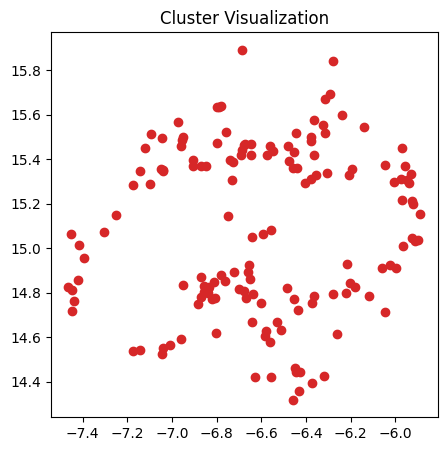

149
24464 "weeks"
24697 " Actually"
24930 "orence"
25027 " parasite"
25158 " fungal"
25179 "Actually"
25243 " fost"
25323 " (."
25536 " united"
25579 " Chelsea"
25632 " Experimental"
25693 "uzzy"
25735 "Educ"
25791 " rang"
25818 " wool"
25829 " careers"
25871 "sty"
25880 " *("
25907 " motifs"
25908 "ollo"
25981 "WORD"
25985 " 182"
26015 " exotic"
26025 "}))"
26048 " Sweet"
26055 " silica"
26061 "

 "
26070 " Sorry"
26091 " manages"
26121 " Nep"
26130 "μM"
26140 "346"
26151 "�"
26155 "Aldrich"
26156 " metres"
26171 "ulla"
26182 " recognizing"
26192 " Baron"
26197 " Same"
26212 " condemned"
26214 "worthy"
26222 " homogen"
26229 " Vienna"
26243 " nä"
26252 " Xbox"
26261 ""
26271 " µM"
26275 " ay"
26277 " jointly"
26292 "ocular"
26303 "="\"
26308 " preoperative"
26312 " statistic"
26327 " Athlet"
26353 " allev"
26362 " {¶"
26379 " siblings"
26387 " VL"
26388 " hearings"
26392 " Element"
26393 " WOR"
26394 " Samples"
26413 " bile"
26416 " leap"
26433 "Lin"
26438 " confession"
26440 "sharp"

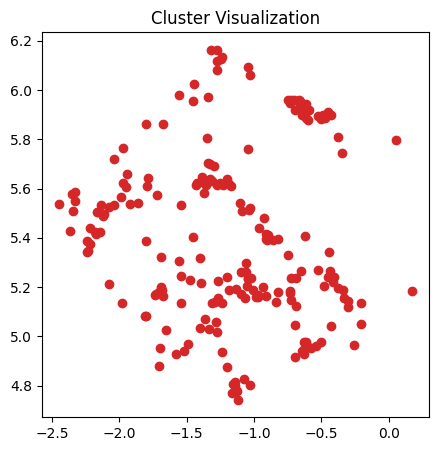

204
648 "
       "
1772 "
  "
1996 " later"
3713 "}(\"
5875 " healthy"
8940 "
                 "
17112 " Staff"
17876 " rabbit"
18977 " pathological"
20563 " griev"
21652 " quantification"
22842 "relations"
23170 "boolean"
23894 " Uncle"
24073 " της"
24493 " scatter"
24857 "arcoma"
25342 " oder"
25501 "uka"
25617 " NAD"
25766 "              
 "
26053 " uit"
26144 " dopamine"
26145 " McDonald"
26534 "iane"
26573 "ATOR"
26708 " collectively"
26727 "EVER"
26797 "atti"
26885 " fierce"
26911 " incentives"
26935 "dings"
26971 "secure"
27073 "oba"
27104 " Darwin"
27366 "falls"
27436 " wrapper"
27632 "805"
27677 " seeded"
27700 " Sha"
27707 "化"
27727 "加"
27831 " Ker"
28042 "rVert"
28079 " Agriculture"
28197 "browser"
28200 " Maxwell"
28247 " \,\"
28312 "urbs"
28353 "fel"
28379 "}</"
28408 "CIAL"
28414 " HL"
28533 "yson"
28540 " Gem"
28621 " talents"
28692 "definition"
28828 " innings"
29028 " Connection"
29037 "rone"
29105 "practice"
29125 " frustrating"
29175 " 1935"
29332 "lemn"
29351 " Mast

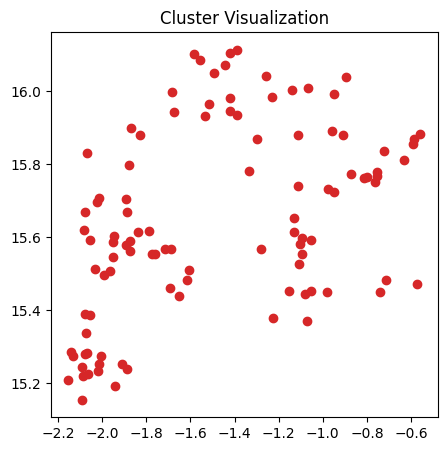

103
6318 " quantum"
10896 " amplitude"
13588 " violated"
19837 " integrate"
20034 "environment"
20307 " HM"
20656 "enezuel"
20765 " alleges"
20835 " violate"
21556 "Phil"
21935 " seizure"
21994 " Too"
22196 "Join"
22283 " Venezuel"
22330 "750"
22573 " encode"
22756 " shoe"
22927 " *,"
22996 " congressional"
23098 "AIN"
23152 "ograft"
23195 " Below"
23342 "aaaa"
23358 " бы"
23416 " neph"
23421 " js"
23428 " Fant"
23449 " Apart"
23480 " lien"
23503 " reimb"
23518 " 1947"
23525 "243"
23539 " biased"
23544 "RAY"
23564 " PER"
23580 "315"
23582 "othet"
23595 " registry"
23606 "ocratic"
23633 " courtesy"
23683 "inburgh"
23702 "poral"
23704 "HOU"
23729 " souls"
23734 " [****,"
23743 "}$\"
23752 " Race"
23761 " nasal"
23767 " bending"
23783 " mono"
23791 " %}"
23847 " Wu"
23870 " habeas"
23935 " adul"
23958 "ubot"
23969 " �"
23996 "utative"
23997 "vartheta"
24037 " Break"
24049 " incorporating"
24085 "thy"
24113 " 1953"
24123 "^("
24211 "Linear"
24246 " TD"
24254 " ]$"
24265 "ITS"
24301 "adv"
2

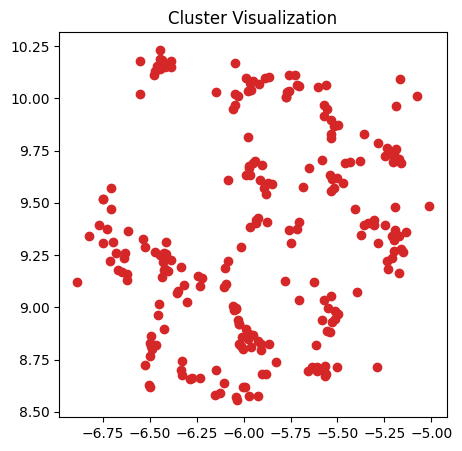

239
2761 " almost"
3257 " defendant"
25220 "IEW"
25476 "nem"
25855 "almost"
26368 "erving"
26843 " workforce"
27343 " painter"
27536 "orentz"
27814 "merge"
27912 "neutral"
27948 " categorized"
28206 "want"
28263 " ted"
28360 "FG"
28400 " glue"
28469 " Bot"
28722 " Decision"
28792 " Venice"
28793 " tf"
28909 " bush"
28915 "�"
28988 " nue"
28999 " immunosupp"
29003 "FIN"
29024 " Trek"
29026 " Alberta"
29052 "נ"
29064 "Score"
29086 " cocktail"
29093 " bullets"
29099 "Ren"
29135 " ἐ"
29155 "phis"
29160 "056"
29191 "agging"
29225 "MAKE"
29227 " usb"
29245 " lou"
29247 " motors"
29256 " Og"
29283 "pez"
29324 " temps"
29338 " outlook"
29345 "minster"
29359 "pherd"
29378 "imiento"
29380 " spacetime"
29381 " intric"
29388 " satellites"
29412 "372"
29421 " Raman"
29430 " Want"
29435 "458"
29439 " fd"
29441 "CLU"
29469 "unknown"
29481 "Tx"
29493 " nonprofit"
29494 " ERK"
29498 " predis"
29502 " sung"
29503 " 249"
29506 "manuel"
29511 " EST"
29516 " Iter"
29530 " plasmids"
29534 " adhere"
29555 " 

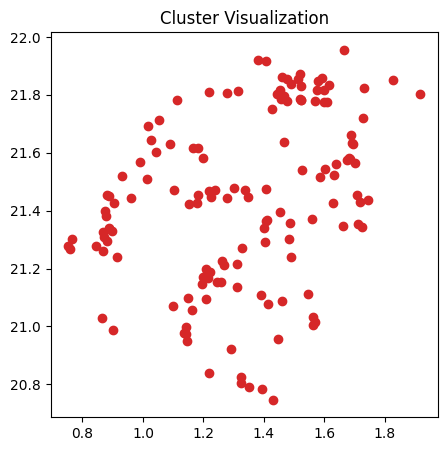

141
20643 "Mil"
20664 "161"
20687 " scientist"
20754 " Cold"
20881 "weak"
21048 " Dog"
21132 "ierra"
21188 " traditions"
21194 " cf"
21222 "anine"
21289 "phe"
21331 "acerb"
21334 " clerk"
21341 "chart"
21391 ""],"
21398 " Rain"
21444 " Brand"
21529 "kr"
21530 " animated"
21538 " Agent"
21542 "checked"
21545 " unlawful"
21548 " surviving"
21563 "Database"
21600 " misconduct"
21610 ":/"
21612 " certification"
21625 "umed"
21629 " newer"
21638 " Terry"
21650 " wie"
21659 "Assert"
21660 " mush"
21681 " owing"
21682 " forma"
21684 " assure"
21688 " Memory"
21690 " benign"
21706 " Hills"
21709 " Hep"
21714 "/)"
21717 "ortunate"
21720 "rak"
21729 " subscription"
21740 " Patri"
21744 " mammalian"
21751 "ublin"
21754 " purchases"
21757 " (+"
21759 " detectable"
21760 ">""
21769 "resa"
21776 "eyer"
21777 " SDS"
21779 " attraction"
21789 " Bah"
21800 "acry"
21808 "those"
21809 " Phoenix"
21812 " Notes"
21819 " viscosity"
21821 "plicate"
21830 "resources"
21838 "lemma"
21839 " conditioning"
21841 

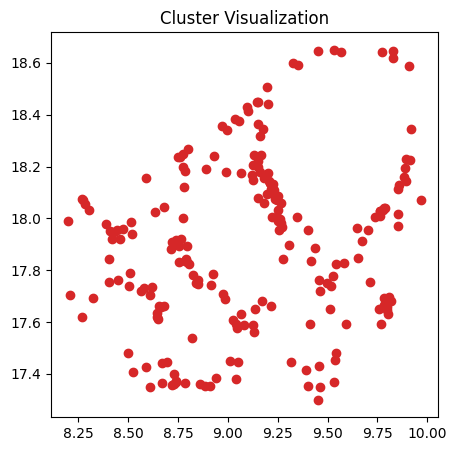

208
9110 " Yet"
9426 " Capt"
12608 "ghan"
13402 " 1981"
13563 " 1982"
14111 "cmd"
14160 "GFP"
15301 " indicator"
17042 "}$)"
17103 "1982"
17329 " envelope"
17346 " Bull"
17350 " regim"
17359 "ologous"
17363 " Eve"
17394 "tp"
17453 " Robinson"
17469 "isson"
17516 "ceptor"
17525 "sil"
17531 "け"
17532 " parte"
17533 "itic"
17540 "_;"
17544 "ля"
17557 "Mal"
17562 " colony"
17566 " malignant"
17572 " Capital"
17573 " Imm"
17576 "定"
17577 "Runtime"
17578 " GFP"
17579 " {""
17582 "NESS"
17583 "¹"
17601 " 164"
17616 "kh"
17618 " validated"
17624 "Short"
17628 " grip"
17629 "ograms"
17632 " prescription"
17634 " sanctions"
17635 "JSON"
17637 ")+\"
17640 "*:"
17647 " simplicity"
17648 "τη"
17649 " cotton"
17650 " Walter"
17651 " ritual"
17659 "NH"
17666 " GENER"
17669 " lui"
17675 " EDIT"
17680 " acceleration"
17688 "ambers"
17691 " preceding"
17694 "ラ"
17701 " trunc"
17708 "covery"
17717 " elong"
17718 " essence"
17721 " Vi"
17724 " Material"
17725 " aggrav"
17735 " landed"
17737 "©"
17740 "ENC

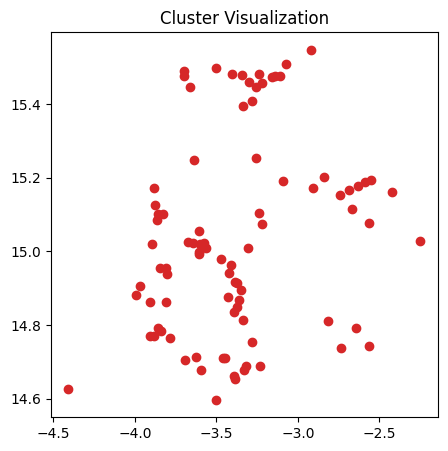

88
1824 " water"
4872 " linear"
21345 "226"
21866 "214"
22541 "ullivan"
22542 " GeV"
22673 " congression"
23102 "}},\"
23114 " visibility"
23751 "Audio"
23778 " motive"
23848 " treaty"
23849 " confirms"
23851 " ambiguous"
24025 " confirming"
24091 "angi"
24117 "287"
24133 "0009"
24138 " Reyn"
24300 "ussels"
24318 "oop"
24328 "listed"
24345 " [],"
24512 "umper"
24524 "ikk"
24525 "Lou"
24553 "你"
24567 "iliation"
24608 "TABLE"
24619 " Swift"
24624 " aesthetic"
24664 "icillin"
24684 " blown"
24689 " Autom"
24710 "expensive"
24715 " governmental"
24737 " cows"
24826 "acceptable"
24854 "406"
24897 " wholes"
24915 "'_{"
24973 " unve"
25001 " averaging"
25043 " как"
25048 " recognised"
25061 " terrain"
25067 "linewidth"
25156 "CTL"
25164 " Sixth"
25172 " confess"
25225 " Bright"
25303 " Burg"
25331 "umann"
25362 "ieg"
25395 "
 
 
 
 "
25471 " hydraulic"
25486 " \$"
25488 " indications"
25510 " раз"
25516 " �"
25543 " clinics"
25580 "Transaction"
25600 "Comm"
25621 " cocon"
25637 "boys"
25656 "

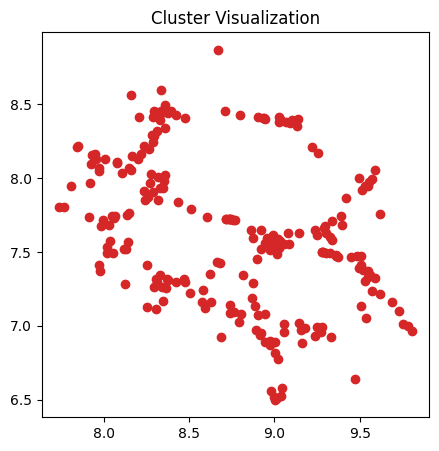

237
8710 " Medical"
10162 " mitochond"
10973 " magnet"
11040 "HL"
12773 " liberal"
13180 "�"
13761 " tolerance"
13857 " favorable"
13871 "strap"
15319 " Clark"
15487 " keyboard"
15642 "atar"
15836 " Change"
15871 " GP"
18336 "Court"
18693 " fatigue"
25826 "ucking"
30286 " therapist"
33882 " propensity"
34976 "eurs"
35507 "positions"
35664 " driveway"
36680 " terrestrial"
36762 "Owner"
37152 " tho"
37696 " Computing"
37795 " CKD"
37819 " greed"
37934 " pesticides"
38049 "960"
38089 " invaluable"
38293 "oclast"
38382 " Bris"
38402 "carbox"
38638 "ambiguation"
38744 " mediating"
38844 "rators"
38930 "KT"
39044 " fibroblast"
39170 "guyen"
39242 "ας"
39309 " pissed"
39675 " yacht"
39689 " Brotherhood"
39905 " reconsideration"
39910 "rein"
39918 "infra"
40071 " totality"
40077 "Checked"
40346 " Guatem"
40359 " 439"
40462 " promotions"
40569 " mailed"
40601 "universal"
40675 "Prec"
40831 "shown"
40862 " Correction"
40888 "ruvate"
40945 "Gender"
40950 "Rx"
40955 " expansions"
41120 " Esther"
4

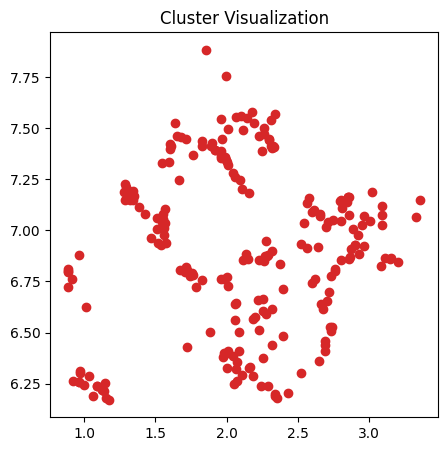

230
3568 "
   "
3990 " 
               "
10543 "%;"
11007 " Chris"
14056 "quer"
16183 "pend"
17742 "cents"
20803 " influential"
21372 "”)."
22276 " advise"
24438 "atomy"
24798 "WARN"
24822 " subspace"
26267 " ArrayList"
27442 " conjugate"
27567 " subtype"
27938 " remotely"
28401 " curse"
28603 "rosophila"
28735 "ptides"
28953 "803"
29424 "
                                  "
29683 "
   "
30159 " Fixed"
30273 " GRE"
31859 " Obs"
32491 " excerpt"
32498 "oulos"
32792 " extrav"
32817 " Lily"
33179 "flower"
33222 " mug"
33457 "iked"
33522 "yaml"
33965 "pending"
34287 "OPE"
34465 "}=("
34719 " reput"
34939 " mens"
35226 " Programme"
35515 "Energy"
36939 " hopping"
37166 "mere"
39229 "
                                            "
39931 " verge"
40940 " lattices"
41689 "
      "
41694 "tested"
42218 "beyond"
42387 "peptide"
42459 "fecture"
42701 " Wei"
42773 "UTC"
42804 ")^[@"
42839 " fran"
42916 "్"
42966 " rien"
43041 " AFL"
43053 "rss"
43095 " tentative"
43126 " fanc"
43127 " apprehen"
431

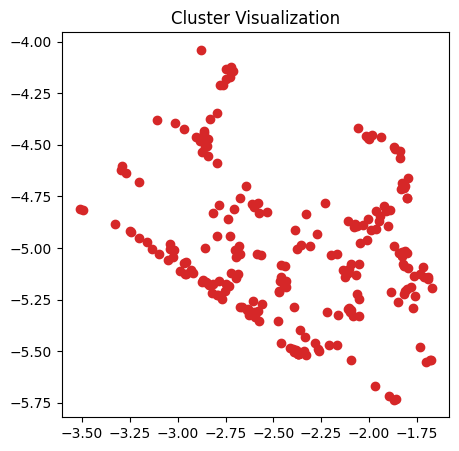

228
4038 " density"
4402 "operator"
4752 "cos"
4825 " Em"
4829 " nearly"
4889 " AND"
5033 "icit"
5037 " Don"
5068 " beginning"
5092 "can"
5094 " (**"
5108 " happen"
5117 "υ"
5118 " calculated"
5119 " David"
5154 "agon"
5169 "eria"
5181 " touch"
5200 "ls"
5209 "gar"
5254 " floor"
5256 "dot"
5265 "ipp"
5275 " nearest"
5284 " European"
5293 " none"
5300 " resources"
5302 "using"
5303 " sen"
5304 " visual"
5313 " piece"
5323 " laws"
5330 "Exception"
5333 " shift"
5335 "raint"
5343 " female"
5345 " 37"
5354 "ensions"
5355 "*("
5356 "ingly"
5358 "ensure"
5363 "ship"
5366 " bab"
5377 "FA"
5379 "stitution"
5382 " item"
5387 " dut"
5390 " substr"
5391 "ini"
5395 "rices"
5401 "arth"
5404 "lict"
5405 " Law"
5406 " picture"
5422 "ensional"
5423 "input"
5432 "itz"
5436 "apping"
5437 "ê"
5439 " raised"
5443 "State"
5454 " trade"
5461 " therm"
5464 "ette"
5466 " Sec"
5469 " discussed"
5484 " drink"
5498 "Don"
5499 " mill"
5513 " explain"
5520 " improved"
5531 " Oh"
5532 " click"
5534 " wood"
5535 " u

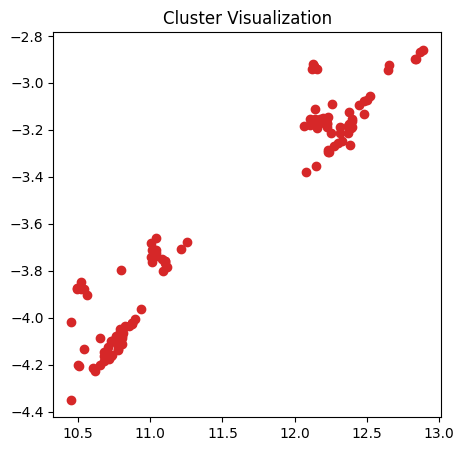

115
6008 " eat"
7422 " Russia"
7544 " 1999"
7814 " Saturday"
8033 " Islam"
8183 " employee"
8253 " float"
8891 " crisis"
8927 " originally"
8967 " differential"
9179 "Result"
9191 " curves"
9239 " hate"
9268 " east"
9276 " IC"
9334 "GT"
9424 " Name"
9447 " moral"
9506 " moments"
9537 " Corp"
9575 " songs"
9577 " answered"
9595 "1999"
9598 "estion"
9599 "float"
9600 " guidelines"
9617 " directory"
9677 "Override"
9686 ""]"
9694 " treatments"
9701 " adjacent"
9719 " imper"
9731 " cere"
9743 " 62"
9747 "ende"
9750 "fin"
9761 "aph"
9765 " alpha"
9774 " oscill"
9785 "IES"
9788 " sig"
9794 "---------"
9803 "LD"
9826 " ordinary"
9828 " plenty"
9851 " heads"
9866 "nn"
9873 "Cor"
9878 "river"
9882 " browser"
9883 " Spanish"
9910 " houses"
9911 "utory"
9929 " $-"
9936 " consequence"
9937 " Despite"
9947 " SM"
9951 " ä"
9963 " 67"
9971 " rounded"
9997 " Sar"
10028 " alert"
10030 " Key"
10034 "hus"
10046 " stronger"
10050 "chain"
10075 "prot"
10090 " laid"
10137 " Ms"
10163 " bon"
10172 "BB"
10209

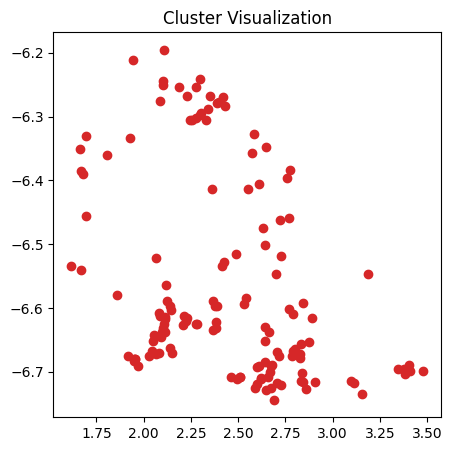

144
1918 " give"
3534 " gave"
4245 " gives"
4933 " giving"
5199 " procedure"
6039 " Cam"
6189 "Trans"
6413 " Supreme"
6609 "orders"
6682 "api"
6686 "な"
6764 "FR"
6785 "imb"
6794 " Friday"
6841 "än"
6972 "mo"
7056 "�"
7072 "γ"
7081 " possess"
7112 "ido"
7135 "select"
7142 "CI"
7148 " explan"
7169 " granted"
7186 "gression"
7197 " worse"
7217 " violence"
7222 " pas"
7228 "uls"
7229 "xml"
7232 "kins"
7248 " regulation"
7259 " procedures"
7262 "oret"
7274 " approaches"
7285 " opposite"
7297 "�"
7300 "anta"
7323 " cort"
7352 "uy"
7355 " recovery"
7359 " Ann"
7371 "Which"
7373 "mi"
7379 " UN"
7389 "estic"
7390 "bour"
7394 " gate"
7402 " ended"
7408 " trip"
7430 "rypt"
7441 " determination"
7444 "**]{}"
7457 " nine"
7460 " qui"
7461 "then"
7462 " grav"
7464 " Windows"
7467 " duration"
7483 "only"
7490 "ω"
7499 " FR"
7507 "comple"
7512 " photo"
7514 " concerned"
7519 "CK"
7526 "anning"
7538 "GE"
7543 " 47"
7550 " cris"
7557 "Line"
7561 " widely"
7567 " Ref"
7570 "INE"
7571 " jurisdiction"
7583

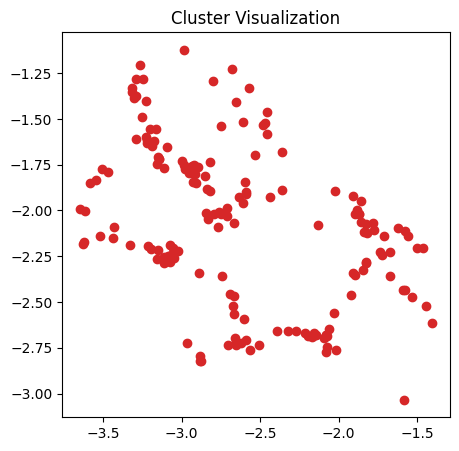

169
2053 " These"
2380 " response"
2724 " behav"
2838 "Val"
2918 " held"
2990 " network"
3085 " film"
3130 " Pol"
3294 " compar"
3386 " features"
3586 " Pe"
3594 "Gr"
3900 " While"
3901 "inated"
3908 " statement"
3959 " offer"
3961 " band"
3988 " security"
4068 "ibrary"
4148 "97"
4165 " Ser"
4170 "aily"
4175 "mar"
4205 " mount"
4275 " central"
4353 "void"
4392 " TH"
4411 "aur"
4427 "rate"
4439 " released"
4441 " located"
4451 " unique"
4512 " slight"
4521 "othes"
4522 " tim"
4537 "user"
4542 "asm"
4581 " closed"
4597 " Det"
4604 "Fr"
4606 " reasons"
4622 "*]{}"
4626 "anged"
4628 "urance"
4676 " parties"
4678 "Be"
4684 " connect"
4701 "ruary"
4706 " sec"
4735 " feature"
4747 " challeng"
4758 " setting"
4760 " player"
4774 "force"
4793 "base"
4796 " reduce"
4806 " sto"
4812 " internal"
4830 " onto"
4848 " rob"
4867 " Tw"
4870 " processes"
4887 " reflect"
4921 "omas"
4960 "iform"
4970 " scient"
4972 " vector"
4980 " modern"
5007 " send"
5017 " stuff"
5020 " majority"
5030 " pow"
5043 " pl

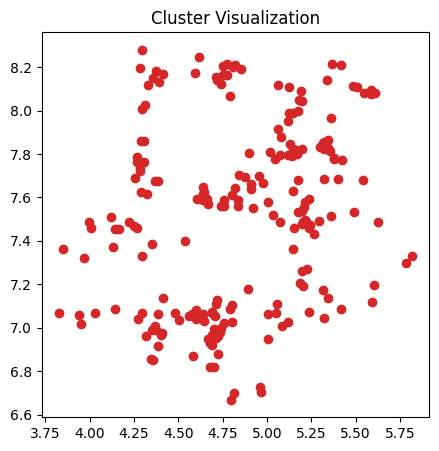

211
5370 " panel"
12087 " geometry"
16730 " ceremony"
17722 "bourne"
19434 "ensen"
28522 " neo"
31373 " Whole"
34208 " cans"
35156 " biomedical"
35819 " CONTRIBUT"
36580 " Angels"
36621 " gifted"
36679 "596"
37519 " Particip"
38668 " entitlement"
38737 " smashed"
38878 "tell"
38909 " DOC"
38942 " Savage"
39552 "ipro"
41168 " noodles"
41424 " DAT"
41624 " Luckily"
41917 " Ord"
41955 "~="
42162 " associative"
42286 " modem"
42330 " tracer"
42409 " Senators"
42453 "mails"
42484 " eagle"
42561 " radiographic"
42590 " grids"
42598 "ijan"
42681 "cipher"
42720 "ник"
42766 " nursery"
42842 " indoors"
42869 " herpes"
42888 "icas"
42901 "уп"
42980 "535"
42993 "Critical"
42998 " 483"
43025 " uneasy"
43084 " тр"
43091 "Views"
43162 " discourage"
43191 "opot"
43212 " untimely"
43226 "−/−"
43290 " Packers"
43297 " presidente"
43333 " 535"
43392 " pawn"
43421 "Sportspeople"
43493 "Flu"
43502 " inventors"
43508 ",)"
43532 "ред"
43558 "^*,"
43569 " tunes"
43572 "inkles"
43589 " 1892"
43611 " Spread"
43

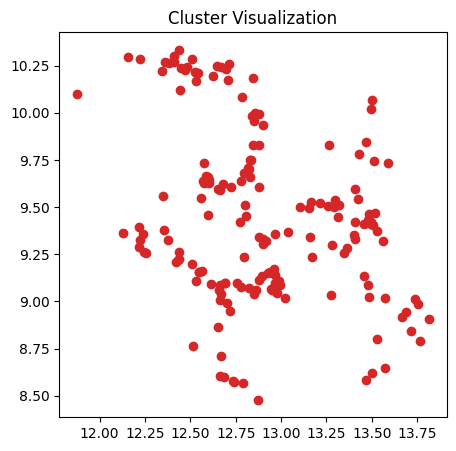

174
767 " two"
1142 " many"
1264 " three"
2358 "68"
5761 " Two"
6610 " Finally"
6676 " Many"
8565 " Land"
9064 " Three"
9178 " 1980"
9422 " Ant"
9552 " sizes"
9673 "een"
9858 " Card"
9934 " 68"
10241 "{-"
11018 "conduct"
11308 " Greek"
11831 "Three"
11877 " Saint"
11897 " compute"
12081 "wall"
12481 "Total"
12520 "![]("
12964 "fc"
13470 " Place"
13476 " lucky"
13524 "three"
13561 "Que"
13614 "Ca"
13735 " orange"
13841 " stake"
13903 "ango"
13965 " alarm"
14012 " Ark"
14073 " db"
14244 " ***"
14366 " ot"
14378 "�"
14398 "uler"
14565 " hired"
14575 "sembl"
14585 "س"
14612 "rowth"
14634 "wich"
14780 "ONG"
14802 " determines"
14810 " annoy"
14819 "Py"
14849 "cursor"
14980 " AI"
15125 "emon"
15160 "every"
15184 " Lag"
15186 " Neg"
15187 "Div"
15262 " tomat"
15269 " sphere"
15273 " Kevin"
15343 "Bel"
15395 " astr"
15442 " hex"
15447 " flesh"
15635 "oscow"
15645 "450"
15651 "FFFF"
15660 " caf"
15687 " announcement"
15707 " ]{}"
15747 " sich"
15811 "erge"
15858 " Kh"
15887 " Philip"
15902 " ν"

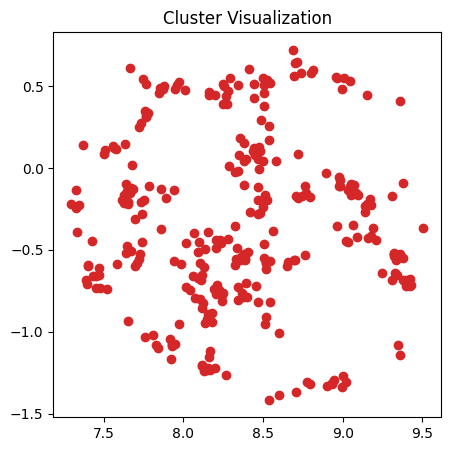

301
2152 "ser"
6581 " virus"
9111 "bu"
9142 " ultimately"
9260 " intelligence"
9531 "                             "
9533 " Ari"
10503 " Catholic"
10527 " theoretical"
10920 " fluct"
11938 "aki"
12755 "�"
13407 " systemic"
13657 " transformed"
13734 "aque"
13784 "closed"
13873 "                                      "
14406 "igue"
14652 "peror"
14724 "omers"
15769 "etermined"
15835 "ictional"
16041 " comply"
16047 "mov"
16900 "iolet"
16938 " moder"
17240 "
                                       "
18272 "ahn"
21336 "                                                   "
21430 " GE"
23528 " Dakota"
27897 " Tit"
32916 "covered"
36732 "                                                                  "
38626 " Characteristics"
38632 "ubicin"
43517 " peered"
43560 " preaching"
43620 " fiery"
44478 " bankers"
44565 "arshall"
44861 " fined"
44904 " Depend"
45010 " Crom"
45039 " pans"
45052 " invas"
45269 " ectopic"
45353 "England"
45526 " Bulls"
45704 " BEL"
45798 " restricts"
46211 "Verlag"
4646

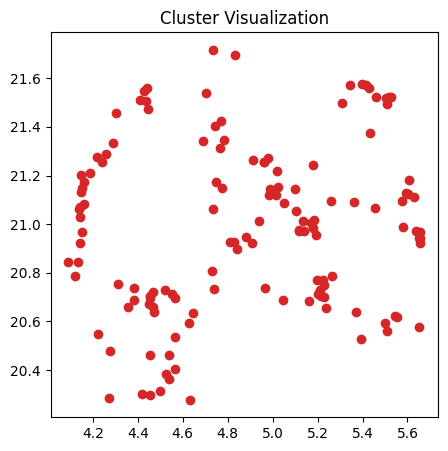

137
13689 "Wait"
18152 " و"
18344 " recipient"
18378 "Len"
18928 " disadvantage"
19197 " accessed"
19241 " queries"
19272 " rental"
19304 "hydroxy"
19309 " pause"
19373 " oriented"
19571 " Ry"
19587 " apert"
19692 "henyl"
19740 " Zn"
19741 "amino"
19785 "urgical"
19831 " symptom"
19852 "neath"
19877 "Icon"
19890 " analogous"
19903 "incial"
19916 " praise"
19921 "RC"
19925 " paused"
19956 " 225"
19995 " Murray"
20011 ".*,"
20016 " steal"
20030 "cticut"
20032 " uncomfortable"
20037 " Brew"
20040 " Agric"
20043 "verter"
20092 " escal"
20115 " Tru"
20143 " actin"
20157 " algebraic"
20179 "cknowled"
20186 " Village"
20191 "ussi"
20192 " pathogen"
20200 " dots"
20204 " specimen"
20209 " unh"
20226 "Member"
20227 "fan"
20230 " musicians"
20234 "rowned"
20235 " JS"
20269 " hunt"
20271 " siRNA"
20292 " adolescents"
20295 " cute"
20297 " satisfactory"
20298 "327"
20304 "jav"
20335 "¨"
20364 " Status"
20372 " unsafe"
20373 "386"
20383 " PARTICULAR"
20388 "oscopy"
20400 " Seven"
20407 " comparativ

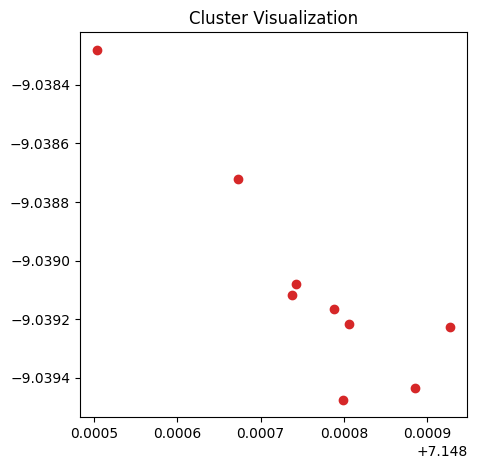

9
1366 "$,"
3303 "}$,"
4244 ")$,"
12460 "}}$,"
19446 "})$,"
29119 ")}$,"
35799 "}}}$,"
44418 "))$,"
45251 "}})$,"


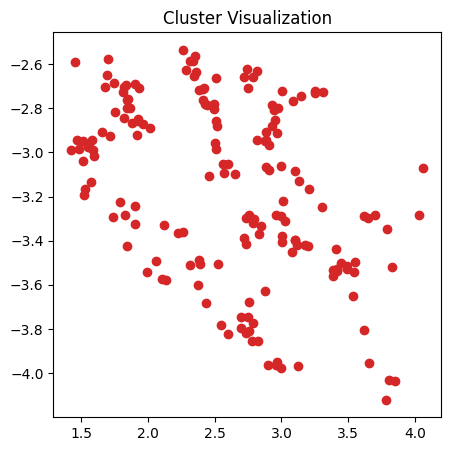

172
3156 "41"
5028 " domain"
5220 " Also"
5746 "arant"
5777 " slightly"
5783 " confirmed"
5812 " NULL"
5870 " families"
5936 " suggests"
5997 " causes"
6061 " Over"
6079 " dry"
6130 "greg"
6143 "apers"
6243 "appe"
6306 " standing"
6351 " gain"
6379 " decrease"
6383 " customers"
6387 " possibility"
6431 " exchange"
6453 "RS"
6465 "uries"
6527 "IO"
6548 " returns"
6571 " mostly"
6648 "Map"
6668 "iliar"
6694 " Vir"
6706 " af"
6711 "ocy"
6718 " voltage"
6720 "abilities"
6768 "dots"
6771 "amine"
6820 "dependent"
6829 "�"
6847 " tox"
6861 " amb"
6881 "jud"
6887 " positions"
6910 "Node"
6924 "standing"
6925 " pert"
6939 " Mil"
6989 "User"
6997 " acknow"
7007 " integer"
7044 " sac"
7045 " transcript"
7052 " strongly"
7099 " Hen"
7107 " quiet"
7116 "itable"
7134 " discrim"
7136 "ό"
7162 " confidence"
7177 " documents"
7182 ")=\"
7190 "cial"
7223 " pages"
7225 " Book"
7240 "adow"
7247 " Russian"
7283 "GA"
7306 " Cr"
7309 " CI"
7396 "ORT"
7414 "MD"
7418 " numerous"
7419 " apart"
7491 " boot"
7516

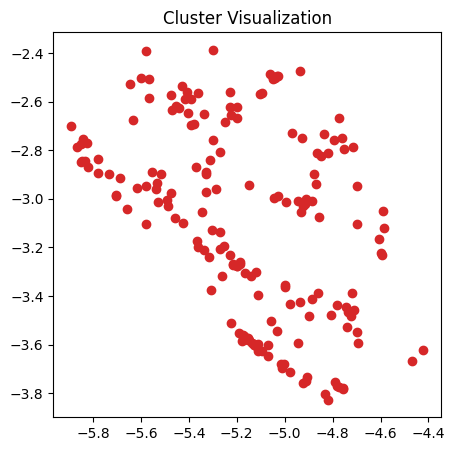

181
3577 "|\"
3626 " natural"
3670 " immedi"
3696 "kn"
3700 " transfer"
3753 " nature"
3782 " particularly"
3831 " contain"
3862 " broad"
3889 " van"
3918 " President"
3980 "Or"
3991 " appropri"
3993 "atives"
3999 "deed"
4017 " protect"
4031 " Id"
4082 " Cir"
4107 " fre"
4120 "Mod"
4153 "Omega"
4155 " System"
4162 " April"
4177 " star"
4180 " profess"
4185 "98"
4192 " capac"
4197 " produced"
4213 "lo"
4214 " General"
4237 "EX"
4253 "){#"
4259 "epsilon"
4260 " mid"
4261 "iring"
4270 " built"
4274 " deb"
4279 " secret"
4280 "CA"
4283 " leading"
4286 "abase"
4288 " travel"
4293 " imm"
4309 " derivative"
4319 "argin"
4325 " From"
4338 "ube"
4339 "CE"
4355 "ida"
4358 " las"
4363 "wide"
4364 "iency"
4368 "ocol"
4384 " web"
4389 " saf"
4391 " changed"
4403 "plit"
4407 " в"
4413 " companies"
4415 "elle"
4416 " Feb"
4421 "cap"
4428 " contains"
4431 "itions"
4436 " sche"
4442 "oding"
4447 " formed"
4452 "ifically"
4453 " looks"
4454 " names"
4458 " Int"
4460 " novel"
4463 "cil"
4465 " extra"
447

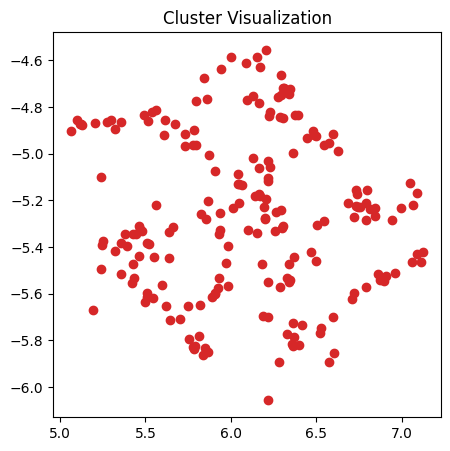

200
4267 " 2010"
5705 " subjects"
5806 " filter"
6423 " director"
6427 " attract"
6949 " investigated"
7330 "2011"
7370 " analog"
7409 " investigate"
7517 " mission"
7659 " Dec"
7714 " manuscript"
7718 "cdots"
7764 " Please"
7785 " Paris"
7820 " Instead"
7893 "mid"
7900 " Where"
7949 " Sil"
7973 "build"
7987 " prolif"
8061 "Thanks"
8071 " react"
8082 "�"
8104 " attacks"
8182 " Li"
8188 " radi"
8190 "contin"
8261 " okay"
8275 "equiv"
8281 " river"
8287 "ulating"
8290 " boys"
8301 "SON"
8307 " hundreds"
8343 "uum"
8359 " Mel"
8362 " funding"
8379 " successfully"
8385 " assistance"
8411 " violation"
8424 " stem"
8448 "rible"
8449 " von"
8459 " margin"
8460 " reform"
8485 " vast"
8486 "Det"
8490 " File"
8502 " Du"
8540 " damages"
8543 "ductor"
8544 " army"
8564 " imagine"
8586 "oder"
8587 "�"
8595 " Java"
8596 " aid"
8601 "rot"
8607 " researchers"
8619 "rif"
8625 "vol"
8628 " Atl"
8635 "aft"
8638 " inhibition"
8642 " closest"
8654 " optimal"
8655 " enhanced"
8662 "Char"
8667 " monitoring"


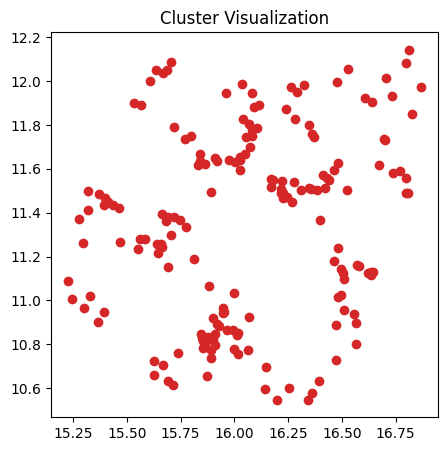

179
397 "--------"
8223 " segment"
8380 "Come"
8656 "high"
9058 " trend"
9279 " fruit"
9687 "Conne"
9914 "HR"
9962 "----------"
10077 "ем"
10221 "employ"
10224 " fails"
10245 "orse"
10292 "Min"
10319 " evil"
10343 " decline"
10366 " xml"
10377 " symmetry"
10421 " Date"
10538 " posit"
10559 " Ox"
10732 " notion"
10827 " reserved"
10849 "untime"
10861 " skill"
10898 " universal"
10919 " renal"
10968 " Sov"
11055 " Conne"
11062 " injured"
11105 "azz"
11170 "vy"
11181 "mediated"
11207 "angers"
11330 " produces"
11575 " viewed"
11729 "rying"
11963 " GNU"
12077 " automatic"
12638 "archy"
12701 " shopping"
12855 "vir"
13044 " thrown"
13135 " Access"
13242 " BL"
13282 " suspected"
13288 " segments"
13318 " physically"
13477 " confused"
13542 " manually"
13554 " trends"
13621 "ب"
13640 " participated"
13729 " Gre"
13738 " gre"
13770 " breach"
13855 " Saf"
13862 " darkness"
13962 " bom"
13978 " electricity"
14031 " cortex"
14049 " secured"
14050 "icked"
14072 " golden"
14100 " NF"
14135 "TL"
142

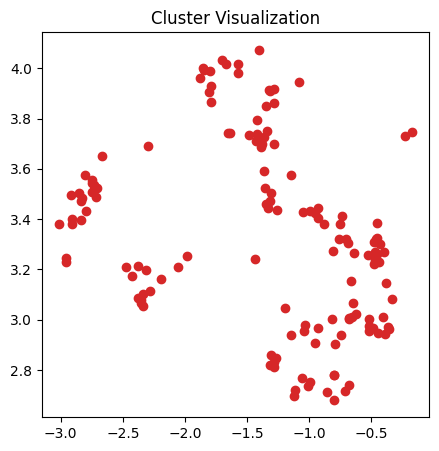

142
7 "&"
33 "@"
119 "�"
224 "�"
234 "�"
473 " O"
656 "ys"
726 " sy"
783 "the"
810 " reg"
835 " where"
860 "é"
875 " between"
892 " fl"
894 " cell"
916 "cept"
970 " using"
983 "ms"
990 " end"
1026 "sc"
1053 " don"
1065 "put"
1070 "led"
1074 "ife"
1143 "aint"
1173 "ev"
1179 "cal"
1181 "]{}"
1194 "AT"
1207 "е"
1208 "val"
1230 "ually"
1234 " rep"
1256 "ression"
1269 " x"
1277 "AR"
1278 "alk"
1286 "self"
1288 "br"
1289 " gl"
1295 "alth"
1297 "ision"
1334 "ider"
1361 " help"
1394 "You"
1410 "ES"
1415 " signific"
1422 " You"
1429 " child"
1435 "idence"
1450 "::"
1460 " pur"
1517 " bre"
1533 " world"
1558 " contin"
1589 "ration"
1640 "н"
1662 "arg"
1670 " ve"
1672 "Ex"
1687 "cript"
1752 "abl"
1783 " analysis"
1794 " bi"
1799 " applic"
1817 "ird"
1856 "hib"
1864 "IC"
2009 "bar"
2038 "ready"
2102 " Ind"
2153 "oney"
2166 "itted"
2169 " higher"
2171 " diff"
2232 " ele"
2370 "ories"
2503 "mp"
2575 "aced"
2631 "roid"
2683 "irm"
2688 "artment"
2734 " clos"
2772 "cular"
2836 " dig"
3069 "±"
3433 "sl"

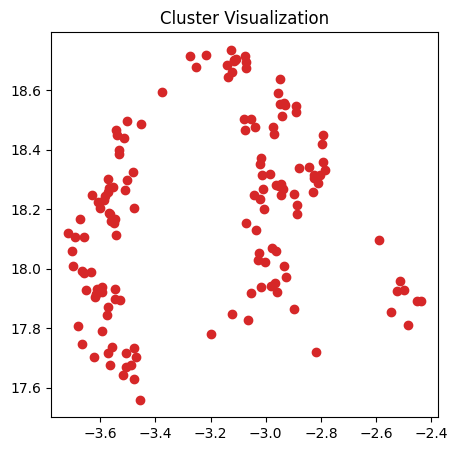

146
23365 " geographic"
23975 " undis"
24011 " blessed"
24088 " eg"
24095 "Hol"
24148 " Industrial"
24204 "gre"
24224 "embed"
24241 " peut"
24247 "erring"
24272 " clay"
24296 " javax"
24308 "新"
24350 " Effects"
24362 " merger"
24376 " travels"
24390 " margins"
24398 " weighed"
24412 "同"
24448 "^{(\"
24453 "enes"
24454 "359"
24455 " jazz"
24456 " Friends"
24478 " tours"
24484 " depths"
24489 "hall"
24495 " Forces"
24500 " cott"
24505 " cares"
24515 " Peak"
24516 " sweep"
24523 " Dublin"
24526 "Daniel"
24540 " appreciation"
24545 "�"
24555 " supreme"
24560 "oks"
24570 "esium"
24573 "America"
24581 "080"
24593 " fathers"
24595 "obl"
24597 " crowds"
24612 " whatsoever"
24613 "azer"
24635 " inducing"
24647 "rainian"
24653 "borough"
24658 "bio"
24676 "weighted"
24701 " stern"
24703 " Forum"
24707 " Bobby"
24713 ")–"
24725 " Surv"
24726 "ountain"
24728 "+,"
24729 "atts"
24731 "Land"
24732 " bean"
24736 "iker"
24746 " easiest"
24748 "IPS"
24755 "onial"
24756 " Hob"
24757 "Hot"
24762 " symbolic

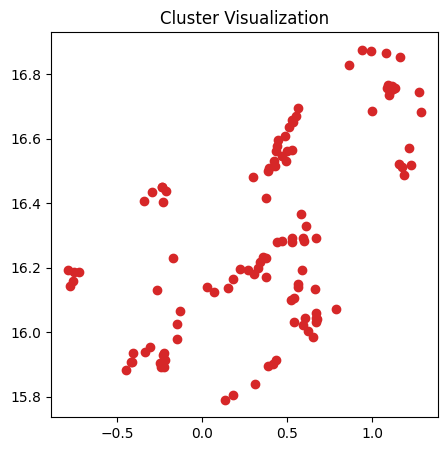

110
2255 " women"
8813 " explanation"
9362 " Die"
10168 " Women"
14146 "Discussion"
15142 " pursue"
19117 "Byte"
19648 "perial"
20218 " stranger"
20318 "GBT"
21093 "City"
21359 "OUP"
21474 " imperial"
21832 " Trail"
22069 "plitudes"
22131 "arettes"
22182 " curric"
22347 " Mix"
22361 " Higgs"
22460 " Typically"
22501 "+-"
22513 " backs"
22538 " Medicare"
22543 "344"
22548 " intercept"
22557 " 1948"
22586 " workshop"
22611 " charm"
22628 "ardon"
22652 " amplitudes"
22662 " Marc"
22715 " 1941"
22737 "Women"
22757 " Guy"
22777 " tourist"
22822 " missile"
22841 " distortion"
22859 "erral"
22863 "377"
22874 " lav"
22902 "################################"
22903 "Die"
22907 " cease"
22915 " earning"
22922 "localhost"
22949 "CHECK"
22974 "\!\"
22988 " incap"
23002 "+{\"
23030 "Mer"
23031 " dwell"
23032 " Imperial"
23033 " instrumental"
23040 " obstruct"
23057 " ego"
23092 "Plan"
23120 " hello"
23122 " incurred"
23132 " Political"
23173 "logger"
23182 "bird"
23194 " Coal"
23196 "ylene"
23204 " д

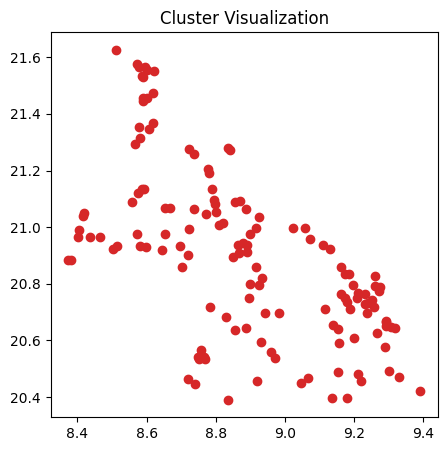

139
11474 " Though"
17983 "ULAR"
18339 " (_"
18460 " SK"
18522 " socio"
18524 "alla"
18530 "FTWARE"
18559 " Jos"
18569 "pf"
18571 " arterial"
18578 " convince"
18581 "Sem"
18582 "HP"
18584 "оль"
18596 "Leg"
18603 " Double"
18615 "hind"
18620 "iae"
18624 " Bos"
18627 " outlined"
18636 "^*$"
18639 "rowing"
18646 "grounds"
18655 " appearances"
18660 " dozens"
18661 " beans"
18662 " plaus"
18671 " Marine"
18673 " Bruce"
18678 "出"
18682 " Lawrence"
18686 "Home"
18688 "BLE"
18695 " onc"
18704 " saline"
18705 " predominantly"
18708 " Islands"
18713 "��"
18714 " exceptional"
18719 " metallic"
18721 "ancel"
18725 " unlaw"
18726 " agrees"
18730 " Ward"
18732 " Castle"
18734 " tok"
18744 "Michael"
18748 " filtered"
18751 "�"
18763 " TOD"
18765 "Though"
18767 " venue"
18769 "IZ"
18771 " Loc"
18772 "]="
18776 " dissent"
18778 "ик"
18781 " ♪""
18782 "onda"
18794 " kingdom"
18796 " uncle"
18798 " stip"
18801 " possessed"
18805 " Mobile"
18808 "Kind"
18812 "Men"
18813 " recre"
18815 "ortex"
18816 " Hi

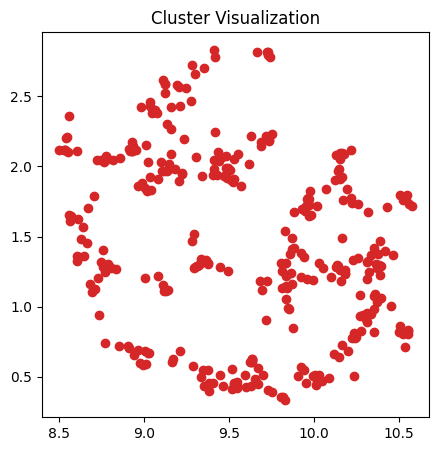

347
6245 "ameter"
7421 "                                                                                                                                                                                                                                                                "
7602 " velocity"
7643 "                         "
8969 " Tim"
10921 " reward"
12872 " complexes"
13456 "sky"
13475 "                                       "
13954 "ximate"
14243 "
                    "
15044 "square"
15831 "rection"
16637 "pletion"
16729 " Emer"
16774 " empirical"
17091 "

         "
18090 " chemistry"
19580 " Ric"
19738 "

                   "
23713 "nh"
24466 " Marvel"
30214 " finishes"
33093 " prohibits"
36778 "进"
40112 "Sweet"
40597 "esteem"
41536 " goog"
42095 "Zip"
42159 " adhered"
42877 "suite"
43829 " normative"
43843 " 1896"
43859 " Sheets"
43987 " prohibiting"
44069 " dun"
44081 "antage"
44213 " shack"
44290 "引"
44363 " Wings"
44375 " Ek"
44401 " sequest"
44421 " laps"
44512 "GGT"
4

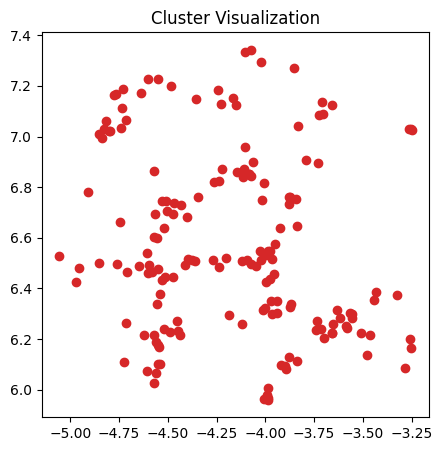

167
5932 "}}{"
8505 " apparently"
22860 "scroll"
23240 " arrange"
24828 "olutely"
25221 "ydrate"
25887 "xxx"
25998 " Apparently"
26232 "aris"
26615 " Alpha"
26776 "ifferences"
26918 " carp"
27208 "FX"
27405 " lion"
27411 " Athens"
27503 "Chris"
27522 " Frances"
27540 " Montana"
27541 " bizarre"
27593 " assists"
27774 " marital"
27782 "}}}{"
27900 " Ster"
27979 "WF"
27993 " Fame"
28075 " ionization"
28147 "aturally"
28173 " honored"
28237 " nause"
28238 " Spot"
28284 " shareholders"
28329 " publishers"
28351 " Former"
28422 " cyan"
28429 " Intr"
28506 "orphism"
28537 " anytime"
28546 " 911"
28716 "ccc"
28818 " Groups"
28846 " POST"
28902 "vac"
28925 "borg"
28929 " HBV"
28956 "species"
28991 " Gregory"
29007 " NPs"
29020 "ASP"
29051 " Quinn"
29070 " organised"
29072 " parsing"
29085 " Column"
29088 " Algorithm"
29097 "pressure"
29107 " estimator"
29154 " trump"
29161 " Stalin"
29179 "rbrack"
29194 "ishops"
29201 " tau"
29205 " clips"
29213 "adores"
29246 " bang"
29269 " conformal"
29282 

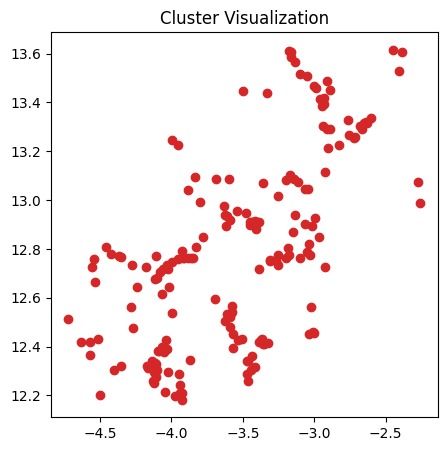

182
3883 " judgment"
20519 "Hg"
22272 " Hash"
24058 "argument"
24216 " Font"
24650 "NEW"
24889 "invest"
24985 "レ"
24992 " Judgment"
25054 "Israel"
25079 "WIN"
25132 " sore"
25139 "378"
25721 " quar"
25749 " sandwich"
25851 "4000"
26027 " delle"
26089 " Nixon"
26382 " hippocampus"
26412 " pleading"
26453 " Bib"
26792 " Mak"
26951 " supernatant"
27121 "States"
27373 " Oakland"
27426 " Abstract"
27498 " Schools"
27765 " controllers"
28050 "Upon"
28461 " accountable"
28592 " µm"
28998 " tenant"
29219 " Kids"
29352 " AU"
29513 " Hg"
29535 " Austrian"
29887 "Had"
29891 " Screen"
30010 "Mn"
30092 " 257"
30179 " singularity"
30242 " hemoglobin"
30348 " hippocampal"
30370 " interpolation"
30416 " Sta"
30641 "Por"
30687 " kans"
30709 " diarrhea"
30731 "Emb"
30814 " slaughter"
30824 " hydroxy"
30832 "hetics"
30889 "410"
30896 "orel"
30910 "487"
30919 ")|\"
30927 "lining"
30931 " Gn"
30942 " gust"
30983 " contested"
30990 " accountability"
30995 "constraint"
31006 "heses"
31019 "Techn"
31036 "650"

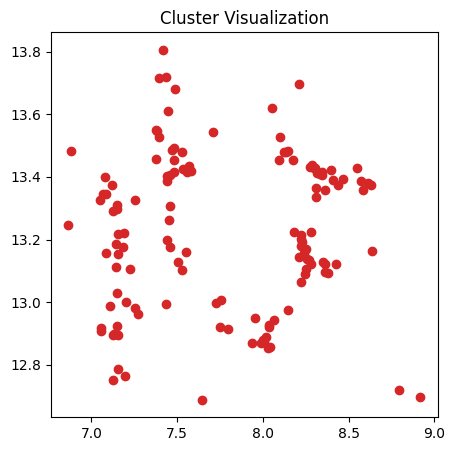

131
7160 " Their"
8415 " solve"
11826 " Ho"
12250 "req"
14042 " solved"
14540 " Immun"
14548 ")_{"
14717 " decomposition"
14820 " Plus"
14875 " imprison"
14914 " USB"
15026 " amend"
15109 " satellite"
15159 " disappeared"
15311 "rieve"
15372 " Employ"
15497 "137"
15529 " disappear"
15763 " Gene"
15779 " tod"
15837 " Photo"
15843 "CHAR"
15854 "eno"
15865 " adventure"
15889 " Amb"
15914 " Vo"
15948 " Arthur"
15953 "Sorry"
15961 "Dan"
15976 "appropriate"
15977 " Theory"
15998 " antioxid"
16132 " Digital"
16138 " dental"
16173 " clouds"
16178 " influences"
16206 "...,"
16250 "FAULT"
16276 " constru"
16282 "Session"
16303 " stairs"
16306 "temp"
16333 " Netherlands"
16359 " settle"
16378 "leading"
16437 "clean"
16445 "'],"
16451 "mers"
16470 " grabbed"
16476 "avage"
16521 "chell"
16539 "ICK"
16553 " Jason"
16567 " iOS"
16582 "SK"
16598 " Kennedy"
16693 " ş"
16715 "othy"
16718 "ndef"
16746 "({{\"
16756 " extracts"
16780 " jumped"
16792 "Willi"
16814 "brack"
16828 "ру"
16878 "aml"
16889 " junc

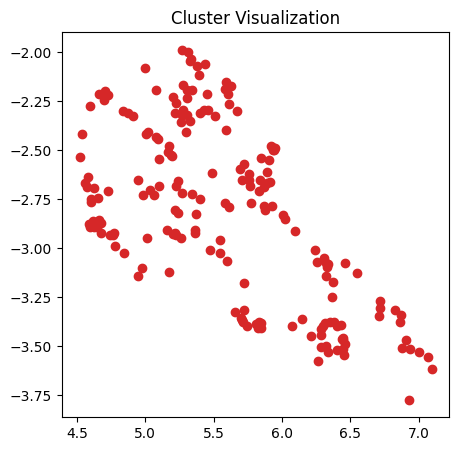

189
996 "
	"
1580 " since"
1581 " allow"
2675 " social"
2953 " address"
3692 " whose"
4129 " Although"
4235 " Sw"
4321 " earlier"
4481 " phone"
4495 " meaning"
4868 " score"
5145 " machine"
5438 " selection"
5931 " chain"
6076 " cele"
6280 " �"
6322 " transmission"
6762 " Calculate"
6814 " measurement"
6913 " nod"
7064 "dt"
7152 "doc"
7286 " appearance"
7509 "product"
7578 " consent"
7731 " customer"
7779 "water"
7859 " testified"
7882 " stability"
7912 "Bar"
8067 " fabric"
8163 "oked"
8220 "??"
8234 "inite"
8238 " cities"
8265 "neg"
8334 " sick"
8409 " offset"
8481 " Grand"
8492 " bias"
8508 " compound"
8563 " depos"
8592 "erman"
8694 " Prote"
8736 "wered"
8817 "endants"
8841 "�"
8866 " metast"
8867 "oddsidemargin"
8911 " Jersey"
8928 " cultural"
9045 "anna"
9086 " rapidly"
9105 "nger"
9136 " powers"
9181 "umes"
9300 " updated"
9309 " Georg"
9323 "Cons"
9349 "method"
9377 " broke"
9390 "én"
9394 " Ama"
9419 " prohib"
9438 "server"
9441 " infer"
9444 " nurs"
9450 "loc"
9452 " manip"
94

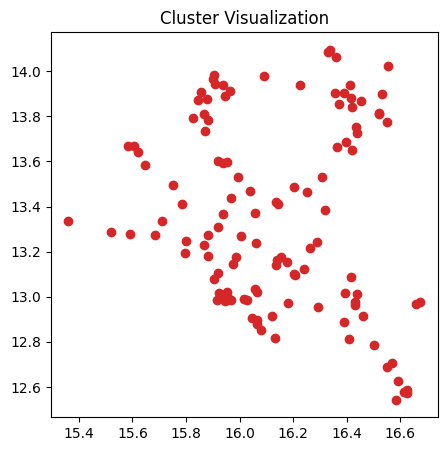

118
7580 "Ent"
8464 " Est"
8719 "gener"
9996 " transaction"
10116 " HD"
10226 " 1991"
10237 " robust"
10463 " exit"
10532 " revolution"
10536 "HD"
10720 " fifth"
10726 " entity"
10735 "ificate"
10808 " induce"
10934 " routine"
11039 "ら"
11096 " restricted"
11108 "osity"
11193 " approximation"
11210 " hasn"
11317 "uri"
11354 " Management"
11375 "holder"
11403 " sees"
11458 "─"
11636 " bowl"
11683 " Application"
11802 "oped"
11913 "ILITY"
11957 " Ros"
11984 "complete"
12043 "agan"
12255 " checks"
12305 "keys"
12412 "High"
12553 " ultimate"
12806 " layout"
12830 " hits"
12883 " muse"
13084 " convicted"
13370 " muscles"
13575 " SS"
13587 "READ"
13629 " Grant"
13638 "itage"
13740 " Sem"
13826 "GFR"
13863 "children"
13958 " Empire"
13980 "security"
14027 " Bor"
14105 "quarters"
14126 " fatty"
14128 " corn"
14151 "dated"
14180 " Gree"
14192 " poverty"
14208 " rs"
14221 " flows"
14257 " virtually"
14266 " sie"
14283 "idity"
14295 " copper"
14303 " await"
14325 " Apache"
14339 " referring"
1434

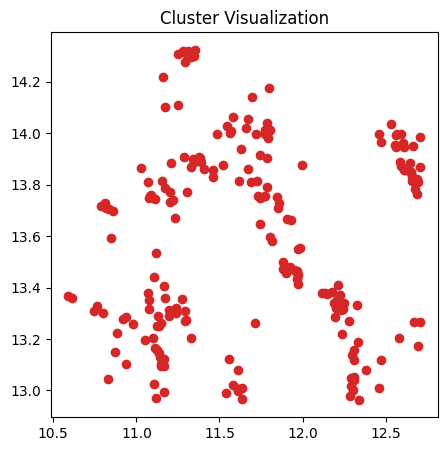

212
5283 " adopt"
7935 " instrument"
7988 "LC"
8022 "PI"
9121 " \{"
9266 " crystal"
10635 " Based"
11693 " trail"
11837 "Each"
12687 " predomin"
13187 " Adam"
13225 " instruments"
13437 "diff"
13450 " cot"
13726 " stretch"
14014 "interest"
14053 " modeling"
14143 "opsy"
14328 " PI"
14393 " seal"
14462 " motions"
14463 "Tra"
14486 "�"
14504 "audi"
14572 " rolling"
14711 "118"
14721 "tain"
14761 " subsid"
14827 "auc"
14946 " mediated"
15071 " managers"
15130 "INK"
15166 " cancell"
15192 " PB"
15193 "overnment"
15217 " founder"
15218 " dispers"
15232 " squee"
15278 " nick"
15322 " Ess"
15332 "PN"
15370 " Peters"
15394 " disaster"
15407 " loans"
15410 " 138"
15414 "udge"
15416 "ammed"
15423 " extraordinary"
15456 "margin"
15465 " solvent"
15469 " tower"
15490 "Day"
15496 " counting"
15499 "Graph"
15511 "VERS"
15513 " nights"
15535 " horror"
15537 "VER"
15540 "			"
15545 "Based"
15546 " collagen"
15565 "items"
15570 "_*"
15573 " cin"
15578 "opter"
15599 " ABC"
15607 " permissions"
15612 " i

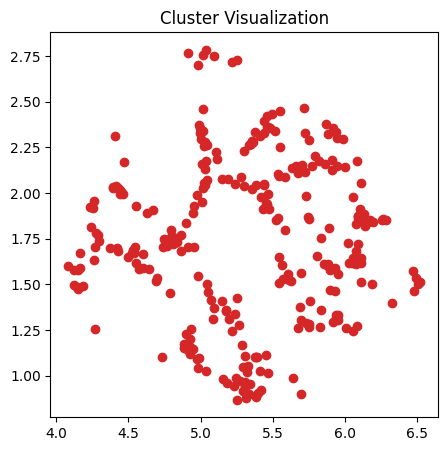

293
4 "#"
58 "Y"
65 "`"
70 "e"
97 "�"
107 "�"
120 "�"
125 "�"
129 "�"
131 "�"
141 "�"
144 "�"
154 "�"
167 "�"
195 ""
204 ""
215 "�"
217 "�"
282 "le"
498 "cl"
535 "

"
566 "ence"
621 "ions"
646 "ect"
687 " ro"
705 " spe"
771 " mod"
834 "ont"
836 "ood"
1636 "                        "
1739 "apt"
3893 "
      "
5808 "                      "
5980 "                                                        "
7353 " sweet"
7828 "                          "
10777 " cream"
12703 "                                  "
12965 "Run"
16085 "                                             "
16465 " dit"
16727 "                                               "
17482 "
                      "
17764 "stock"
20102 "
                            "
20170 "                                                                                                                                                                                                "
23019 " spy"
23905 " wird"
24657 "Ant"
25927 "
                      

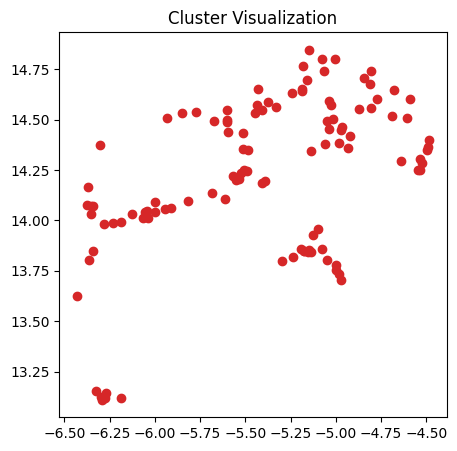

110
22350 " contractor"
24430 " [\"
24492 " ignorance"
24552 "241"
24558 "219"
24633 " rotor"
24823 "ات"
24918 " $('#"
25087 " tile"
25105 " visa"
25162 " sanction"
25167 "enas"
25186 " naval"
25240 "XXXX"
25304 "blood"
25404 " â"
25426 " Complete"
25436 " realised"
25485 " bombing"
25526 " emit"
25532 "etz"
25550 " ally"
25556 " Reagan"
25685 " eh"
25687 " privileges"
25702 " supplemental"
25716 "EA"
25717 " PROC"
25725 "anut"
25740 "essel"
25764 "ocytic"
25777 " '#"
25804 "Team"
25837 "fw"
25849 " ع"
25865 " polarized"
25909 "posure"
25912 "cale"
25918 "Arr"
25941 "bugs"
25954 "Anyway"
25961 " casino"
26008 "Pen"
26016 " undesirable"
26023 " starter"
26049 "motion"
26068 "Think"
26117 " Municip"
26132 " biosynthesis"
26161 "structor"
26191 " INT"
26195 "ickets"
26205 "VAR"
26207 "Christian"
26228 "arte"
26236 "0025"
26276 " relay"
26291 " Ghost"
26302 " subscribe"
26315 " Bangl"
26323 " también"
26346 "USB"
26349 " injust"
26357 "said"
26400 " aiming"
26449 "feeding"
26459 " concomit

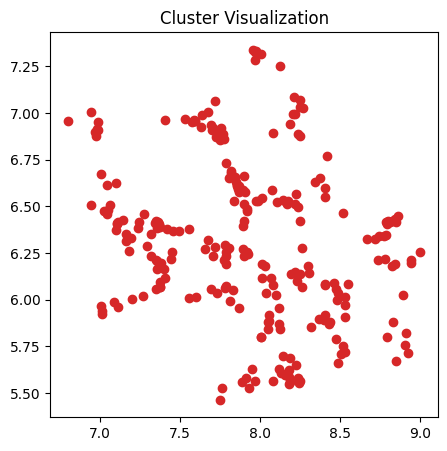

254
11625 "oves"
13045 "RES"
14737 " Jacob"
15140 " advised"
16058 " verified"
17881 " neutr"
18707 " Gray"
36753 "igu"
37192 "\,{\"
38184 "794"
38195 " multimedia"
38476 " Stockholm"
38664 "refresh"
38867 " TiO"
39086 " agarose"
39771 "uren"
40080 " ajax"
40218 "missibility"
40478 "fault"
40532 " stitch"
40635 "gio"
40847 " cafe"
40881 " faç"
41047 "imod"
41215 " pendant"
41227 "551"
41360 " Hutch"
41386 "shi"
41748 "unds"
41828 " groundwater"
41880 " plunged"
41911 "rano"
42166 " Singer"
42176 "letes"
42224 " Beau"
42351 " grazing"
42431 " Epstein"
42527 "hering"
42576 "Travel"
42657 " bamboo"
42756 "ść"
42811 " Pero"
42840 "APE"
42884 " decid"
42891 "ovsky"
43029 "AFFIRMED"
43110 " dissimilar"
43120 " Kob"
43138 " 630"
43198 "intervention"
43211 " predecessors"
43252 " Kindle"
43326 " Hawaiian"
43349 "ató"
43409 "bent"
43411 "ArgumentException"
43415 " 496"
43431 " inhalation"
43442 "hands"
43452 " bursting"
43483 " Thinking"
43524 "FREE"
43557 "920"
43591 "LRQ"
43633 " Myth"
43639 

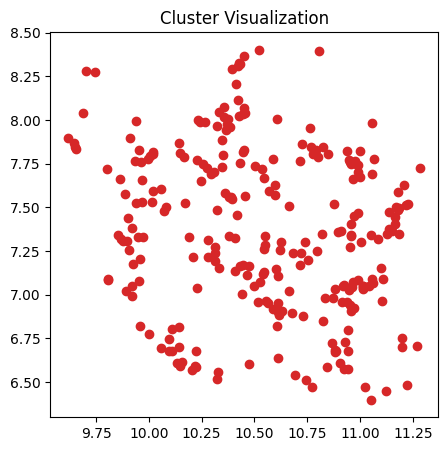

266
5212 " magnetic"
8578 " subset"
9480 " gel"
9603 " producing"
9967 "agnetic"
10591 " refe"
10724 " pulse"
12636 " Tal"
12898 "desc"
13255 " healing"
13268 " Jordan"
13487 " squad"
13744 "�"
13829 " Link"
14372 "rage"
14425 " Ubuntu"
14550 "Pad"
14728 " shifted"
14871 " randomized"
14903 " servers"
14989 "inine"
15041 "Ill"
15175 "ää"
15466 " WARRANTIES"
15752 "arity"
16414 " infra"
16670 " exclude"
19111 "obi"
19310 " blend"
33187 "porters"
34677 " immortal"
34786 "chol"
34887 " tornado"
35028 " Louise"
35035 " staged"
35199 "―"
35931 "ept"
36161 " bells"
36189 " Mood"
36355 " Charg"
36410 " WIN"
36548 "常"
36645 "Plaintiffs"
37361 "romes"
37371 "oors"
38224 " Stress"
38262 "�"
38410 " ALS"
38430 " Neumann"
38721 "ogical"
39189 " tempting"
39488 " prow"
39562 " Illegal"
39620 " condensate"
39669 " EVERY"
39696 " fireplace"
39704 " ureth"
39747 "xB"
39821 "ilant"
39847 "osyl"
39884 " degli"
40060 " Acad"
40225 " Wong"
40232 "CONNE"
40270 "imaging"
40293 " Cros"
40371 " garment"
40423

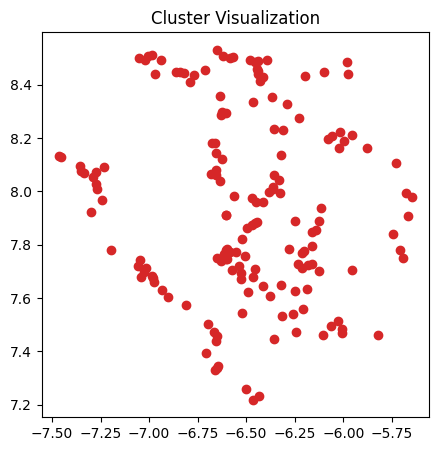

163
1561 " within"
5100 " establish"
25014 " boom"
26540 " chef"
26647 " generalization"
26753 "Repository"
26947 "enton"
27038 "relative"
27213 " branching"
27297 "izen"
27709 " Yale"
27886 "scriptscriptstyle"
27902 "Sync"
28063 " digging"
28190 " tricky"
28192 "selector"
28232 " tones"
28308 " indexes"
28321 "550"
28331 " Michelle"
28339 "657"
28410 " histone"
28436 " Bring"
28448 "Martin"
28494 " Bin"
28499 " merchandise"
28507 " 1934"
28532 "")]"
28564 " 550"
28573 " apartments"
28579 "things"
28586 "学"
28606 " Rate"
28614 "OVER"
28619 "faced"
28622 " Loss"
28639 " acry"
28645 "Unless"
28649 "ον"
28730 " Info"
28732 "ют"
28750 " Mills"
28773 " femoral"
28791 "置"
28800 " toug"
28819 " spatially"
28827 " COPYRIGHT"
28832 "ρό"
28835 "0014"
28839 " piston"
28851 " rivals"
28894 " gateway"
28895 "Dar"
28899 "282"
28907 "Month"
28912 "^−/−^"
28923 "agar"
28938 " shortage"
28946 "rp"
28973 "aurant"
28985 "convert"
29031 " LINE"
29076 "letters"
29098 " oak"
29122 " Saints"
29126 "atics"
29

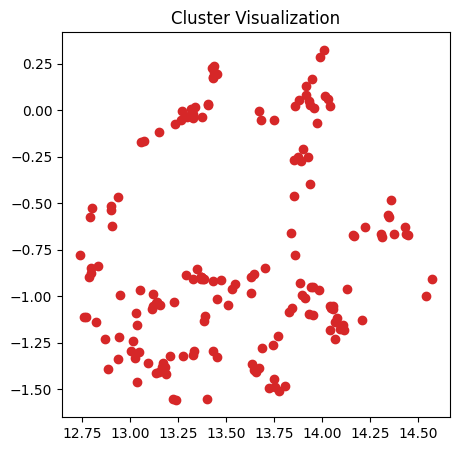

168
4294 " frequency"
7178 " pathway"
7783 " 150"
8970 "150"
9128 " genome"
9130 " pathways"
9166 " 400"
9205 " surgical"
9685 " wet"
9693 " Boston"
9717 " Err"
9762 " requests"
9776 " Care"
9779 "reams"
9812 " IR"
9827 " differentiation"
9876 " Does"
9921 " medicine"
9923 "fficients"
9925 "г"
9970 " teeth"
9999 " representing"
10005 " progression"
10225 "ois"
10310 " NY"
10441 "uj"
10758 "Once"
13509 "elcome"
13531 " Norm"
13866 " inline"
14441 " msg"
17710 " characterize"
32398 " Daddy"
32701 " appliances"
35371 " epidermal"
35621 "resize"
36191 " docker"
36243 " interstitial"
36388 " Nearly"
36436 " mV"
37209 " Officers"
37363 " tariffs"
37412 " lasers"
37462 " freak"
37502 "uar"
37579 " survivor"
37604 "ане"
37929 "utorial"
37982 "![\["
38040 " UTC"
38068 " RPG"
38133 " aisle"
38167 " parasitic"
38278 " sting"
38287 " hackers"
38370 " Bruno"
38388 " shipment"
38389 "然"
38394 " Homeland"
38460 "1955"
38478 "Shift"
38529 "ourage"
38533 "DataSource"
38601 "Bin"
38623 " CONTRIBUTORS"
3

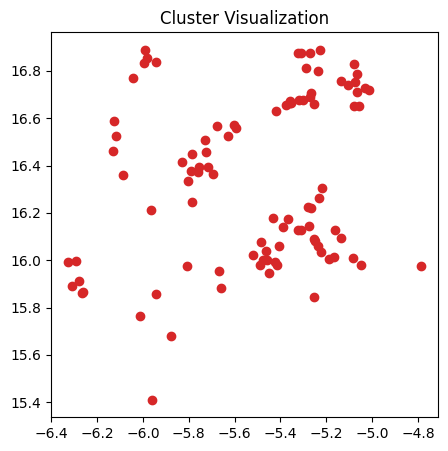

96
24047 "pector"
24644 "entieth"
24672 " amyl"
24848 " polymorphism"
24863 " vivid"
24877 " 401"
24972 "rendum"
25039 "354"
25119 "olia"
25145 " empower"
25223 " protease"
25316 "resholds"
25319 " coarse"
25359 "invalid"
25388 " Define"
25389 " collector"
25394 " confronted"
25412 " Deal"
25440 "acin"
25444 "WRITE"
25457 " sue"
25461 " creep"
25479 "ippet"
25493 " contaminated"
25496 " pore"
25499 "antib"
25512 "fif"
25513 "uant"
25517 "ODULE"
25573 "dependency"
25575 " electoral"
25615 " deter"
25618 " abort"
25642 "uba"
25646 "ussy"
25659 " Cauc"
25662 " nominal"
25689 " Arnold"
25718 "abulary"
25730 " ih"
25758 " disturbing"
25795 " comed"
25797 "401"
25805 "608"
25810 "Micro"
25820 " investor"
25823 "agner"
25828 " customs"
25831 "sic"
25869 "growth"
25879 " Qt"
25895 "ographer"
25920 " exchanged"
25924 " blink"
25928 "icz"
25953 "647"
25957 " mentions"
25968 " Butler"
25975 " Emma"
25978 " governance"
25982 "ophosph"
26035 " AMD"
26044 " stole"
26072 " пол"
26083 " presidency"
26

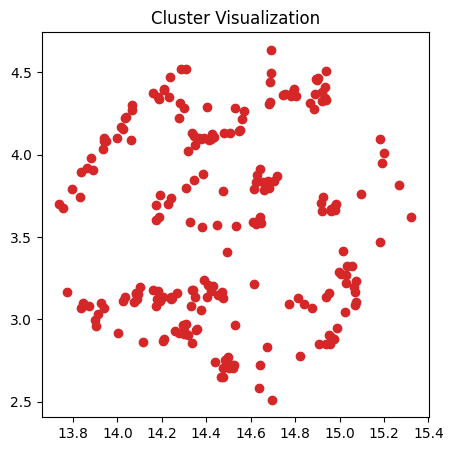

219
9025 " division"
9261 " transformation"
9957 " advent"
9978 " setup"
10018 " observe"
10085 " accommod"
10114 "HA"
10115 " gran"
10167 "spring"
10193 "arters"
10395 "Vis"
10551 " mistake"
11215 "aver"
11606 " interrupt"
12566 "success"
12595 " deck"
12954 " worker"
13207 " begun"
35133 " longe"
35716 " conferred"
37366 "informatics"
37550 " fibres"
37582 "xA"
37678 "tie"
37697 " Gore"
38067 "orro"
38206 "スト"
38492 " hereafter"
38513 " polyclonal"
38546 "ACTION"
38614 " 354"
38797 " Planck"
38801 " 399"
38945 "engeance"
39054 " Ez"
39168 "trig"
39266 " diagnostics"
39284 " undue"
39296 " redundancy"
39324 "Josh"
39402 "kä"
39415 "Exists"
39442 "Canvas"
39467 "*.*"
39487 "[{"
39555 "criptive"
39595 "implementation"
39614 "pitti"
39666 " sow"
39701 "Studio"
39716 " triplet"
39768 "074"
39831 " genres"
39849 "511"
39855 "601"
39856 " numb"
39857 "ах"
39892 "leader"
39897 " parench"
39912 " ants"
39926 " framing"
40000 "/>."
40009 " sigma"
40045 "ympt"
40127 "apons"
40139 " killings"
40

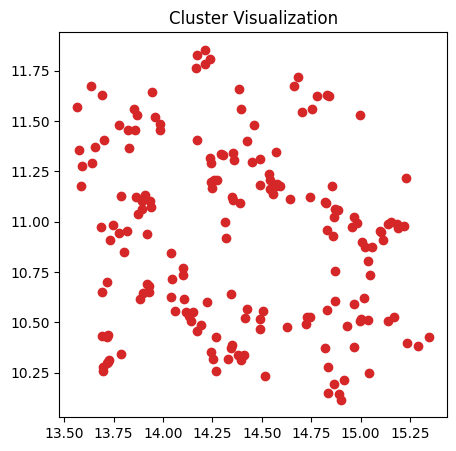

180
1107 " years"
6846 "-------"
8016 "NF"
8456 "json"
8683 "SO"
8717 " SO"
8784 " Av"
9593 "ican"
9797 " audio"
9974 " strike"
10368 "porary"
10431 "HC"
10526 "years"
10596 " apoptosis"
10623 "�"
11379 "./"
11620 " +/-"
11917 "hu"
11956 "quot"
11992 " municip"
12230 " perturb"
12363 "�"
12574 "render"
12630 " <-"
12781 "bec"
12998 " branches"
13291 " ions"
13341 " tap"
13345 " artificial"
13369 " cavity"
13393 "handle"
13573 " WE"
13634 "zone"
13645 "phant"
13844 " debug"
13849 " distances"
13860 " pap"
13975 " visiting"
14161 "cpp"
14391 " Tok"
14409 " acknowledge"
14419 " managing"
14452 " indices"
14454 " forgotten"
14468 " Brian"
14539 " isot"
14545 " stops"
14595 "-$"
14706 "ож"
14733 "ρο"
14740 "mpty"
14754 " franch"
14763 "vet"
14766 " |\"
14783 "132"
14789 " MO"
14793 " timely"
14841 " wash"
14842 " precip"
14869 " Const"
14886 " discharg"
14969 " acknowledged"
15029 " shapes"
15074 "�"
15123 " Ast"
15157 "MAN"
15233 " protecting"
15234 "ων"
15265 " motiv"
15313 " derive"
1532

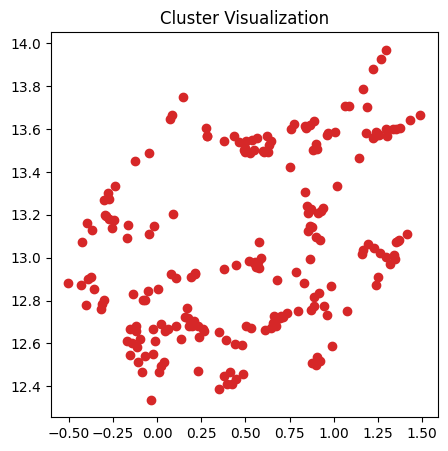

212
16270 " acquire"
18482 " Magn"
21464 " metadata"
21865 " MHz"
21884 " merged"
22102 "ativistic"
22269 " cleaned"
22349 " contexts"
22444 "Api"
23273 " fibroblasts"
23431 " Champ"
23519 " Lot"
23804 "rice"
23857 "Track"
24838 " indicative"
29564 " skeleton"
30019 " GD"
30678 " traps"
30799 "means"
31455 "Cluster"
31456 "founder"
31615 "plectic"
31666 "Feed"
31856 "olymer"
31874 " Somal"
31906 "ameth"
31926 " footballer"
31969 "Steve"
31975 "stained"
32013 "idepress"
32023 "MHz"
32178 " persisted"
32210 " 440"
32216 " Secondly"
32218 "425"
32235 "Canada"
32269 "Vir"
32271 " Whenever"
32287 "änder"
32329 " Wave"
32330 " NLR"
32345 " Niger"
32375 "integration"
32388 " CALL"
32437 "sequent"
32440 " 802"
32449 " granular"
32450 " refractive"
32451 "ieves"
32459 " abnorm"
32463 " CU"
32467 " schematic"
32480 " rebellion"
32505 " unim"
32524 " Roh"
32546 " interleukin"
32550 " Prophet"
32554 " то"
32558 "nolimits"
32561 " erosion"
32585 "TRODUCTION"
32594 "正"
32596 "emporary"
32606 "impose

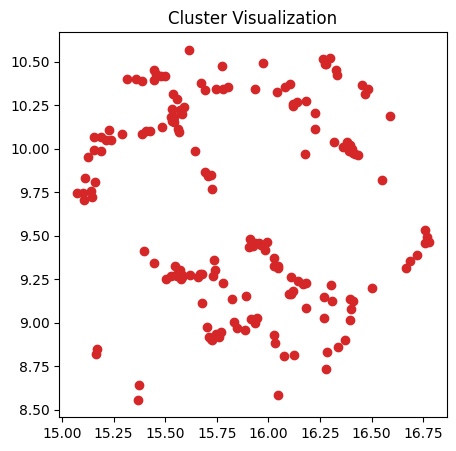

169
6724 " Ret"
7518 " Hel"
9494 "Hel"
9730 " Men"
9795 "Ret"
9857 " Jackson"
9995 " glad"
10078 " participate"
10244 " Similarly"
10297 "Tab"
10316 " brings"
10323 " basically"
10342 "Most"
10416 " hung"
10440 " photograph"
10571 " partially"
10632 "\""
10654 " lights"
10699 " roof"
10738 " exhibit"
10752 "reason"
10807 " BOOST"
10908 " Stan"
10914 "FD"
10927 "response"
10988 " stations"
11044 " stom"
11056 " Today"
11353 "necess"
11467 " roughly"
11634 "uated"
11709 " Studies"
11730 " gay"
11861 "subseteq"
12150 " harder"
12380 "condition"
12413 " tow"
12689 " scar"
12978 "Will"
13136 " convin"
13526 "──"
13530 "parison"
13628 " ears"
13768 " shots"
13771 " Rather"
13945 " injected"
13989 " proposition"
14124 "unes"
14262 "�"
14308 " definitions"
14370 " grey"
14375 "ANG"
14416 " erred"
14797 "lla"
14934 "heet"
15050 " routes"
15195 " Ont"
15211 " eager"
33537 " biopsies"
34718 " Beautiful"
35034 "Haw"
35092 " noteworthy"
35125 " dispose"
35127 "öm"
35172 "nutrition"
35182 " polyg"
3

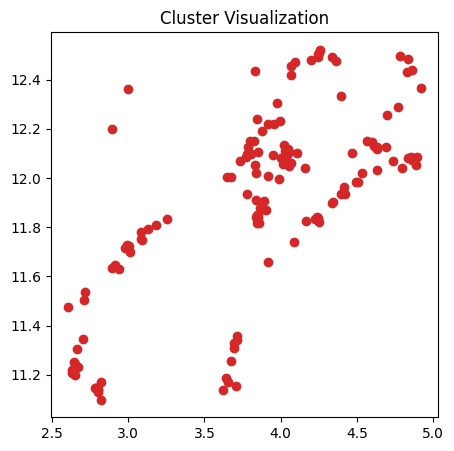

140
2463 "
         "
8401 " diabetes"
14867 " Chen"
15103 " Bat"
15440 "”)"
15986 " volunteers"
16751 " manifold"
17935 " toll"
18474 ")->"
18504 " sv"
19519 " suits"
22149 " boil"
22521 "**_"
22759 " dairy"
30646 "Father"
32154 " Golf"
32639 " MU"
32778 "wild"
32837 " mediators"
32927 "trained"
32936 " tails"
33020 "upal"
33027 "iken"
33066 "uttering"
33091 " cemetery"
33147 "oblot"
33301 "--**"
33334 " Carn"
33400 " tempted"
33447 "Ult"
33448 "ometown"
33453 "eon"
33485 " 523"
33518 " strokes"
33521 " Solution"
33524 "andidate"
33555 " pretreatment"
33611 "Crit"
33660 "UTR"
33670 " wij"
33705 " 318"
33748 "Taking"
33769 " Chip"
33773 " honesty"
33829 "sense"
33831 " Hood"
33834 "stated"
33848 " rocky"
33869 " hasta"
33908 " SUB"
33914 "Mesh"
33934 " rall"
33939 ""
33955 "PTR"
33958 "Diagn"
33967 "cen"
33988 "Added"
33989 "Isn"
33994 " Cult"
33999 "snd"
34008 " Coulomb"
34012 " Midd"
34017 " discrep"
34033 " mRNAs"
34035 " thrott"
34038 "Decided"
34041 "LOCAL"
34057 " hobby"
34067 

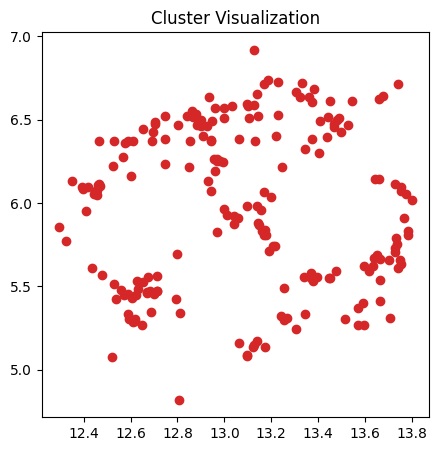

203
9678 " sport"
9709 "Mar"
9897 "});"
9916 " Rom"
10854 "Down"
11291 " chip"
11440 " continuing"
11856 " uma"
12042 "bot"
12285 " Lim"
12609 " guitar"
12832 " literally"
13454 "ailing"
14599 " radial"
14776 "uda"
15019 "ophil"
15079 "rev"
15098 " corp"
15106 "move"
23334 "{|"
35004 " LAT"
35999 "emit"
36008 "produced"
36380 " Meth"
36516 "Digital"
36574 " defer"
36600 " Directors"
36898 "enron"
37157 "TRAN"
37160 "Film"
37169 " compuls"
37669 " Rocky"
37861 " psychosocial"
37990 "ferroni"
38093 "ρω"
38175 " JR"
38523 " suburb"
38790 " prz"
38819 "852"
38820 " 508"
38839 "attempt"
38965 "geometry"
39123 " Canon"
39161 " OVER"
39314 " thrill"
39411 " fringe"
39465 "它"
39529 "shirts"
39592 " trabal"
39725 "idences"
39772 "leman"
39834 " Europese"
39860 " danced"
39893 " avenue"
39969 "powers"
39970 " generalize"
39998 "oxid"
40015 "Supported"
40090 " modulo"
40136 " Cassie"
40144 " blankets"
40155 " specifics"
40189 "Treatment"
40190 "aturation"
40290 " experimentation"
40300 " Ital"
40

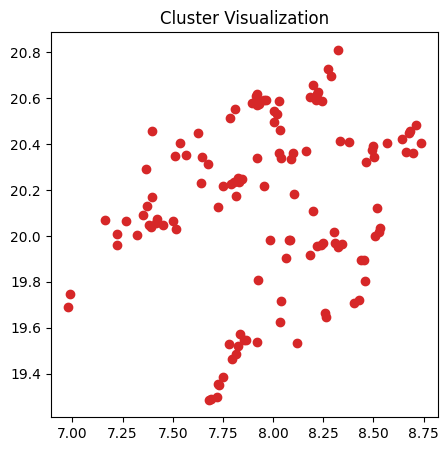

122
8684 " Math"
11236 "NP"
13751 " specimens"
13839 "Pos"
16508 " Abs"
17403 " Decl"
17519 " alkyl"
17802 " Winter"
17809 "169"
18098 " fruits"
18155 " sou"
18156 " NK"
18310 "Abs"
18332 " overhead"
18342 " CHECK"
18347 "sight"
18368 " Fourier"
18376 " termin"
18409 " followers"
18425 " veteran"
18427 "ropol"
18437 "rous"
18445 " dealt"
18467 "164"
18479 " logo"
18486 "314"
18489 "March"
18563 "hthal"
18587 "TON"
18591 "UG"
18595 " proposals"
18606 " stimulated"
18608 "Decl"
18619 ")'"
18637 "longrightarrow"
18696 "uter"
18699 " reservoir"
18702 " premises"
18709 "gie"
18722 " dye"
18727 " smiling"
18729 " sib"
18733 " Garden"
18735 " glory"
18742 " Disease"
18750 " punch"
18759 " Nig"
18764 "要"
18790 "kel"
18802 " documentary"
18844 " threatening"
18847 " Language"
18848 "rob"
18870 " sym"
18879 " titled"
18884 " dielectric"
18885 " Buck"
18887 " WR"
18897 " prisoner"
18898 "oples"
18902 " recurrent"
18903 " sisters"
18916 "determ"
18937 "lein"
18950 "306"
18954 " testify"
18968 "Mor

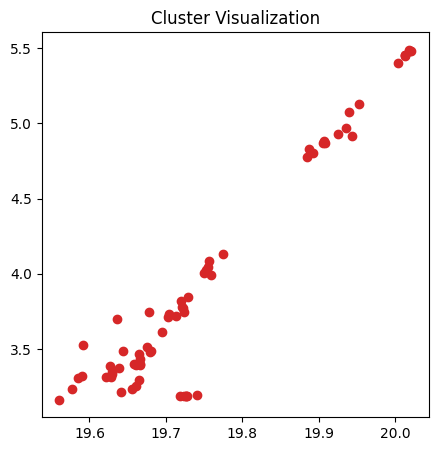

66
3563 " late"
10585 " pseud"
19653 " embrace"
25897 "Friday"
26502 " Late"
26788 "Monday"
28007 "Saturday"
28266 "Tuesday"
28549 "Thursday"
28729 " embraced"
28781 "Wednesday"
35875 "Pseud"
36685 " Mask"
36923 " Marshal"
36937 "ộ"
37320 " External"
37473 "capacity"
37479 "Mapper"
37564 "router"
37619 " delic"
37663 " deterg"
37685 " iii"
37737 " 397"
37744 "CAST"
37768 " Holiday"
37799 "visit"
37809 "alsa"
37823 "ær"
37831 "acio"
37852 "fony"
37869 " Perez"
37883 "etted"
37890 "ând"
37902 " pleasing"
37919 " gyrus"
37927 "ين"
37928 " stam"
37940 "retval"
37946 " stamps"
37954 " REL"
38000 " aquatic"
38030 "Sock"
38034 "Foundation"
38051 "ynn"
38057 "hb"
38064 "FER"
38123 " frightening"
38153 " acquaintance"
38157 "difficult"
38171 " subtraction"
38205 " interruption"
38223 "ு"
38235 "isks"
38238 " logistics"
38244 " helium"
38248 "리"
38310 " Davidson"
38323 " decorative"
38360 " anticancer"
38365 " Pseud"
38397 " Schwarz"
38437 " Johnston"
38466 "lis"
39176 "pseud"
41859 " embracing"

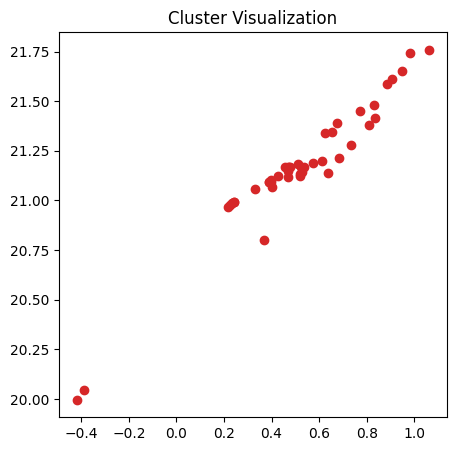

44
17093 " illustrate"
17599 "188"
18303 " illustrates"
20223 " eigenvalues"
20259 "akespeare"
20719 "ancouver"
20837 "assium"
20899 "onomous"
20907 "factory"
21154 "umat"
21197 "213"
21241 "ай"
21378 "238"
21469 "   "
21490 " feared"
21508 " Roll"
21737 " Licensed"
21991 "成"
22017 "uran"
22024 " Shakespeare"
22060 "osine"
22061 "eren"
22111 " retrieved"
22126 " Vancouver"
22207 " polls"
22212 " Emperor"
22218 " Freder"
22247 "ensitivity"
22259 "virtual"
22265 " Assert"
22270 "295"
22279 "Private"
22294 " binds"
22345 "iemann"
22374 "brand"
22381 " trash"
22394 " cryptocur"
22416 "interpret"
22485 " packing"
22596 " opio"
22640 " parole"
22714 "predict"
22761 " 161"
34805 " illustrating"


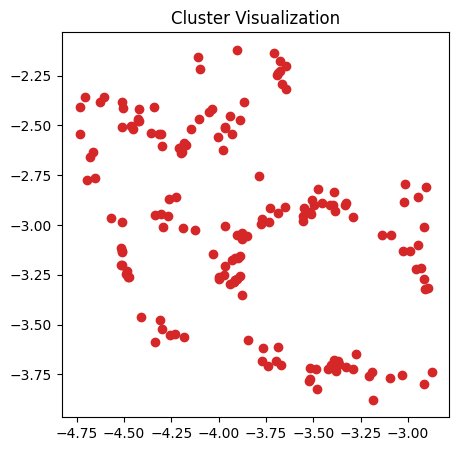

170
2618 "Id"
3176 " appear"
3746 " themselves"
3759 " Sim"
3783 "ios"
3788 "MA"
3976 " Char"
4010 ")="
4021 " double"
4078 "ociety"
4097 " AP"
4123 "la"
4140 "Suppose"
4144 "psi"
4146 " Sun"
4198 " prop"
4204 " da"
4206 "iled"
4219 "izes"
4234 "acing"
4291 "inct"
4295 " components"
4317 "ees"
4328 " location"
4397 " September"
4432 " recept"
4445 " component"
4450 " board"
4464 "(("
4485 "------"
4496 " please"
4501 "ión"
4502 " tumor"
4515 "wards"
4528 "dim"
4546 " played"
4554 " cyt"
4565 " December"
4569 " appropriate"
4588 " actual"
4594 " Afric"
4609 "which"
4617 " impos"
4620 " appears"
4653 " PR"
4672 "!!"
4688 " fat"
4692 "ano"
4694 "vision"
4699 "002"
4708 "RT"
4714 "well"
4730 " education"
4738 "======"
4741 "OV"
4744 " Mark"
4749 "Sim"
4751 " fully"
4764 " parameter"
4772 " __"
4776 " hab"
4777 "stances"
4786 "fo"
4787 "otes"
4790 "ymbol"
4800 ")^"
4810 " Willi"
4811 " regions"
4813 " exhib"
4821 " continued"
4823 " consequ"
4835 "item"
4838 "003"
4841 "langle"
4854 " heari

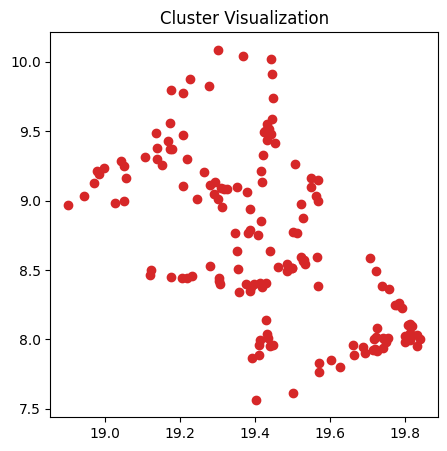

153
5566 " Off"
9837 "ô"
9871 " polym"
10067 " provisions"
10084 " surprising"
10098 " launched"
10152 "icul"
10232 " fract"
10247 "positive"
10307 " efficacy"
10332 " infections"
10361 "�"
10367 "mal"
10429 " lesions"
10438 " pregnancy"
10471 " partners"
10485 " weapon"
10565 "axis"
10569 "IX"
10580 "graph"
10616 " ME"
10619 "msgid"
10624 "rams"
10634 "MENT"
10640 "areness"
10653 "msgstr"
10659 " diagram"
10663 "WE"
10668 " readers"
10672 " Gra"
10675 " broadcast"
10684 " Show"
10714 "ا�"
10719 "acts"
10745 "earing"
10757 "acity"
10773 "access"
10788 "arse"
10799 " precise"
10818 "Med"
10822 " genu"
10824 " troops"
10830 "Length"
10834 " Way"
10835 "alloc"
10863 " ist"
10879 " frequent"
10912 " arranged"
10939 " independently"
11003 " 88"
11004 "empty"
11288 " pitch"
35343 ""\"
35400 "830"
35655 " BJP"
36016 "810"
36107 " afflict"
36194 " Mao"
36200 " Legion"
36219 " customize"
36329 " lymphocyte"
36348 " dyes"
36373 " Franz"
36389 " IJ"
36408 " snippet"
36420 "CMV"
36474 " univariate

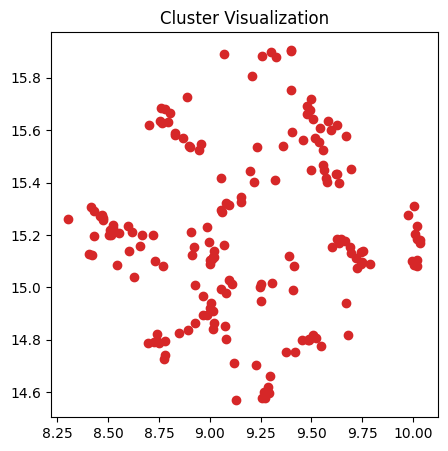

175
5203 " label"
9591 " performing"
9611 " conviction"
12385 "¤"
12499 "\}"
14645 " Death"
15429 "165"
15523 " photon"
15749 " np"
15828 " passenger"
16212 "Bre"
16255 " firms"
16259 "eron"
16301 " Missouri"
16307 " transitions"
16360 "writer"
16364 "criptor"
16372 "iph"
16373 "aline"
16406 "erto"
16420 "rowser"
16453 " modest"
16455 "video"
16463 " brush"
16471 "wp"
16473 " defeated"
16479 " passengers"
16490 "Ma"
16495 " Sin"
16498 " cure"
16519 " lam"
16520 "ensis"
16524 " greet"
16541 " Insurance"
16542 " comme"
16548 " Returns"
16561 "esian"
16562 " cerebral"
16566 " objectives"
16568 "VA"
16570 "bidity"
16578 " proxim"
16590 " Disney"
16613 " notable"
16620 " awards"
16625 " exped"
16627 "erald"
16633 " focuses"
16645 " balanced"
16650 " Fourth"
16655 "zens"
16658 "tocol"
16668 "wind"
16679 " Writ"
16680 "results"
16681 " highlights"
16685 " negotiations"
16686 " Drug"
16688 " Being"
16705 "twitter"
16709 "bsite"
16713 "eto"
16714 "develop"
16719 "depth"
16720 " ceiling"
16721 "

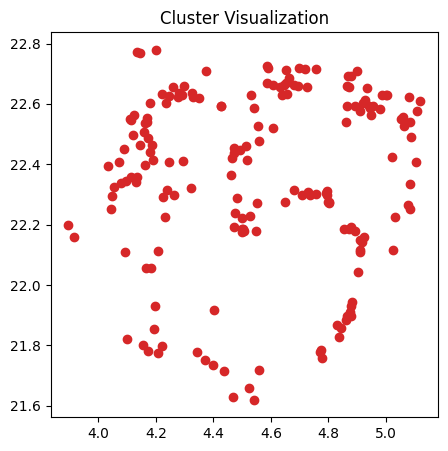

181
19023 " Ok"
19536 " Nort"
19540 " Flow"
19548 " Mos"
19655 " Seg"
19777 "unders"
19788 " pathogens"
19850 "intestinal"
19859 " gy"
19865 "pendicular"
19866 " Scal"
19919 " pressures"
19935 " aan"
19991 " whites"
20074 "osevelt"
20114 " interviewed"
20127 "Ok"
20132 "creat"
20178 " conceptual"
20181 " 000"
20196 " secrets"
20217 "idos"
20240 "aca"
20241 "�"
20242 " Christianity"
20243 " runtime"
20245 "═"
20248 " uncert"
20252 " hiring"
20263 " ##"
20276 " problematic"
20277 " perpendicular"
20286 "�"
20289 " Ath"
20291 " Isa"
20303 " battles"
20312 " wherever"
20321 " bottles"
20323 "ikh"
20334 " contempt"
20341 " Norway"
20344 " Fern"
20352 " Aw"
20359 "Scale"
20362 " attacking"
20366 "ап"
20367 "iosity"
20374 " banned"
20375 " earnings"
20377 "yscall"
20379 " precursor"
20381 "aciones"
20386 "CHANTABILITY"
20401 "ylum"
20404 " subscrib"
20406 "argo"
20410 "ез"
20414 "opa"
20416 "_{{"
20418 " uncertainties"
20419 "generated"
20420 " appropriately"
20435 " beams"
20439 "Policy"
204

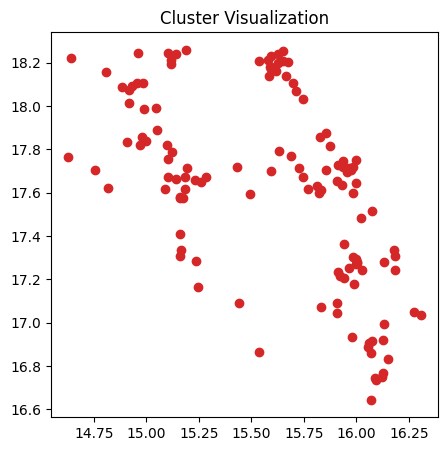

128
5544 " explained"
8878 " 1995"
9251 " Pan"
10680 " inhibitor"
11335 "102"
11366 " Hard"
11436 "rell"
11555 " unusual"
11602 "!”"
11611 " antigen"
11695 "Project"
11708 "STAT"
11751 "osomes"
11761 " dear"
11791 " stayed"
11808 "Sum"
11817 "jections"
11833 " dipl"
11846 " Event"
11855 " exclusive"
11858 " 140"
11868 " turb"
11872 "outer"
11874 " calm"
11886 " anch"
11887 "bral"
11900 " respiratory"
11925 "ryst"
11928 " MR"
11929 " submit"
11934 " malign"
11942 " guns"
11945 " cycles"
11951 " parad"
11955 "ometer"
11964 "hour"
11972 "thread"
11986 "vironments"
11997 " Tour"
12012 "—""
12021 " subjected"
12024 " Gi"
12025 "address"
12028 " entries"
12059 " altered"
12061 " surge"
12065 " não"
12073 " Da"
12075 " decreases"
12080 "pay"
12082 " systematic"
12085 " competitive"
12086 "anded"
12088 " talks"
12097 " patch"
12125 " absent"
12130 " ul"
12139 " asympt"
12141 " guest"
12147 " severity"
12158 "grav"
12161 "Pass"
12162 " proceeding"
12163 "remove"
12169 " Centre"
12177 " likeliho

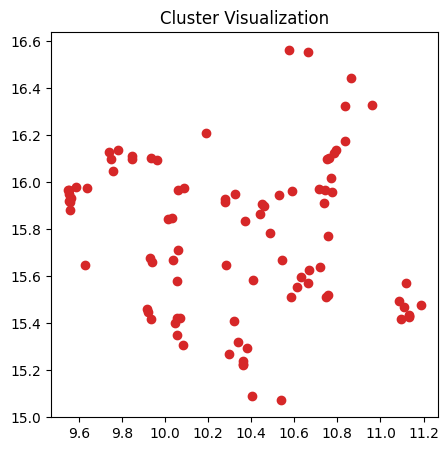

90
616 " their"
6568 " camera"
9083 "Phys"
9647 " soldiers"
10076 " scenario"
10289 " carrier"
10871 " Enter"
11788 "ulty"
12493 " Patients"
12603 "0002"
12679 "opher"
12825 " toxic"
12905 "Reference"
13227 " mitochondrial"
13252 "ureau"
13277 " Methods"
13301 " labels"
13927 " Title"
13951 " Radio"
14514 "iotics"
14555 "147"
14602 "0003"
14768 " farmers"
14953 " faculty"
15017 "0004"
15216 " scenarios"
15495 " carriers"
15568 "Methods"
15685 " incubation"
15778 "VI"
15793 "account"
15796 " soldier"
15852 "Parent"
15886 "Enter"
15904 " Bureau"
15929 " nursing"
15968 "Return"
15993 " Cells"
16015 " Forest"
16260 " triple"
16304 " tutor"
16331 " 08"
16394 " cocaine"
16424 " advances"
16442 " McG"
16475 " districts"
16512 "iculous"
16557 " ads"
16605 ""
16636 " RO"
16644 " automated"
16692 "omat"
16744 " distress"
16764 " expecting"
16788 "vc"
16790 " Building"
16801 "Empty"
16807 "atomic"
16822 "Bank"
16848 "sample"
16884 "ulpt"
16899 "210"
16920 " posting"
16964 " habits"
16983 "fp"
16

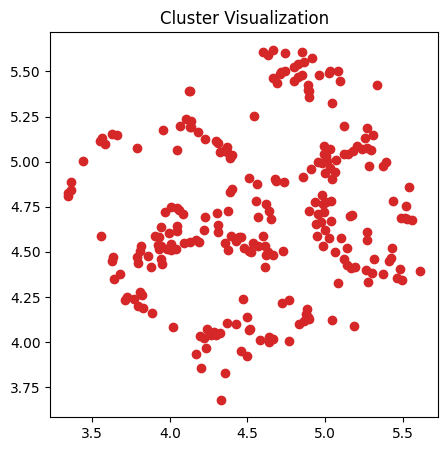

250
123 "�"
1305 " dep"
5274 " IL"
8369 "                                                                                                "
12379 " judicial"
13075 "                                         "
13708 " supern"
14627 "ogens"
16143 "PUT"
16196 " discontin"
16310 "
                         "
22633 " Cla"
23159 " criticized"
23625 "322"
25946 " emitting"
26391 " Phone"
27294 " metaphor"
27572 " unrest"
31582 " waking"
36108 " recurring"
42448 " occupants"
42503 "DIG"
42736 " symmetrical"
43079 " flora"
43262 "JK"
43271 " rooft"
43590 " Ji"
43717 " intoxication"
43904 " multiplicative"
43944 " trac"
43947 " Kitty"
44051 "XI"
44078 "unger"
44104 " CHE"
44111 "ি"
44275 "dating"
44282 " checklist"
44322 ",~"
44340 " Parties"
44474 " knit"
44540 " epochs"
44615 " congreg"
44643 " EQ"
44651 "Patch"
44680 "=”"
44694 " lysed"
44705 " Called"
44730 " skepticism"
44747 "skirts"
44771 "atonin"
44798 "arers"
44820 " botan"
44837 "formations"
44855 "hog"
44883 "adors"
44885 "ämä"
44893 "Ar

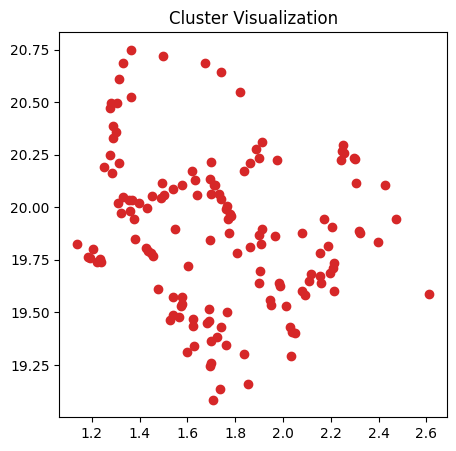

141
18818 " legislature"
19118 "INTER"
19937 " Cert"
20672 " Lower"
20751 "icrobial"
20933 "ξ"
20988 " Primary"
21065 " jaw"
21290 " shade"
21340 "288"
21416 "Xi"
21441 " colonial"
21456 "reducible"
21484 "Smith"
21506 " Communications"
21509 " ech"
21570 " Knight"
21586 " hapl"
21613 " hood"
21663 "Lab"
21723 "************************************************************************"
21728 "alis"
21738 " faithful"
21765 " verbal"
21766 "LOC"
21768 " senses"
21772 "Struct"
21786 " 152"
21846 " \!"
21881 "flix"
21887 "из"
21907 " Activity"
21916 " transfers"
21929 "ozygous"
21934 "sequence"
21943 "reach"
21945 "oplastic"
21949 "peg"
21954 " Abd"
21970 "volume"
21980 "480"
21999 " verification"
22025 "Materials"
22054 " Neuro"
22059 " exploit"
22063 " energet"
22067 "253"
22075 " Philippines"
22086 " conception"
22094 " taxpayer"
22096 "Fun"
22099 "Trace"
22108 "external"
22119 " Pittsburgh"
22144 " devil"
22145 " outrage"
22153 "inis"
22163 "sam"
22167 " offspring"
22170 " contraction"
2

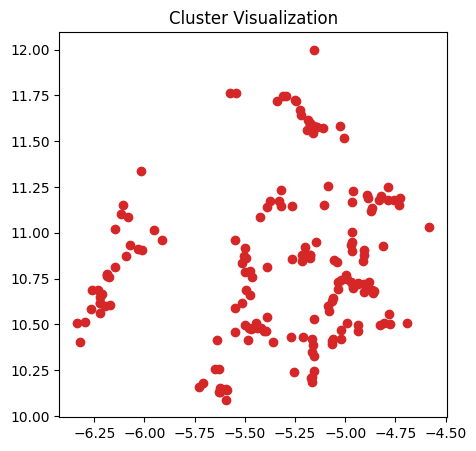

178
15943 "pgen"
24059 " Almost"
24081 " patron"
26010 " Protocol"
26417 " Nar"
26492 " methanol"
26950 "cnt"
27464 " Revenue"
27730 "olerance"
27882 " backbone"
28047 "apps"
28340 " Pra"
28355 "1966"
28575 "packet"
28583 "ousse"
28605 "HY"
28657 "orems"
28810 " Born"
28914 "ร"
28930 " reservation"
28942 " transduction"
28964 "ipes"
29127 " testosterone"
29132 " Rus"
29189 " influencing"
29192 " celebrity"
29257 " inex"
29330 "Touch"
29344 "nsic"
29383 " minerals"
29420 "uchy"
29456 "Ka"
29464 " Tea"
29473 "Henry"
29486 "polit"
29518 " undergone"
29522 " relieve"
29540 " sank"
29542 "ocaust"
29553 " marvel"
29598 " א"
29663 " Lad"
29675 "omorphisms"
29691 " centrifugation"
29709 " breakthrough"
29735 "vine"
29764 "Pet"
29767 " bapt"
29823 "Matt"
29836 "conviction"
29854 " durch"
29871 "pod"
29872 "Dictionary"
29888 "hardt"
29893 " erect"
29910 " counc"
29916 "Carl"
29918 "发"
29925 "":["
29949 " 299"
29994 " multiplicity"
30004 "間"
30046 " abruptly"
30065 " Celt"
30090 "umen"
30102 " tr

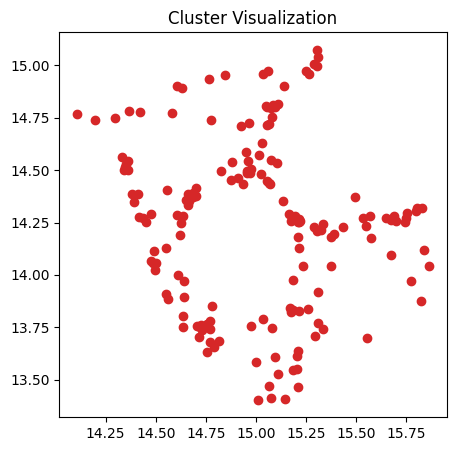

170
8268 " exceed"
9625 " --------------------------------"
10269 " bin"
10283 " Si"
11239 " Thank"
11414 " Gall"
11473 "り"
11643 " Harry"
11720 " jet"
11754 " Patent"
11763 "ijerph"
11880 " ages"
12251 " """"
12261 "TP"
12274 " flour"
12324 " Ter"
12458 "ة"
12467 "command"
12472 " 116"
12494 " paragraph"
12559 "ар"
12622 " Indust"
12984 "�"
13072 " declined"
13079 " hopes"
13128 "ões"
13131 " infant"
13264 "Task"
13327 " abdom"
13349 "Pres"
13430 " MAP"
13435 "1990"
13436 "plates"
13439 " progressive"
13449 "boot"
13505 "zes"
13679 " cul"
13742 " fate"
13757 " optimization"
13834 "Av"
13853 "acles"
13892 " mim"
13912 "*="
13932 "uple"
13934 "pair"
13938 " "#"
13979 "ouri"
13981 "orient"
14016 "く"
14061 "wait"
14090 "Names"
14095 "plot"
14099 " consciousness"
14116 " suspended"
14121 " liv"
14137 " drives"
14156 " generator"
14157 ">::"
14172 " march"
14178 "Dist"
14186 " dressed"
14190 " reaches"
14215 " coronary"
14218 " peer"
14219 "<!--"
14230 " closure"
14259 " similarity"
14272 "

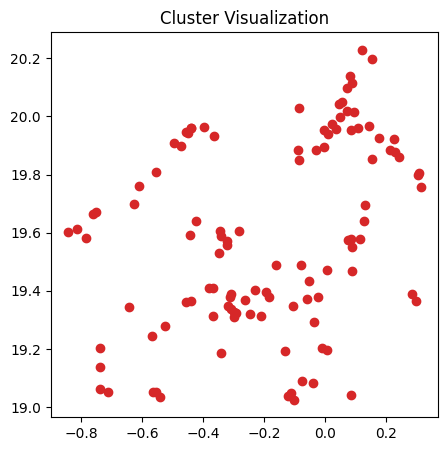

111
19078 "initial"
19094 " deficit"
19801 " tablet"
19900 " IE"
20583 "tm"
20953 " toy"
21580 "ailand"
21698 " anthrop"
21957 " benz"
21975 " Alb"
22014 " frustration"
22210 "fed"
22251 " buyers"
22307 "RP"
22326 " volatile"
22359 "365"
22368 " Mission"
22419 " GH"
22452 "console"
22544 " dull"
22600 "Spring"
22604 "dale"
22648 "Texture"
22657 " firearm"
22665 "precedented"
22689 " Perm"
22723 " Sean"
22732 "might"
22748 " NaCl"
22754 " harbor"
22760 " �"
22766 " heterogeneous"
22774 " prints"
22808 " Liverpool"
22823 "AIL"
22837 " uter"
22849 " meantime"
22878 " beast"
22894 " buyer"
22897 "ACS"
22904 "Transform"
22905 "bey"
22930 "Hen"
22936 " spectacular"
22943 " ante"
22947 "oct"
22995 " aboard"
23012 " SPE"
23024 " airway"
23027 " enthusiasm"
23034 " todos"
23043 " dynamically"
23058 "hentication"
23066 " newborn"
23071 " sharply"
23087 " angel"
23101 "เ�"
23110 "hart"
23115 " modeled"
23136 " tan"
23139 "370"
23165 " phylogenetic"
23174 " Thailand"
23198 " mentally"
23202 " Stei

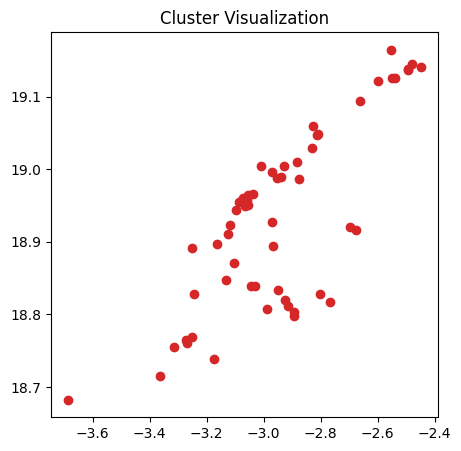

56
3891 " (\["
7748 "(\["
21791 " sor"
23897 "glut"
24050 " miser"
24130 "ej"
24155 " congen"
24175 "uparrow"
24236 "visory"
24266 " persist"
24367 " Sor"
24383 " shells"
24429 " Mol"
24483 "usage"
24506 "plasia"
24507 "buck"
24517 " Urban"
24518 " Reed"
24527 " Label"
24536 " curiosity"
24542 " credible"
24557 "facebook"
24559 "edi"
24564 "AW"
24575 "Publ"
24586 " understands"
24594 "feature"
24605 " Cuba"
24622 " fractional"
24638 "^*\"
24640 " Valent"
24643 "hora"
24648 " conflicting"
24670 "cluster"
24674 "ematic"
24679 " orbits"
24685 " operative"
24688 " Kol"
24692 " calories"
24711 "Mi"
24719 " atheros"
24720 " GPU"
24741 " willingness"
24752 " Sid"
24770 " Ferr"
24774 "Bal"
24791 " salmon"
24809 "icidal"
24835 " companions"
24892 " immob"
24893 "第"
24899 "多"
24906 "WITH"
25004 "uning"
25298 " Pierre"
27114 ".(\["


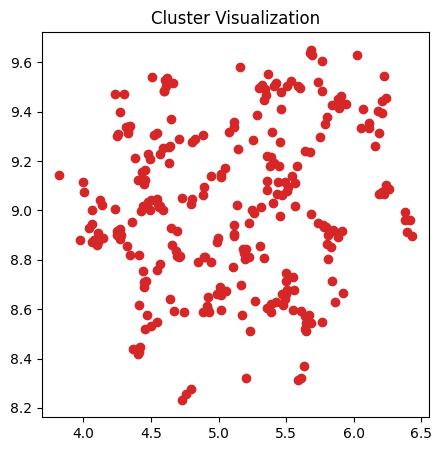

271
8215 " EU"
9109 " Journal"
9145 " centre"
9881 " fingers"
10506 ".$"
12611 " preliminary"
12754 " enthus"
15336 " bathroom"
15522 "NULL"
15631 " inflation"
15926 " wings"
16268 " salary"
16446 "$;"
16577 "IED"
18630 " Animal"
19468 " quark"
20796 " oun"
21321 "++++"
21521 " Ruby"
22206 "τικ"
22335 " technically"
23679 " mour"
23754 " haem"
24705 " semantic"
25397 "fluid"
26389 " overweight"
27346 "Male"
28153 " deterioration"
28503 "}}\,"
31888 " bounce"
33444 " consulted"
33896 " LH"
34179 "制"
34438 "Park"
34442 " Gam"
34466 "reliminary"
34488 ").$"
34646 " Than"
34709 " cleanup"
34954 "$="
35082 "Looks"
35257 " �"
35398 " regain"
35608 " quarks"
35662 " Claud"
35707 "concat"
35717 " sexes"
36012 " graz"
36321 "                                                                 "
36412 "antha"
36451 "templates"
36524 "Bag"
37043 "uish"
37111 " mouths"
37162 " diameters"
37273 "mspace"
37333 "pike"
37368 " Pursuant"
37375 " Pretty"
37393 "voir"
37592 " proclaimed"
37637 " fleeing"
376

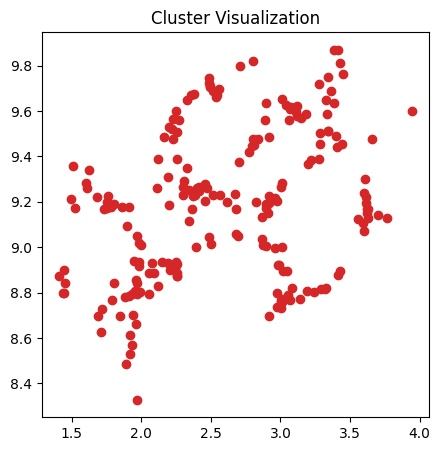

210
1085 "                                                                "
2739 " food"
5144 "                     "
5262 " spent"
6947 " spend"
8523 " initially"
9238 " neutral"
9462 " Canadian"
11431 " Food"
19480 "food"
22044 "到"
22070 "ceiver"
22634 " vibration"
22735 " spacing"
23193 " holidays"
23782 " React"
23913 "                                                       "
24027 " dignity"
25034 " armor"
26268 "Chain"
26294 " entanglement"
26462 " magistrate"
27125 " beats"
27840 " RN"
28253 "Plot"
28696 "FFIRMED"
28770 " wonders"
30315 " эт"
30697 "CY"
30802 "Rew"
30885 " spends"
31270 " Kenneth"
31478 "Canadian"
31641 " Rib"
31865 " elephant"
32204 " CHAPTER"
32276 " sout"
32380 " broadcasting"
32400 "WKH"
32666 "]/"
32693 "xiv"
32816 "absolute"
32928 "hearted"
32948 "computer"
32967 " Adult"
32986 " furious"
33052 " keV"
33096 " bucks"
33262 " demons"
33286 "onian"
33384 " irrational"
33385 "software"
33415 " nitro"
33506 " ROM"
33587 " stalk"
33591 " Cyber"
33608 "896"
33667 

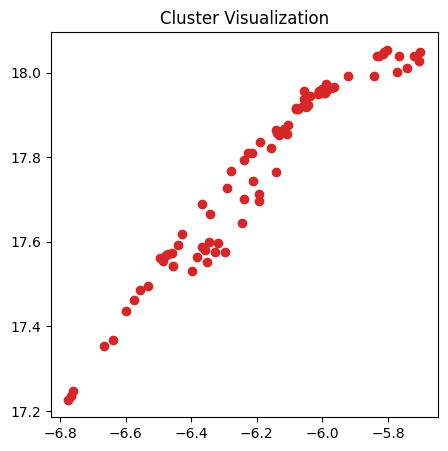

79
12049 "ocolate"
13082 " emerged"
14354 " chocolate"
22751 " CAR"
23056 "arcelona"
24639 " Barcelona"
24662 " fights"
24758 " TN"
24811 " locks"
25089 "ран"
25094 "moment"
25401 "pancy"
25424 "Ign"
25462 "istered"
25484 " ISIS"
25490 "TIM"
25495 " inclusive"
25503 " TIM"
25592 "389"
25595 "CAR"
25603 "Driver"
25635 " Ruth"
25665 " discarded"
25668 " anesthesia"
25670 "506"
25672 " humidity"
25697 "TN"
25711 " arguably"
25731 ":@""
25739 "follow"
25744 " exemption"
25747 " dwarf"
25768 " pess"
25771 " Norwegian"
25773 " Changes"
25784 " tubular"
25785 "itively"
25787 " autoimmune"
25793 " incarcer"
25801 " congest"
25812 " bicycle"
25821 "Comments"
25824 " unwanted"
25827 "CSF"
25839 "olate"
25847 " Fro"
25858 "vie"
25882 " stent"
25894 " lethal"
25896 " ];"
25915 "rington"
25930 " inequalities"
25932 "launchpad"
25933 "eri"
25934 " KO"
25938 " ancestors"
25939 " Angl"
25951 " Esp"
25958 " Bak"
25959 "644"
25964 "objects"
25965 " masks"
25974 "transition"
25980 "okin"
26019 " fixes"
2

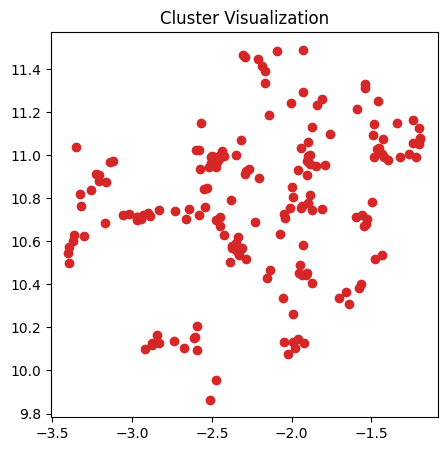

177
24183 " magnific"
24303 ",\\"
25799 " constructive"
26515 "umped"
27348 "311"
27722 " misc"
27879 "Pac"
28635 " acquiring"
28728 " analges"
29229 "ithmic"
29667 "317"
29755 "upiter"
29757 " smoked"
30180 "ïve"
30184 "А"
30234 " Entry"
30238 "measure"
30453 " drawbacks"
30455 " questionable"
30469 "ostat"
30558 "egan"
30645 " pelo"
30648 " analyse"
30682 "RH"
30689 " css"
30691 "ambled"
30703 "highlight"
30732 " unused"
30764 "WORK"
30807 " muttered"
30879 "rimination"
30880 "Features"
30915 "CTYPE"
30921 " Photos"
30936 "Cmd"
30955 " elucidate"
30958 " Rena"
30959 " mailing"
30994 "Nodes"
31004 " 317"
31008 "μέ"
31009 " sickness"
31012 " hype"
31026 " Glenn"
31031 "sufficient"
31034 "HQ"
31046 " eukary"
31053 "].)"
31055 "690"
31056 " hardest"
31064 "curl"
31081 "ว"
31121 " Mong"
31133 " 327"
31134 "bishop"
31177 "Supreme"
31193 "}~"
31236 " triglycer"
31299 "kinson"
31314 " plung"
31317 " clicks"
31336 " Sara"
31341 " prerequ"
31345 " lumbar"
31386 " nh"
31387 "oter"
31391 " thirs

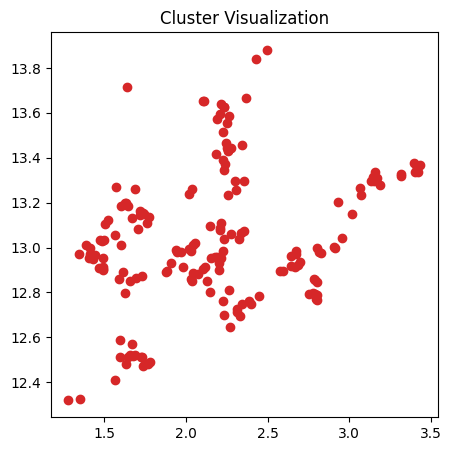

176
4536 " sometimes"
13746 " flavor"
17444 "GD"
17942 " resort"
18518 "outheast"
19553 " retrieve"
19667 "encer"
20194 " ellipt"
20501 " questioning"
20927 "idency"
21746 " fixation"
22805 "\}$,"
22879 " negligible"
23013 " sham"
24239 "YES"
25188 " worden"
28687 " questionnaires"
28860 " bothered"
31313 " graduation"
31800 " slammed"
32031 "Chen"
32418 " Dry"
32422 " fidelity"
32438 " boson"
32446 "quist"
32532 "oracle"
32535 " traction"
32587 " phyt"
32694 " NaN"
32739 " urea"
32763 "planes"
32791 " ocular"
32805 "evol"
32811 " worthwhile"
32823 " DEC"
32892 "riad"
32939 " orally"
32957 " embro"
32970 " fingerprint"
32979 " menos"
32982 " Ci"
33001 " Angular"
33014 "igi"
33043 " covenant"
33046 " grinding"
33048 " distinctly"
33064 " inhal"
33068 "iba"
33078 " nad"
33086 "Except"
33104 "�"
33126 "jn"
33142 " Invalid"
33155 " apex"
33169 " CCD"
33170 " automotive"
33183 " contours"
33190 " (#"
33194 "wartz"
33195 "angled"
33206 " WHETHER"
33209 " kt"
33219 " KNOW"
33233 "adh"
33257 "

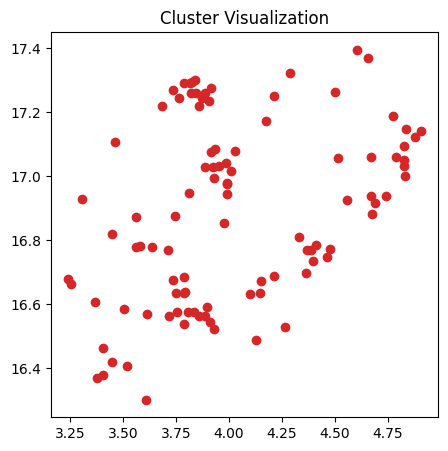

99
7244 " arrived"
9830 " colors"
12666 " arrive"
12753 "Num"
12867 " Foot"
13469 " eliminate"
14480 " merc"
15448 " morphology"
15552 " Prop"
16126 "makers"
16198 "156"
17153 " allele"
17397 "ogonal"
17527 " eliminated"
17776 " specification"
18498 "lications"
18507 "Matrix"
18572 " scrap"
18718 " Senator"
18762 "isol"
19000 "RD"
19147 " abnormalities"
19189 "Brit"
19238 "Delete"
19301 " kicked"
19439 " discharged"
19551 "่"
19613 "ogg"
19779 " swift"
19789 " metabolites"
19819 ""
19848 " abused"
19863 " Recent"
19883 " touching"
19886 " redund"
19891 "rolling"
19896 " Brow"
19904 " PARTIC"
19927 "να"
19936 " citing"
19962 " Swiss"
20316 " Environmental"
20363 "emeter"
20398 " disreg"
20488 " вы"
20541 " footage"
20547 "~."
20564 " Alternatively"
20592 "iko"
20595 "astically"
20629 " [$\"
20648 " vom"
20677 "umab"
20744 ";\;\"
20789 "emos"
20836 "elian"
20848 " volunteer"
20888 "ahoo"
20923 " Stanley"
20946 " successive"
20964 "Furthermore"
20994 " switches"
21030 "ить"
21046 " Num"


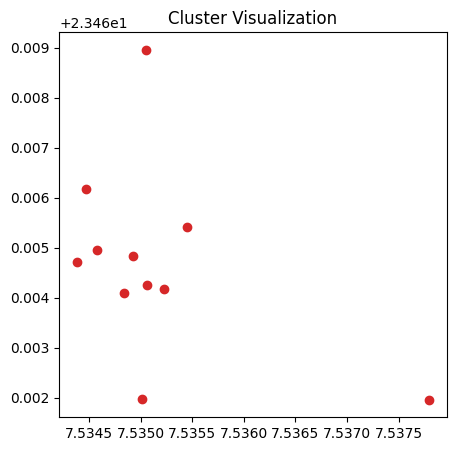

11
4022 " 2016"
4240 " 2017"
4765 " 2018"
6247 " 2019"
6961 "2016"
7132 "2017"
7798 "2018"
9638 "2019"
10428 "-------------"
10521 "--------------"
11311 "---------------"


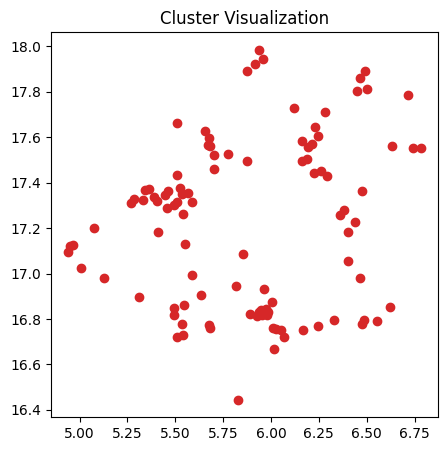

103
3488 " poly"
4156 " global"
6271 " --------"
6557 " ------------"
6630 " survey"
6728 " liver"
10415 "avelength"
11225 " wavelength"
12845 " utilized"
13039 " Lear"
13048 " inches"
13798 " Prom"
14231 "144"
14623 " baseball"
15253 "JS"
15369 " -------------"
15482 " pent"
15634 " Hub"
15882 "157"
16040 " Price"
16278 "riched"
16584 " utilize"
16607 "146"
16731 " [$"
16935 "jamin"
17126 "Ben"
17220 "159"
17306 "187"
17364 "142"
17375 " weighted"
17547 "Operation"
17611 " disclose"
17615 "301"
17617 " utilizing"
17687 " Liver"
17726 "195"
17748 " Dir"
17751 " ranged"
17761 "uez"
17782 "bie"
17826 " Iron"
17843 " liberty"
17847 " impressed"
17885 " Douglas"
17898 " vocal"
17945 "tl"
17956 " Iss"
18036 "OFF"
18094 "CU"
18131 " dign"
18169 "LIB"
18193 " Default"
18282 " ank"
18313 "anean"
18355 "VP"
18371 " Poly"
18372 "poly"
18395 " popularity"
18544 " Cow"
18550 "505"
18574 ".'""
18586 " "","
18601 "VR"
18651 " об"
18766 " inadequate"
18800 "DEF"
18836 " 144"
18889 " ole"
18923 "cause

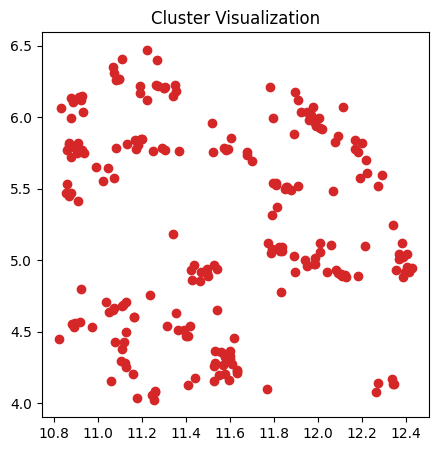

224
9443 " &\"
10083 "duction"
10346 " migration"
10504 "Phone"
10797 " Engine"
11510 "prod"
12063 ",$"
12601 " Plaintiffs"
12874 " CPU"
13811 "[**"
14293 "lag"
14666 " crystall"
14675 "inement"
14764 "accept"
15085 "igin"
15891 " gi"
34608 "USY"
34847 "gesterone"
34975 " rewarding"
35843 " Battalion"
36208 "854"
37634 " todas"
37643 " immer"
37679 "�"
38469 "isenberg"
38672 "�"
39016 " nar"
39117 " Thy"
39198 "ainen"
39277 "gerald"
39336 "feel"
39337 "osto"
39659 " endl"
39660 "isty"
39679 "IFN"
39702 "vell"
39723 " inflicted"
39749 " Athletic"
39840 "875"
39883 " pounding"
39929 "été"
40003 " Dayton"
40097 "WIDTH"
40113 "opian"
40132 " unfolding"
40141 " arb"
40149 " reasonableness"
40182 "urized"
40207 "EXP"
40259 " finer"
40272 " deleter"
40296 " semic"
40305 "zhou"
40343 " DLL"
40372 " ferv"
40374 " DEBUG"
40381 " Lots"
40382 "birds"
40395 " kinemat"
40410 "irez"
40413 "Ðº"
40520 " 516"
40545 "listing"
40571 " Biosciences"
40600 "decre"
40607 " Cochrane"
40614 "Ubuntu"
40639 " ome

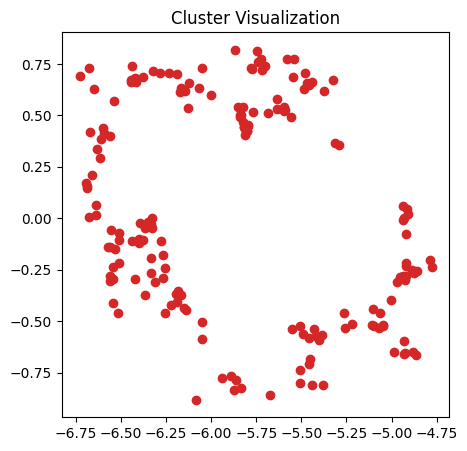

178
625 " more"
673 " time"
1294 " Pro"
1797 "21"
1819 "о�"
1847 " Pl"
1879 " Fr"
1885 " product"
2064 " That"
2091 " When"
2238 " kind"
2299 " however"
2357 "77"
2391 "...."
2409 "ception"
2460 " image"
2467 "а�"
2473 "atory"
2489 " become"
2588 " Gen"
2640 "02"
2642 " dri"
2700 "www"
2701 " limit"
2740 " break"
2764 "umber"
2815 "lim"
2822 " near"
2837 " demonstr"
2870 " ste"
2893 "ternal"
2936 " ur"
2940 " walk"
2958 " publ"
2960 "ada"
2967 "rs"
2984 " immun"
2993 "She"
3015 " §"
3020 "wise"
3056 "oms"
3060 " Europe"
3066 " via"
3089 " chall"
3092 " introdu"
3100 "ocal"
3104 " lines"
3108 " influ"
3114 " community"
3117 ")}"
3118 "comp"
3128 " party"
3131 "ocr"
3153 " live"
3159 " word"
3182 "define"
3192 " taking"
3193 "�"
3197 "used"
3201 "urch"
3206 " involved"
3213 " step"
3217 "comes"
3223 "stant"
3226 " girl"
3229 "des"
3230 "ana"
3234 "________"
3236 " original"
3249 " comes"
3254 "ites"
3255 "...""
3271 "OL"
3275 " production"
3279 " ±"
3288 "oo"
3295 " color"
3298 "arr"
330

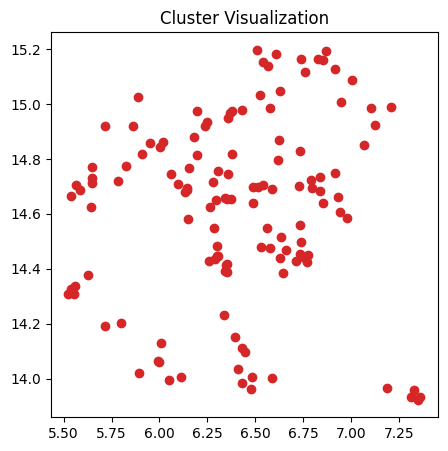

130
2882 " consist"
4931 " perhaps"
8338 " explore"
8414 " consists"
9402 " tube"
10562 " beer"
11243 " Perhaps"
11253 " consisting"
12747 "elfare"
13732 " processor"
14000 " adjustment"
14278 " consisted"
14554 " Mu"
14859 " explored"
15023 " Small"
15054 "155"
15243 "}}="
15519 " welfare"
15617 "both"
15699 " Overall"
15781 "204"
15813 " slip"
15832 " innovation"
15894 " Square"
15907 "177"
15984 " Ti"
16131 "atherine"
16184 " lact"
16258 " albums"
16290 " sentenced"
16349 " Modern"
16374 "large"
16382 " meets"
16408 "AU"
16439 " gli"
16450 "generate"
16511 " temple"
16514 "holding"
16534 "could"
16599 "cross"
16606 "ete"
16612 " lobby"
16618 " immigrants"
16622 "\#"
16639 " Ty"
16648 " 1969"
16694 " innovative"
16728 " fetal"
16768 "UES"
16769 " μM"
16773 " rape"
16796 "Aust"
16797 " fier"
16813 "leen"
16819 " bass"
16829 "except"
16830 "Perhaps"
16879 " fantasy"
16894 "controlled"
16895 "plugin"
16909 " mystery"
16914 " thou"
16917 " transcripts"
16919 " ö"
16929 "Space"
16933 " co

In [ ]:
# cluster_labels = clusters.labels
for i in range(n_clusters):

    # Replace 'cluster_number' with the specific cluster number you want to examine
    cluster_number = i

    # Find the indices of data points in the specified cluster
    cluster_indices = [i for i, label in enumerate(clusters) if label == cluster_number]

    # Extract the embeddings that belong to the specified cluster
    cluster_embeddings = reduced_data[cluster_indices]  # Replace 'your_embeddings' with your data
    cluster_colors = clusters[cluster_indices]
    # cluster_colors[-1] = 0
    # print(cluster_colors)

    # Now 'cluster_embeddings' contains the data points belonging to the specified cluster

    plt.figure(figsize=(5,5))
    plt.scatter(cluster_embeddings[:, 1], cluster_embeddings[:, 0], c="C3")
    plt.title('Cluster Visualization')
    plt.show()

    print(len(cluster_indices))
    for index in cluster_indices:
        print(index, f"\"{tokenizer.decode(index)}\"")

## Manual Clustering

In [6]:
from transformers import AutoTokenizer
tokenizer = AutoTokenizer.from_pretrained('EleutherAI/gpt-neox-20b')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/457k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/90.0 [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [7]:
all_vocab = tokenizer.batch_decode(range(len(tokenizer)))

In [19]:
print([word for word in all_vocab if 'sun' in word.lower()])

[' Sun', ' sun', ' Sunday', 'sun', 'Sun', ' Samsung', ' misunder', ' sunlight', 'Sunday', ' Sund', ' sung', ' sunny', ' sunset', ' sunshine', ' sunk', ' misunderstanding', ' SUN', ' sunt', ' Sunni', ' Sundays', ' misunderstood', ' Sunny', 'sunami']


In [25]:
days_of_the_week = [
' Fri',
' Friday',
'Fri',
'Friday',
' Mon',
' Monday',
'Mon',
'Monday',
' Sat',
' Saturday',
'Sat',
'Saturday',
' Sun',
' Sunday',
'Sun',
'Sunday',
' Thu',
' Thur',
' Thursday',
'Thu',
'Thursday',
' Tue',
' Tuesday',
'Tue',
'Tuesday',
' Wed',
' Wednesday',
'Wed',
'Wednesday',
 ]

In [28]:
def get_heatmap_for_word_list(word_list, tokenizer, embedding_weights):
  token_id_list = []
  for word in word_list:
    token_ids = tokenizer.encode(word)
    assert len(token_ids) == 1 # You only want to consider words with 1 token
    token_id_list.append(token_ids[0])


get_heatmap_for_word_list(days_of_the_week, tokenizer, embedding_weights)

[30867]
[6794]
[33228]
[25897]
[4200]
[7216]
[9304]
[26788]
[11191]
[7814]
[20794]
[28007]
[4146]
[6926]
[14594]
[27180]
[38792]
[39623]
[8216]
[44644]
[28549]
[40915]
[7948]
[50110]
[28266]
[7213]
[8330]
[21091]
[28781]


## Linear Probe